## BFS Capstone Project

CredX is a leading credit card provider that gets thousands of credit card applications every year. But in the past few years, it has experienced an increase in credit loss. The CEO believes that the best strategy to mitigate credit risk is to ‘acquire the right customers’. 

In this project, our task is to help CredX identify the right customers using predictive models. Using past data of the bank’s applicants, we need to determine the factors affecting credit risk, create strategies to mitigate the acquisition risk and assess the financial benefit of your project.


## Data Understanding

There are two data sets in this project: demographic and credit bureau data.  

- Demographic/application data: This is obtained from the information provided by the applicants at the time of credit card application. It contains customer-level information on age, gender, income, marital status, etc.

- Credit bureau: This is taken from the credit bureau and contains variables such as 'number of times 30 DPD or worse in last 3/6/12 months', 'outstanding balance', 'number of trades', etc.

Both files contain a performance tag, which indicates whether the applicant has gone 90 days past due (DPD) or worse in the past 12 months (i.e. defaulted) after getting a credit card.

In some cases, it is observed that all the variables in the credit bureau data are zero and credit card utilisation is missing. These represent cases in which there is a no-hit in the credit bureau. The cases with missing credit card utilisation are also observed. These are the cases in which the applicant does not have any other credit card.

## Approach Taken While taking doing assignment.

Approach to be written here, at last

- 1.) Inspecting the Demographic Data
- 2.) EDA DEMOGRAPHIC
- - 2.A) EDA DEMOGRAPHIC - CATEGORICAL VARIABLES
- - 2.B) EDA DEMOGRAPHIC - CONTINUOUS VARIABLES
- 3.) WoE and IV Analysis for Demographics Data
- 4.) Inspecting the Credit Bureau Data
- 5.) EDA CREIT Bureau Data
- 6.) WOE AND IV ANALYSIS OF Credit Bureau Data
- 7.) Merging the the data of demographics and CreditBureau
- 8.) Model Building
- - 8.1.) Models Building for Demographic Data (Non-transformed)
- - - 8.1.A.) Logistic Regression Model
- - - 8.1.B.) Decision Tree Model
- - - 8.1.C.) Random Forest Model
- - 8.2.) Building Model with WOE Transformed Data ( Demographic)
- - - 8.2.A.) Logistic Regression Model
- - - 8.2.B.) Decision Tree Model
- - - 8.2.C.) Random Forest Model
- - 8.3.) Models Building for Combined(Demographic and Credit Bureau) (Non-transformed)
- - - 8.3.A.) Logistic Regression Model
- - - 8.3.B.) Decision Tree Model
- - - 8.3.C.) Random Forst Model
- - 8.4.) Models Building for Combined(Demographic and Credit Bureau) WoE Data
- - - 8.4.A.) Logistic Regression Model
- - - 8.4.B.) Decision Tree Model
- - - 8.4.C.) Random Forest Model
- 9.) Model Evaluation
- 10.) Application Scorecard
- 11.) Benefits of our ML model
- 12.) Evaluating Financial Risk of our Model


In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [3]:
##  setting parameters for appropriate display of results
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1)  # or 199

## 1.) Inspecting Demographic Data

In [4]:
## reading Demographic data
demographics = pd.read_csv("Demographic data.csv",sep=",")
demographics.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [5]:
## inspecting the columns, shapes and data types for demographic data
print(demographics.columns)

Index(['Application ID', 'Age', 'Gender',
       'Marital Status (at the time of application)', 'No of dependents',
       'Income', 'Education', 'Profession ', 'Type of residence',
       'No of months in current residence', 'No of months in current company',
       'Performance Tag'],
      dtype='object')


In [6]:
print(demographics.dtypes)

Application ID                                 int64  
Age                                            int64  
Gender                                         object 
Marital Status (at the time of application)    object 
No of dependents                               float64
Income                                         float64
Education                                      object 
Profession                                     object 
Type of residence                              object 
No of months in current residence              int64  
No of months in current company                int64  
Performance Tag                                float64
dtype: object


In [7]:
print(demographics.shape)

(71295, 12)


In [8]:
# Renaming columns for the ease of use
demographics.columns= ['App_Id', 'Age', 'Gender', 'Marital_Status', 'Dependents_No', 'Income', 'Education', 'Profession', 
                       'Residence_Type','Months_Current_Residence', 'Months_Current_Company','Performance_Tag']
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [9]:
## checking info for demographic data
demographics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 12 columns):
App_Id                      71295 non-null int64
Age                         71295 non-null int64
Gender                      71293 non-null object
Marital_Status              71289 non-null object
Dependents_No               71292 non-null float64
Income                      71295 non-null float64
Education                   71176 non-null object
Profession                  71281 non-null object
Residence_Type              71287 non-null object
Months_Current_Residence    71295 non-null int64
Months_Current_Company      71295 non-null int64
Performance_Tag             69870 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.5+ MB


In [10]:
## cheking for null values
demographics.isnull().sum()

App_Id                      0   
Age                         0   
Gender                      2   
Marital_Status              6   
Dependents_No               3   
Income                      0   
Education                   119 
Profession                  14  
Residence_Type              8   
Months_Current_Residence    0   
Months_Current_Company      0   
Performance_Tag             1425
dtype: int64

In [11]:
## Checking for Duplicates
## checking number of unique entries across each variable
demographics.nunique()

App_Id                      71292
Age                         53   
Gender                      2    
Marital_Status              2    
Dependents_No               5    
Income                      63   
Education                   5    
Profession                  3    
Residence_Type              5    
Months_Current_Residence    121  
Months_Current_Company      83   
Performance_Tag             2    
dtype: int64

- Eccentric Results we found here, we see unique_id has 71292 unique values where it should have been 71295

In [12]:
## making a copy of the original dataset
demographics_original = pd.DataFrame(demographics).copy()

In [13]:
## Removing all the entries that have NULL performace tag, remving because these entries were never issues a credit cardt
demographics = demographics[~demographics.Performance_Tag.isnull()]
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [14]:
## seperating no impute dataset to be taken for WoE analysis
demographics_no_impute = pd.DataFrame(demographics).copy()

## extracting the null entries from the additional testing (rejected applications)
demographics_nulls = demographics_original[demographics_original.Performance_Tag.isnull()]

- We have 2 new datasets now 'demographics_no_impute' and 'demographics_nulls' which we would be using at the later part of the assignment

In [15]:
## checking the duplicate application ids 
ids = demographics.App_Id
duplicate_customers = demographics[ids.isin(ids[ids.duplicated()])]
duplicate_customers.sort_values(by='App_Id')

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
5243,653287861,26,M,Married,3.0,25.0,Bachelor,SAL,Rented,112,58,0.0
42637,653287861,40,M,Married,5.0,32.0,Phd,SE,Rented,45,46,1.0
48602,671989187,27,M,Married,2.0,35.0,Professional,SAL,Living with Parents,108,7,0.0
59022,671989187,57,M,Married,4.0,7.0,Professional,SE,Rented,42,3,0.0
24386,765011468,57,M,Single,4.0,4.5,Bachelor,SAL,Company provided,6,56,0.0
27586,765011468,38,M,Married,4.0,4.5,Professional,SAL,Rented,6,72,0.0


- We see we have 3 Duplicate App_Ids. Removing the entries which had duplicate copies as they appear to be from different customers

In [16]:
demographics = demographics[~demographics.App_Id.isin(duplicate_customers.App_Id)]
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [17]:
## describing demographic data
demographics.describe()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag
count,6.986400e+04,69864.000000,69861.000000,69864.000000,69864.000000,69864.000000,69864.000000
mean,4.992094e+08,44.995935,2.859492,27.409259,34.606550,34.198657,0.042182
std,2.885582e+08,9.929708,1.385566,15.475951,36.844678,20.349579,0.201006
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000
25%,2.485587e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000
50%,4.979556e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000
75%,7.498606e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


In [18]:
## correcting negative and below 18 age and setting it to 18. Assuming that minimum age for applying the credit card is 18
demographics.loc[demographics.Age<18,'Age'] = 18
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [19]:
## checking value counts across gender
demographics.Gender.value_counts()

M    53356
F    16506
Name: Gender, dtype: int64

In [20]:
## finding out the null entries in Gender
demographics.loc[demographics.Gender.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
39501,320437253,42,NaN,Married,5.0,4.5,Bachelor,SE_PROF,Rented,96,58,0.0
55578,862922520,18,NaN,Married,3.0,59.0,Bachelor,SE,Owned,6,48,0.0


In [21]:
## replacing the null entries for Gender with 'Male',
demographics["Gender"].fillna(demographics['Gender'].mode()[0], inplace = True) 

In [22]:
## checking value counts across Marital Status
demographics.Marital_Status.value_counts()

Married    59542
Single     10316
Name: Marital_Status, dtype: int64

In [23]:
## finding out the null entries in Marital status
demographics.loc[demographics.Marital_Status.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
6380,109442654,38,M,NaN,2.0,24.0,Professional,SAL,Company provided,117,3,0.0
35519,30223535,43,F,NaN,3.0,41.0,Masters,SE_PROF,Rented,6,12,0.0
48404,930789432,47,F,NaN,5.0,8.0,Masters,SAL,Owned,23,59,0.0
50734,822575718,35,M,NaN,4.0,20.0,Bachelor,SAL,Rented,59,20,0.0
59295,355703957,48,M,NaN,1.0,4.5,Bachelor,SAL,Owned,14,26,0.0
68043,852875477,18,M,NaN,1.0,5.0,Phd,NaN,Owned,14,31,0.0


In [24]:
## replacing the null entries for Marital_Status with "Married' as it is most common entry.
demographics["Marital_Status"].fillna(demographics['Marital_Status'].mode()[0], inplace = True) 
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [25]:
## checking value counts for Dependents 
demographics.Dependents_No.value_counts()

3.0    15644
1.0    15218
2.0    15127
4.0    11997
5.0    11875
Name: Dependents_No, dtype: int64

In [26]:
## checking null entries for Dependents_No
demographics.loc[demographics.Dependents_No.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
4674,317065974,44,F,Married,NaN,51.0,Masters,SE_PROF,Rented,14,32,0.0
43415,63303141,39,M,Married,NaN,12.0,Professional,SAL,Rented,91,9,0.0
69026,848965588,18,F,Married,NaN,59.0,Masters,SAL,Rented,35,13,0.0


In [27]:
## replacing the null entries with median
demographics.loc[demographics.Dependents_No.isnull(),'Dependents_No'] = demographics.Dependents_No.median()
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [28]:
## We also saw that there was negative income,which makes no sense
## hence imputing negative income with median value
demographics.Income[demographics.Income<0] =demographics.Income.median()

In [29]:
## checking value counts for Education
demographics.Education.value_counts()

Professional    24383
Masters         23481
Bachelor        17300
Phd             4463 
Others          119  
Name: Education, dtype: int64

In [30]:
## checking null entries for Education
demographics.loc[demographics.Education.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
739,999940936,24,F,Single,3.0,26.0,NaN,SE_PROF,Rented,84,57,0.0
1427,674752386,32,M,Married,1.0,36.0,NaN,SAL,Rented,105,38,0.0
1479,190736166,53,M,Married,5.0,47.0,NaN,SAL,Rented,85,98,0.0
1872,332358722,53,M,Married,5.0,20.0,NaN,SE_PROF,Owned,106,38,0.0
2360,548689730,44,M,Married,1.0,46.0,NaN,SE_PROF,Others,60,51,0.0
2662,620524626,41,M,Married,4.0,31.0,NaN,SE_PROF,Rented,103,57,0.0
4175,813805818,39,M,Married,5.0,46.0,NaN,SAL,Rented,101,30,0.0
4485,109186110,27,M,Single,2.0,33.0,NaN,SAL,Rented,111,7,0.0
4514,332253540,30,M,Married,3.0,46.0,NaN,SE,Rented,19,58,0.0
4610,412391976,35,M,Married,4.0,48.0,NaN,SE_PROF,Rented,94,58,0.0


In [31]:
## Since the null values are high.
## replacing the null entries for Education with value of 'UNKNOWN'
demographics.loc[demographics.Education.isnull(),'Education'] = 'UNKNOWN'
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [32]:
## checking values counts for Profession
demographics.Profession.value_counts()

SAL        39670
SE_PROF    16256
SE         13925
Name: Profession, dtype: int64

In [33]:
## checking null values for Profession
demographics.loc[demographics.Profession.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
1692,460857714,38,M,Married,2.0,32.0,Professional,NaN,Rented,99,4,0.0
23660,711788269,51,M,Married,4.0,48.0,Masters,NaN,Rented,6,57,0.0
31898,55184158,55,M,Married,4.0,57.0,Bachelor,NaN,Rented,6,3,0.0
43274,874406194,38,F,Married,1.0,28.0,Masters,NaN,Rented,6,56,0.0
44126,337255510,32,M,Single,2.0,22.0,Professional,NaN,Rented,68,46,0.0
49199,702367685,53,M,Married,5.0,14.0,Masters,NaN,Rented,69,32,0.0
57857,911016009,53,M,Married,5.0,14.0,Phd,NaN,Rented,44,10,0.0
61807,660225915,45,M,Married,3.0,4.5,Professional,NaN,Owned,22,44,0.0
63995,320029807,46,M,Married,2.0,9.0,Others,NaN,Rented,6,33,0.0
64796,783073125,37,M,Married,5.0,0.0,Professional,NaN,Rented,30,19,0.0


In [34]:
## replacing the null entries with 'SAL' in Profession, as it is the most common entry
demographics["Profession"].fillna(demographics['Profession'].mode()[0], inplace = True) 
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [35]:
## checking value coiunts for Residence_Type
demographics.Residence_Type.value_counts()

Rented                 52276
Owned                  14003
Living with Parents    1777 
Company provided       1602 
Others                 198  
Name: Residence_Type, dtype: int64

In [36]:
## checking null entries for Residence_Type
demographics.loc[demographics.Residence_Type.isnull()]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
5,312196805,20,M,Married,1.0,39.0,Bachelor,SAL,NaN,116,52,0.0
7163,949545279,41,M,Married,3.0,49.0,Bachelor,SE_PROF,NaN,55,58,0.0
9436,773482230,50,M,Married,1.0,29.0,Professional,SAL,NaN,6,59,0.0
15600,238413192,52,M,Married,4.0,12.0,Masters,SE_PROF,NaN,6,35,0.0
44216,557711253,37,M,Married,3.0,44.0,Professional,SE,NaN,76,32,0.0
49432,558467626,30,M,Single,3.0,41.0,Bachelor,SE_PROF,NaN,89,16,0.0
51835,709227950,56,M,Married,1.0,42.0,Professional,SAL,NaN,6,52,0.0
60644,241741522,44,M,Married,1.0,10.0,Professional,SE,NaN,69,43,0.0


In [37]:
## replacing the null entries with 'Rented', as it is the most common entry.
demographics["Residence_Type"].fillna(demographics['Residence_Type'].mode()[0], inplace = True) 
demographics.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [38]:
## checking info
demographics.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69864 entries, 0 to 71294
Data columns (total 12 columns):
App_Id                      69864 non-null int64
Age                         69864 non-null int64
Gender                      69864 non-null object
Marital_Status              69864 non-null object
Dependents_No               69864 non-null float64
Income                      69864 non-null float64
Education                   69864 non-null object
Profession                  69864 non-null object
Residence_Type              69864 non-null object
Months_Current_Residence    69864 non-null int64
Months_Current_Company      69864 non-null int64
Performance_Tag             69864 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.9+ MB


In [39]:
## checking nulls across columns now
demographics.isnull().sum()

App_Id                      0
Age                         0
Gender                      0
Marital_Status              0
Dependents_No               0
Income                      0
Education                   0
Profession                  0
Residence_Type              0
Months_Current_Residence    0
Months_Current_Company      0
Performance_Tag             0
dtype: int64

- Looks like we have successfully dealt with all the NULL Values

In [40]:
## describing demographics dataset now
demographics.describe()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag
count,6.986400e+04,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000
mean,4.992094e+08,45.002276,2.859498,27.441143,34.606550,34.198657,0.042182
std,2.885582e+08,9.907562,1.385537,15.446719,36.844678,20.349579,0.201006
min,1.004500e+05,18.000000,1.000000,0.000000,6.000000,3.000000,0.000000
25%,2.485587e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000
50%,4.979556e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000
75%,7.498606e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


- Our data looks much better then it was before

# 2.) EDA - Demographic Data

In [41]:
#Creating a separate dataframe for EDA( Demographic Data)
eda_demographics = pd.DataFrame(demographics).copy()

In [42]:
# Performance_Tag value counts
eda_demographics['Performance_Tag'].value_counts()

0.0    66917
1.0    2947 
Name: Performance_Tag, dtype: int64

In [43]:
#Checking Default %
percent_defaulters = (eda_demographics.Performance_Tag.sum()/eda_demographics['Performance_Tag'].count())*100
percent_defaulters

4.218195350967594

In [44]:
## function to carry out univariate analyis on a categorical variable
def plot_categorical_data(df, variable):
    plt.figure(figsize=(20,15))
    
    plt.subplot(2, 2, 1)
    pie_df = pd.DataFrame(df[variable].value_counts())
    plt.title('Pie Plot for '+variable, fontsize = 15)
    plt.pie(pie_df[variable].values, labels = pie_df.index.values, autopct='%1.2f%%', shadow=False, startangle=30)
    plt.axis('equal')    
   
    count_prospects = df.groupby(variable)['Performance_Tag'].sum().reset_index(name = 'count_prospects')
    No_of_prospect = df.groupby(variable)['Performance_Tag'].count().reset_index(name = 'No_of_prospects')
    agg_No = count_prospects.merge(No_of_prospect, on = variable)
    agg_No['No_non_prospects'] = agg_No['No_of_prospects'] - agg_No['count_prospects']
    agg_No['Default_rate'] = 100*(agg_No['count_prospects']/agg_No['No_of_prospects']).round(4)     
        
    barWidth = 1
    plt.subplot(2, 2, 2)
    plt.title('Stacked Bar Plot for '+variable, fontsize = 15)
    plt.bar(agg_No.index, list(agg_No['No_non_prospects']), color='#7f6d5f', edgecolor='white', 
            width=barWidth, label='Non-defaulter')
    plt.bar(agg_No.index, list(agg_No['count_prospects']), bottom=list(agg_No['No_non_prospects']), color='#557f2d'
            , edgecolor='white', width=barWidth,label='Defaulter')   

    plt.xticks(agg_No.index, list(agg_No[variable]), fontweight='bold', fontsize = 15, rotation=90)
    plt.xlabel(variable, fontsize = 20)
    for i in agg_No.index:
        plt.text(x = i-0.25, y = agg_No['No_of_prospects'][i], s = agg_No['count_prospects'][i],fontsize=10)
        plt.text(x = i-0.5 , y = 1000, s = agg_No['No_non_prospects'][i],fontsize=10)
    plt.legend(loc='upper right', bbox_to_anchor=(1,1), ncol=1)
    
    plt.subplot(2, 2, 3)
    plt.title('Bar Plot for '+ variable, fontsize = 15)
    sns.barplot(x=variable, y='Default_rate', data=agg_No)
    
    plt.xticks(agg_No.index, list(agg_No[variable].astype('category')), fontweight='bold', fontsize = 15, rotation=90)
    plt.xlabel(variable, fontsize = 15)
    
    for i in agg_No.index:
        plt.text(x = i-0.25, y = 0.25, s = ''+str(agg_No['Default_rate'][i].round(3))+' %',fontsize=15)

    plt.show()
    return agg_No    

In [45]:
## function to carry out univariate analyis on a continuous variable
## and also create bins(qcut) for the variable so as to cross check with WoE data
def plot_continuous_num_data(df, variable):
    plt.figure(figsize=(30,5))
    
    plt.subplot(1, 3, 1)
    plt.title('Box plot for '+variable, fontweight='bold', fontsize = 15)
    sns.boxplot(y=variable, data=df)
    
    non_default_list = list(df[df.Performance_Tag == 0][variable])
    default_list = list(df[df.Performance_Tag == 1][variable])
    plt.subplot(1, 3, 2)
    plt.title('Stacked Histogram Plot for '+variable, fontweight='bold', fontsize = 15)
    plt.ylabel('count')
    plt.hist([non_default_list,default_list], stacked=True,edgecolor = 'black' , label=['Non-defaulter','Defaulter'])
    plt.legend(loc='upper right', bbox_to_anchor=(1,1), ncol=1)
    
    plt.subplot(1, 3, 3)
    plt.title('Stacked Distribution plot for '+variable, fontweight='bold', fontsize = 15)
    sns.distplot(df[variable],rug=True)
    plt.ylabel('frequency')
    plt.show()
    
    df[variable+'_bins'] = pd.qcut(df[variable], 8,duplicates = 'drop')

    return plot_categorical_data(df,variable+'_bins')


#### 2.A.) EDA  for categorical variables

In [46]:
## EDA for the Gender variable
eda_demographics.Gender.value_counts()

M    53358
F    16506
Name: Gender, dtype: int64

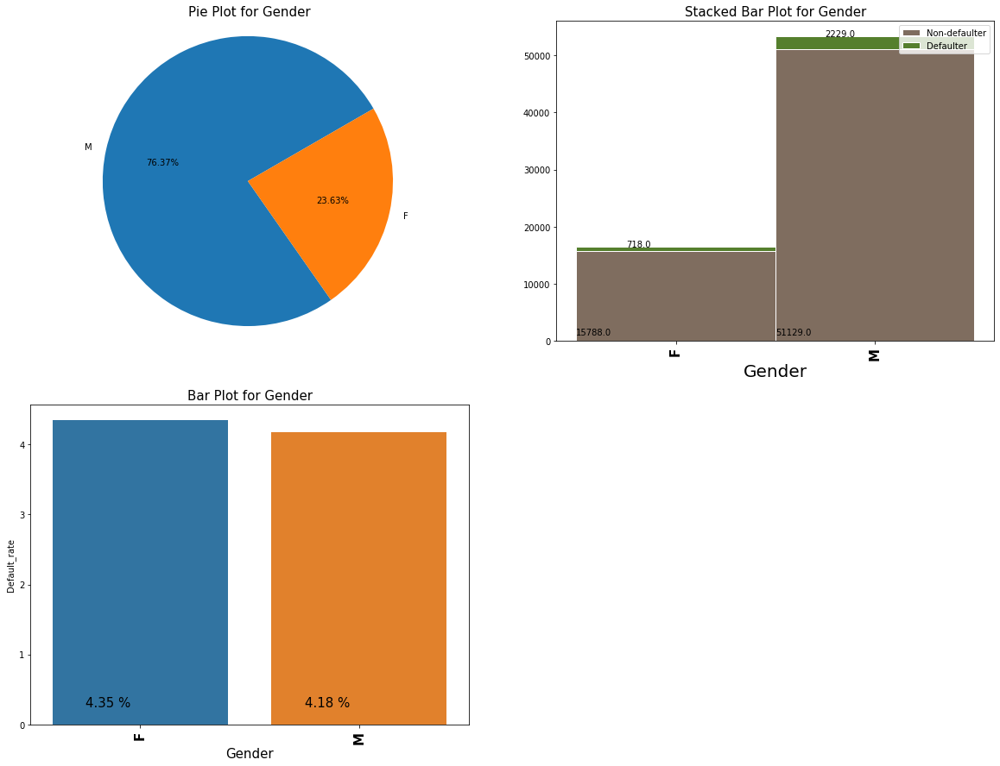

,Gender,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,F,718.0,16506,15788.0,4.35
1,M,2229.0,53358,51129.0,4.18


In [47]:
## univariate analysis for Gender
plot_categorical_data(eda_demographics, 'Gender')

- Here we see that we have 76% males in the dataset and nearly 24% females.
- We see that the default rate for female is slightly more than that of males, but the difference is not much to make any conclusions

In [48]:
## EDA for the Marital_Status variable
eda_demographics.Marital_Status.value_counts()

Married    59548
Single     10316
Name: Marital_Status, dtype: int64

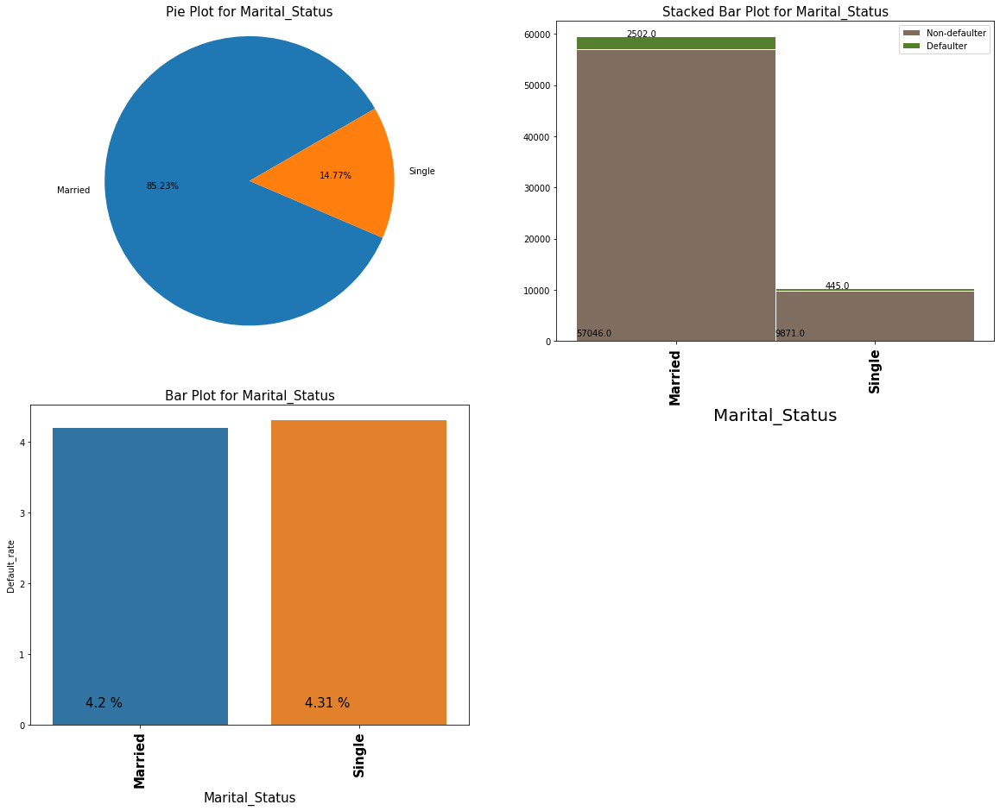

,Marital_Status,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Married,2502.0,59548,57046.0,4.20
1,Single,445.0,10316,9871.0,4.31


In [49]:
## univariate analysis for Marital_Status
plot_categorical_data(eda_demographics,'Marital_Status')

- we found that 85% people are married in the dataset, where as less then 15% people are single
- Also the default rate for both married and single are almost the same(4.2% and 4.31% respectively), hence it is not a strong predictor wheather the person would default or not

In [50]:
## EDA for the Education variable
eda_demographics.Education.value_counts()

Professional    24383
Masters         23481
Bachelor        17300
Phd             4463 
Others          119  
UNKNOWN         118  
Name: Education, dtype: int64

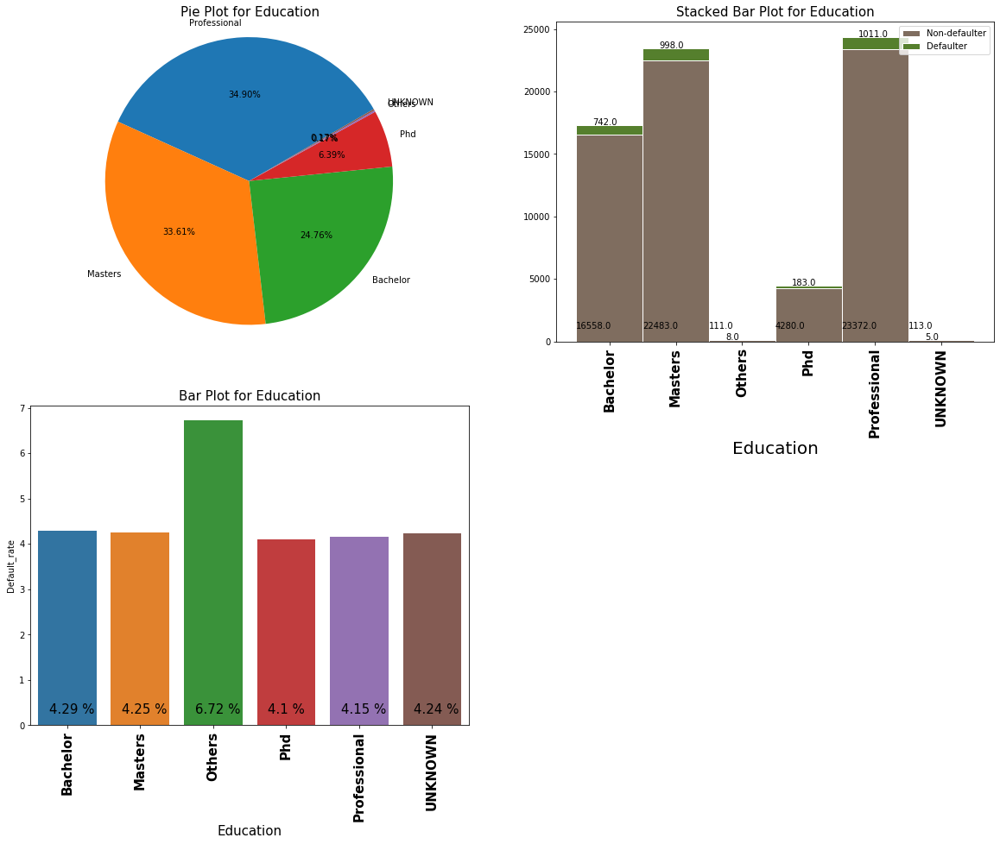

,Education,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Bachelor,742.0,17300,16558.0,4.29
1,Masters,998.0,23481,22483.0,4.25
2,Others,8.0,119,111.0,6.72
3,Phd,183.0,4463,4280.0,4.10
4,Professional,1011.0,24383,23372.0,4.15
5,UNKNOWN,5.0,118,113.0,4.24


In [51]:
## univariate analysis for Education
plot_categorical_data(eda_demographics,'Education')

- we see in Education people are highly divided into 'Professionals', 'Masters' and 'Bachelor'. There is also a slight population of people with Education as Others.

- We see the default rate overall remails constant across various Education types,except Others.

- with education as others we have relatively High default rate(6.72%) but the population comparitvely is very low.

In [52]:
## EDA for the Profession variable 
eda_demographics.Profession.value_counts()

SAL        39683
SE_PROF    16256
SE         13925
Name: Profession, dtype: int64

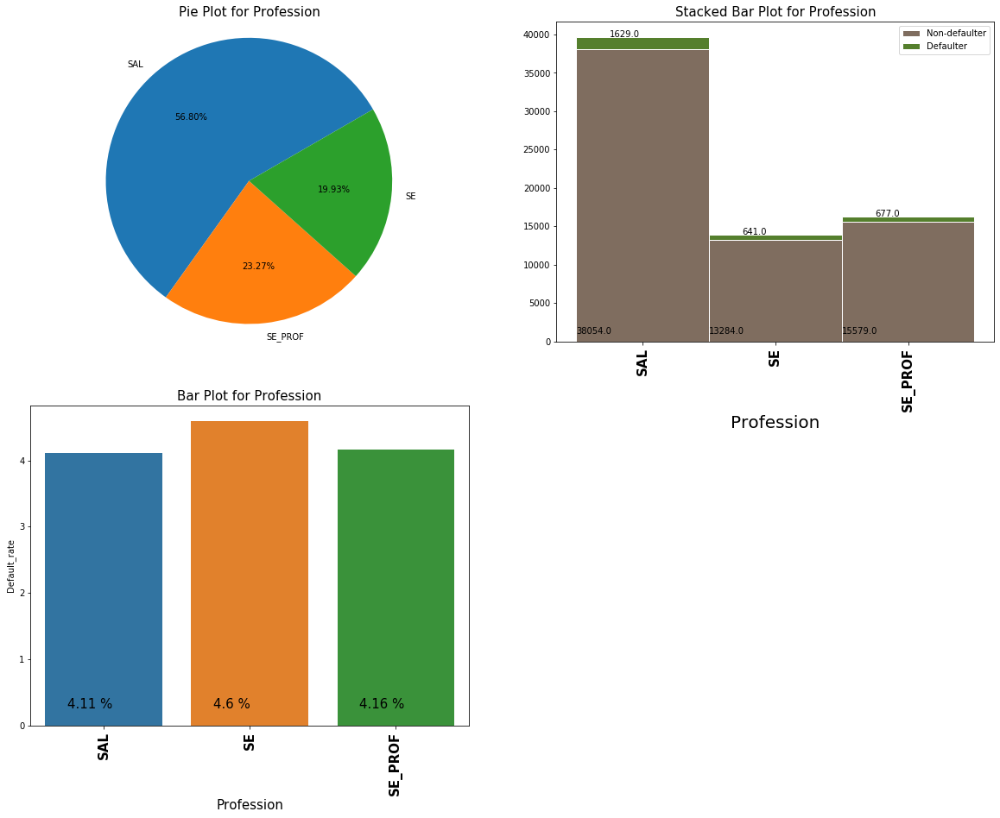

,Profession,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,SAL,1629.0,39683,38054.0,4.11
1,SE,641.0,13925,13284.0,4.60
2,SE_PROF,677.0,16256,15579.0,4.16


In [53]:
## univariate analysis for Profession
plot_categorical_data(eda_demographics,'Profession')

- We see that majority of the population is salaried(SAL) in profession, then self-emplopyed(SE) or self-employed professional(SE_Prof)
- For default rate it shows that the default rate is relatively more for the population with Profession as SE.This could maybe because of the uncertanity that comes with being self_employed(SE).

In [54]:
## EDA for the Residence_Type variable
eda_demographics.Residence_Type.value_counts()

Rented                 52284
Owned                  14003
Living with Parents    1777 
Company provided       1602 
Others                 198  
Name: Residence_Type, dtype: int64

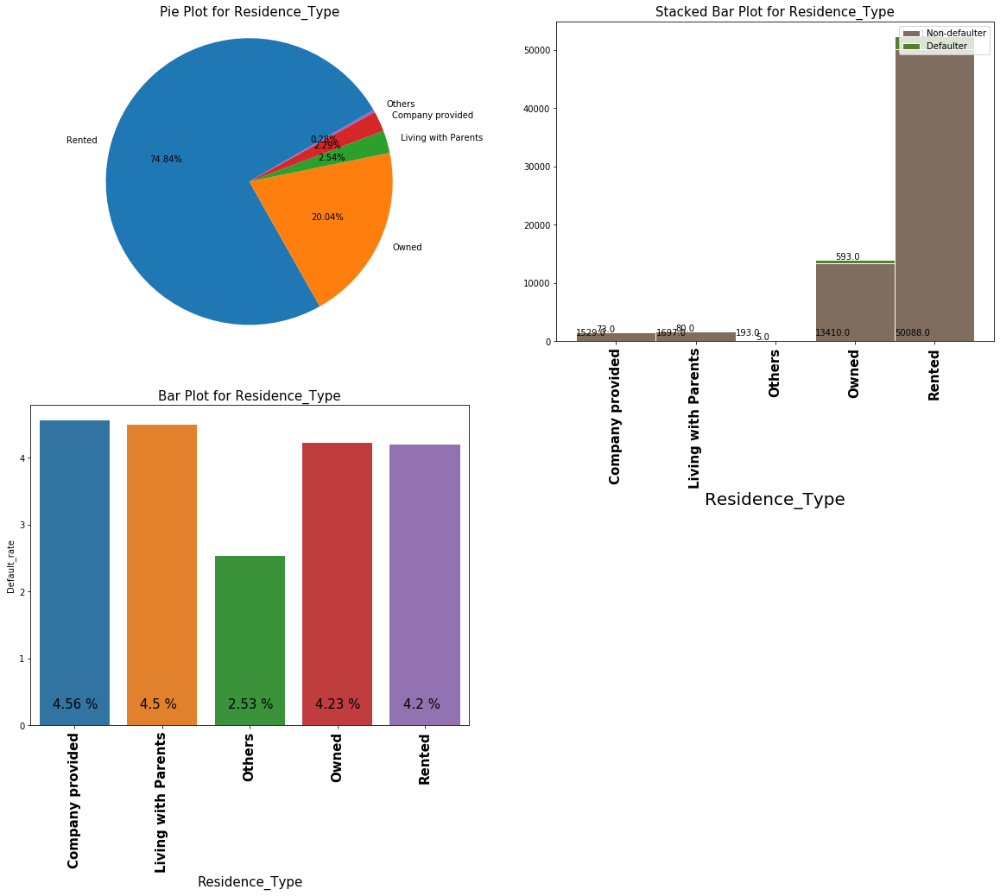

,Residence_Type,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,Company provided,73.0,1602,1529.0,4.56
1,Living with Parents,80.0,1777,1697.0,4.50
2,Others,5.0,198,193.0,2.53
3,Owned,593.0,14003,13410.0,4.23
4,Rented,2196.0,52284,50088.0,4.20


In [55]:
## univariate analysis for Residence_Type
plot_categorical_data(eda_demographics,'Residence_Type')

- We see majority of the people live in rented houses.
- the defaule rate is lowest for the people with residence_type as Others. Though the population in others is significantly low.

In [56]:
## EDA for the Dependents_No variable
eda_demographics.Dependents_No.value_counts()

3.0    15647
1.0    15218
2.0    15127
4.0    11997
5.0    11875
Name: Dependents_No, dtype: int64

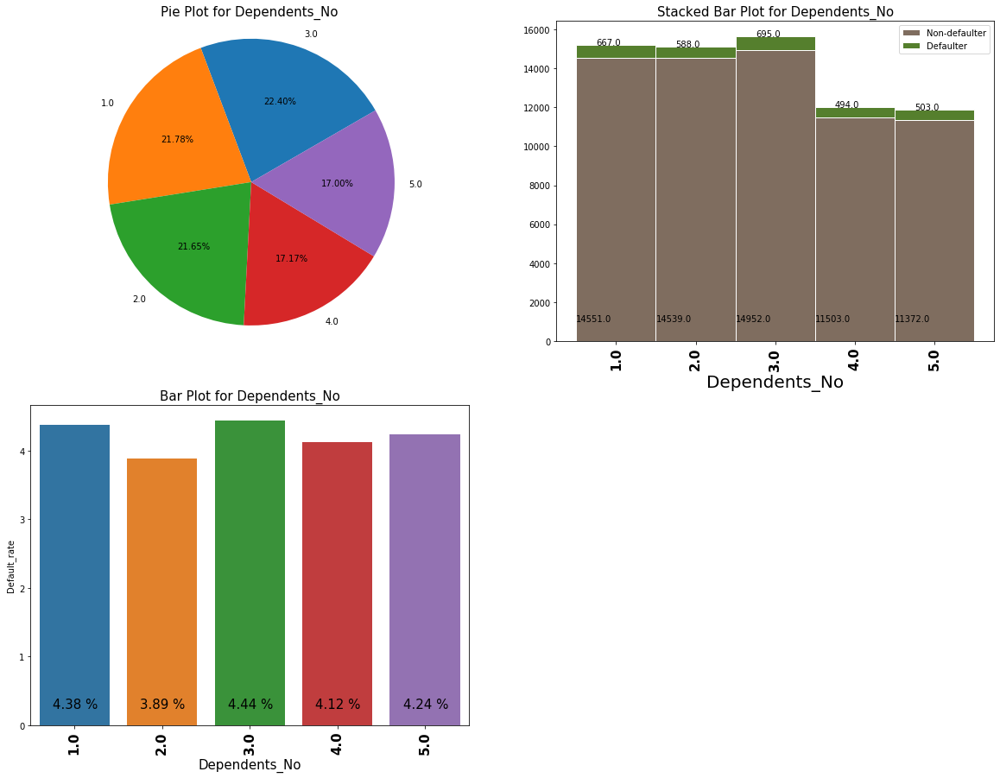

,Dependents_No,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,1.0,667.0,15218,14551.0,4.38
1,2.0,588.0,15127,14539.0,3.89
2,3.0,695.0,15647,14952.0,4.44
3,4.0,494.0,11997,11503.0,4.12
4,5.0,503.0,11875,11372.0,4.24


In [57]:
## univariate analysis for Dependents_No
plot_categorical_data(eda_demographics,'Dependents_No')

- The univariate analysis for the Dependents_No shows that the distribution for Dependents_No is more or less equal in terms of percentage for values 1 to 5.

- The population with Dependents_No as 2 shows less default rate over others.

#### 2.B) EDA for discrete/continuous variables

In [58]:
## EDA for the Age variable
eda_demographics.Age.describe()

count    69864.000000
mean     45.002276   
std      9.907562    
min      18.000000   
25%      37.000000   
50%      45.000000   
75%      53.000000   
max      65.000000   
Name: Age, dtype: float64

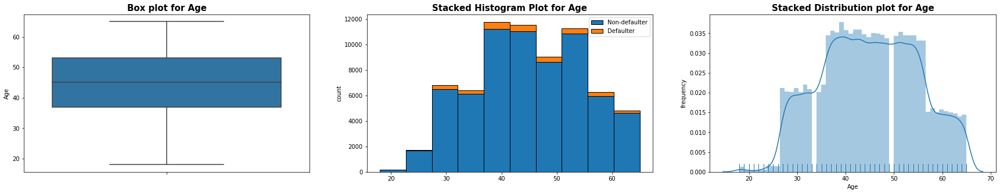

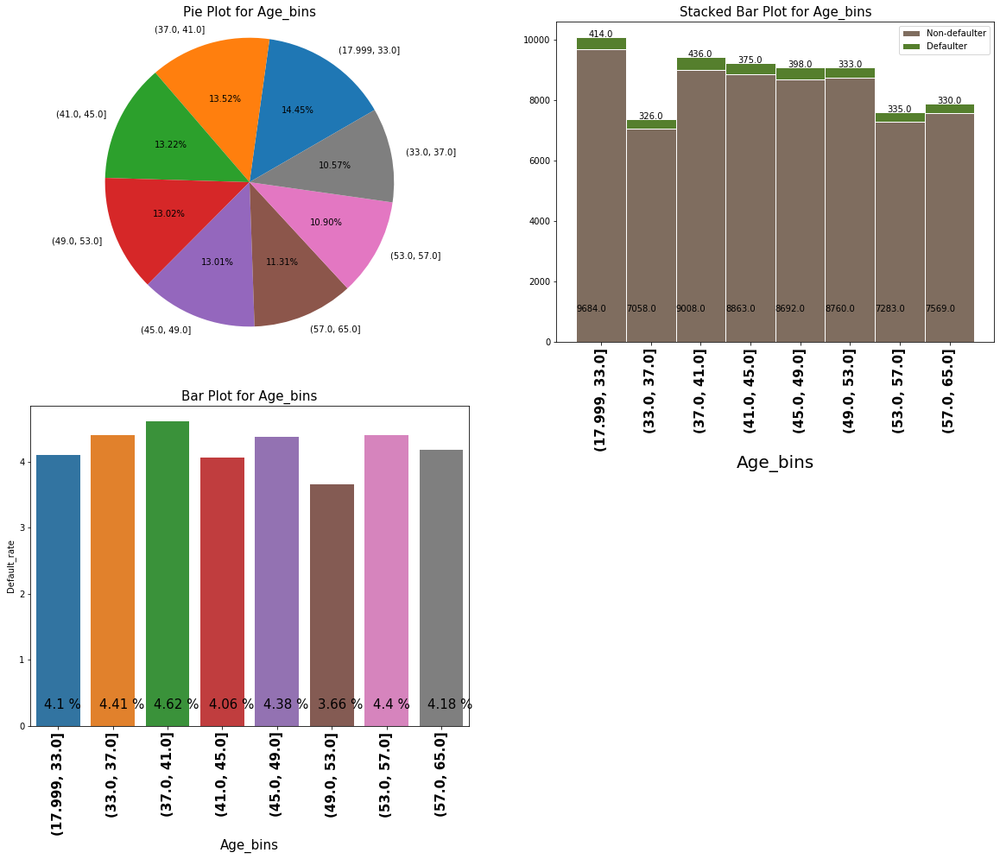

,Age_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(17.999, 33.0]",414.0,10098,9684.0,4.10
1,"(33.0, 37.0]",326.0,7384,7058.0,4.41
2,"(37.0, 41.0]",436.0,9444,9008.0,4.62
3,"(41.0, 45.0]",375.0,9238,8863.0,4.06
4,"(45.0, 49.0]",398.0,9090,8692.0,4.38
5,"(49.0, 53.0]",333.0,9093,8760.0,3.66
6,"(53.0, 57.0]",335.0,7618,7283.0,4.40
7,"(57.0, 65.0]",330.0,7899,7569.0,4.18


In [59]:
## univariate analysis for age
plot_continuous_num_data(eda_demographics,'Age')

- Overall the distribution of population across age groups is same.
- the age bin[37-41] has the highest default rate
- the variation is not too much to conclude anything

In [60]:
## EDA for the Income variable
eda_demographics.Income.describe()

count    69864.000000
mean     27.441143   
std      15.446719   
min      0.000000    
25%      14.000000   
50%      27.000000   
75%      40.000000   
max      60.000000   
Name: Income, dtype: float64

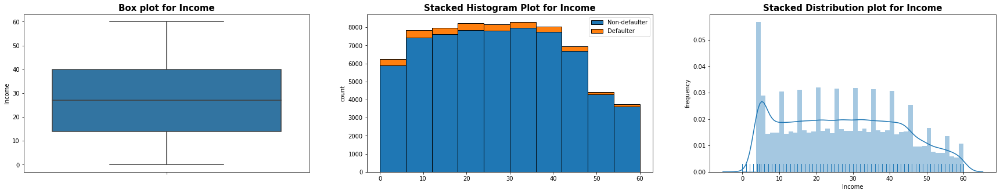

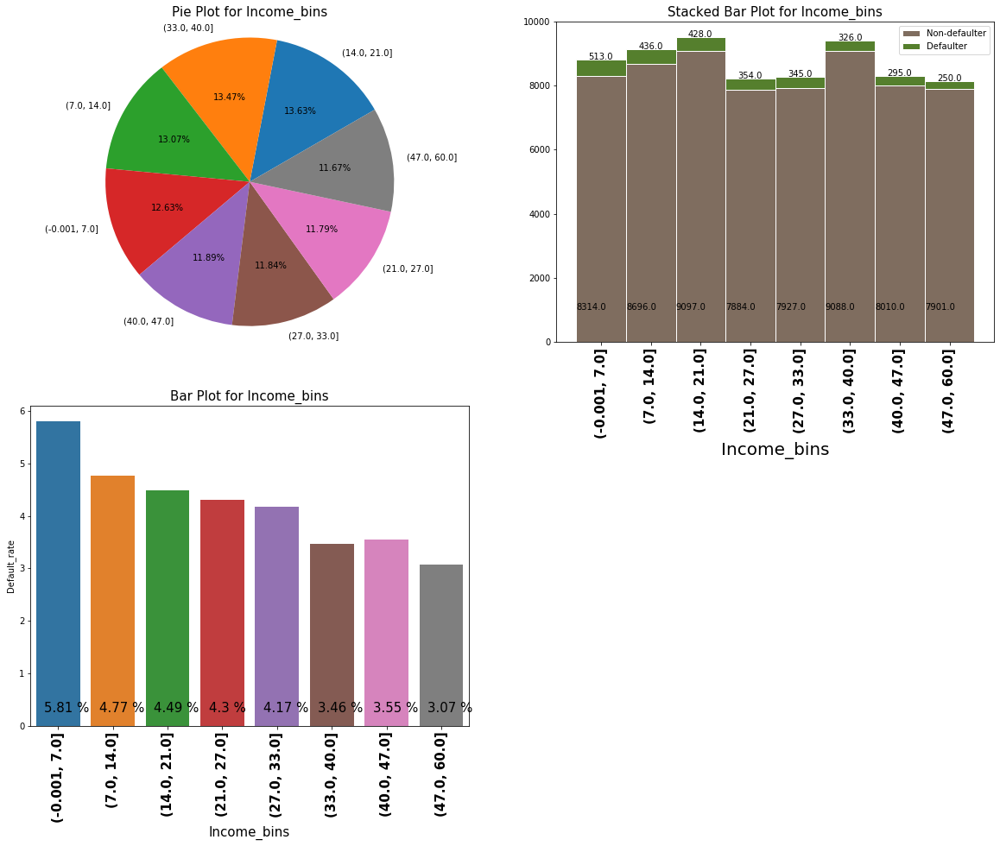

,Income_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 7.0]",513.0,8827,8314.0,5.81
1,"(7.0, 14.0]",436.0,9132,8696.0,4.77
2,"(14.0, 21.0]",428.0,9525,9097.0,4.49
3,"(21.0, 27.0]",354.0,8238,7884.0,4.30
4,"(27.0, 33.0]",345.0,8272,7927.0,4.17
5,"(33.0, 40.0]",326.0,9414,9088.0,3.46
6,"(40.0, 47.0]",295.0,8305,8010.0,3.55
7,"(47.0, 60.0]",250.0,8151,7901.0,3.07


In [61]:
## univariate analysis for Income
plot_continuous_num_data(eda_demographics,'Income')

- We can see the that frequency population of people is skewed towards low income group.
- Also the default rate is high for people with low income group, and it decreased with as income increases across bins.
-  The bar plot for the bins and default rate clearly shows the trend of decreasing default rate with the rise in income levels.

In [62]:
## EDA for the Months_Current_Residence variable
eda_demographics.Months_Current_Residence.describe()

count    69864.000000
mean     34.606550   
std      36.844678   
min      6.000000    
25%      6.000000    
50%      10.000000   
75%      61.000000   
max      126.000000  
Name: Months_Current_Residence, dtype: float64

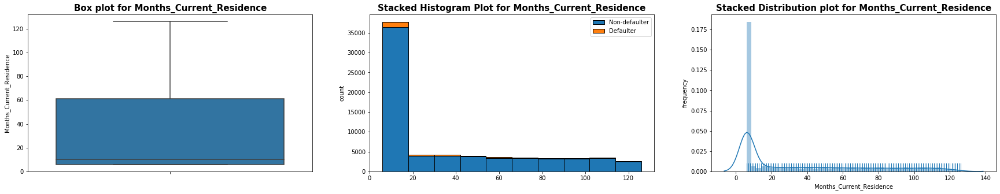

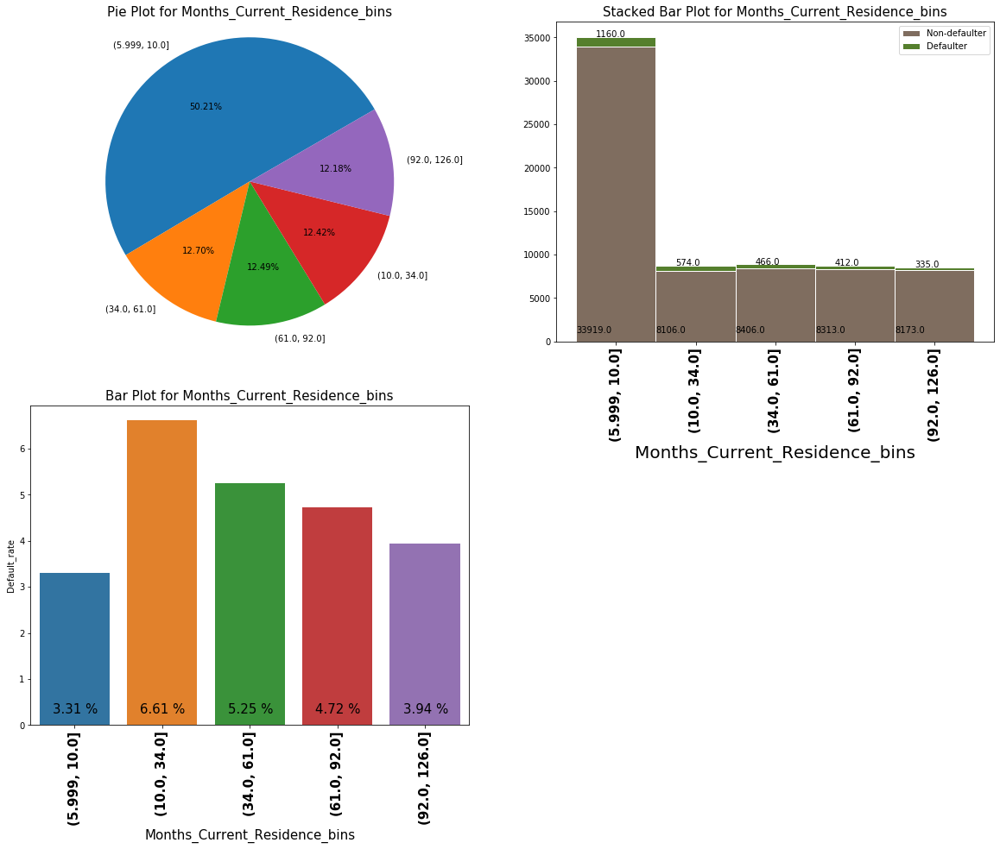

,Months_Current_Residence_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(5.999, 10.0]",1160.0,35079,33919.0,3.31
1,"(10.0, 34.0]",574.0,8680,8106.0,6.61
2,"(34.0, 61.0]",466.0,8872,8406.0,5.25
3,"(61.0, 92.0]",412.0,8725,8313.0,4.72
4,"(92.0, 126.0]",335.0,8508,8173.0,3.94


In [63]:
## univariate analysis for Months_Current_Residence
plot_continuous_num_data(eda_demographics,'Months_Current_Residence')

- We see relatively high population lives is in the bracket of 6-10 months(50%).
- Also the default rate is lowest for this bracket of 6-10 months (3.31%)
- Afterthis, we see spike in default rate for the bracket 10-34 months(6.61%). Though the population here is comparitively very low as compared to the former bracket of 6-10 months
- Also we see another trend that the default rate decreases as the Months_Current_Residence increase across the bins.

In [64]:
## EDA for the Months_Current_Company variable
eda_demographics.Months_Current_Company.describe()

count    69864.000000
mean     34.198657   
std      20.349579   
min      3.000000    
25%      17.000000   
50%      34.000000   
75%      51.000000   
max      133.000000  
Name: Months_Current_Company, dtype: float64

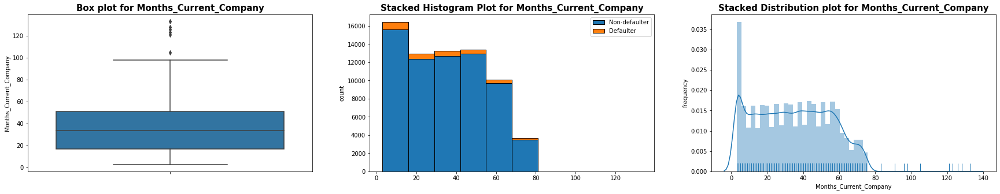

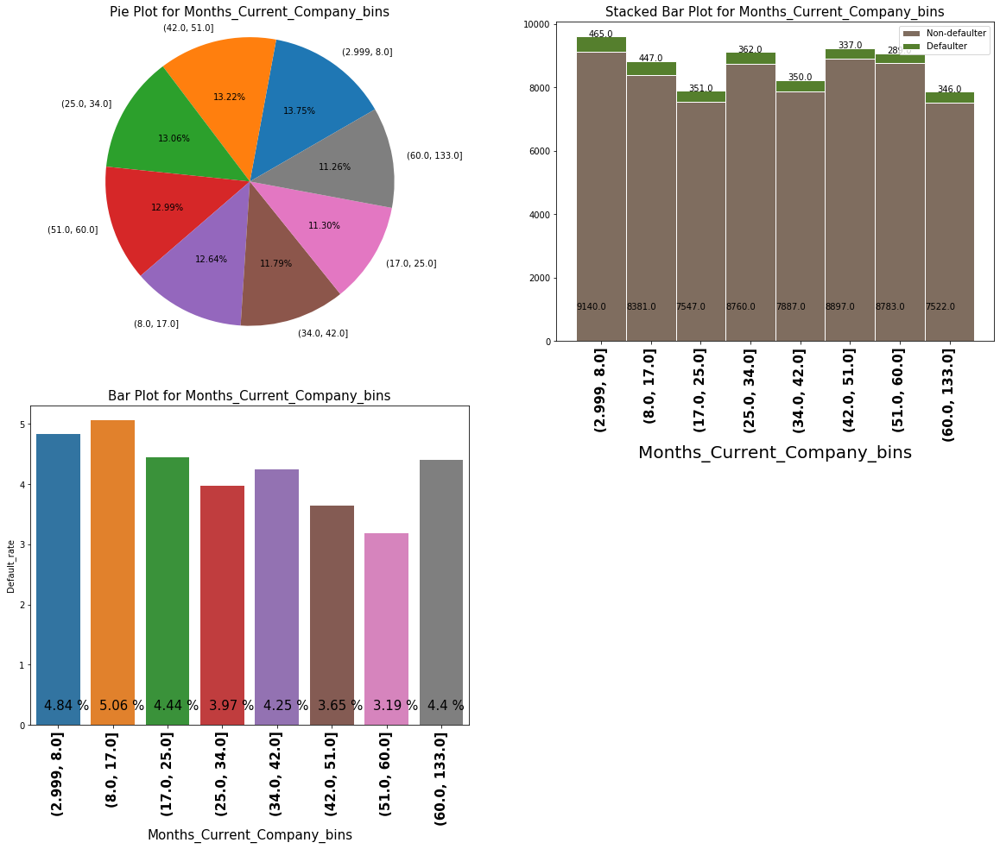

,Months_Current_Company_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(2.999, 8.0]",465.0,9605,9140.0,4.84
1,"(8.0, 17.0]",447.0,8828,8381.0,5.06
2,"(17.0, 25.0]",351.0,7898,7547.0,4.44
3,"(25.0, 34.0]",362.0,9122,8760.0,3.97
4,"(34.0, 42.0]",350.0,8237,7887.0,4.25
5,"(42.0, 51.0]",337.0,9234,8897.0,3.65
6,"(51.0, 60.0]",289.0,9072,8783.0,3.19
7,"(60.0, 133.0]",346.0,7868,7522.0,4.40


In [65]:
## univariate analysis for Months_Current_Company
plot_continuous_num_data(eda_demographics,'Months_Current_Company')

- we see uniform distribution of population acorss bins
- For default rate it shows a falling default rate trend as the Months_Current_Company increase (with some exceptions which include the outliers with high Months_Current_Company

#### Bivariate Analysis


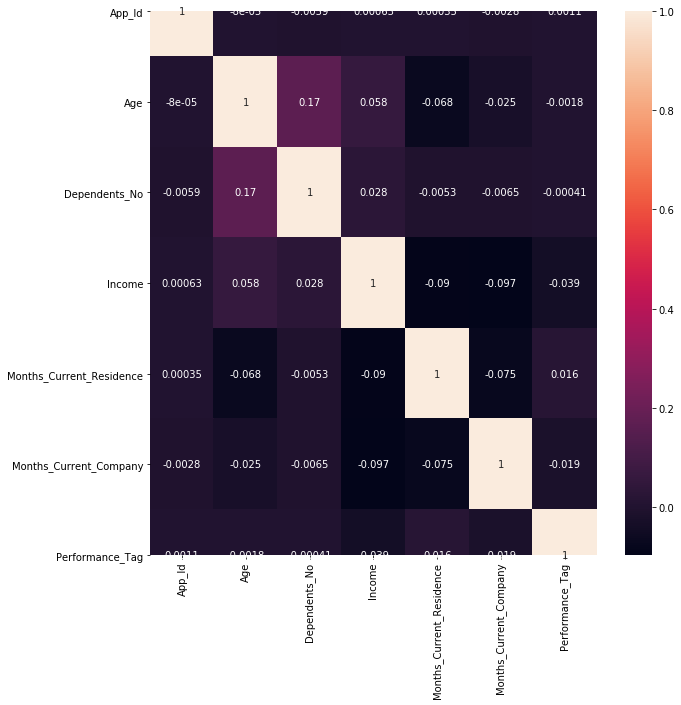

In [66]:
# Bivariate Analysis using Co-relation Matrix
plt.figure(figsize = (10,10))        # Size of the figure
sns.heatmap(demographics.corr(),annot = True)
plt.show()

## 3.) WoE and IV Analysis for Demographics Data

In [67]:
## describing the dataset. THE DATA HAS NO IMPUTATION
demographics_no_impute.describe()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag
count,6.987000e+04,69870.000000,69867.000000,69870.000000,69870.000000,69870.000000,69870.000000
mean,4.992264e+08,44.995578,2.859562,27.408451,34.608144,34.199184,0.042193
std,2.885519e+08,9.930036,1.385554,15.476003,36.845655,20.350225,0.201030
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000
25%,2.485780e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000
50%,4.980487e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000
75%,7.498645e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


In [68]:
## getting information for no impute dataset
demographics_no_impute.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69870 entries, 0 to 71294
Data columns (total 12 columns):
App_Id                      69870 non-null int64
Age                         69870 non-null int64
Gender                      69868 non-null object
Marital_Status              69864 non-null object
Dependents_No               69867 non-null float64
Income                      69870 non-null float64
Education                   69752 non-null object
Profession                  69857 non-null object
Residence_Type              69862 non-null object
Months_Current_Residence    69870 non-null int64
Months_Current_Company      69870 non-null int64
Performance_Tag             69870 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.9+ MB


**Creating functions for evaluating WoE and IV values**

In [69]:
## creating functions for woe and IV transformation
def iv_woe(data, target, bins=8, show_woe=False):
    
    #Empty Dataframe
    newDF,woeDF = pd.DataFrame(), pd.DataFrame()
    
    #Extract Column Names
    cols = data.columns
    
    #Run WOE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        null_data = data[data[ivars].isnull()]
        nonnull_data = data[data[ivars].notnull()]
        
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>8):            
            binned_x = pd.qcut(nonnull_data[ivars], bins,  duplicates='drop')
            d0 = pd.DataFrame({'x': binned_x, 'y': nonnull_data[target]})
        else:
            d0 = pd.DataFrame({'x': nonnull_data[ivars], 'y': nonnull_data[target]})
            
        if(~null_data.empty):
            d1 = pd.DataFrame({'x' : 'NULL', 'y' : null_data[target]})
            d0 = pd.concat([d0, d1], axis = 0)
            
        d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Defaults']                
        d['% of Defaults'] = np.maximum(d['Defaults'], 0.5) / d['Defaults'].sum()
        d['Non-Defaults'] = d['N'] - d['Defaults']
        d['% of Non-Defaults'] = np.maximum(d['Non-Defaults'], 0.5) / d['Non-Defaults'].sum()
        d['WoE'] = np.log(d['% of Defaults']/d['% of Non-Defaults'])
        d['IV'] = round(d['WoE'] * (d['% of Defaults'] - d['% of Non-Defaults']),6)
        d.insert(loc=0, column='Variable', value=ivars)
        print("Information value of " + ivars + " is " + str(round(d['IV'].sum(),6)))
        temp =pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
        newDF=pd.concat([newDF,temp], axis=0)
        woeDF=pd.concat([woeDF,d], axis=0)

        woeDF['min_val']=0
        woeDF['max_val']=0
        for cols in np.unique(woeDF.Variable):
            if (data[cols].dtype.kind in 'bifc') and (len(np.unique(data[cols]))>8):
                woeDF.loc[(woeDF.Variable==cols) & (woeDF.Cutoff!='NULL'),'min_val'
                         ] = woeDF[woeDF.Variable==cols
                                  ]['Cutoff'].apply(lambda x: 0 if x=='NULL' else float(str(x).split(',')[0].split('(')[1].strip()))
                woeDF.loc[(woeDF.Variable==cols) & (woeDF.Cutoff!='NULL'),'max_val'
                         ] = woeDF[woeDF.Variable==cols
                                  ]['Cutoff'].apply(lambda x: 0 if x=='NULL' else float(str(x).split(',')[1].split(']')[0].strip()))


        #Show WOE Table
        if show_woe == True:
            print(d)
    return newDF, woeDF

In [70]:
## evaluating woe and iv for demographics data
iv_demographics, woe_demographics = iv_woe(data = demographics_no_impute.drop(['App_Id'],axis=1), 
                                           target = 'Performance_Tag', bins=8, show_woe = True)

Information value of Age is 0.004955
  Variable          Cutoff      N  Defaults  % of Defaults  Non-Defaults  \
0  Age      (-3.001, 33.0]  10100  414.0     0.140434       9686.0         
1  Age      (33.0, 37.0]    7384   326.0     0.110583       7058.0         
2  Age      (37.0, 41.0]    9446   437.0     0.148236       9009.0         
3  Age      (41.0, 45.0]    9238   375.0     0.127205       8863.0         
4  Age      (45.0, 49.0]    9090   398.0     0.135007       8692.0         
5  Age      (49.0, 53.0]    9093   333.0     0.112958       8760.0         
6  Age      (53.0, 57.0]    7620   335.0     0.113636       7285.0         
7  Age      (57.0, 65.0]    7899   330.0     0.111940       7569.0         

   % of Non-Defaults       WoE        IV  
0  0.144736          -0.030170  0.000130  
1  0.105466           0.047381  0.000242  
2  0.134619           0.096355  0.001312  
3  0.132438          -0.040314  0.000211  
4  0.129883           0.038694  0.000198  
5  0.130899         

In [71]:
## displaying the WoE and IV values for all variables for data set
woe_demographics.sort_values(by=['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
2,0.000170,0.000120,NULL,0.0,0.000018,8,8.0,Residence_Type,0.349812,0.0,0.000
0,0.024763,0.022862,Company provided,73.0,0.000152,1603,1530.0,Residence_Type,0.079837,0.0,0.000
1,0.027137,0.025373,Living with Parents,80.0,0.000119,1778,1698.0,Residence_Type,0.067221,0.0,0.000
4,0.201153,0.200383,Owned,593.0,0.000003,14003,13410.0,Residence_Type,0.003839,0.0,0.000
5,0.745251,0.748379,Rented,2197.0,0.000013,52280,50083.0,Residence_Type,-0.004188,0.0,0.000
3,0.001696,0.002884,Others,5.0,0.000631,198,193.0,Residence_Type,-0.530851,0.0,0.000
2,0.217775,0.198515,SE,642.0,0.001783,13927,13285.0,Profession,0.092598,0.0,0.000
3,0.229647,0.232793,SE_PROF,677.0,0.000043,16256,15579.0,Profession,-0.013607,0.0,0.000
1,0.552578,0.568498,SAL,1629.0,0.000452,39674,38045.0,Profession,-0.028403,0.0,0.000
0,0.000170,0.000194,NULL,0.0,0.000003,13,13.0,Profession,-0.135696,0.0,0.000


In [72]:
## displaying the consolidate IV values for each variable in data set
iv_demographics.sort_values(by='IV', ascending = False)

,Variable,IV
0,Months_Current_Residence,0.073689
0,Income,0.039013
0,Months_Current_Company,0.021577
0,Age,0.004955
0,Dependents_No,0.002823
0,Profession,0.002281
0,Residence_Type,0.000936
0,Education,0.000765
0,Gender,0.000562
0,Marital_Status,0.000143


- We see 'Months_Current_Residence' has the Information Value, so it is the most significant variable, followed by 'Income'.

In [73]:
## evaluating the overall IV for the dataset
iv_demographics.IV.sum()

0.14674399999999999

By convention the values of the IV statistic can be interpreted as follows. If the IV statistic is:

- Less than 0.02, then the predictor is not useful for modeling (separating the Goods from the Bads)

- 0.02 to 0.1, then the predictor has only a weak relationship to the Goods/Bads odds ratio

- 0.1 to 0.3, then the predictor has a medium strength relationship to the Goods/Bads odds ratio

- 0.3 or higher, then the predictor has a strong relationship to the Goods/Bads odds ratio.

***So here we see our total IV is 0.14, which means that the demographic data has Medium Strenght Relationship with the default rate.***

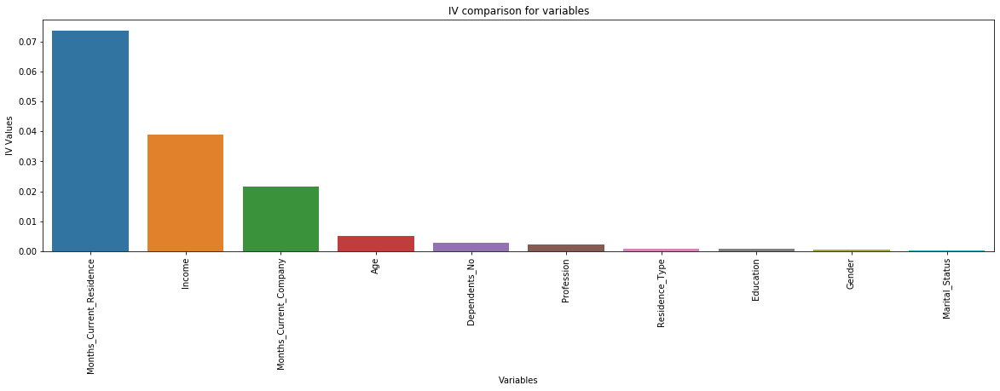

In [74]:
## plotting all the consolidated IV values of the demographics variable
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_demographics.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

- The IV value for the Months_Current_Residence looks much more in comparison to other demographics variable. This shows that the variable Months_Current_Residence is most significant in terms of adding information about the default rate.

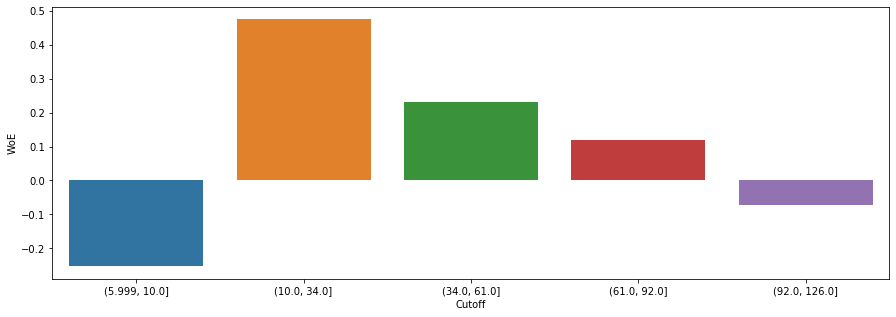

In [75]:
## plotting WoE values = Months_Current_Residence variable 
plt.figure(figsize=(15,5))
sns.barplot(y='WoE', x="Cutoff", data=woe_demographics[woe_demographics.Variable=='Months_Current_Residence'])
plt.show()

- The above plot shows decreasing WoE values with increase in the Months_Current_Residence variable (with exception of initial bin that shows negative WoE).

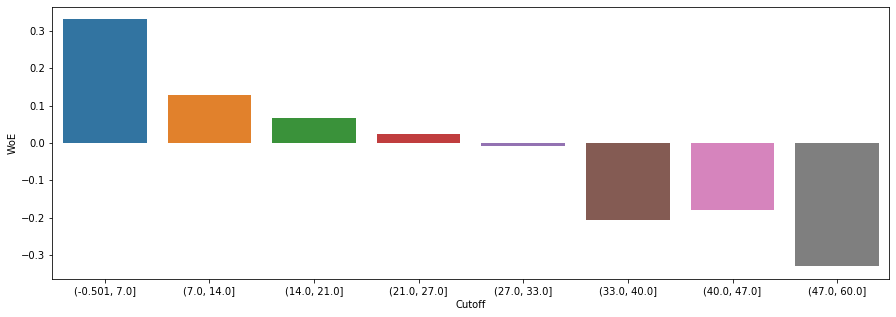

In [76]:
## plotting WoE values = Income variable 
plt.figure(figsize=(15,5))
sns.barplot(y='WoE', x="Cutoff", data=woe_demographics[woe_demographics.Variable=='Income'])
plt.show()

- The trend of decrease in WoE values with increase in income bins is very much evident from the above plot. Means that people with lower income has more weight of evidence and governs the default rate more.

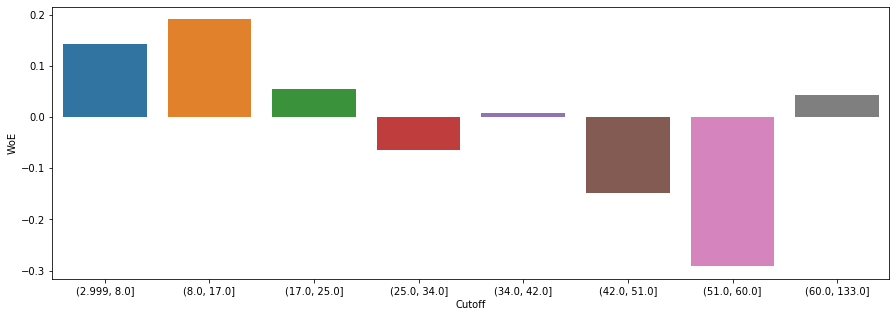

In [77]:
## plotting WoE values = Months_Current_Company variable 
plt.figure(figsize=(15,5))
sns.barplot(y='WoE', x="Cutoff", data=woe_demographics[woe_demographics.Variable=='Months_Current_Company'])
plt.show()

- The trend of decrease in WoE with increase in Months_Current_Company is evident with some exceptions in the above plot.
- People who are relatively new in there company 2-18 months has higher WOE means that they govern the defaut rate more.

### Creating WoE Dataframe from original dataframe

In [78]:
## function to create woe transformed dataframe from original dataframe
def create_woe_dataframe(no_impute_df,woe_df) :
    woe_data = pd.DataFrame(no_impute_df).copy()

    for cols in woe_data.columns:
        df = woe_df[woe_df.Variable==cols]
        if (woe_data[cols].dtype.kind in 'bifc') and (len(np.unique(woe_data[cols]))>8):
            for idx in df.index :
                minval = df[idx:idx+1].min_val.sum()
                maxval = df[idx:idx+1].max_val.sum()
                woe_data.loc[(woe_data[cols]>minval) & (woe_data[cols]<=maxval),cols] = df[idx:idx+1].WoE.sum()
        else:
            for idx in df.index :
                cutoff = list(df[idx:idx+1].Cutoff)[0]
                woe_data.loc[woe_data[cols]==cutoff,cols] = df[idx:idx+1].WoE.sum()

        woe_data.loc[pd.isnull(woe_data[cols]),cols] = df[df.Cutoff=='NULL'].WoE.sum()
        woe_data[cols] = pd.to_numeric(woe_data[cols])
    
    return woe_data


In [79]:
## creating demographics WoE dataframe from original demographics dataframe
woe_demographic_data = create_woe_dataframe(demographics_no_impute,woe_demographics)
woe_demographic_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215.0,0.038694,0.031865,-0.003932,-0.085531,-0.205522,0.017005,-0.028403,-0.004188,-0.072305,-0.291974,0.0
1,432830445.0,-0.030170,-0.010008,-0.003932,-0.025688,-0.330883,-0.018326,-0.013607,-0.004188,-0.072305,-0.148023,0.0
2,941387308.0,-0.030170,-0.010008,0.023017,-0.085531,-0.179070,0.017005,-0.013607,-0.004188,-0.072305,-0.148023,0.0
3,392161677.0,-0.040314,-0.010008,-0.003932,0.039776,-0.330883,0.017005,0.092598,-0.004188,-0.072305,-0.291974,0.0
4,182011211.0,0.047381,0.031865,-0.003932,0.006068,-0.179070,-0.018326,-0.028403,-0.004188,-0.072305,-0.148023,0.0


In [80]:
## saving WoE dataframe into csv file
woe_demographic_data.to_csv('woe_demographic_data.csv',index=False)

# 4.) Credit Bureau Data 

In [81]:
#Reading the data
CreditBureau = pd.read_csv("Credit Bureau data.csv",sep=",")
CreditBureau.head()

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


#### Inspecting the dataframe


In [82]:
CreditBureau.columns

Index(['Application ID', 'No of times 90 DPD or worse in last 6 months',
       'No of times 60 DPD or worse in last 6 months',
       'No of times 30 DPD or worse in last 6 months',
       'No of times 90 DPD or worse in last 12 months',
       'No of times 60 DPD or worse in last 12 months',
       'No of times 30 DPD or worse in last 12 months',
       'Avgas CC Utilization in last 12 months',
       'No of trades opened in last 6 months',
       'No of trades opened in last 12 months',
       'No of PL trades opened in last 6 months',
       'No of PL trades opened in last 12 months',
       'No of Inquiries in last 6 months (excluding home & auto loans)',
       'No of Inquiries in last 12 months (excluding home & auto loans)',
       'Presence of open home loan', 'Outstanding Balance',
       'Total No of Trades', 'Presence of open auto loan', 'Performance Tag'],
      dtype='object')

In [83]:
CreditBureau.shape

(71295, 19)

- we have the same no of rows as in Demographic Dataset

In [84]:
CreditBureau.dtypes

Application ID                                                     int64  
No of times 90 DPD or worse in last 6 months                       int64  
No of times 60 DPD or worse in last 6 months                       int64  
No of times 30 DPD or worse in last 6 months                       int64  
No of times 90 DPD or worse in last 12 months                      int64  
No of times 60 DPD or worse in last 12 months                      int64  
No of times 30 DPD or worse in last 12 months                      int64  
Avgas CC Utilization in last 12 months                             float64
No of trades opened in last 6 months                               float64
No of trades opened in last 12 months                              int64  
No of PL trades opened in last 6 months                            int64  
No of PL trades opened in last 12 months                           int64  
No of Inquiries in last 6 months (excluding home & auto loans)     int64  
No of Inquiries in last 1

In [85]:
## renaming the columns for our ease of understanding
CreditBureau.columns = ['App_Id', 'No_90_DPD_last_6_months','No_60_DPD_last_6_months','No_30_DPD_last_6_months',
       'No_90_DPD_last_12_months','No_60_DPD_last_12_months','No_30_DPD_last_12_months','Avgas_CC_Utilization_12_months',
       'Trades_opened_last_6_months','Trades_opened_last_12_months','PL_Trades_opened_last_6_months',
       'PL_Trades_opened_last_12_months','Inquiries_last_6_months','Inquiries_last_12_months',
       'Presence_open_home_loan', 'Outstanding_Balance','Total_Trades', 'Presence_open_auto_loan', 'Performance_Tag']
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [86]:
## checking info
CreditBureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 19 columns):
App_Id                             71295 non-null int64
No_90_DPD_last_6_months            71295 non-null int64
No_60_DPD_last_6_months            71295 non-null int64
No_30_DPD_last_6_months            71295 non-null int64
No_90_DPD_last_12_months           71295 non-null int64
No_60_DPD_last_12_months           71295 non-null int64
No_30_DPD_last_12_months           71295 non-null int64
Avgas_CC_Utilization_12_months     70237 non-null float64
Trades_opened_last_6_months        71294 non-null float64
Trades_opened_last_12_months       71295 non-null int64
PL_Trades_opened_last_6_months     71295 non-null int64
PL_Trades_opened_last_12_months    71295 non-null int64
Inquiries_last_6_months            71295 non-null int64
Inquiries_last_12_months           71295 non-null int64
Presence_open_home_loan            71023 non-null float64
Outstanding_Balance                71023 non-

In [87]:
## saving original data set 
CreditBureau_original = pd.DataFrame(CreditBureau).copy()

In [88]:
## removing all the entries from the CreditBureau data set that have null Performance tag as they are of no use to us
## Are the ones who have not been issued a credit card
CreditBureau = CreditBureau[~CreditBureau.Performance_Tag.isnull()]
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [89]:
## saving data set with no imputation for WoE analysis
CreditBureau_no_impute = pd.DataFrame(CreditBureau).copy()

## exttracting the null entries from the additional testing
CreditBureau_nulls = CreditBureau_original[CreditBureau_original.Performance_Tag.isnull()]

In [90]:
## checking duplicated entries for application id
ids = CreditBureau.App_Id
duplicate_customers = CreditBureau[ids.isin(ids[ids.duplicated()])]
duplicate_customers.sort_values(by='App_Id')

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
5243,653287861,0,0,0,0,0,0,15.0,0.0,0,0,0,0,0,0.0,10494.0,2,0,0.0
42637,653287861,1,1,1,2,2,2,113.0,2.0,5,1,3,1,3,0.0,628075.0,6,0,1.0
48602,671989187,1,2,3,2,2,3,63.0,2.0,6,1,4,3,5,0.0,806473.0,7,1,0.0
59022,671989187,0,1,2,0,2,3,76.0,3.0,7,1,4,2,6,0.0,822298.0,7,0,0.0
24386,765011468,0,0,0,0,0,0,11.0,1.0,2,0,1,2,2,0.0,212656.0,3,0,0.0
27586,765011468,0,0,0,0,0,0,11.0,1.0,3,0,0,1,3,0.0,29817.0,6,0,0.0


In [91]:
## removing the duplicate entries
CreditBureau = CreditBureau[~CreditBureau.App_Id.isin(duplicate_customers.App_Id)]
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [92]:
#Describing the dataset
CreditBureau.describe()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
count,6.986400e+04,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,68841.000000,69863.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69592.000000,6.959200e+04,69864.000000,69864.000000,69864.000000
mean,4.992094e+08,0.248969,0.391661,0.523474,0.414820,0.603372,0.733854,29.263564,2.285172,5.785111,1.189626,2.363492,1.758001,3.525063,0.259671,1.253410e+06,8.174954,0.084865,0.042182
std,2.885582e+08,0.505660,0.771877,1.000733,0.763497,1.021752,1.243158,29.514278,2.081921,5.095480,1.352704,2.423678,1.985078,3.611805,0.438457,1.286194e+06,7.153028,0.278683,0.201006
min,1.004500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.485587e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.083998e+05,3.000000,0.000000,0.000000
50%,4.979556e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,4.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.742420e+05,6.000000,0.000000,0.000000
75%,7.498606e+08,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,45.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.926250e+06,10.000000,0.000000,0.000000
max,1.000084e+09,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [93]:
## checking for null values across variables
CreditBureau.isnull().sum()

App_Id                             0   
No_90_DPD_last_6_months            0   
No_60_DPD_last_6_months            0   
No_30_DPD_last_6_months            0   
No_90_DPD_last_12_months           0   
No_60_DPD_last_12_months           0   
No_30_DPD_last_12_months           0   
Avgas_CC_Utilization_12_months     1023
Trades_opened_last_6_months        1   
Trades_opened_last_12_months       0   
PL_Trades_opened_last_6_months     0   
PL_Trades_opened_last_12_months    0   
Inquiries_last_6_months            0   
Inquiries_last_12_months           0   
Presence_open_home_loan            272 
Outstanding_Balance                272 
Total_Trades                       0   
Presence_open_auto_loan            0   
Performance_Tag                    0   
dtype: int64

In [94]:
## checking entries with null value in Avgas_CC_Utilization_12_months
CreditBureau.loc[CreditBureau.Avgas_CC_Utilization_12_months.isnull()]

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
67,559139774,0,0,0,0,0,1,NaN,0.0,0,0,0,0,1,0.0,0.0,0,0,0.0
75,354139458,0,0,0,0,0,1,NaN,0.0,0,0,0,0,2,0.0,0.0,0,0,0.0
78,456275546,0,0,0,0,0,1,NaN,0.0,0,0,0,0,3,0.0,0.0,0,0,0.0
149,507928401,0,0,0,0,1,2,NaN,0.0,0,0,0,0,1,0.0,0.0,0,0,0.0
171,814624395,0,0,0,0,1,1,NaN,0.0,0,0,0,1,2,0.0,0.0,0,0,0.0
214,125043285,0,0,0,0,1,1,NaN,0.0,0,0,0,1,1,0.0,0.0,0,0,0.0
234,970523127,0,0,0,0,0,0,NaN,0.0,0,0,0,1,3,0.0,0.0,0,0,0.0
244,427009271,0,0,0,0,0,0,NaN,0.0,0,0,0,0,1,0.0,0.0,0,0,0.0
352,982684122,0,0,0,0,0,0,NaN,0.0,0,0,0,0,1,0.0,0.0,0,0,0.0
482,720535507,0,0,0,0,0,0,NaN,0.0,0,0,0,0,1,0.0,0.0,0,0,0.0


In [95]:
## replacing null values for Avgas_CC_Utilization_12_months with median value
CreditBureau.loc[CreditBureau.Avgas_CC_Utilization_12_months.isnull(),
                 'Avgas_CC_Utilization_12_months'] = CreditBureau.Avgas_CC_Utilization_12_months.median()
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


- we decided to impute the NULL values with median here

In [96]:
## checking value counts for Presence_open_home_loan
CreditBureau.Presence_open_home_loan.value_counts()

0.0    51521
1.0    18071
Name: Presence_open_home_loan, dtype: int64

In [97]:
## replacing null values for Presence_open_home_loan 
CreditBureau.loc[CreditBureau.Presence_open_home_loan.isnull(),'Presence_open_home_loan'] = 0
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [98]:
## checking null entries for Outstanding_Balance now
CreditBureau.loc[CreditBureau.Outstanding_Balance.isnull()]

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
10509,479431469,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10560,369436570,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10583,198567793,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10594,771962421,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10763,124126752,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10785,897124363,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10821,127042017,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10952,252694179,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10958,377993668,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0
10965,757235320,0,0,0,0,0,0,15.0,0.0,0,0,0,0,1,0.0,NaN,0,0,0.0


*** It seems that there are 272 NULL entries in credit card 'Outstanding_Balance',it means that these people don't have any prior credit card, hence we can impute the null entries with 0. Also we few steps back imputed with median for the null values in 'Avgas_CC_Utilization_12_months', that need to rectified and marked 0 for those who have 0 Outstanding Balance ***

In [99]:
CreditBureau.loc[CreditBureau.Outstanding_Balance.isnull(),'Avgas_CC_Utilization_12_months'] = 0
CreditBureau.loc[CreditBureau.Outstanding_Balance.isnull(),'Outstanding_Balance'] = 0
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [100]:
## cheking null counts now
CreditBureau.isnull().sum()

App_Id                             0
No_90_DPD_last_6_months            0
No_60_DPD_last_6_months            0
No_30_DPD_last_6_months            0
No_90_DPD_last_12_months           0
No_60_DPD_last_12_months           0
No_30_DPD_last_12_months           0
Avgas_CC_Utilization_12_months     0
Trades_opened_last_6_months        1
Trades_opened_last_12_months       0
PL_Trades_opened_last_6_months     0
PL_Trades_opened_last_12_months    0
Inquiries_last_6_months            0
Inquiries_last_12_months           0
Presence_open_home_loan            0
Outstanding_Balance                0
Total_Trades                       0
Presence_open_auto_loan            0
Performance_Tag                    0
dtype: int64

In [101]:
## replacing null values for Trades_opened_last_6_months with most occuring value (mode)
CreditBureau.loc[CreditBureau.Trades_opened_last_6_months.isnull(),
                 'Trades_opened_last_6_months'] = CreditBureau.Trades_opened_last_6_months.mode()[0]
CreditBureau.head()

,App_Id,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [102]:
## chekcing null couns across variables now
CreditBureau.isnull().sum()

App_Id                             0
No_90_DPD_last_6_months            0
No_60_DPD_last_6_months            0
No_30_DPD_last_6_months            0
No_90_DPD_last_12_months           0
No_60_DPD_last_12_months           0
No_30_DPD_last_12_months           0
Avgas_CC_Utilization_12_months     0
Trades_opened_last_6_months        0
Trades_opened_last_12_months       0
PL_Trades_opened_last_6_months     0
PL_Trades_opened_last_12_months    0
Inquiries_last_6_months            0
Inquiries_last_12_months           0
Presence_open_home_loan            0
Outstanding_Balance                0
Total_Trades                       0
Presence_open_auto_loan            0
Performance_Tag                    0
dtype: int64

# 5.) EDA on Credit Bureau Data

In [103]:
## creating the copy of the CreditBureau datafram for EDA
eda_creditbureau = pd.DataFrame(CreditBureau).copy()

In [104]:
## evaluating the Performance_tag values
eda_creditbureau.Performance_Tag.value_counts()

0.0    66917
1.0    2947 
Name: Performance_Tag, dtype: int64

In [105]:
## evaluating the percentage of data for defaulters
percent_defaulters = (eda_creditbureau.Performance_Tag.sum()/eda_creditbureau['Performance_Tag'].count())*100
percent_defaulters

4.218195350967594

In [106]:
## cheking the info
eda_creditbureau.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69864 entries, 0 to 71294
Data columns (total 19 columns):
App_Id                             69864 non-null int64
No_90_DPD_last_6_months            69864 non-null int64
No_60_DPD_last_6_months            69864 non-null int64
No_30_DPD_last_6_months            69864 non-null int64
No_90_DPD_last_12_months           69864 non-null int64
No_60_DPD_last_12_months           69864 non-null int64
No_30_DPD_last_12_months           69864 non-null int64
Avgas_CC_Utilization_12_months     69864 non-null float64
Trades_opened_last_6_months        69864 non-null float64
Trades_opened_last_12_months       69864 non-null int64
PL_Trades_opened_last_6_months     69864 non-null int64
PL_Trades_opened_last_12_months    69864 non-null int64
Inquiries_last_6_months            69864 non-null int64
Inquiries_last_12_months           69864 non-null int64
Presence_open_home_loan            69864 non-null float64
Outstanding_Balance                69864 non-

In [107]:
## EDA for the No_90_DPD_last_6_months variable
eda_creditbureau.No_90_DPD_last_6_months.value_counts()

0    54662
1    13218
2    1776 
3    208  
Name: No_90_DPD_last_6_months, dtype: int64

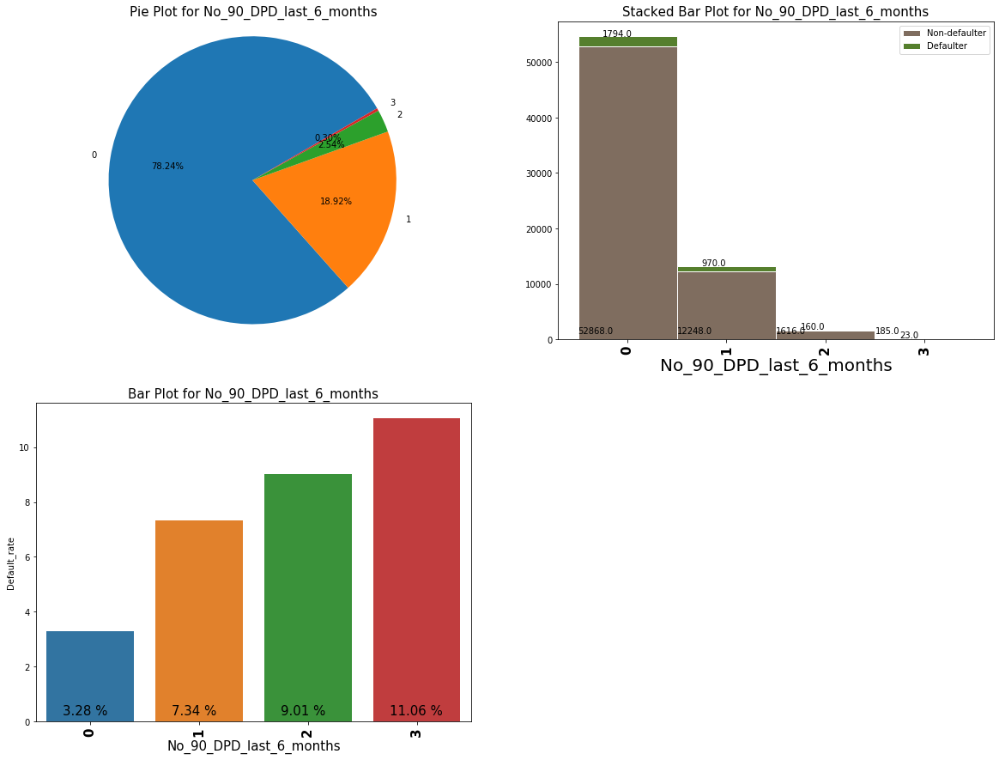

,No_90_DPD_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1794.0,54662,52868.0,3.28
1,1,970.0,13218,12248.0,7.34
2,2,160.0,1776,1616.0,9.01
3,3,23.0,208,185.0,11.06


In [108]:
## univariate analysis for No_90_DPD_last_6_months
plot_categorical_data(eda_creditbureau,'No_90_DPD_last_6_months')

- It clearly shows that mojority of the popultaion have 0 in No_90_DPD_last_6_months. Means Majority population payed their due in the last 90 days in the 6 months period
- We also see the default rate increasing significantly with increase in No_90_DPD_last_6_months. Means the default rate is more with the delinquent customers. No Doubt.

In [109]:
## EDA for the No_60_DPD_last_6_months variable
eda_creditbureau.No_60_DPD_last_6_months.value_counts()

0    51868
1    11130
2    4916 
3    1469 
4    411  
5    70   
Name: No_60_DPD_last_6_months, dtype: int64

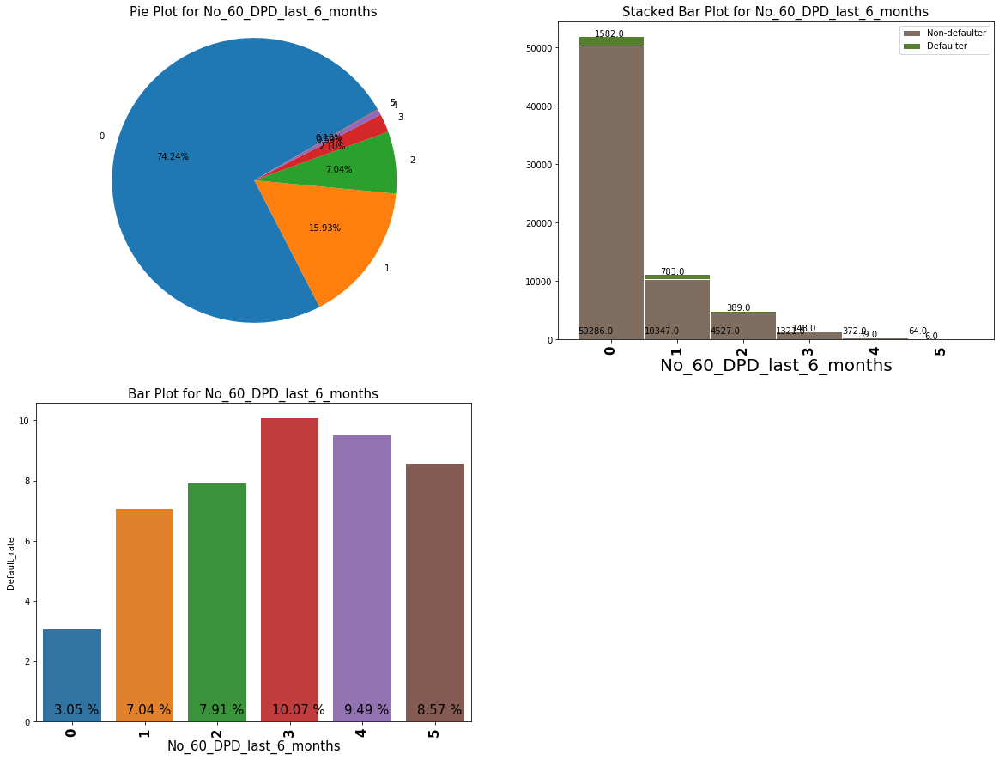

,No_60_DPD_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1582.0,51868,50286.0,3.05
1,1,783.0,11130,10347.0,7.04
2,2,389.0,4916,4527.0,7.91
3,3,148.0,1469,1321.0,10.07
4,4,39.0,411,372.0,9.49
5,5,6.0,70,64.0,8.57


In [110]:
## univariate analysis for No_60_DPD_last_6_months
plot_categorical_data(eda_creditbureau,'No_60_DPD_last_6_months')

- Again we see similar results, Majority population has 0 'No_60_DPD_last_6_months'. Hence the default rate is very less 3.05%
- We see again with increasing 'No_60_DPD_last_6_months', default rate also increases.

In [111]:
## EDA for the No_30_DPD_last_6_months variable
eda_creditbureau.No_30_DPD_last_6_months.value_counts()

0    50096
1    9500 
2    5897 
3    2829 
4    1045 
5    386  
6    96   
7    15   
Name: No_30_DPD_last_6_months, dtype: int64

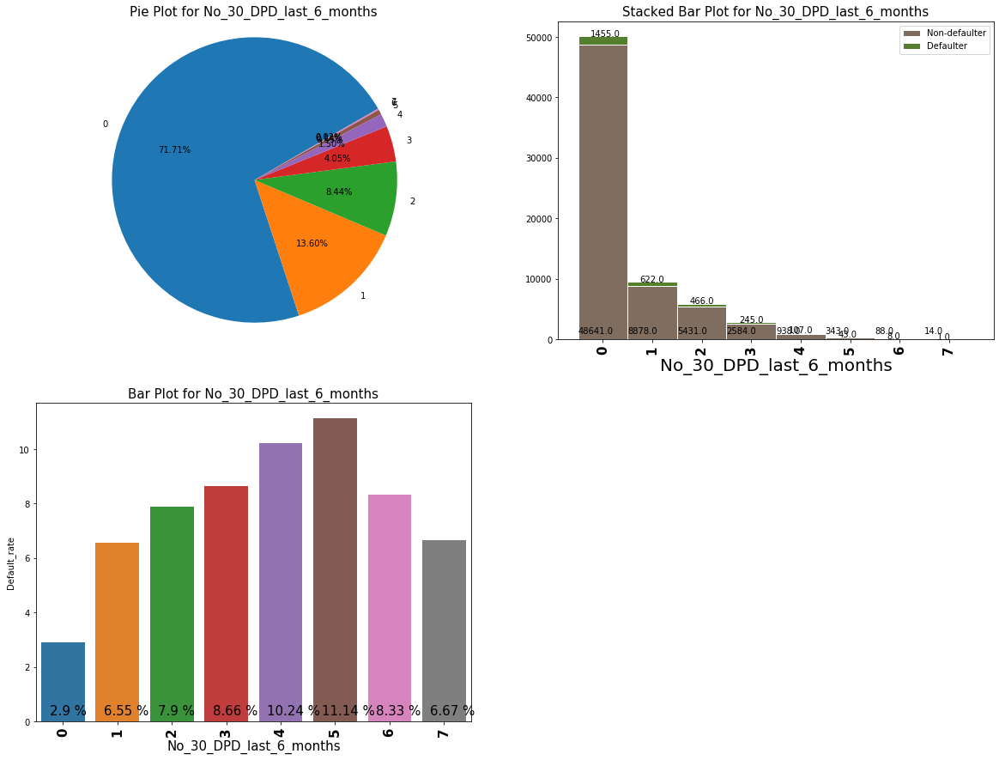

,No_30_DPD_last_6_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1455.0,50096,48641.0,2.90
1,1,622.0,9500,8878.0,6.55
2,2,466.0,5897,5431.0,7.90
3,3,245.0,2829,2584.0,8.66
4,4,107.0,1045,938.0,10.24
5,5,43.0,386,343.0,11.14
6,6,8.0,96,88.0,8.33
7,7,1.0,15,14.0,6.67


In [112]:
## univariate analysis for No_30_DPD_last_6_months
plot_categorical_data(eda_creditbureau,'No_30_DPD_last_6_months')

- Again we see similar results, Majority population has 0 'No_30_DPD_last_6_months'. Hence the default rate is very less 2.90%
- We see again with increasing 'No_30_DPD_last_6_months', default rate percent also increases, with slight exception in the last

In [113]:
## EDA for the No_90_DPD_last_12_months variable
eda_creditbureau.No_90_DPD_last_12_months.value_counts()

0    50490
1    11663
2    6159 
3    1244 
4    272  
5    36   
Name: No_90_DPD_last_12_months, dtype: int64

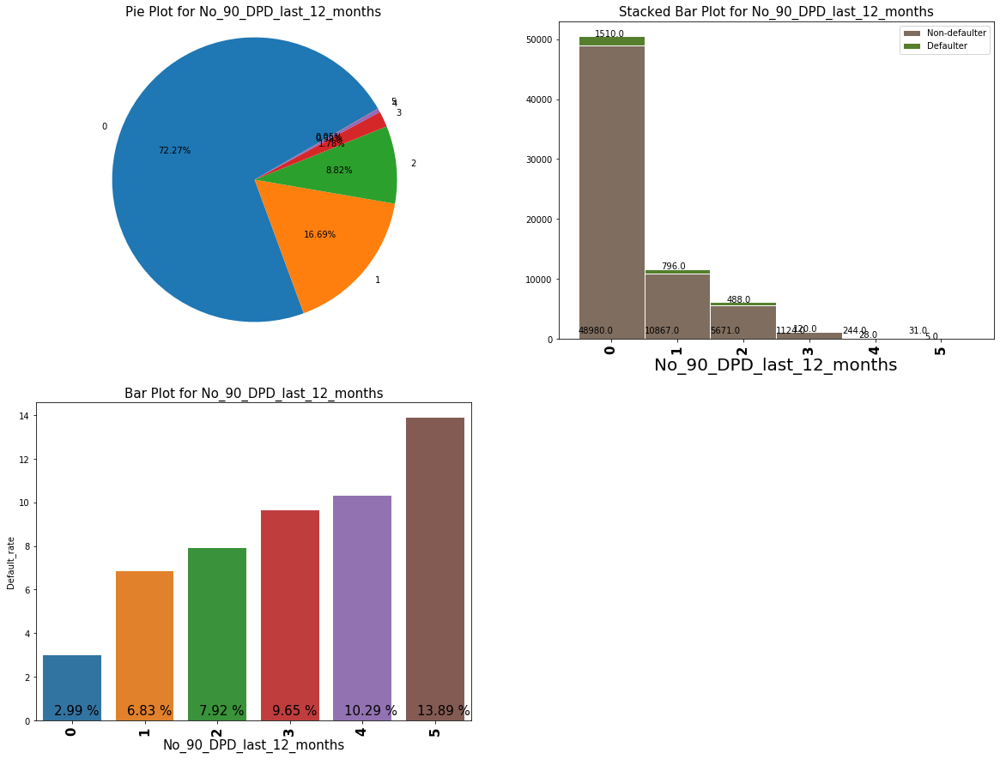

,No_90_DPD_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1510.0,50490,48980.0,2.99
1,1,796.0,11663,10867.0,6.83
2,2,488.0,6159,5671.0,7.92
3,3,120.0,1244,1124.0,9.65
4,4,28.0,272,244.0,10.29
5,5,5.0,36,31.0,13.89


In [114]:
## univariate analysis for No_90_DPD_last_12_months
plot_categorical_data(eda_creditbureau,'No_90_DPD_last_12_months')

- 72.27 % of people have defaulted 0 times in paying dues in 90 days past due in 12 months.The default rate is 2.99%
- We see the default rate percent increases with the increasing value in No_90_DPD_last_12_months. The trend is stedy

In [115]:
## EDA for the No_60_DPD_last_12_months variable
eda_creditbureau.No_60_DPD_last_12_months.value_counts()

0    45866
1    12816
2    6413 
3    3205 
4    1048 
5    398  
6    111  
7    7    
Name: No_60_DPD_last_12_months, dtype: int64

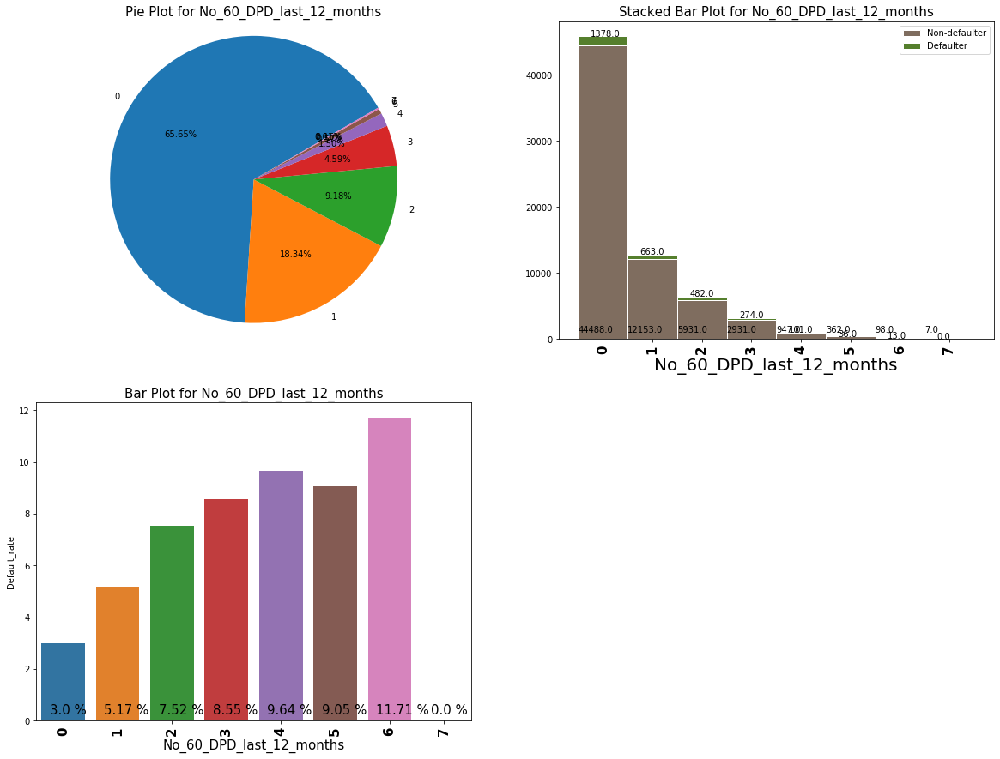

,No_60_DPD_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1378.0,45866,44488.0,3.00
1,1,663.0,12816,12153.0,5.17
2,2,482.0,6413,5931.0,7.52
3,3,274.0,3205,2931.0,8.55
4,4,101.0,1048,947.0,9.64
5,5,36.0,398,362.0,9.05
6,6,13.0,111,98.0,11.71
7,7,0.0,7,7.0,0.00


In [116]:
## univariate analysis for No_60_DPD_last_12_months
plot_categorical_data(eda_creditbureau,'No_60_DPD_last_12_months')

- The univariate analysis for the No_60_DPD_last_12_months shows an inceasing trend of percentage of defaulters as No_60_DPD_last_12_months increase from 0 to 6 (with a little exception). 
- For value of 7 the trend is not evident as the number of prospects for such cases is very less.

In [117]:
## EDA for the No_30_DPD_last_12_months variable
eda_creditbureau.No_30_DPD_last_12_months.value_counts()

0    44855
1    11474
2    6116 
3    4135 
4    1924 
5    853  
6    376  
7    107  
8    23   
9    1    
Name: No_30_DPD_last_12_months, dtype: int64

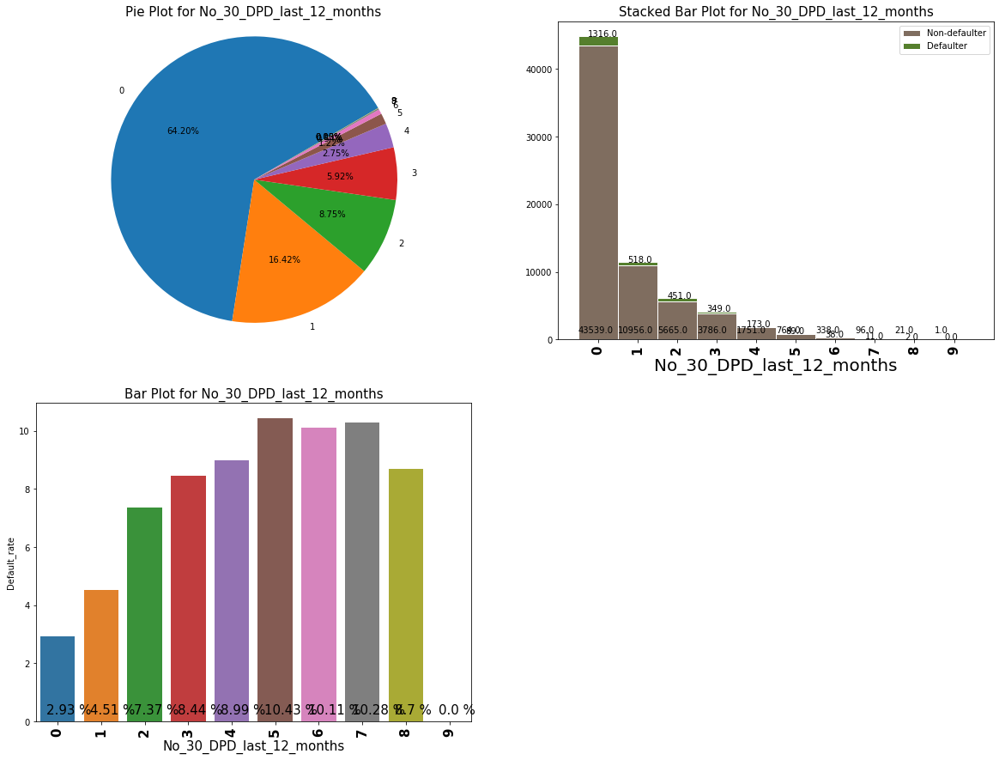

,No_30_DPD_last_12_months,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,1316.0,44855,43539.0,2.93
1,1,518.0,11474,10956.0,4.51
2,2,451.0,6116,5665.0,7.37
3,3,349.0,4135,3786.0,8.44
4,4,173.0,1924,1751.0,8.99
5,5,89.0,853,764.0,10.43
6,6,38.0,376,338.0,10.11
7,7,11.0,107,96.0,10.28
8,8,2.0,23,21.0,8.70
9,9,0.0,1,1.0,0.00


In [118]:
## univariate analysis for No_30_DPD_last_12_months
plot_categorical_data(eda_creditbureau,'No_30_DPD_last_12_months')

- The univariate analysis for the No_30_DPD_last_12_months shows an increasing trend for default rate as values for No_30_DPD_last_12_months increase from 0 to 5. 
- This trend is not present for higher values ranging from 6 to 9 as the overall population in such cases is very small.

In [119]:
## EDA for the Avgas_CC_Utilization_12_months variable
eda_creditbureau.Avgas_CC_Utilization_12_months.describe()

count    69864.000000
mean     28.996307   
std      29.390252   
min      0.000000    
25%      8.000000    
50%      15.000000   
75%      44.000000   
max      113.000000  
Name: Avgas_CC_Utilization_12_months, dtype: float64

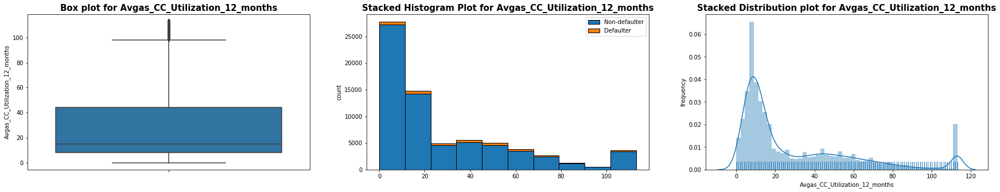

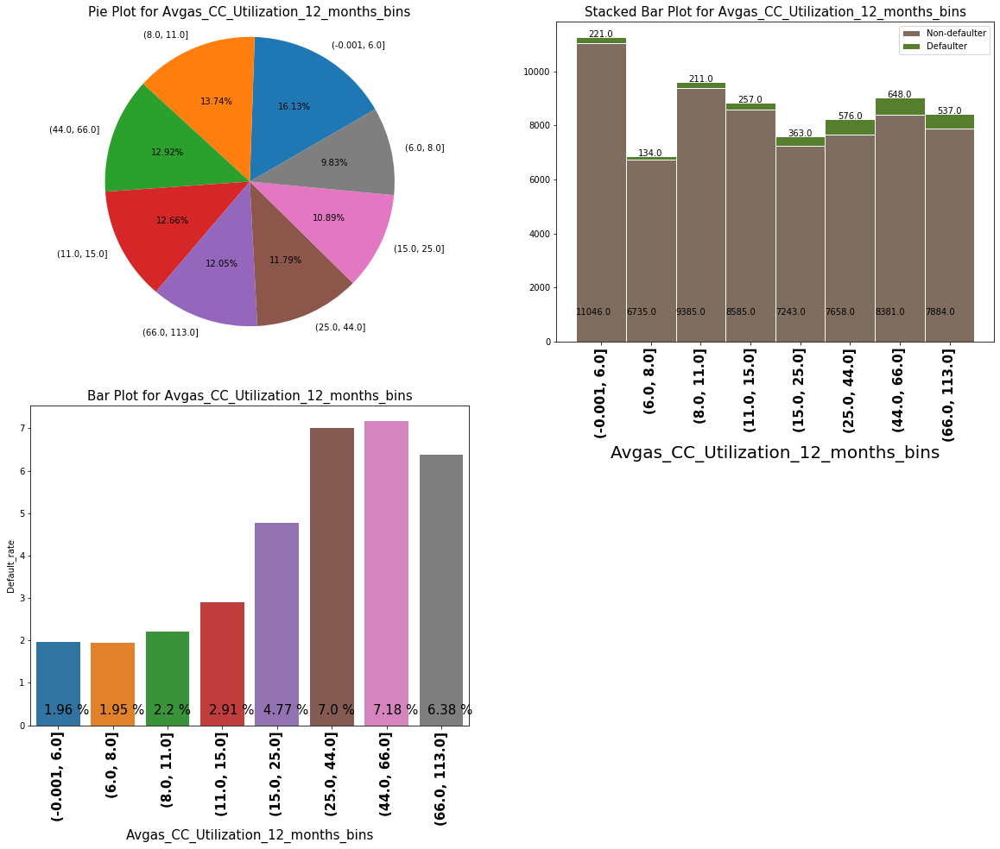

,Avgas_CC_Utilization_12_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 6.0]",221.0,11267,11046.0,1.96
1,"(6.0, 8.0]",134.0,6869,6735.0,1.95
2,"(8.0, 11.0]",211.0,9596,9385.0,2.20
3,"(11.0, 15.0]",257.0,8842,8585.0,2.91
4,"(15.0, 25.0]",363.0,7606,7243.0,4.77
5,"(25.0, 44.0]",576.0,8234,7658.0,7.00
6,"(44.0, 66.0]",648.0,9029,8381.0,7.18
7,"(66.0, 113.0]",537.0,8421,7884.0,6.38


In [120]:
## univariate analysis for Avgas_CC_Utilization_12_months
plot_continuous_num_data(eda_creditbureau,'Avgas_CC_Utilization_12_months')

- The univariate analysis shows that the frequncy distribution is more skewed towards low values of Avgas_CC_Utilization_12_months. 
- It also indicates that the default rate is more when Avgas_CC_Utilization_12_months is more.

In [121]:
## EDA for the Trades_opened_last_6_months variable
eda_creditbureau.Trades_opened_last_6_months.describe()

count    69864.000000
mean     2.285154    
std      2.081912    
min      0.000000    
25%      1.000000    
50%      2.000000    
75%      3.000000    
max      12.000000   
Name: Trades_opened_last_6_months, dtype: float64

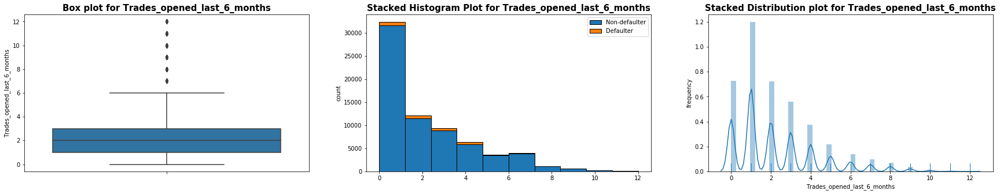

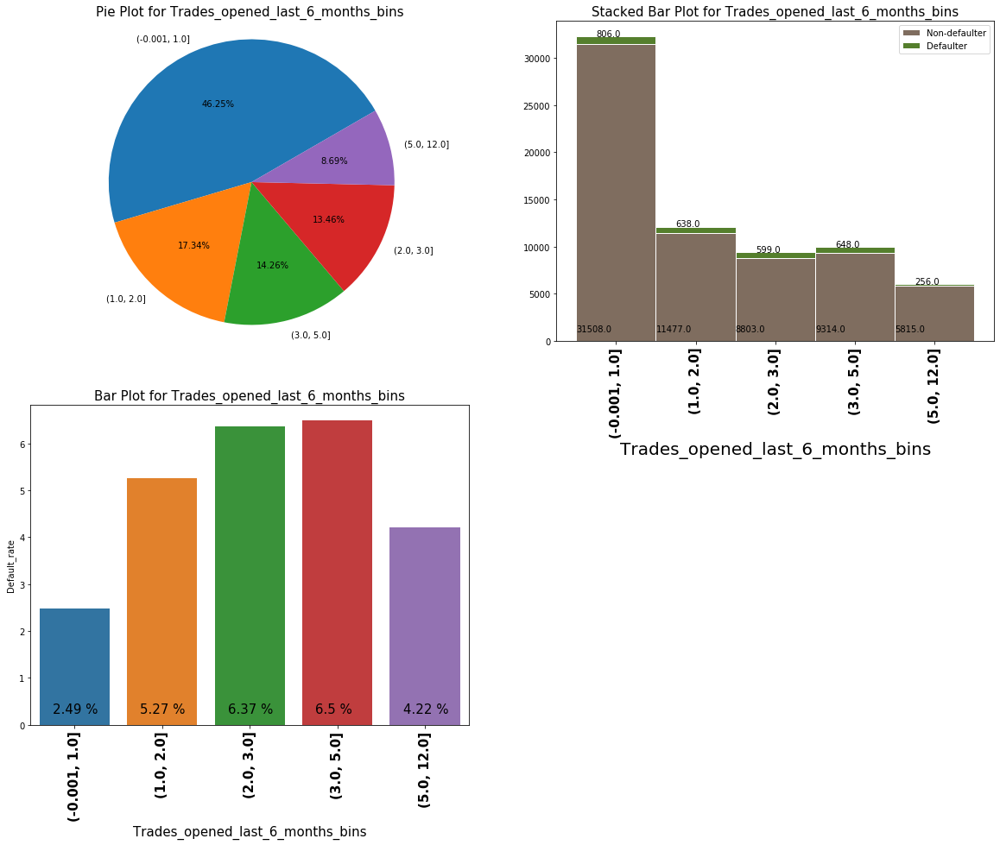

,Trades_opened_last_6_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 1.0]",806.0,32314,31508.0,2.49
1,"(1.0, 2.0]",638.0,12115,11477.0,5.27
2,"(2.0, 3.0]",599.0,9402,8803.0,6.37
3,"(3.0, 5.0]",648.0,9962,9314.0,6.50
4,"(5.0, 12.0]",256.0,6071,5815.0,4.22


In [122]:
## univariate analysis for Trades_opened_last_6_months
plot_continuous_num_data(eda_creditbureau,'Trades_opened_last_6_months')

- again we see the frequency distribution is skewed towards lower values of 'Trades_opened_last_6_months' quite heavily.
- also the default rate increases initally till the value of 5 trades, thereafter decreases across the higher bracker of 5-12 times of trade

In [123]:
## EDA for the Trades_opened_last_12_months variable
eda_creditbureau.Trades_opened_last_12_months.describe()

count    69864.000000
mean     5.785111    
std      5.095480    
min      0.000000    
25%      2.000000    
50%      4.000000    
75%      9.000000    
max      28.000000   
Name: Trades_opened_last_12_months, dtype: float64

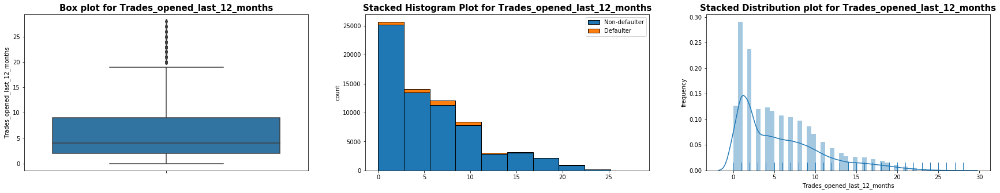

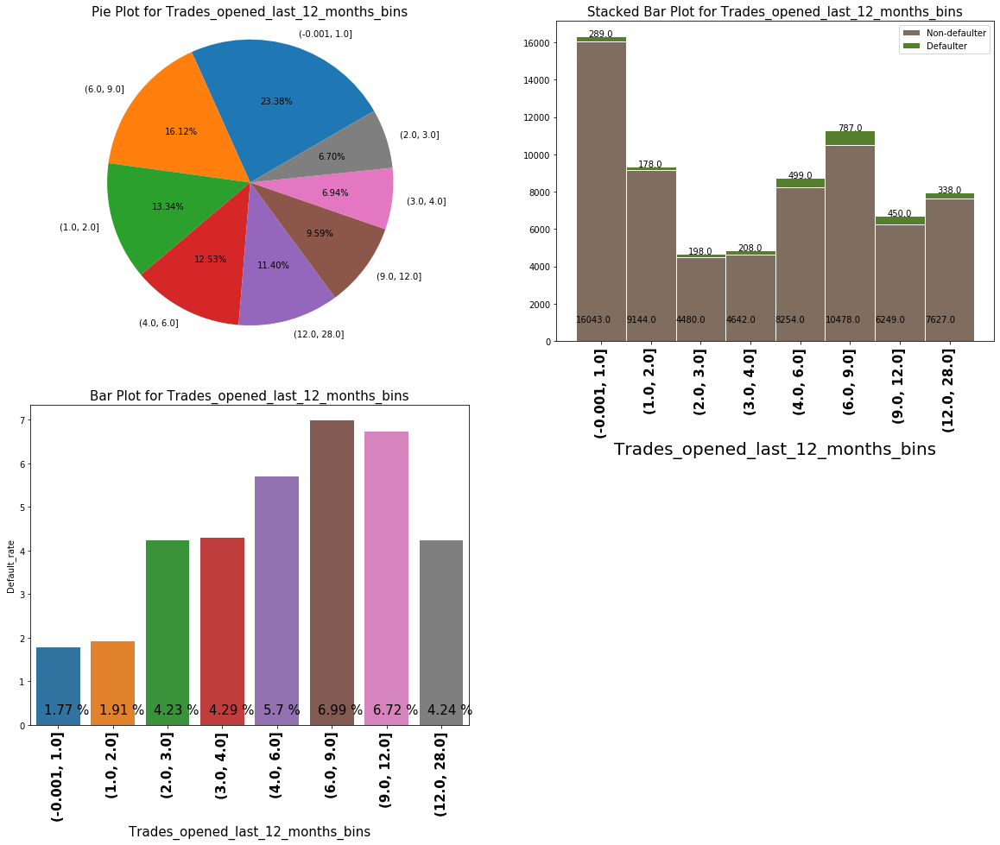

,Trades_opened_last_12_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 1.0]",289.0,16332,16043.0,1.77
1,"(1.0, 2.0]",178.0,9322,9144.0,1.91
2,"(2.0, 3.0]",198.0,4678,4480.0,4.23
3,"(3.0, 4.0]",208.0,4850,4642.0,4.29
4,"(4.0, 6.0]",499.0,8753,8254.0,5.70
5,"(6.0, 9.0]",787.0,11265,10478.0,6.99
6,"(9.0, 12.0]",450.0,6699,6249.0,6.72
7,"(12.0, 28.0]",338.0,7965,7627.0,4.24


In [124]:
## univariate analysis for Trades_opened_last_12_months
plot_continuous_num_data(eda_creditbureau,'Trades_opened_last_12_months')

- The univariate analysis indicates the increase in default rate as values for Trades_opened_last_12_months increase across bins to the max bin of (6,9]. 
- After the (6,9] bin, the default rate show a relatively decreasing trend for maximum bin of (12,28].
- Also after seeing the frequency distribution we found the data to highly skewed towards the lower value of 'Trades_opened_last_12_months'

In [125]:
## EDA for the PL_Trades_opened_last_6_months variable
eda_creditbureau.PL_Trades_opened_last_6_months.describe()

count    69864.000000
mean     1.189626    
std      1.352704    
min      0.000000    
25%      0.000000    
50%      1.000000    
75%      2.000000    
max      6.000000    
Name: PL_Trades_opened_last_6_months, dtype: float64

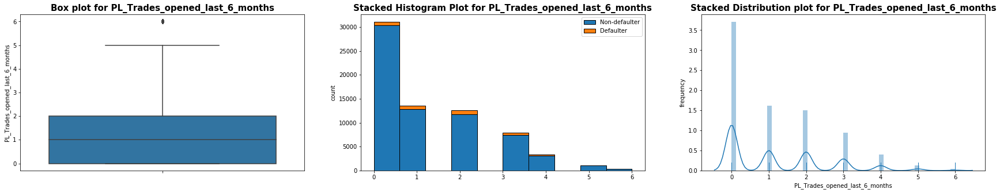

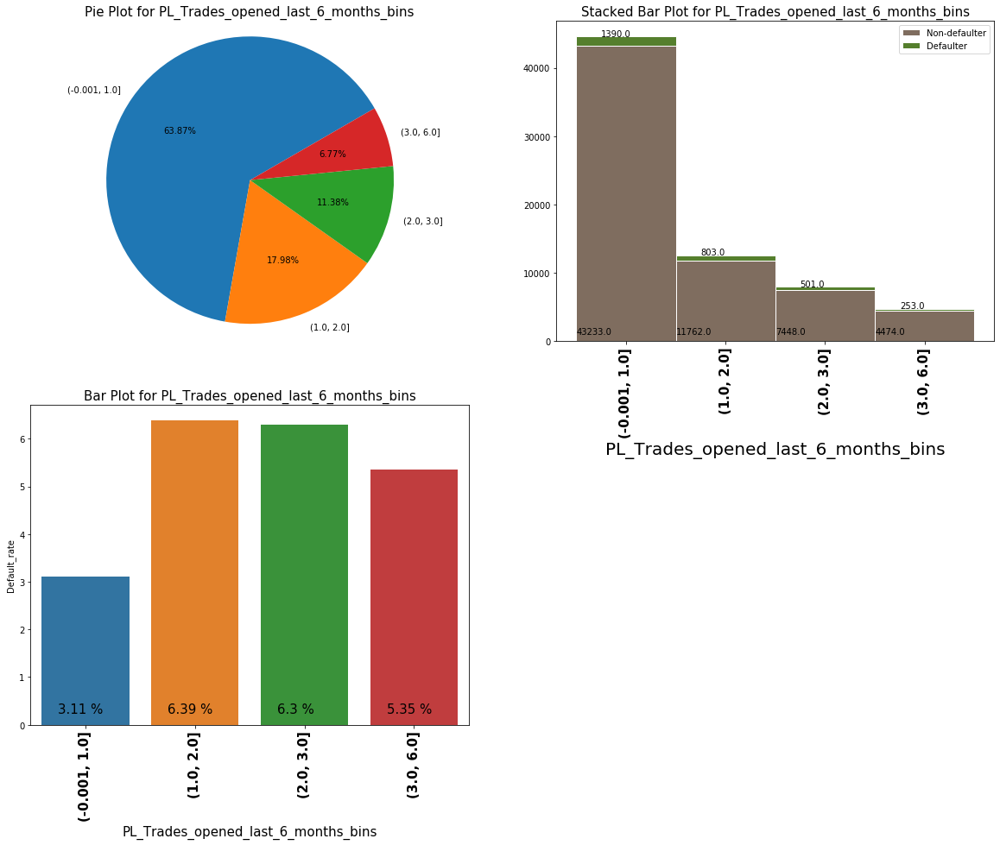

,PL_Trades_opened_last_6_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 1.0]",1390.0,44623,43233.0,3.11
1,"(1.0, 2.0]",803.0,12565,11762.0,6.39
2,"(2.0, 3.0]",501.0,7949,7448.0,6.30
3,"(3.0, 6.0]",253.0,4727,4474.0,5.35


In [126]:
## univariate analysis for PL_Trades_opened_last_6_months
plot_continuous_num_data(eda_creditbureau,'PL_Trades_opened_last_6_months')

- we see the majority of the population lies in the bin (0-1] for 'PL_Trades_opened_last_6_months'
- We see the default rate increases as the 'PL_Trades_opened_last_6_months' increases.

In [127]:
## EDA for the PL_Trades_opened_last_12_months variable
eda_creditbureau.PL_Trades_opened_last_12_months.describe()

count    69864.000000
mean     2.363492    
std      2.423678    
min      0.000000    
25%      0.000000    
50%      2.000000    
75%      4.000000    
max      12.000000   
Name: PL_Trades_opened_last_12_months, dtype: float64

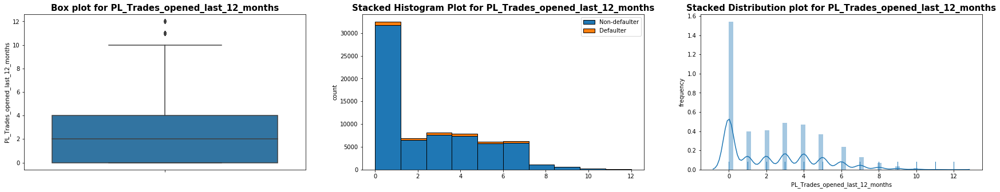

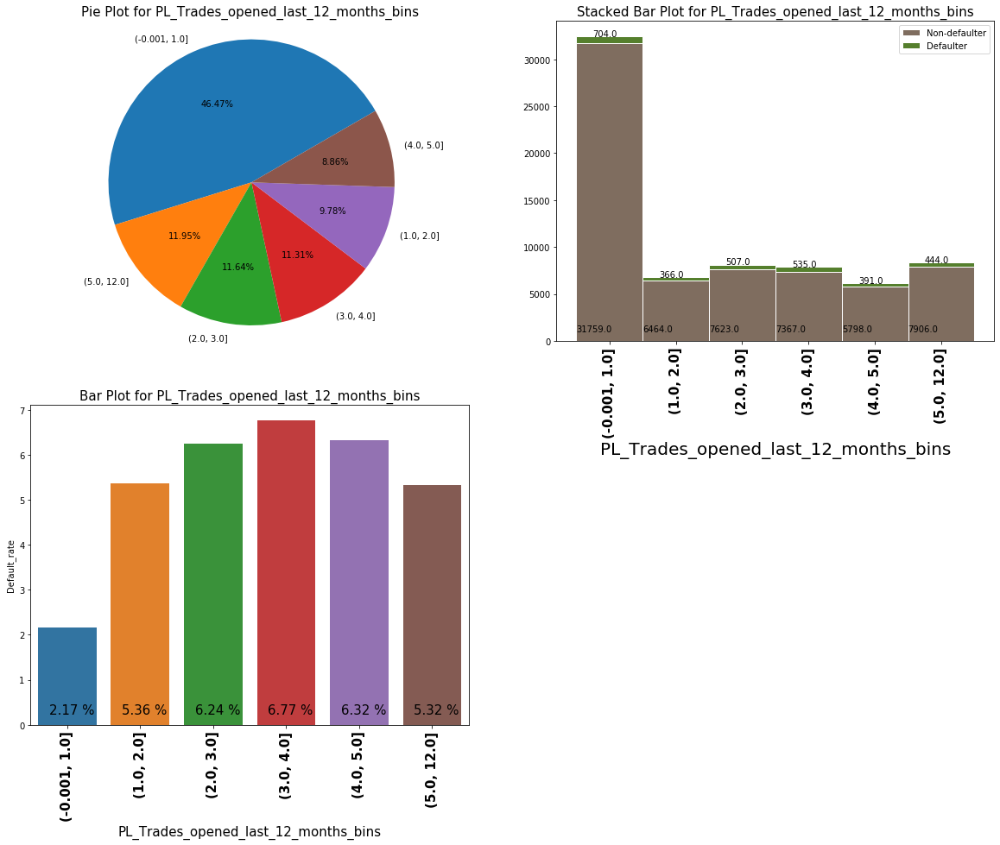

,PL_Trades_opened_last_12_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 1.0]",704.0,32463,31759.0,2.17
1,"(1.0, 2.0]",366.0,6830,6464.0,5.36
2,"(2.0, 3.0]",507.0,8130,7623.0,6.24
3,"(3.0, 4.0]",535.0,7902,7367.0,6.77
4,"(4.0, 5.0]",391.0,6189,5798.0,6.32
5,"(5.0, 12.0]",444.0,8350,7906.0,5.32


In [128]:
## univariate analysis for PL_Trades_opened_last_12_months
plot_continuous_num_data(eda_creditbureau,'PL_Trades_opened_last_12_months')

- we see the default rate increases with increasing bin values in 'PL_Trades_opened_last_12_months' from 0 -4
- post that there is a decreasing trend

In [129]:
## EDA for the Inquiries_last_6_months variable
eda_creditbureau.Inquiries_last_6_months.describe()

count    69864.000000
mean     1.758001    
std      1.985078    
min      0.000000    
25%      0.000000    
50%      1.000000    
75%      3.000000    
max      10.000000   
Name: Inquiries_last_6_months, dtype: float64

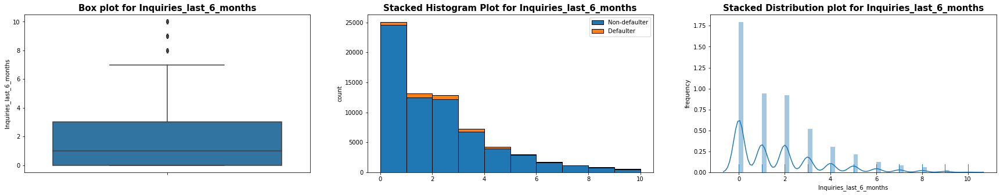

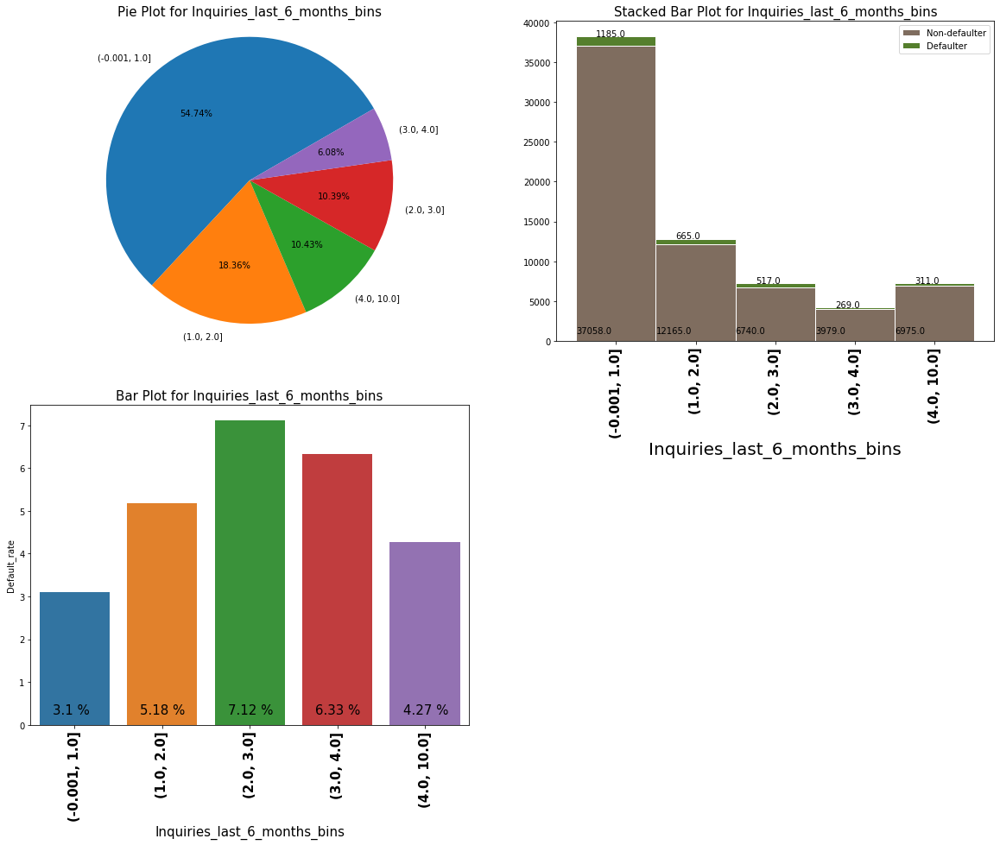

,Inquiries_last_6_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 1.0]",1185.0,38243,37058.0,3.10
1,"(1.0, 2.0]",665.0,12830,12165.0,5.18
2,"(2.0, 3.0]",517.0,7257,6740.0,7.12
3,"(3.0, 4.0]",269.0,4248,3979.0,6.33
4,"(4.0, 10.0]",311.0,7286,6975.0,4.27


In [130]:
## univariate analysis for Inquiries_last_6_months
plot_continuous_num_data(eda_creditbureau,'Inquiries_last_6_months')

- Default rate increases from bin 0-4 then decreases

In [131]:
## EDA for the Inquiries_last_12_months variable
eda_creditbureau.Inquiries_last_12_months.describe()

count    69864.000000
mean     3.525063    
std      3.611805    
min      0.000000    
25%      0.000000    
50%      3.000000    
75%      5.000000    
max      20.000000   
Name: Inquiries_last_12_months, dtype: float64

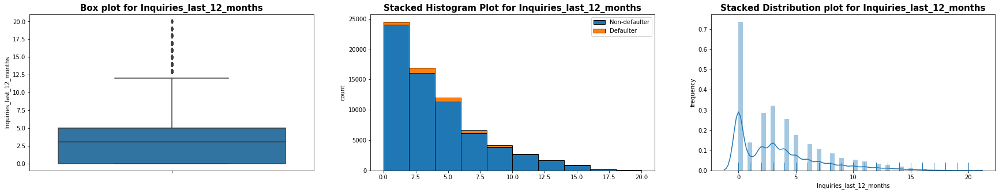

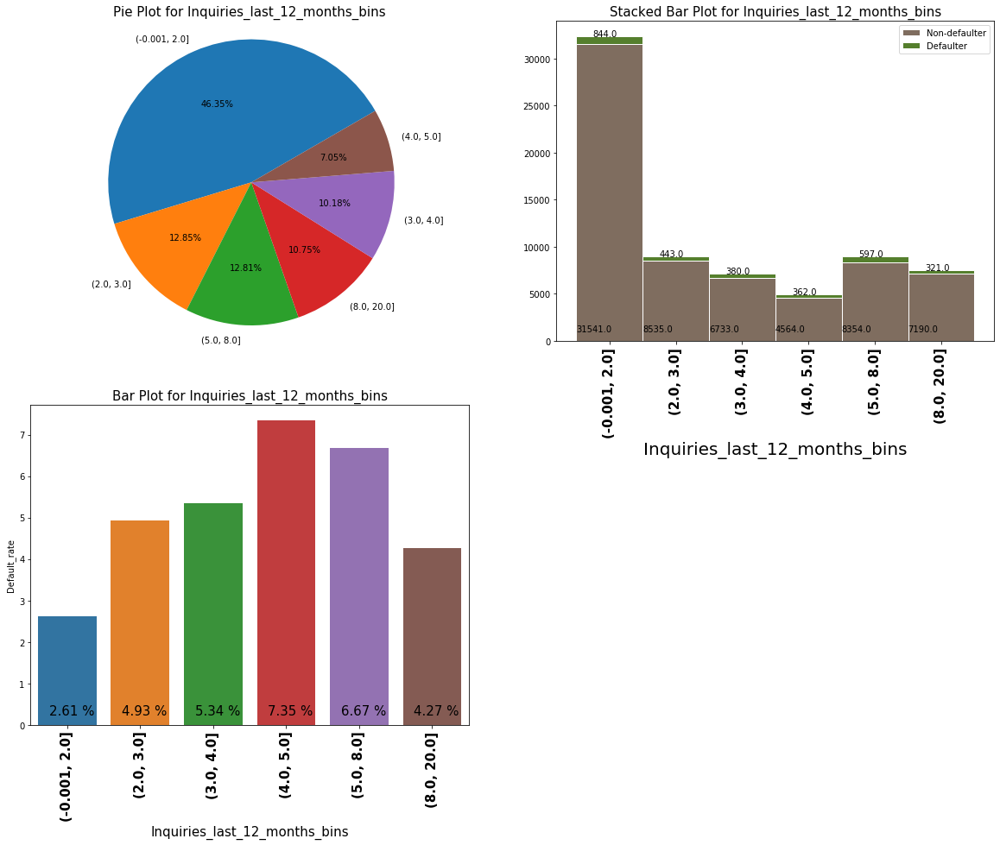

,Inquiries_last_12_months_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 2.0]",844.0,32385,31541.0,2.61
1,"(2.0, 3.0]",443.0,8978,8535.0,4.93
2,"(3.0, 4.0]",380.0,7113,6733.0,5.34
3,"(4.0, 5.0]",362.0,4926,4564.0,7.35
4,"(5.0, 8.0]",597.0,8951,8354.0,6.67
5,"(8.0, 20.0]",321.0,7511,7190.0,4.27


In [132]:
## univariate analysis for Inquiries_last_12_months
plot_continuous_num_data(eda_creditbureau,'Inquiries_last_12_months')

- we see the data is skewed towards the lower counts of enquiry.
- Intrestingy, we see the default rate increases as more number of equires are made by the customer till the count of 5, then starts decreasing.

In [133]:
## EDA for the Presence_open_home_loan variable
eda_creditbureau.Presence_open_home_loan.value_counts()

0.0    51793
1.0    18071
Name: Presence_open_home_loan, dtype: int64

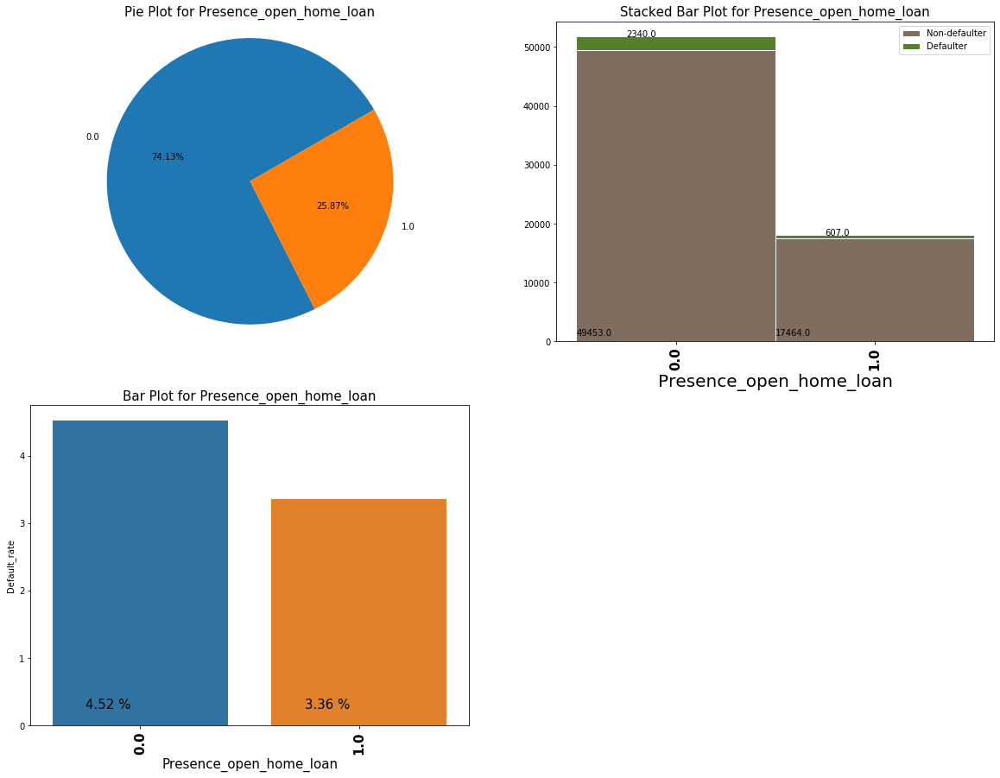

,Presence_open_home_loan,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0.0,2340.0,51793,49453.0,4.52
1,1.0,607.0,18071,17464.0,3.36


In [134]:
## univariate analysis for Presence_open_home_loan
plot_categorical_data(eda_creditbureau,'Presence_open_home_loan')

- We see almost 74% of people do not have any home loan. Therefor 1 out 4 person has home loans among them.
- The default percent for people who ***do not*** have home loans is 4.52%
- The default percent for people who ***Does*** have home loans is 3.36%

In [135]:
## EDA for the Outstanding_Balance variable
eda_creditbureau.Outstanding_Balance.describe()

count    6.986400e+04
mean     1.248530e+06
std      1.286059e+06
min      0.000000e+00
25%      2.066378e+05
50%      7.727460e+05
75%      2.924646e+06
max      5.218801e+06
Name: Outstanding_Balance, dtype: float64

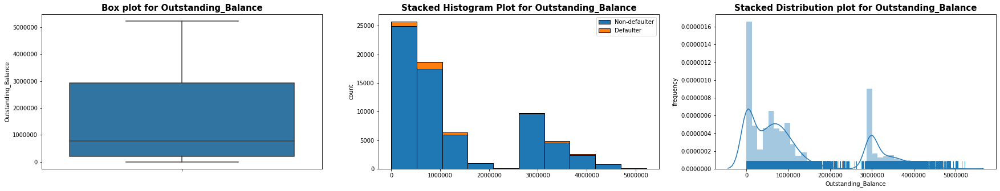

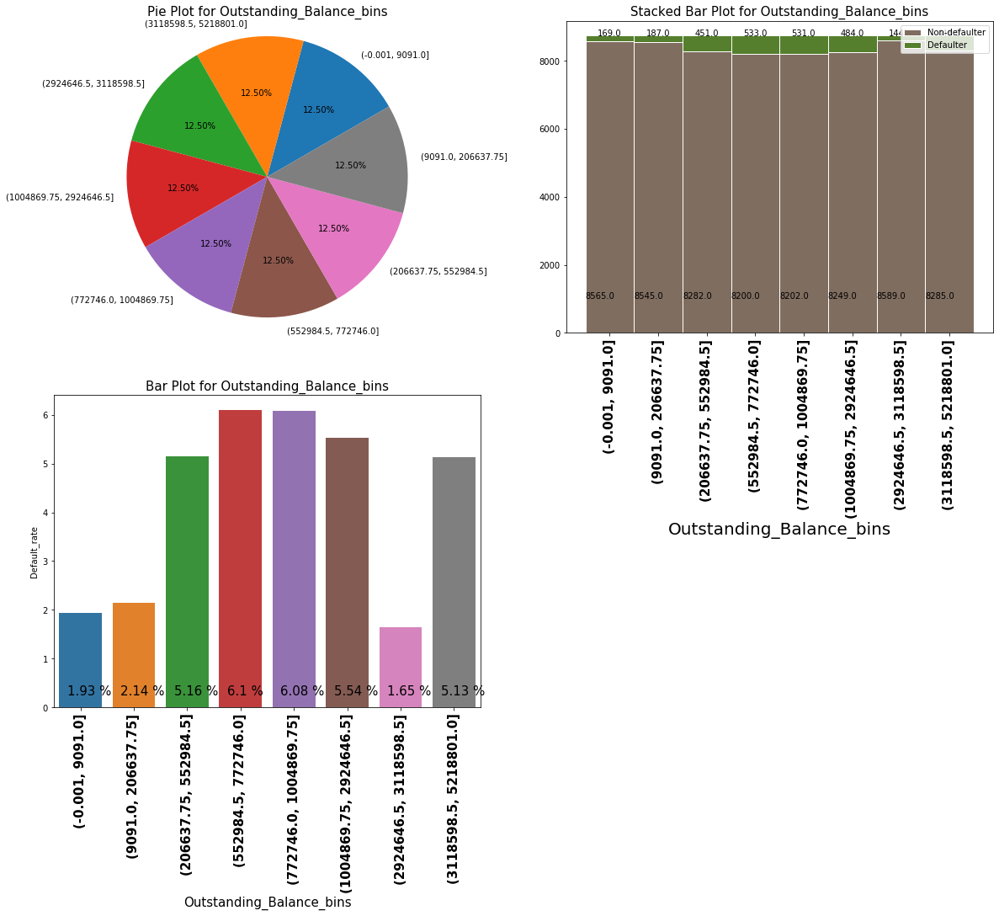

,Outstanding_Balance_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 9091.0]",169.0,8734,8565.0,1.93
1,"(9091.0, 206637.75]",187.0,8732,8545.0,2.14
2,"(206637.75, 552984.5]",451.0,8733,8282.0,5.16
3,"(552984.5, 772746.0]",533.0,8733,8200.0,6.10
4,"(772746.0, 1004869.75]",531.0,8733,8202.0,6.08
5,"(1004869.75, 2924646.5]",484.0,8733,8249.0,5.54
6,"(2924646.5, 3118598.5]",144.0,8733,8589.0,1.65
7,"(3118598.5, 5218801.0]",448.0,8733,8285.0,5.13


In [136]:
## univariate analysis for age
plot_continuous_num_data(eda_creditbureau,'Outstanding_Balance')

- We see for the people who have low outstanding balance on their card( <206638 RS) have very low default rate almost 2%
- but for the people who have more money as outstanding balance has a high default rate (increasing trend). Though there is an Anomoly.
- ***Anomoly, we see that all of sudden in the bin with outstanding balance in b/w (2924646.5, 3118598.5] the default rate drastically decreases to 1.65% from 5.54% in the previous bin.***

In [137]:
## EDA for the Total_Trades variable
eda_creditbureau.Total_Trades.describe()

count    69864.000000
mean     8.174954    
std      7.153028    
min      0.000000    
25%      3.000000    
50%      6.000000    
75%      10.000000   
max      44.000000   
Name: Total_Trades, dtype: float64

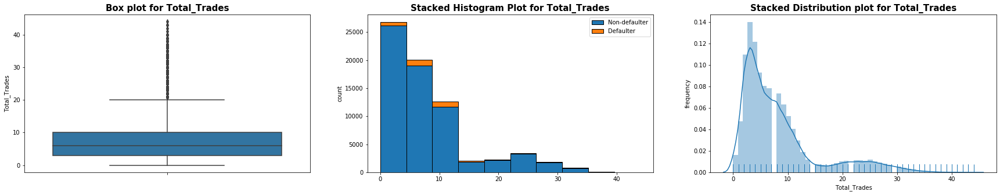

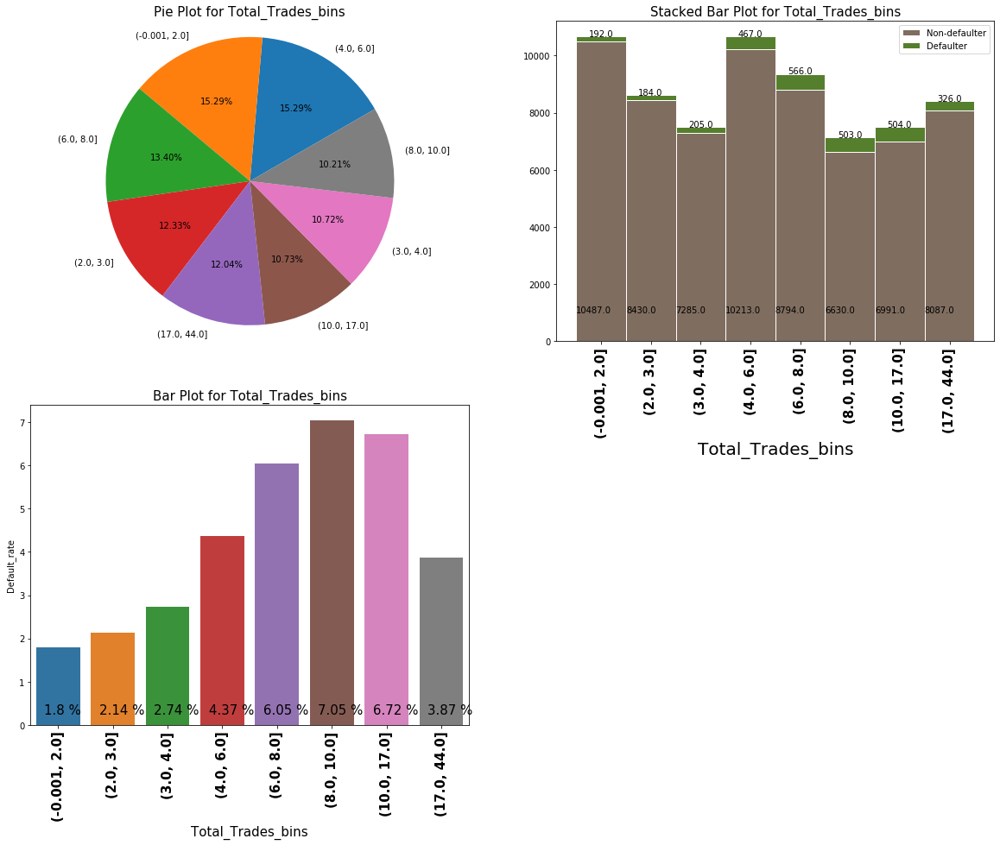

,Total_Trades_bins,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,"(-0.001, 2.0]",192.0,10679,10487.0,1.80
1,"(2.0, 3.0]",184.0,8614,8430.0,2.14
2,"(3.0, 4.0]",205.0,7490,7285.0,2.74
3,"(4.0, 6.0]",467.0,10680,10213.0,4.37
4,"(6.0, 8.0]",566.0,9360,8794.0,6.05
5,"(8.0, 10.0]",503.0,7133,6630.0,7.05
6,"(10.0, 17.0]",504.0,7495,6991.0,6.72
7,"(17.0, 44.0]",326.0,8413,8087.0,3.87


In [138]:
## univariate analysis for Total_Trades
plot_continuous_num_data(eda_creditbureau,'Total_Trades')

- The univariate analysis shows the monotonically increasing trend of the default rate as we move across bins from 0 to 10. The bins after the Total_Trades values of 10 show a decrease in default rate.
- Also we see the mojority of the popultation is skewed towards lower count of total_trades.

In [139]:
## EDA for the Presence_open_auto_loan variable
eda_creditbureau.Presence_open_auto_loan.value_counts()

0    63935
1    5929 
Name: Presence_open_auto_loan, dtype: int64

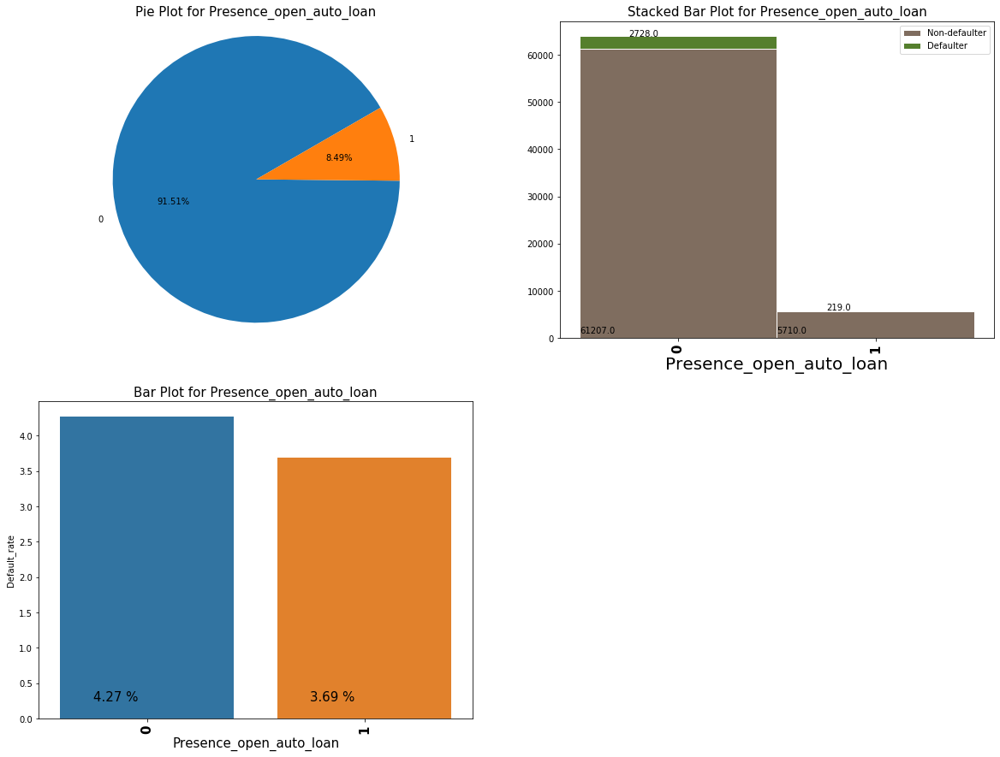

,Presence_open_auto_loan,count_prospects,No_of_prospects,No_non_prospects,Default_rate
0,0,2728.0,63935,61207.0,4.27
1,1,219.0,5929,5710.0,3.69


In [140]:
## univariate analysis for Presence_open_auto_loan
plot_categorical_data(eda_creditbureau,'Presence_open_auto_loan')

- We see the mojority of the people do not have auto loans(91.5%)
- Also we see people who do not have auto loan upon them tend to default more than those with have auto loan upon them.

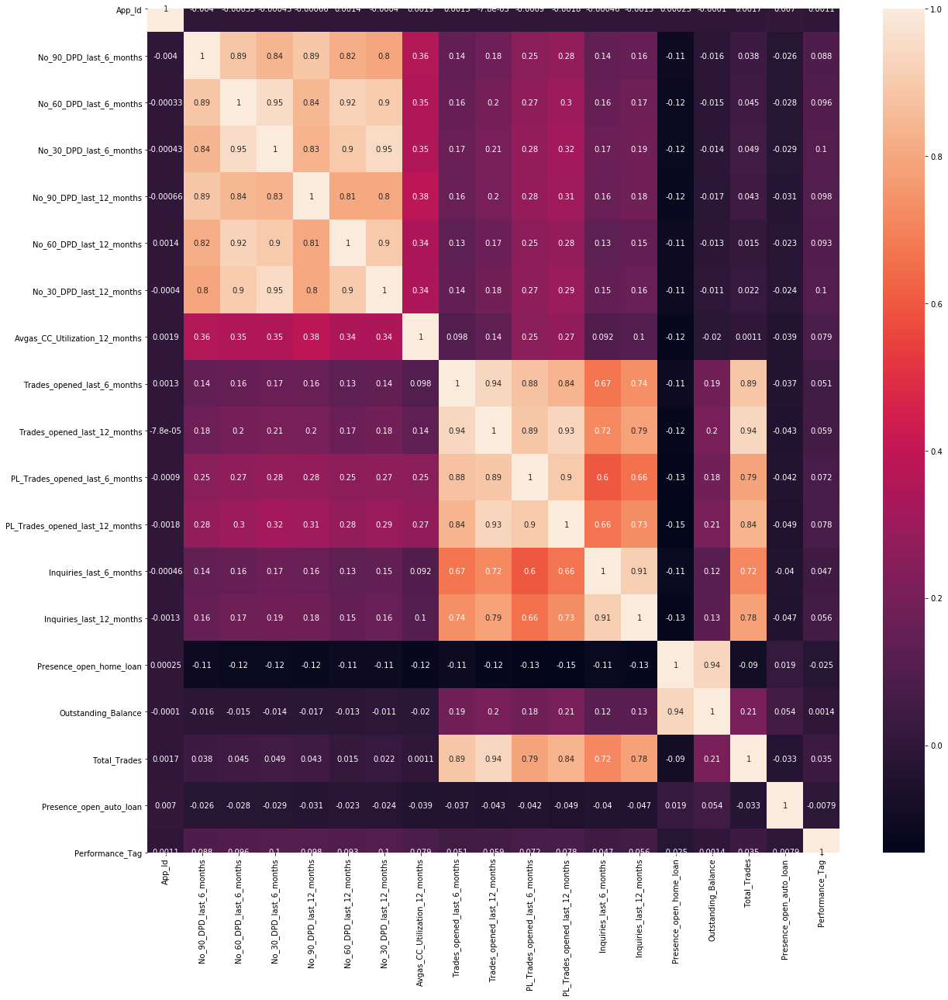

In [141]:
## Let's bivariate analysis using correlation matrix
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(CreditBureau.corr(),annot = True)
plt.show()

- We see heavy corelation bw variables in the credit bureu dataset.

# 6.) WOE AND IV ANALYSIS OF CREDIT BUREAU DATA

In [142]:
## evaluating woe and iv for creditbureau data. Data without any imputation
iv_creditbureau, woe_creditbureau = iv_woe(data = CreditBureau_no_impute.drop(['App_Id'],axis=1), target = 'Performance_Tag', 
                              bins=8, show_woe = True)

Information value of No_90_DPD_last_6_months is 0.162983
                  Variable  Cutoff      N  Defaults  % of Defaults  \
0  No_90_DPD_last_6_months  0       54666  1794.0    0.608548        
1  No_90_DPD_last_6_months  1       13220  971.0     0.329376        
2  No_90_DPD_last_6_months  2       1776   160.0     0.054274        
3  No_90_DPD_last_6_months  3       208    23.0      0.007802        

   Non-Defaults  % of Non-Defaults       WoE        IV  
0  52872.0       0.790054          -0.261025  0.047378  
1  12249.0       0.183034           0.587528  0.085980  
2  1616.0        0.024148           0.809865  0.024398  
3  185.0         0.002764           1.037539  0.005227  
Information value of No_60_DPD_last_6_months is 0.211539
                  Variable  Cutoff      N  Defaults  % of Defaults  \
0  No_60_DPD_last_6_months  0       51871  1582.0    0.536635        
1  No_60_DPD_last_6_months  1       11132  784.0     0.265943        
2  No_60_DPD_last_6_months  2       4917

Information value of PL_Trades_opened_last_12_months is 0.25619
                          Variable         Cutoff      N  Defaults  \
0  PL_Trades_opened_last_12_months  (-0.001, 1.0]  32466  704.0      
1  PL_Trades_opened_last_12_months  (1.0, 2.0]     6830   366.0      
2  PL_Trades_opened_last_12_months  (2.0, 3.0]     8131   508.0      
3  PL_Trades_opened_last_12_months  (3.0, 4.0]     7904   535.0      
4  PL_Trades_opened_last_12_months  (4.0, 5.0]     6189   391.0      
5  PL_Trades_opened_last_12_months  (5.0, 12.0]    8350   444.0      

   % of Defaults  Non-Defaults  % of Non-Defaults       WoE        IV  
0  0.238806       31762.0       0.474612          -0.686847  0.161963  
1  0.124152       6464.0        0.096590           0.251031  0.006919  
2  0.172320       7623.0        0.113909           0.413957  0.024180  
3  0.181479       7369.0        0.110113           0.499630  0.035656  
4  0.132632       5798.0        0.086638           0.425840  0.019586  
5  0.150611  

In [143]:
## displaying the WoE and IV values for all variables for data set
woe_creditbureau.sort_values(by=['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
5,0.000170,0.000015,NULL,0.0,0.000376,1,1.0,Trades_opened_last_6_months,2.429254,0.000,0.000
3,0.219810,0.139177,"(3.0, 5.0]",648.0,0.036851,9962,9314.0,Trades_opened_last_6_months,0.457018,5.000,3.000
2,0.203189,0.131556,"(2.0, 3.0]",599.0,0.031139,9403,8804.0,Trades_opened_last_6_months,0.434701,3.000,2.000
1,0.216757,0.171513,"(1.0, 2.0]",639.0,0.010592,12117,11478.0,Trades_opened_last_6_months,0.234118,2.000,1.000
4,0.086839,0.086892,"(5.0, 12.0]",256.0,0.000000,6071,5815.0,Trades_opened_last_6_months,-0.000618,12.000,5.000
0,0.273406,0.470847,"(-0.001, 1.0]",806.0,0.107324,32316,31510.0,Trades_opened_last_6_months,-0.543576,1.000,-0.001
5,0.266961,0.156585,"(6.0, 9.0]",787.0,0.058885,11266,10479.0,Trades_opened_last_12_months,0.533501,9.000,6.000
6,0.152646,0.093377,"(9.0, 12.0]",450.0,0.029129,6699,6249.0,Trades_opened_last_12_months,0.491472,12.000,9.000
4,0.169607,0.123353,"(4.0, 6.0]",500.0,0.014729,8755,8255.0,Trades_opened_last_12_months,0.318435,6.000,4.000
3,0.070556,0.069364,"(3.0, 4.0]",208.0,0.000020,4850,4642.0,Trades_opened_last_12_months,0.017038,4.000,3.000


In [144]:
## displaying the consolidate IV values for each variable in data set
iv_creditbureau.sort_values(by='IV', ascending = False)

,Variable,IV
0,Avgas_CC_Utilization_12_months,0.308880
0,Trades_opened_last_12_months,0.291790
0,PL_Trades_opened_last_12_months,0.256190
0,Outstanding_Balance,0.251292
0,No_30_DPD_last_6_months,0.244460
0,Total_Trades,0.238446
0,PL_Trades_opened_last_6_months,0.224342
0,No_90_DPD_last_12_months,0.216015
0,No_60_DPD_last_6_months,0.211539
0,No_30_DPD_last_12_months,0.191285


In [145]:
## evaluating the overall IV for the creditbureau dataset
iv_creditbureau.IV.sum()

3.2598040000000004

By convention the values of the IV statistic can be interpreted as follows. If the IV statistic is:

- Less than 0.02, then the predictor is not useful for modeling (separating the Goods from the Bads)

- 0.02 to 0.1, then the predictor has only a weak relationship to the Goods/Bads odds ratio

- 0.1 to 0.3, then the predictor has a medium strength relationship to the Goods/Bads odds ratio

- 0.3 or higher, then the predictor has a strong relationship to the Goods/Bads odds ratio.

***So here we see our total IV is 3.25, which means that the credit bureau data has a very strong Relationship with the default rate %.***

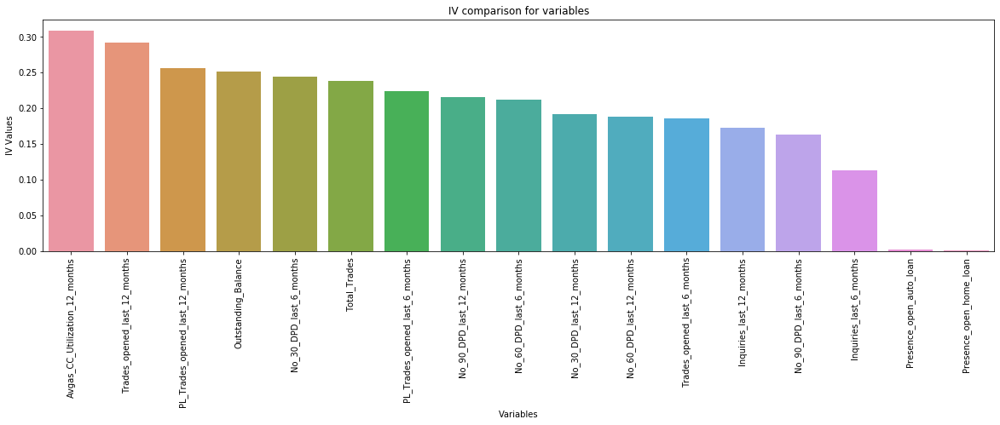

In [146]:
## plotting all the consolidated IV values of the creditbureau variable
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_creditbureau.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

- we see 'Avgas_CC_Utilization_12_months' has the highest IV value followed by Trades_opened_last_12_months

# 7.) Merging the the data of demographics and CreditBureau

In [147]:
# Merging both the data frames
all_demographics_cb_data = pd.merge(demographics,CreditBureau, how='inner', on = "App_Id")
all_demographics_cb_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [148]:
## chekcing info on the merge data
all_demographics_cb_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69864 entries, 0 to 69863
Data columns (total 30 columns):
App_Id                             69864 non-null int64
Age                                69864 non-null int64
Gender                             69864 non-null object
Marital_Status                     69864 non-null object
Dependents_No                      69864 non-null float64
Income                             69864 non-null float64
Education                          69864 non-null object
Profession                         69864 non-null object
Residence_Type                     69864 non-null object
Months_Current_Residence           69864 non-null int64
Months_Current_Company             69864 non-null int64
Performance_Tag_x                  69864 non-null float64
No_90_DPD_last_6_months            69864 non-null int64
No_60_DPD_last_6_months            69864 non-null int64
No_30_DPD_last_6_months            69864 non-null int64
No_90_DPD_last_12_months           69864

In [149]:
## describing the merged data
all_demographics_cb_data.describe()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
count,6.986400e+04,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,6.986400e+04,69864.000000,69864.000000,69864.000000
mean,4.992094e+08,45.002276,2.859498,27.441143,34.606550,34.198657,0.042182,0.248969,0.391661,0.523474,0.414820,0.603372,0.733854,28.996307,2.285154,5.785111,1.189626,2.363492,1.758001,3.525063,0.258660,1.248530e+06,8.174954,0.084865,0.042182
std,2.885582e+08,9.907562,1.385537,15.446719,36.844678,20.349579,0.201006,0.505660,0.771877,1.000733,0.763497,1.021752,1.243158,29.390252,2.081912,5.095480,1.352704,2.423678,1.985078,3.611805,0.437901,1.286059e+06,7.153028,0.278683,0.201006
min,1.004500e+05,18.000000,1.000000,0.000000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.485587e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.066378e+05,3.000000,0.000000,0.000000
50%,4.979556e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,4.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.727460e+05,6.000000,0.000000,0.000000
75%,7.498606e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,44.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.924646e+06,10.000000,0.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [150]:
# Merging both the data frame with no imputation
all_demographics_cb_no_impute_data = pd.merge(demographics_no_impute,CreditBureau_no_impute, how='inner', on = "App_Id")
all_demographics_cb_no_impute_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [151]:
## getting the info for no impute data
all_demographics_cb_no_impute_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69876 entries, 0 to 69875
Data columns (total 30 columns):
App_Id                             69876 non-null int64
Age                                69876 non-null int64
Gender                             69874 non-null object
Marital_Status                     69870 non-null object
Dependents_No                      69873 non-null float64
Income                             69876 non-null float64
Education                          69758 non-null object
Profession                         69863 non-null object
Residence_Type                     69868 non-null object
Months_Current_Residence           69876 non-null int64
Months_Current_Company             69876 non-null int64
Performance_Tag_x                  69876 non-null float64
No_90_DPD_last_6_months            69876 non-null int64
No_60_DPD_last_6_months            69876 non-null int64
No_30_DPD_last_6_months            69876 non-null int64
No_90_DPD_last_12_months           69876

In [152]:
## describing the no impute dataset
all_demographics_cb_no_impute_data.describe()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
count,6.987600e+04,69876.000000,69873.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,69876.000000,68853.000000,69875.000000,69876.000000,69876.000000,69876.00000,69876.000000,69876.000000,69604.000000,6.960400e+04,69876.000000,69876.000000,69876.000000
mean,4.992434e+08,44.995220,2.859631,27.407644,34.609737,34.199711,0.042203,0.248984,0.391708,0.523556,0.414863,0.603440,0.733957,29.266858,2.285038,5.784776,1.189507,2.36343,1.757957,3.525001,0.259626,1.253266e+06,8.174438,0.084879,0.042203
std,2.885457e+08,9.930364,1.385543,15.476056,36.846632,20.350871,0.201054,0.505656,0.771881,1.000781,0.763539,1.021762,1.243207,29.517220,2.081805,5.095204,1.352634,2.42358,1.984950,3.611588,0.438432,1.286138e+06,7.152568,0.278703,0.201054
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.486104e+08,37.000000,2.000000,14.000000,6.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.00000,0.000000,0.000000,0.000000,2.083862e+05,3.000000,0.000000,0.000000
50%,4.980651e+08,45.000000,3.000000,27.000000,10.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,4.000000,1.000000,2.00000,1.000000,3.000000,0.000000,7.742220e+05,6.000000,0.000000,0.000000
75%,7.498676e+08,53.000000,4.000000,40.000000,61.000000,51.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,45.000000,3.000000,9.000000,2.000000,4.00000,3.000000,5.000000,1.000000,2.926172e+06,10.000000,0.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.00000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [153]:
## cheking the no impute data for different Performance tags
all_demographics_cb_no_impute_data[
    ~(all_demographics_cb_no_impute_data.Performance_Tag_x == all_demographics_cb_no_impute_data.Performance_Tag_y)]

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
5244,653287861,26,M,Married,3.0,25.0,Bachelor,SAL,Rented,112,58,0.0,1,1,1,2,2,2,113.0,2.0,5,1,3,1,3,0.0,628075.0,6,0,1.0
5245,653287861,40,M,Married,5.0,32.0,Phd,SE,Rented,45,46,1.0,0,0,0,0,0,0,15.0,0.0,0,0,0,0,0,0.0,10494.0,2,0,0.0


There is one redundant Performance Tag value among demographic and credit breau data. Removing that value.

In [154]:
## removing the redundent 'performance_tag'
all_demographics_cb_no_impute_data = all_demographics_cb_no_impute_data.drop(['Performance_Tag_y'],axis=1)
all_demographics_cb_no_impute_data = all_demographics_cb_no_impute_data.rename({'Performance_Tag_x':'Performance_Tag'
                                                                               },axis=1)
all_demographics_cb_no_impute_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0


#### Evaluating WoE for the combined data (demographics and CreditBureau)

In [155]:
## evaluating woe and iv for combined demographics and creditbureau data (without any imputation)
iv_all, woe_all = iv_woe(data = all_demographics_cb_no_impute_data.drop(['App_Id'],axis=1), target = 'Performance_Tag', 
                              bins=8, show_woe = True)

Information value of Age is 0.005017
  Variable          Cutoff      N  Defaults  % of Defaults  Non-Defaults  \
0  Age      (-3.001, 33.0]  10102  414.0     0.140387       9688.0         
1  Age      (33.0, 37.0]    7384   326.0     0.110546       7058.0         
2  Age      (37.0, 41.0]    9448   438.0     0.148525       9010.0         
3  Age      (41.0, 45.0]    9238   375.0     0.127162       8863.0         
4  Age      (45.0, 49.0]    9090   398.0     0.134961       8692.0         
5  Age      (49.0, 53.0]    9093   333.0     0.112920       8760.0         
6  Age      (53.0, 57.0]    7622   335.0     0.113598       7287.0         
7  Age      (57.0, 65.0]    7899   330.0     0.111902       7569.0         

   % of Non-Defaults       WoE        IV  
0  0.144755          -0.030641  0.000134  
1  0.105458           0.047117  0.000240  
2  0.134624           0.098265  0.001366  
3  0.132428          -0.040578  0.000214  
4  0.129873           0.038430  0.000196  
5  0.130889         

                  Variable  Cutoff      N  Defaults  % of Defaults  \
0  No_60_DPD_last_6_months  0       51874  1583.0    0.536792        
1  No_60_DPD_last_6_months  1       11134  784.0     0.265853        
2  No_60_DPD_last_6_months  2       4918   389.0     0.131909        
3  No_60_DPD_last_6_months  3       1469   148.0     0.050187        
4  No_60_DPD_last_6_months  4       411    39.0      0.013225        
5  No_60_DPD_last_6_months  5       70     6.0       0.002035        

   Non-Defaults  % of Non-Defaults       WoE        IV  
0  50291.0       0.751431          -0.336368  0.072198  
1  10350.0       0.154646           0.541804  0.060252  
2  4529.0        0.067671           0.667459  0.042876  
3  1321.0        0.019738           0.933204  0.028415  
4  372.0         0.005558           0.866804  0.006645  
5  64.0          0.000956           0.755013  0.000814  
Information value of No_30_DPD_last_6_months is 0.244069
                  Variable  Cutoff      N  Defaults  

                         Variable  Cutoff      N  Defaults  % of Defaults  \
0  PL_Trades_opened_last_6_months  0       31084  700.0     0.237369        
1  PL_Trades_opened_last_6_months  1       13551  692.0     0.234656        
2  PL_Trades_opened_last_6_months  2       12565  803.0     0.272296        
3  PL_Trades_opened_last_6_months  3       7949   501.0     0.169888        
4  PL_Trades_opened_last_6_months  4       3341   197.0     0.066802        
5  PL_Trades_opened_last_6_months  5       1090   48.0      0.016277        
6  PL_Trades_opened_last_6_months  6       296    8.0       0.002713        

   Non-Defaults  % of Non-Defaults       WoE        IV  
0  30384.0       0.453987          -0.648455  0.140467  
1  12859.0       0.192135           0.199923  0.008501  
2  11762.0       0.175744           0.437862  0.042276  
3  7448.0        0.111285           0.423042  0.024791  
4  3144.0        0.046977           0.352089  0.006980  
5  1042.0        0.015569           0.044

In [156]:
## displaying the WoE and IV values for all variables for combined demographics and creditbureau data set
woe_all.sort_values(by=['Variable','WoE'], ascending = False)

,% of Defaults,% of Non-Defaults,Cutoff,Defaults,IV,N,Non-Defaults,Variable,WoE,max_val,min_val
5,0.000170,0.000015,NULL,0.0,0.000376,1,1.0,Trades_opened_last_6_months,2.428989,0.000,0.000
3,0.219736,0.139167,"(3.0, 5.0]",648.0,0.036800,9962,9314.0,Trades_opened_last_6_months,0.456753,5.000,3.000
2,0.203120,0.131561,"(2.0, 3.0]",599.0,0.031079,9404,8805.0,Trades_opened_last_6_months,0.434323,3.000,2.000
1,0.216684,0.171530,"(1.0, 2.0]",639.0,0.010551,12119,11480.0,Trades_opened_last_6_months,0.233679,2.000,1.000
4,0.086809,0.086886,"(5.0, 12.0]",256.0,0.000000,6071,5815.0,Trades_opened_last_6_months,-0.000882,12.000,5.000
0,0.273652,0.470841,"(-0.001, 1.0]",807.0,0.107007,32319,31512.0,Trades_opened_last_6_months,-0.542664,1.000,-0.001
5,0.266870,0.156589,"(6.0, 9.0]",787.0,0.058796,11267,10480.0,Trades_opened_last_12_months,0.533141,9.000,6.000
6,0.152594,0.093370,"(9.0, 12.0]",450.0,0.029091,6699,6249.0,Trades_opened_last_12_months,0.491207,12.000,9.000
4,0.169549,0.123373,"(4.0, 6.0]",500.0,0.014681,8757,8257.0,Trades_opened_last_12_months,0.317928,6.000,4.000
3,0.070532,0.069359,"(3.0, 4.0]",208.0,0.000020,4850,4642.0,Trades_opened_last_12_months,0.016774,4.000,3.000


In [157]:
## displaying the consolidate IV values for each variable in combined demographics and creditbureau data set
iv_all.sort_values(by='IV', ascending = False)

,Variable,IV
0,Avgas_CC_Utilization_12_months,0.308443
0,Trades_opened_last_12_months,0.290923
0,PL_Trades_opened_last_12_months,0.255559
0,Outstanding_Balance,0.250632
0,No_30_DPD_last_6_months,0.244069
0,Total_Trades,0.237617
0,PL_Trades_opened_last_6_months,0.223780
0,No_90_DPD_last_12_months,0.215684
0,No_60_DPD_last_6_months,0.211200
0,No_30_DPD_last_12_months,0.190981


In [158]:
## evaluating the overall IV for the combined dataset
iv_all.IV.sum()

3.399516

By convention the values of the IV statistic can be interpreted as follows. If the IV statistic is:

- Less than 0.02, then the predictor is not useful for modeling (separating the Goods from the Bads)

- 0.02 to 0.1, then the predictor has only a weak relationship to the Goods/Bads odds ratio

- 0.1 to 0.3, then the predictor has a medium strength relationship to the Goods/Bads odds ratio

- 0.3 or higher, then the predictor has a strong relationship to the Goods/Bads odds ratio.

***So here we see our total IV is 3.39, which means that the credit bureau data has a very strong Relationship with the default rate %.***

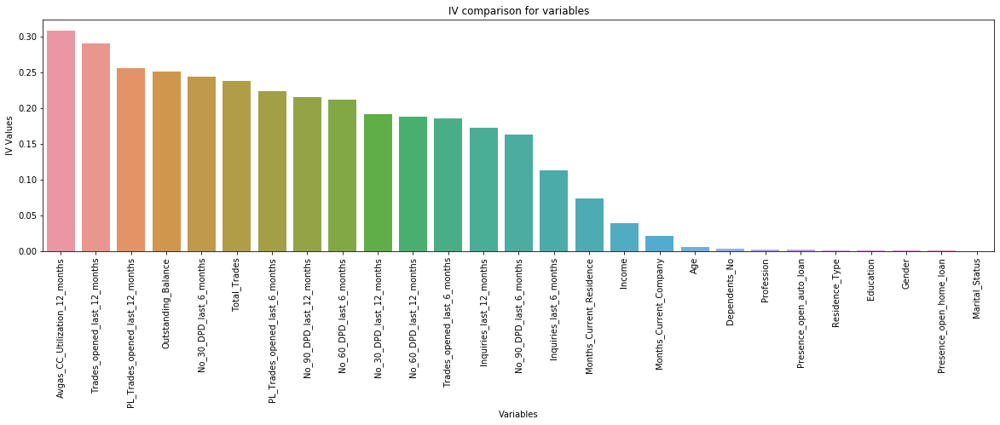

In [159]:
## plotting all the consolidated IV values of the combined dataset
plt.figure(figsize=(20,5))
ax = sns.barplot(x='Variable', y='IV', data=iv_all.sort_values(by='IV', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('IV comparison for variables')
plt.xlabel('Variables')
plt.ylabel('IV Values')
plt.show()

We could see the significane of variables in the decreasing order. Avgas_CC_Utilization_12_months, Trades_opened_last_12_months, PL_Trades_opened_last_12_months, Outstanding_Balance and No_30_DPD_last_6_months.

#### Creating WoE Dataframe from original dataframe for Combined data

In [160]:
## creating WoE dataframe of combined data
woe_all_data = create_woe_dataframe(all_demographics_cb_no_impute_data,woe_all)
woe_all_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,954457215.0,0.038430,0.031600,-0.003867,-0.085864,-0.205896,0.016619,-0.028772,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046
1,432830445.0,-0.030641,-0.009922,-0.003867,-0.026213,-0.331147,-0.018719,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.817924,0.038894,0.012046
2,941387308.0,-0.030641,-0.009922,0.022652,-0.085864,-0.179334,0.016619,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.795097,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.873160,0.012046
3,392161677.0,-0.040578,-0.009922,-0.003867,0.039511,-0.331147,0.016619,0.093815,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.673300,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,0.203881,-0.448426,-0.139116
4,182011211.0,0.047117,0.031600,-0.003867,0.007785,-0.179334,-0.018719,-0.028772,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.464817,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046


In [161]:
## saving the WoE dataframe to csv file
woe_all_data.to_csv('woe_all_data.csv',index=False)

# 8. )Model Building

## 8.1.) Models Building for Demographic Data (Non-transformed)

Building Data on Demographic Data( Cleaned)

In [162]:
# Copy the  demographics_original to demo
demographics_model_df = demographics.copy()

demographics_model_df.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [163]:
demographics_model_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69864 entries, 0 to 71294
Data columns (total 12 columns):
App_Id                      69864 non-null int64
Age                         69864 non-null int64
Gender                      69864 non-null object
Marital_Status              69864 non-null object
Dependents_No               69864 non-null float64
Income                      69864 non-null float64
Education                   69864 non-null object
Profession                  69864 non-null object
Residence_Type              69864 non-null object
Months_Current_Residence    69864 non-null int64
Months_Current_Company      69864 non-null int64
Performance_Tag             69864 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.9+ MB


In [164]:
demographics_model_df.shape

(69864, 12)

### Creating Dummies

In [165]:
# Creating a dummy variable for the variable 'Gender' and dropping the first one.
Gender = pd.get_dummies(demographics_model_df['Gender'],prefix='Gender',drop_first=True)

#Adding the results to the master dataframe
demographics_model_df = pd.concat([demographics_model_df,Gender],axis=1)

# Droping the column Gender
demographics_model_df.drop(columns = 'Gender', inplace = True)



# Creating a dummy variable for the variable 'Marital_Status' and dropping the first one.
Marital_Status = pd.get_dummies(demographics_model_df['Marital_Status'],prefix='Marital_Status',drop_first=True)

#Adding the results to the master dataframe
demographics_model_df = pd.concat([demographics_model_df,Marital_Status],axis=1)

# Droping the column Marital_Status
demographics_model_df.drop(columns = 'Marital_Status', inplace = True)



# Creating a dummy variable for the variable 'Education' and dropping the first one.
Education = pd.get_dummies(demographics_model_df['Education'],prefix='Education',drop_first=True)

#Adding the results to the master dataframe
demographics_model_df = pd.concat([demographics_model_df,Education],axis=1)

# Droping the column Education
demographics_model_df.drop(columns = 'Education', inplace = True)



# Creating a dummy variable for the variable 'Profession' and dropping the first one.
Profession = pd.get_dummies(demographics_model_df['Profession'],prefix='Profession',drop_first=True)

#Adding the results to the master dataframe
demographics_model_df = pd.concat([demographics_model_df,Profession],axis=1)

# Droping the column Profession
demographics_model_df.drop(columns = 'Profession', inplace = True)



# Creating a dummy variable for the variable 'Residence_Type' and dropping the first one.
Residence_Type = pd.get_dummies(demographics_model_df['Residence_Type'],prefix='Type_residence',drop_first=True)

#Adding the results to the master dataframe
demographics_model_df = pd.concat([demographics_model_df,Residence_Type],axis=1)

# Droping the column Profession 
demographics_model_df.drop(columns = 'Residence_Type', inplace = True)


In [166]:
demographics_model_df.head()

,App_Id,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Performance_Tag,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
0,954457215,48,2.0,40.0,113,56,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,432830445,31,4.0,55.0,112,46,0.0,1,0,0,0,0,1,0,0,1,0,0,0,1
2,941387308,32,2.0,46.0,104,49,0.0,1,1,0,0,0,0,0,0,1,0,0,0,1
3,392161677,43,1.0,53.0,94,53,0.0,1,0,0,0,0,0,0,1,0,0,0,0,1
4,182011211,35,5.0,44.0,112,43,0.0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [167]:
demographics_model_df.shape

(69864, 20)

In [168]:
# Import library to split the dataset into test and train

from sklearn.model_selection import train_test_split

In [169]:
# Putting feature variable to X
X = demographics_model_df.drop(['Performance_Tag','App_Id'],axis=1)

# Putting response variable to y
y = demographics_model_df['Performance_Tag']

In [170]:
#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

### Standardisation

In [171]:
X_train.shape

(48904, 18)

In [172]:
X_train.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
16416,60,3.0,48.0,6,6,1,0,0,0,0,1,0,0,1,0,0,0,1
34573,47,5.0,46.0,6,56,1,0,1,0,0,0,0,0,0,0,0,0,1
61617,34,2.0,15.0,22,9,0,1,0,0,1,0,0,1,0,0,0,0,1
1771,29,3.0,35.0,74,29,1,1,0,0,0,0,0,0,0,0,0,0,0
10563,42,4.0,43.0,6,59,1,0,0,0,0,0,0,1,0,0,0,0,1


In [173]:
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']]=scaler.fit_transform(X_train[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']])
X_train.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
16416,0.893617,0.50,0.800000,0.000000,0.023077,1,0,0,0,0,1,0,0,1,0,0,0,1
34573,0.617021,1.00,0.766667,0.000000,0.407692,1,0,1,0,0,0,0,0,0,0,0,0,1
61617,0.340426,0.25,0.250000,0.133333,0.046154,0,1,0,0,1,0,0,1,0,0,0,0,1
1771,0.234043,0.50,0.583333,0.566667,0.200000,1,1,0,0,0,0,0,0,0,0,0,0,0
10563,0.510638,0.75,0.716667,0.000000,0.430769,1,0,0,0,0,0,0,1,0,0,0,0,1


In [174]:
## describing the train data after it is scaled
## to check for appropriate scaling
X_train.describe()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
count,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.00000,48904.000000,48904.000000,48904.000000,48904.000000
mean,0.574192,0.466071,0.456305,0.237212,0.239940,0.763107,0.148106,0.335637,0.001820,0.063533,0.348826,0.001820,0.200842,0.23356,0.025540,0.002801,0.199595,0.748998
std,0.210768,0.346448,0.257884,0.306389,0.156762,0.425180,0.355209,0.472218,0.042622,0.243921,0.476604,0.042622,0.400635,0.42310,0.157759,0.052855,0.399700,0.433594
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.404255,0.250000,0.233333,0.000000,0.100000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,0.574468,0.500000,0.450000,0.033333,0.238462,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000
75%,0.744681,0.750000,0.666667,0.450000,0.369231,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000


### 8.1.A.) Logistic Regression

In [175]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
## taking into account class imbalance
logreg = LogisticRegression(random_state=101,class_weight='balanced')

## running RFE with 15 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 10)             
rfe = rfe.fit(X_train, y_train)

In [176]:
## list support variables
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Age', True, 1),
 ('Dependents_No', False, 3),
 ('Income', True, 1),
 ('Months_Current_Residence', True, 1),
 ('Months_Current_Company', True, 1),
 ('Gender_M', False, 2),
 ('Marital_Status_Single', False, 7),
 ('Education_Masters', False, 6),
 ('Education_Others', True, 1),
 ('Education_Phd', True, 1),
 ('Education_Professional', False, 4),
 ('Education_UNKNOWN', True, 1),
 ('Profession_SE', True, 1),
 ('Profession_SE_PROF', False, 9),
 ('Type_residence_Living with Parents', True, 1),
 ('Type_residence_Others', True, 1),
 ('Type_residence_Owned', False, 5),
 ('Type_residence_Rented', False, 8)]

In [177]:
## list of all the support variables
col = X_train.columns[rfe.support_]
col

Index(['Age', 'Income', 'Months_Current_Residence', 'Months_Current_Company',
       'Education_Others', 'Education_Phd', 'Education_UNKNOWN',
       'Profession_SE', 'Type_residence_Living with Parents',
       'Type_residence_Others'],
      dtype='object')

In [178]:
## creating model and checking the summary for significance of all variables
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train[col])
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48893
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.5
Date:                Sun, 22 Dec 2019   Deviance:                       16999.
Time:                        03:13:27   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                 -2.6889      0.091    -29.644      0.000      -2.867      -2.511
Age                                    0.0517      0.110      0.471      0.637      -0.163       0.267
Income                                -0.7784      0.090     -8.604      0.000      -0.956      -0.601
Months_Current_Residence               0.1189      0.073      1.635      0.102      -0.024       0.261
Months_Current_Company                -0.7180      0.146     -4.917      0.000      -1.004      -0.432
Education_Others                       0.0521      0.513      0.102      0.919      -0.953       1.057
Education_Phd                         -0.1451      0.098     -1.482      0.138      -0.337       0.047
Education_UNKNOWN                      0.2563      0.462      0.555      0.579      -0.649       1.161
Profession_SE                          0.0947      0.055      1.729      0.084      -0.013       0.202
Type_residence_Living with Parents     0.0606      0.142      0.425      0.670      -0.219       0.340
Type_residence_Others                 -0.1402      0.457     -0.307      0.759      -1.035       0.755
======================================================================================================
"""

In [179]:
# Checking VIFs

In [180]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,16.98
1,Age,1.08
9,Type_residence_Living with Parents,1.07
2,Income,1.03
3,Months_Current_Residence,1.02
4,Months_Current_Company,1.02
5,Education_Others,1.00
6,Education_Phd,1.00
7,Education_UNKNOWN,1.00
8,Profession_SE,1.00


In [181]:
## dropping the variable "Education_Others" from the data set

col = col.drop('Education_Others',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48894
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.6
Date:                Sun, 22 Dec 2019   Deviance:                       16999.
Time:                        03:13:28   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                 -2.6887      0.091    -29.650      0.000      -2.866      -2.511
Age                                    0.0514      0.110      0.469      0.639      -0.163       0.266
Income                                -0.7784      0.090     -8.605      0.000      -0.956      -0.601
Months_Current_Residence               0.1190      0.073      1.636      0.102      -0.024       0.262
Months_Current_Company                -0.7180      0.146     -4.917      0.000      -1.004      -0.432
Education_Phd                         -0.1452      0.098     -1.483      0.138      -0.337       0.047
Education_UNKNOWN                      0.2562      0.462      0.555      0.579      -0.649       1.161
Profession_SE                          0.0947      0.055      1.729      0.084      -0.013       0.202
Type_residence_Living with Parents     0.0606      0.142      0.425      0.671      -0.219       0.340
Type_residence_Others                 -0.1403      0.457     -0.307      0.759      -1.035       0.755
======================================================================================================
"""

In [182]:
## Checking VIF
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,16.97
1,Age,1.08
8,Type_residence_Living with Parents,1.07
2,Income,1.03
3,Months_Current_Residence,1.02
4,Months_Current_Company,1.02
5,Education_Phd,1.00
6,Education_UNKNOWN,1.00
7,Profession_SE,1.00
9,Type_residence_Others,1.00


In [183]:
## dropping the variable "Type_residence_Others" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Type_residence_Others',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48895
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.6
Date:                Sun, 22 Dec 2019   Deviance:                       16999.
Time:                        03:13:29   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                 -2.6890      0.091    -29.655      0.000      -2.867      -2.511
Age                                    0.0514      0.110      0.469      0.639      -0.163       0.266
Income                                -0.7785      0.090     -8.605      0.000      -0.956      -0.601
Months_Current_Residence               0.1191      0.073      1.637      0.102      -0.023       0.262
Months_Current_Company                -0.7181      0.146     -4.917      0.000      -1.004      -0.432
Education_Phd                         -0.1452      0.098     -1.483      0.138      -0.337       0.047
Education_UNKNOWN                      0.2555      0.462      0.553      0.580      -0.649       1.161
Profession_SE                          0.0946      0.055      1.727      0.084      -0.013       0.202
Type_residence_Living with Parents     0.0610      0.142      0.428      0.669      -0.218       0.340
======================================================================================================
"""

In [184]:
## dropping the variable "Type_residence_Living with Parents" from the data set
col = col.drop('Type_residence_Living with Parents',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48896
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.7
Date:                Sun, 22 Dec 2019   Deviance:                       16999.
Time:                        03:13:29   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.6802      0.088    -30.379      0.000      -2.853      -2.507
Age                          0.0397      0.106      0.374      0.708      -0.168       0.248
Income                      -0.7796      0.090     -8.621      0.000      -0.957      -0.602
Months_Current_Residence     0.1186      0.073      1.631      0.103      -0.024       0.261
Months_Current_Company      -0.7177      0.146     -4.914      0.000      -1.004      -0.431
Education_Phd               -0.1452      0.098     -1.483      0.138      -0.337       0.047
Education_UNKNOWN            0.2543      0.462      0.551      0.582      -0.651       1.159
Profession_SE                0.0946      0.055      1.727      0.084      -0.013       0.202
============================================================================================
"""

In [185]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,16.10
2,Income,1.02
3,Months_Current_Residence,1.02
4,Months_Current_Company,1.02
1,Age,1.01
5,Education_Phd,1.00
6,Education_UNKNOWN,1.00
7,Profession_SE,1.00


In [186]:
## dropping the variable "Age" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Age',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48897
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.8
Date:                Sun, 22 Dec 2019   Deviance:                       17000.
Time:                        03:13:29   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.6573      0.063    -41.952      0.000      -2.781      -2.533
Income                      -0.7784      0.090     -8.612      0.000      -0.956      -0.601
Months_Current_Residence     0.1170      0.073      1.611      0.107      -0.025       0.259
Months_Current_Company      -0.7190      0.146     -4.924      0.000      -1.005      -0.433
Education_Phd               -0.1455      0.098     -1.486      0.137      -0.337       0.046
Education_UNKNOWN            0.2512      0.462      0.544      0.586      -0.654       1.156
Profession_SE                0.0949      0.055      1.733      0.083      -0.012       0.202
============================================================================================
"""

In [187]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,8.61
1,Income,1.02
2,Months_Current_Residence,1.02
3,Months_Current_Company,1.02
4,Education_Phd,1.00
5,Education_UNKNOWN,1.00
6,Profession_SE,1.00


In [188]:
## dropping the variable "Education_UNKNOWN" from the data set
col = col.drop('Education_UNKNOWN',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48898
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8499.9
Date:                Sun, 22 Dec 2019   Deviance:                       17000.
Time:                        03:13:30   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.6567      0.063    -41.949      0.000      -2.781      -2.533
Income                      -0.7789      0.090     -8.617      0.000      -0.956      -0.602
Months_Current_Residence     0.1173      0.073      1.616      0.106      -0.025       0.260
Months_Current_Company      -0.7185      0.146     -4.922      0.000      -1.005      -0.432
Education_Phd               -0.1460      0.098     -1.492      0.136      -0.338       0.046
Profession_SE                0.0949      0.055      1.732      0.083      -0.012       0.202
============================================================================================
"""

In [189]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,8.61
1,Income,1.02
2,Months_Current_Residence,1.02
3,Months_Current_Company,1.02
4,Education_Phd,1.00
5,Profession_SE,1.00


In [190]:
## dropping the variable "Education_Phd" from the data set
col = col.drop('Education_Phd',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48899
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8501.1
Date:                Sun, 22 Dec 2019   Deviance:                       17002.
Time:                        03:13:30   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.6656      0.063    -42.259      0.000      -2.789      -2.542
Income                      -0.7790      0.090     -8.619      0.000      -0.956      -0.602
Months_Current_Residence     0.1174      0.073      1.618      0.106      -0.025       0.260
Months_Current_Company      -0.7175      0.146     -4.915      0.000      -1.004      -0.431
Profession_SE                0.0949      0.055      1.732      0.083      -0.012       0.202
============================================================================================
"""

In [191]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,8.54
1,Income,1.02
2,Months_Current_Residence,1.02
3,Months_Current_Company,1.02
4,Profession_SE,1.00


In [192]:
## dropping the variable "Months_Current_Residence" from the data set
col = col.drop('Months_Current_Residence',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48900
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8502.4
Date:                Sun, 22 Dec 2019   Deviance:                       17005.
Time:                        03:13:30   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -2.6250      0.058    -45.470      0.000      -2.738      -2.512
Income                    -0.7950      0.090     -8.846      0.000      -0.971      -0.619
Months_Current_Company    -0.7389      0.145     -5.084      0.000      -1.024      -0.454
Profession_SE              0.0963      0.055      1.759      0.079      -0.011       0.204
==========================================================================================
"""

In [193]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,7.33
1,Income,1.01
2,Months_Current_Company,1.01
3,Profession_SE,1.00


In [194]:
## dropping the variable "Profession_SE" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Profession_SE',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48901
Model Family:                Binomial   Df Model:                            2
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8503.9
Date:                Sun, 22 Dec 2019   Deviance:                       17008.
Time:                        03:13:31   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -2.6049      0.057    -46.095      0.000      -2.716      -2.494
Income                    -0.7954      0.090     -8.849      0.000      -0.972      -0.619
Months_Current_Company    -0.7388      0.145     -5.084      0.000      -1.024      -0.454
==========================================================================================
"""

In [195]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,7.08
1,Income,1.01
2,Months_Current_Company,1.01


- this is very much the same result that we saw in WOE and IV analysis od demographics data.

In [196]:
#Predicting using this model
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

16416    0.037033
34573    0.028864
61617    0.055315
1771     0.038546
10563    0.029508
53713    0.051765
58377    0.048084
10405    0.034928
31196    0.028760
1617     0.033924
dtype: float64

In [197]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.0370328 , 0.02886428, 0.05531506, 0.03854593, 0.029508  ,
       0.05176534, 0.04808392, 0.03492825, 0.02875999, 0.03392357])

In [198]:
y_train_pred_final = pd.DataFrame({'unique_id':y_train.index+1,'Performance_Tag':y_train.values, 
                                   'Performance_Prob':y_train_pred})
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob
0,16417,0.0,0.037033
1,34574,0.0,0.028864
2,61618,1.0,0.055315
3,1772,0.0,0.038546
4,10564,0.0,0.029508


In [199]:
## making the predictions based on the probability with the cut-off value as 0.5

y_train_pred_final['predicted'] = y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted
0,16417,0.0,0.037033,0
1,34574,0.0,0.028864,0
2,61618,1.0,0.055315,0
3,1772,0.0,0.038546,0
4,10564,0.0,0.029508,0


In [200]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [201]:
## In order to determine the accuracy of the model we first
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted )
print(confusion)

[[46840     0]
 [ 2064     0]]


In [202]:
#Checking the accuracy
print(metrics.accuracy_score(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted))

0.9577948634058564


### Plotting ROC Curve

In [203]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

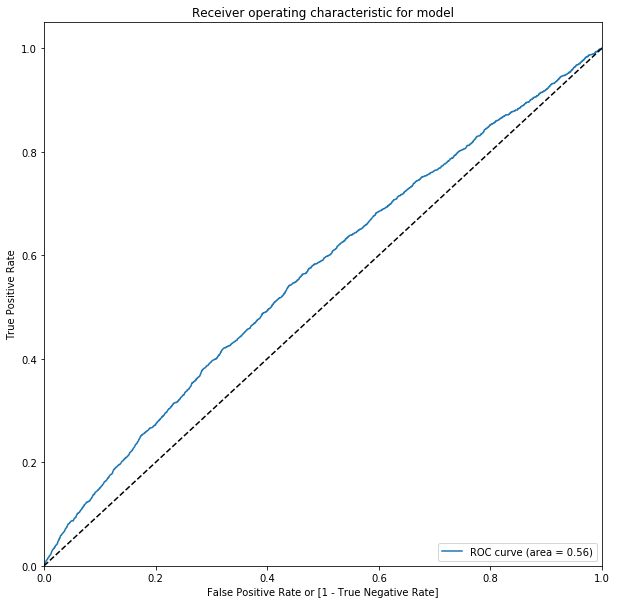

In [204]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Performance_Tag, y_train_pred_final.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

### Finding Optimal Probablity Cut Off

In [205]:
 # Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,16417,0.0,0.037033,0,1,0,0,0,0,0,0,0,0,0
1,34574,0.0,0.028864,0,1,0,0,0,0,0,0,0,0,0
2,61618,1.0,0.055315,0,1,0,0,0,0,0,0,0,0,0
3,1772,0.0,0.038546,0,1,0,0,0,0,0,0,0,0,0
4,10564,0.0,0.029508,0,1,0,0,0,0,0,0,0,0,0


In [206]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy  sensi  speci       ppv       npv
0.0  0.0   0.042205  1.0    0.0    0.042205 NaN      
0.1  0.1   0.957795  0.0    1.0   NaN        0.957795
0.2  0.2   0.957795  0.0    1.0   NaN        0.957795
0.3  0.3   0.957795  0.0    1.0   NaN        0.957795
0.4  0.4   0.957795  0.0    1.0   NaN        0.957795
0.5  0.5   0.957795  0.0    1.0   NaN        0.957795
0.6  0.6   0.957795  0.0    1.0   NaN        0.957795
0.7  0.7   0.957795  0.0    1.0   NaN        0.957795
0.8  0.8   0.957795  0.0    1.0   NaN        0.957795
0.9  0.9   0.957795  0.0    1.0   NaN        0.957795


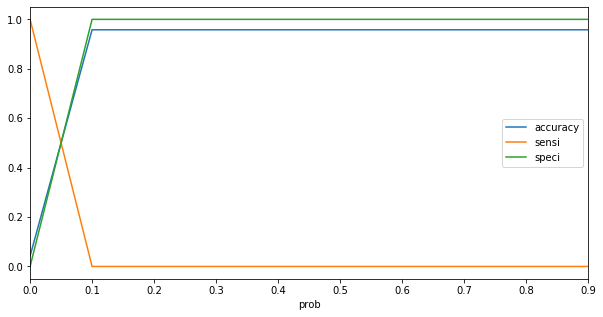

In [207]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [208]:
## making our final prediction on basis of optimal cut-off of 0.05
y_train_pred_final['final_predicted'] = y_train_pred_final.Performance_Prob.map( lambda x: 1 if x > 0.05 else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,16417,0.0,0.037033,0,1,0,0,0,0,0,0,0,0,0,0
1,34574,0.0,0.028864,0,1,0,0,0,0,0,0,0,0,0,0
2,61618,1.0,0.055315,0,1,0,0,0,0,0,0,0,0,0,1
3,1772,0.0,0.038546,0,1,0,0,0,0,0,0,0,0,0,0
4,10564,0.0,0.029508,0,1,0,0,0,0,0,0,0,0,0,0


In [209]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted )
confusion_matrix

array([[37255,  9585],
       [ 1486,   578]], dtype=int64)

In [210]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train_pred_final.Performance_Tag, 
                                                  y_train_pred_final.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train_pred_final.Performance_Tag, 
                                                              y_train_pred_final.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob),2))

Accuracy: 	 0.77
Sensitivity: 	0.28
Specificity: 	0.8
AUC:    	 0.56


In [211]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))

precision :  0.05687297057955328
recall :  0.2800387596899225


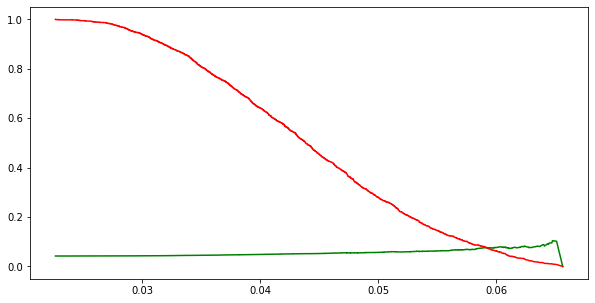

In [212]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Predicting on Test Data

In [213]:
## transforming test data
X_test[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']]=scaler.transform(X_test[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']])
X_test.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
54367,0.638298,0.50,0.633333,0.466667,0.146154,1,0,0,0,0,1,0,1,0,0,0,0,1
12029,0.680851,0.25,0.333333,0.000000,0.453846,1,0,0,0,0,1,0,1,0,0,0,0,1
25146,0.404255,0.75,0.633333,0.000000,0.330769,0,0,1,0,0,0,0,1,0,0,0,0,1
46377,0.617021,0.50,0.750000,0.916667,0.292308,1,0,0,0,0,1,0,0,0,0,0,0,1
6892,1.000000,0.50,0.400000,0.908333,0.415385,1,0,0,0,0,1,0,0,0,0,0,1,0


In [214]:
## adding constant to the test dataset
X_test_sm = sm.add_constant(X_test[col])

## making prediction probabilities
y_test_pred = res.predict(X_test_sm)
## checking values
y_test_pred[:10]

54367    0.038546
12029    0.038967
25146    0.033798
46377    0.031757
6892     0.038056
60297    0.045627
53536    0.036429
27958    0.030223
22547    0.046209
69834    0.062332
dtype: float64

In [215]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['unique_id'] = y_test_df.index+1

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_df.head()

,Performance_Tag,unique_id,0
54367,0.0,54368,0.038546
12029,0.0,12030,0.038967
25146,0.0,25147,0.033798
46377,0.0,46378,0.031757
6892,0.0,6893,0.038056


In [216]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
54367,0.0,54368,0.038546
12029,0.0,12030,0.038967
25146,0.0,25147,0.033798
46377,0.0,46378,0.031757
6892,0.0,6893,0.038056


In [217]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
54367,0.0,54368,0.038546,0
12029,0.0,12030,0.038967,0
25146,0.0,25147,0.033798,0
46377,0.0,46378,0.031757,0
6892,0.0,6893,0.038056,0


In [218]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.Performance_Tag, y_pred_df.final_predicted )
confusion2

array([[16118,  3959],
       [  654,   229]], dtype=int64)

In [219]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_df.Performance_Tag, y_pred_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_pred_df.Performance_Tag, y_pred_df.Performance_Prob),2))

Accuracy: 	 0.78
Sensitivity: 	0.26
Specificity: 	0.8
AUC:    	 0.57


In [220]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))

precision :  0.0546800382043935
recall :  0.25934314835787087


### Prediction on Additional data (rejected applications)

In [221]:
## making copy of the rejected applications data set
demographics_additional = pd.DataFrame(demographics_nulls).copy()

In [222]:
## Preparing data-set for rejected applications data

## replacing the all the entries 'F' with 1 and enteries 'M': 0
demographics_additional['Gender'] = demographics_additional['Gender'].map({'F': 1, 'M': 0})
## replacing the all the entries 'Married' with 1 and enteries 'Single' with 0
demographics_additional['Marital_Status'] = demographics_additional['Marital_Status'].map({'Married': 1, 'Single': 0})
# Creating a dummy variable for the variable 'Education' and dropping the first one.
Education = pd.get_dummies(demographics_additional['Education'],prefix='Education',drop_first=True)
#Adding the results to the master dataframe
demographics_additional = pd.concat([demographics_additional,Education],axis=1)
# Droping the column Education
demographics_additional.drop(columns = 'Education', inplace = True)
# Creating a dummy variable for the variable 'Profession' and dropping the first one.
Profession = pd.get_dummies(demographics_additional['Profession'],prefix='Profession',drop_first=True)
#Adding the results to the master dataframe
demographics_additional = pd.concat([demographics_additional,Profession],axis=1)
# Droping the column Profession
demographics_additional.drop(columns = 'Profession', inplace = True)
# Creating a dummy variable for the variable 'Residence_Type' and dropping the first one.
Residence_Type = pd.get_dummies(demographics_additional['Residence_Type'],prefix='Type_residence',drop_first=True)
#Adding the results to the master dataframe
demographics_additional = pd.concat([demographics_additional,Residence_Type],axis=1)
# Droping the column Profession 
demographics_additional.drop(columns = 'Residence_Type', inplace = True)

In [223]:
# Standardisation continuous features for X_additional_df
X_additional_df = demographics_additional.drop(['App_Id','Performance_Tag'],axis=1)

## transforming test data
X_additional_df[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']]=scaler.transform(
    X_additional_df[['Age','Dependents_No','Income','Months_Current_Residence','Months_Current_Company']])

X_additional_df.head()

,Age,Gender,Marital_Status,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,Education_Masters,Education_Others,Education_Phd,Education_Professional,Profession_SE,Profession_SE_PROF,Type_residence_Living with Parents,Type_residence_Others,Type_residence_Owned,Type_residence_Rented
69603,0.361702,0,0,0.00,0.100000,0.133333,0.115385,0,0,0,0,0,0,0,0,0,1
69604,0.617021,1,1,0.75,0.200000,0.966667,0.169231,1,0,0,0,1,0,0,0,0,1
69605,0.595745,0,1,0.50,0.116667,0.033333,0.215385,0,0,0,1,1,0,0,0,0,1
69606,0.489362,0,1,0.50,0.300000,0.000000,0.338462,1,0,0,0,0,0,0,0,0,1
69607,0.510638,1,1,0.75,0.283333,0.016667,0.353846,0,0,1,0,0,0,0,0,0,1


In [224]:
## adding constant to the test dataset
X_additional_df_sm = sm.add_constant(X_additional_df[col])

## making prediction probabilities
y_additional_pred = res.predict(X_additional_df_sm)
## checking values
y_additional_pred[:10]

69603    0.058987
69604    0.052702
69605    0.054332
69606    0.043375
69607    0.043453
69608    0.037847
69609    0.058255
69610    0.040117
69611    0.064755
69612    0.051028
dtype: float64

In [225]:
# Converting y_test to dataframe
y_additional_df = pd.DataFrame(pd.Series(np.ones(X_additional_df.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})

y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_pred_1
y_pred_additional_df = pd.concat([y_additional_df, pd.DataFrame(y_additional_pred).reset_index()],axis=1)
y_pred_additional_df = y_pred_additional_df.drop('index',1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.058987
1,1,2,0.052702
2,1,3,0.054332
3,1,4,0.043375
4,1,5,0.043453


In [226]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.058987
1,1,2,0.052702
2,1,3,0.054332
3,1,4,0.043375
4,1,5,0.043453


In [227]:
## evaluating result based on the cut-off value obtained above
y_pred_additional_df['final_predicted'] = y_pred_additional_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.058987,1
1,1,2,0.052702,1
2,1,3,0.054332,1
3,1,4,0.043375,0
4,1,5,0.043453,0


In [228]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[  0,   0],
       [599, 826]], dtype=int64)

In [229]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, 
                                                              y_pred_additional_df.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.58
Sensitivity: 	0.58
Specificity: 	0.0


In [230]:
## using precision_score to evaluate matrics
print("precision : ", metrics.precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", metrics.recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.5796491228070175


## 8.1.B) Decision Tree

#### Creating a Decision Tree Model

In [231]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [232]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.57      0.71     20077
         1.0       0.05      0.54      0.09       883

    accuracy                           0.57     20960
   macro avg       0.51      0.55      0.40     20960
weighted avg       0.93      0.57      0.69     20960



In [233]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[11379  8698]
 [  406   477]]
accuracy 0.565648854961832
precision 0.05198910081743869
recall 0.5402038505096263


In [234]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_train.columns)
features

C:\Users\sarth\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


['Age',
 'Dependents_No',
 'Income',
 'Months_Current_Residence',
 'Months_Current_Company',
 'Gender_M',
 'Marital_Status_Single',
 'Education_Masters',
 'Education_Others',
 'Education_Phd',
 'Education_Professional',
 'Education_UNKNOWN',
 'Profession_SE',
 'Profession_SE_PROF',
 'Type_residence_Living with Parents',
 'Type_residence_Others',
 'Type_residence_Owned',
 'Type_residence_Rented']

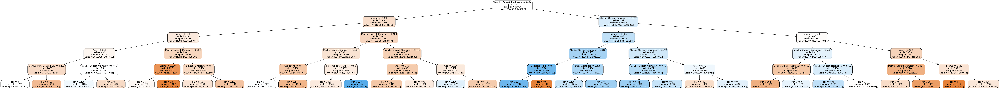

In [235]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Tunning the Hyperparameter

In [236]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:   34.8s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [237]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.040911,1.000408e-02,0.008378,0.002863,1,{'max_depth': 1},0.652582,0.659091,0.623153,0.620047,0.660934,0.643161,0.017849,1,0.640415,0.639089,0.647768,0.648930,0.638503,0.642941,0.004474
1,0.040972,5.337793e-03,0.006315,0.005897,2,{'max_depth': 2},0.652582,0.358586,0.463054,0.435897,0.402948,0.462615,0.101177,10,0.640415,0.367506,0.503619,0.477676,0.435727,0.484989,0.090318
2,0.046864,4.101908e-07,0.012498,0.006249,3,{'max_depth': 3},0.575117,0.603535,0.610837,0.510490,0.621622,0.584319,0.039999,2,0.568987,0.597722,0.671291,0.550459,0.646349,0.606961,0.045628
3,0.057707,6.360634e-03,0.004521,0.006174,4,{'max_depth': 4},0.495305,0.659091,0.527094,0.531469,0.579853,0.558562,0.057071,3,0.532357,0.682854,0.615802,0.615291,0.601086,0.609478,0.047908
4,0.068733,7.652767e-03,0.006248,0.007653,5,{'max_depth': 5},0.584507,0.439394,0.527094,0.592075,0.520885,0.532791,0.054930,4,0.609280,0.473022,0.629674,0.692355,0.558841,0.592634,0.073542


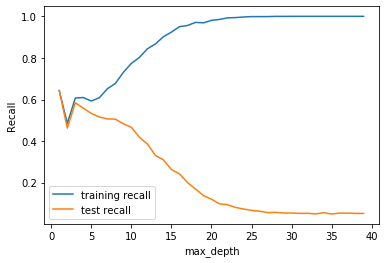

In [238]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

### Tunning min_samples_leaf

In [239]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    8.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [240]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.221364,0.020772,0.007394,0.006371,5,{'min_samples_leaf': 5},0.135593,0.152542,0.145278,0.142857,0.169903,0.149234,0.011666,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.165460,0.009477,0.011170,0.006150,25,{'min_samples_leaf': 25},0.348668,0.351090,0.348668,0.329298,0.330097,0.341564,0.009733,9,0.899455,0.889764,0.896426,0.908540,0.888015,0.896440,0.007363
2,0.140578,0.000023,0.009381,0.007660,45,{'min_samples_leaf': 45},0.416465,0.433414,0.428571,0.370460,0.453883,0.420558,0.027809,8,0.872199,0.872804,0.861902,0.858873,0.862591,0.865674,0.005717
3,0.135160,0.009435,0.006515,0.005933,65,{'min_samples_leaf': 65},0.474576,0.457627,0.462470,0.457627,0.487864,0.468032,0.011693,7,0.841308,0.825560,0.820109,0.829800,0.819007,0.827157,0.008073
4,0.131208,0.007664,0.009375,0.007654,85,{'min_samples_leaf': 85},0.493947,0.489104,0.479419,0.464891,0.509709,0.487413,0.014925,6,0.812841,0.796487,0.810418,0.806178,0.796005,0.804386,0.006982


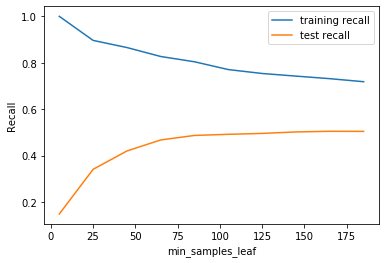

In [241]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [242]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    9.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [243]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.199403,0.019114,0.004195,0.005147,5,{'min_samples_split': 5},0.062954,0.070218,0.067797,0.084746,0.077670,0.072677,0.007681,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.157210,0.005314,0.009373,0.007653,25,{'min_samples_split': 25},0.208232,0.220339,0.210654,0.208232,0.245146,0.218520,0.014041,9,0.998183,0.998183,0.998789,0.996972,0.996973,0.997820,0.000726
2,0.149964,0.007652,0.006249,0.007654,45,{'min_samples_split': 45},0.297821,0.292978,0.273608,0.278450,0.313107,0.291192,0.014134,8,0.973955,0.976378,0.974561,0.972138,0.978208,0.975048,0.002081
3,0.149965,0.007652,0.003124,0.006248,65,{'min_samples_split': 65},0.365617,0.336562,0.324455,0.331719,0.366505,0.344971,0.017648,7,0.950333,0.941248,0.953362,0.943671,0.949758,0.947674,0.004496
4,0.137467,0.006249,0.012497,0.006248,85,{'min_samples_split': 85},0.401937,0.375303,0.368039,0.355932,0.402913,0.380824,0.018693,6,0.939431,0.912174,0.911569,0.910963,0.930993,0.921026,0.011892


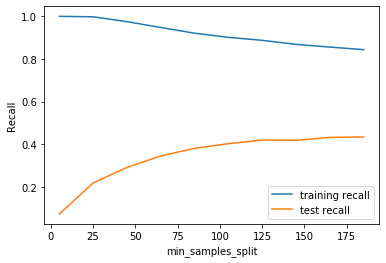

In [244]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [245]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  1.8min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [246]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.085697,0.007011,0.007912,0.004941,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.566586,0.585956,0.636804,0.576271,0.567961,0.586716,0.025983,5,0.653543,0.606299,0.628104,0.631133,0.657990,0.635414,0.018750
1,0.074982,0.006248,0.003124,0.006249,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.566586,0.585956,0.636804,0.576271,0.567961,0.586716,0.025983,5,0.653543,0.606299,0.628104,0.631133,0.657990,0.635414,0.018750
2,0.077817,0.008944,0.004521,0.006174,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 150}",0.566586,0.585956,0.636804,0.576271,0.567961,0.586716,0.025983,5,0.653543,0.606299,0.628104,0.631133,0.657990,0.635414,0.018750
3,0.071858,0.007652,0.006248,0.007652,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 200}",0.566586,0.585956,0.636804,0.576271,0.567961,0.586716,0.025983,5,0.653543,0.606299,0.628104,0.631133,0.657990,0.635414,0.018750
4,0.071858,0.007653,0.006249,0.007653,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.566586,0.556901,0.641646,0.573850,0.572816,0.582360,0.030251,9,0.651121,0.582071,0.640218,0.623864,0.662228,0.631900,0.027949


In [247]:
 # printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.5876868975656973
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [248]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='gini', 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=100, splitter='best')

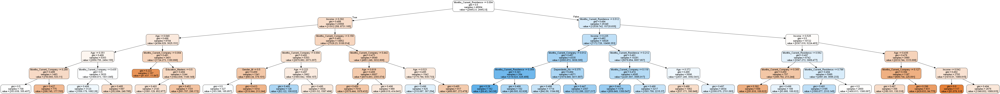

In [249]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [250]:
## checking accuracy score
clf_gini.score(X_test,y_test)

0.5633587786259542

In [251]:
## making predictions
y_pred = clf_gini.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[11330  8747]
 [  405   478]]
accuracy 0.5633587786259542
precision 0.05181571815718157
recall 0.5413363533408834


### Prediction on Additional data (rejected applications)

In [252]:
## making prediction probabilities
X_additional_df['Education_UNKNOWN'] = 0
X_additional_df = X_additional_df.rename(columns={'Gender':'Gender_M', 'Marital_Status':'Marital_Status_Single'})

In [253]:
## making prediction probabilities
y_additional_pred = clf_gini.predict(X_additional_df)
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,0.0
2,1.0
3,1.0
4,0.0


In [254]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(X_additional_df.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,0.0
2,1,3,1.0
3,1,4,1.0
4,1,5,0.0


In [255]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,0.0
2,1,3,1.0
3,1,4,1.0
4,1,5,0.0


In [256]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[  0,   0],
       [699, 726]], dtype=int64)

In [257]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.51
Sensitivity: 	0.51
Specificity: 	0.0


In [258]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.5094736842105263


## 8.1.C) Random Forest Model

### Building RF model

In [259]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [260]:
# Making predictions
predictions = rfc.predict(X_test)

In [261]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98     20077
         1.0       0.00      0.00      0.00       883

    accuracy                           0.96     20960
   macro avg       0.48      0.50      0.49     20960
weighted avg       0.92      0.96      0.94     20960



In [262]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[20071     6]
 [  883     0]]
accuracy 0.9575858778625954
precision 0.0
recall 0.0


### Tunning Huperparametres

### Tunning Max_Depth

In [263]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    7.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [264]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.116829,0.012480,0.015019,0.000604,2,{'max_depth': 2},0.508475,0.520581,0.549637,0.617433,0.456311,0.530489,0.052936,1,0.531193,0.540884,0.575409,0.637190,0.476392,0.552214,0.053062
1,0.160137,0.021045,0.012493,0.006246,6,{'max_depth': 6},0.506053,0.489104,0.527845,0.472155,0.514563,0.501944,0.019490,2,0.599031,0.557238,0.583283,0.585100,0.592010,0.583332,0.014183
2,0.203071,0.000016,0.018755,0.006247,10,{'max_depth': 10},0.237288,0.259080,0.227603,0.230024,0.216019,0.234003,0.014282,3,0.626287,0.637795,0.606299,0.622047,0.631356,0.624757,0.010620
3,0.249266,0.001369,0.018738,0.006250,14,{'max_depth': 14},0.072639,0.048426,0.026634,0.058111,0.048544,0.050871,0.015001,4,0.728044,0.731678,0.721381,0.742580,0.711864,0.727109,0.010260
4,0.278054,0.006243,0.021874,0.007642,18,{'max_depth': 18},0.000000,0.009685,0.012107,0.004843,0.007282,0.006783,0.004166,5,0.778922,0.768625,0.794670,0.800121,0.797821,0.788032,0.012212


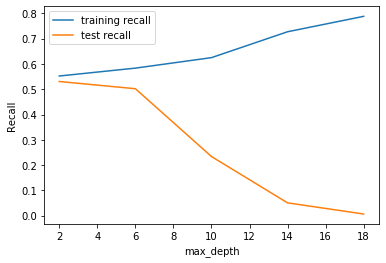

In [265]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning n_estimators

In [266]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  4.0min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [267]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.391962,0.052566,0.078147,0.000083,100,{'n_estimators': 100},0.479419,0.489104,0.479419,0.469734,0.495146,0.482564,0.008780,3,0.575409,0.582071,0.577226,0.582071,0.589588,0.581273,0.004923
1,6.476428,0.114595,0.378038,0.011700,500,{'n_estimators': 500},0.476998,0.496368,0.491525,0.460048,0.492718,0.483531,0.013470,2,0.584494,0.571775,0.571169,0.585706,0.573245,0.577278,0.006434
2,11.894251,0.215771,0.699786,0.030288,900,{'n_estimators': 900},0.469734,0.486683,0.476998,0.472155,0.502427,0.481599,0.011923,4,0.579649,0.572380,0.568746,0.583889,0.577482,0.576429,0.005339
3,17.540580,0.711419,1.027874,0.048792,1300,{'n_estimators': 1300},0.486683,0.491525,0.474576,0.472155,0.502427,0.485473,0.011150,1,0.579649,0.572986,0.569958,0.580860,0.576877,0.576066,0.004081


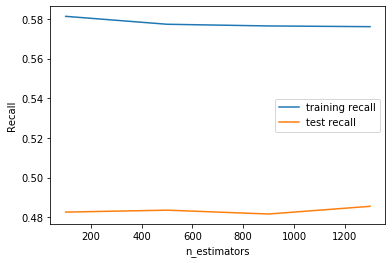

In [268]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

### Tunning max_features

In [269]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 12, 16]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    7.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [270]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.173942,0.013827,0.016422,9.088428e-04,4,{'max_features': 4},0.455206,0.438257,0.457627,0.435835,0.466019,0.450589,0.011651,4,0.566929,0.551787,0.576015,0.561478,0.561743,0.563590,0.007908
1,0.235146,0.001650,0.015621,1.592950e-06,8,{'max_features': 8},0.484262,0.479419,0.486683,0.460048,0.473301,0.476743,0.009519,1,0.579043,0.560267,0.561478,0.569352,0.572034,0.568435,0.006949
2,0.331172,0.030291,0.015621,5.309834e-07,12,{'max_features': 12},0.445521,0.498789,0.479419,0.457627,0.436893,0.463650,0.022646,3,0.575409,0.583283,0.559661,0.562689,0.570218,0.570252,0.008553
3,0.405877,0.000555,0.015622,1.101896e-06,16,{'max_features': 16},0.452785,0.496368,0.474576,0.472155,0.485437,0.476264,0.014556,2,0.582677,0.576620,0.586917,0.598425,0.583535,0.585635,0.007206


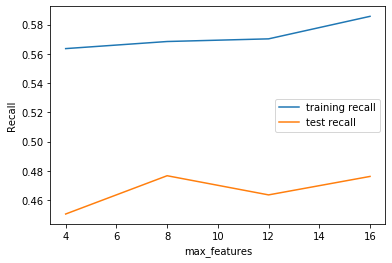

In [271]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

### Tunning min_samples_leaf

In [272]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    7.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [273]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.224080,0.021353,0.021341,9.016621e-03,100,{'min_samples_leaf': 100},0.370460,0.380145,0.421308,0.360775,0.390777,0.384693,0.020847,6,0.594185,0.586311,0.574803,0.568746,0.587167,0.582243,0.009175
1,0.193705,0.007653,0.018745,6.248236e-03,150,{'min_samples_leaf': 150},0.389831,0.421308,0.382567,0.421308,0.415049,0.406012,0.016499,5,0.565718,0.566929,0.540884,0.584494,0.593220,0.570249,0.018025
2,0.190581,0.015305,0.018745,6.248570e-03,200,{'min_samples_leaf': 200},0.467312,0.450363,0.457627,0.423729,0.463592,0.452525,0.015499,4,0.579649,0.576015,0.569958,0.578437,0.587772,0.578366,0.005768
3,0.168711,0.006249,0.015621,3.568323e-07,250,{'min_samples_leaf': 250},0.498789,0.491525,0.469734,0.452785,0.463592,0.475285,0.017263,3,0.589945,0.579649,0.562689,0.567535,0.553269,0.570617,0.012872
4,0.162462,0.007653,0.015622,6.143617e-07,300,{'min_samples_leaf': 300},0.469734,0.493947,0.520581,0.447942,0.478155,0.482072,0.024316,2,0.562084,0.571775,0.586311,0.576620,0.576877,0.574733,0.007886


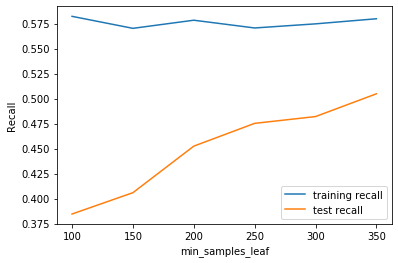

In [274]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [275]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    9.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [276]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.253441,1.475486e-02,0.022537,0.004994,200,{'min_samples_split': 200},0.261501,0.300242,0.280872,0.280872,0.250000,0.274698,0.017395,6,0.611145,0.610539,0.626893,0.639007,0.605932,0.618703,0.012379
1,0.231196,6.247449e-03,0.021870,0.007652,250,{'min_samples_split': 250},0.288136,0.334140,0.285714,0.307506,0.254854,0.294071,0.026188,5,0.618413,0.603876,0.623259,0.608116,0.588983,0.608529,0.011988
2,0.224948,7.652242e-03,0.015620,0.000001,300,{'min_samples_split': 300},0.300242,0.377724,0.326877,0.295400,0.308252,0.321699,0.029995,4,0.591763,0.622047,0.617202,0.597214,0.618039,0.609253,0.012288
3,0.218699,6.289914e-07,0.021870,0.007653,350,{'min_samples_split': 350},0.377724,0.302663,0.322034,0.346247,0.332524,0.336239,0.025156,3,0.602665,0.591157,0.596608,0.603876,0.596247,0.598111,0.004649
4,0.234321,3.951901e-02,0.018745,0.006249,400,{'min_samples_split': 400},0.358354,0.358354,0.355932,0.368039,0.339806,0.356097,0.009145,2,0.595397,0.596608,0.589340,0.593580,0.570218,0.589028,0.009723


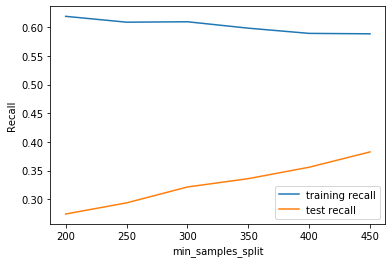

In [277]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [278]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[300, 350]
    'min_samples_split': [400, 450], ##[400, 450]
    'n_estimators': [900,1000], ##[900,1000]
    'max_features': [10,14,18]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 28.9min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 35.7min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [279]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.5348839587002918 using {'max_depth': 4, 'max_features': 10, 'min_samples_leaf': 350, 'min_samples_split': 450, 'n_estimators': 900}


In [280]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=300, 
                             min_samples_split=400,
                             max_features=10,
                             n_estimators=900,class_weight='balanced')

In [281]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.97      0.62      0.76     20077
         1.0       0.06      0.57      0.11       883

    accuracy                           0.62     20960
   macro avg       0.52      0.59      0.43     20960
weighted avg       0.93      0.62      0.73     20960



In [282]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[12464  7613]
 [  382   501]]
accuracy 0.6185591603053435
precision 0.06174513187084052
recall 0.5673839184597962


### Prediction on Additional data (rejected applications)

In [283]:
## making prediction probabilities
y_additional_pred = rfc.predict(X_additional_df)
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,0.0
1,0.0
2,1.0
3,0.0
4,0.0


In [284]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(X_additional_df.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.0
1,1,2,0.0
2,1,3,1.0
3,1,4,0.0
4,1,5,0.0


In [285]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,0.0
1,1,2,0.0
2,1,3,1.0
3,1,4,0.0
4,1,5,0.0


In [286]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[  0,   0],
       [994, 431]], dtype=int64)

In [287]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')


Accuracy: 	 0.3
Sensitivity: 	0.3
Specificity: 	0.0


In [288]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.3024561403508772


# 8.2) Building Model with WOE Transformed Data ( Demographic)

In [289]:
# Reading the data
demographics_woe_df = pd.read_csv("woe_demographic_data.csv",sep=",")
demographics_woe_df.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag
0,954457215.0,0.038694,0.031865,-0.003932,-0.085531,-0.205522,0.017005,-0.028403,-0.004188,-0.072305,-0.291974,0.0
1,432830445.0,-0.030170,-0.010008,-0.003932,-0.025688,-0.330883,-0.018326,-0.013607,-0.004188,-0.072305,-0.148023,0.0
2,941387308.0,-0.030170,-0.010008,0.023017,-0.085531,-0.179070,0.017005,-0.013607,-0.004188,-0.072305,-0.148023,0.0
3,392161677.0,-0.040314,-0.010008,-0.003932,0.039776,-0.330883,0.017005,0.092598,-0.004188,-0.072305,-0.291974,0.0
4,182011211.0,0.047381,0.031865,-0.003932,0.006068,-0.179070,-0.018326,-0.028403,-0.004188,-0.072305,-0.148023,0.0


In [290]:
demographics_woe_df.shape

(69870, 12)

### Doing Test-Train Split

In [291]:
from sklearn.model_selection import train_test_split


In [292]:
## taking all variables to X ignoring Performance_Tag and App_Id 
X = demographics_woe_df.drop(['Performance_Tag','App_Id'],axis=1)

X.head()

,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company
0,0.038694,0.031865,-0.003932,-0.085531,-0.205522,0.017005,-0.028403,-0.004188,-0.072305,-0.291974
1,-0.030170,-0.010008,-0.003932,-0.025688,-0.330883,-0.018326,-0.013607,-0.004188,-0.072305,-0.148023
2,-0.030170,-0.010008,0.023017,-0.085531,-0.179070,0.017005,-0.013607,-0.004188,-0.072305,-0.148023
3,-0.040314,-0.010008,-0.003932,0.039776,-0.330883,0.017005,0.092598,-0.004188,-0.072305,-0.291974
4,0.047381,0.031865,-0.003932,0.006068,-0.179070,-0.018326,-0.028403,-0.004188,-0.072305,-0.148023


In [293]:
## taking Converted as Y variable
y = demographics_woe_df['Performance_Tag']

y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Performance_Tag, dtype: float64

In [294]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [295]:
## checking the percentage of Performance tag across the data
Performance_Tag_percent = (sum(demographics_woe_df['Performance_Tag'])/len(demographics_woe_df['Performance_Tag'].index))*100
Performance_Tag_percent

4.219264348074996

- The data is very imbalanced. We would be using class balancing techniques.

## 8.2.A.) Demographic WOE - Logistic Regression Model

In [296]:
col = X_train.columns
col

Index(['Age', 'Gender', 'Marital_Status', 'Dependents_No', 'Income',
       'Education', 'Profession', 'Residence_Type', 'Months_Current_Residence',
       'Months_Current_Company'],
      dtype='object')

- ***We would not be doing RFE on the dataset , we only have 12 variables***

In [297]:
import statsmodels.api as sm
## creating model and checking the summary for significance of all variables
X_train_sm = sm.add_constant(X_train[col])
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48898
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8450.3
Date:                Sun, 22 Dec 2019   Deviance:                       16901.
Time:                        03:57:41   Pearson chi2:                 4.89e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1176      0.023   -136.643      0.000      -3.162      -3.073
Age                          1.0431      0.327      3.186      0.001       0.401       1.685
Gender                       0.5877      0.956      0.615      0.539      -1.285       2.461
Marital_Status              -0.1933      2.000     -0.097      0.923      -4.113       3.726
Dependents_No                1.0809      0.411      2.632      0.008       0.276       1.886
Income                       0.8542      0.115      7.440      0.000       0.629       1.079
Education                    1.3321      0.712      1.872      0.061      -0.063       2.727
Profession                   0.7145      0.470      1.520      0.128      -0.207       1.635
Residence_Type               1.5549      0.875      1.777      0.076      -0.160       3.270
Months_Current_Residence     0.8709      0.082     10.657      0.000       0.711       1.031
Months_Current_Company       0.9406      0.157      5.993      0.000       0.633       1.248
============================================================================================
"""

In [298]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [299]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
5,Income,1.02
9,Months_Current_Residence,1.02
10,Months_Current_Company,1.01
1,Age,1.00
2,Gender,1.00
3,Marital_Status,1.00
4,Dependents_No,1.00
6,Education,1.00
7,Profession,1.00


In [300]:
## dropping the variable "Marital_Status" from the data set
## and creating the model again with remaining varibles
col = col.drop('Marital_Status',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48899
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8450.3
Date:                Sun, 22 Dec 2019   Deviance:                       16901.
Time:                        03:57:42   Pearson chi2:                 4.89e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1176      0.023   -136.653      0.000      -3.162      -3.073
Age                          1.0426      0.327      3.185      0.001       0.401       1.684
Gender                       0.5876      0.956      0.615      0.539      -1.286       2.461
Dependents_No                1.0806      0.411      2.632      0.008       0.276       1.885
Income                       0.8539      0.115      7.440      0.000       0.629       1.079
Education                    1.3323      0.712      1.872      0.061      -0.063       2.727
Profession                   0.7146      0.470      1.521      0.128      -0.206       1.636
Residence_Type               1.5512      0.874      1.775      0.076      -0.161       3.264
Months_Current_Residence     0.8708      0.082     10.656      0.000       0.711       1.031
Months_Current_Company       0.9407      0.157      5.994      0.000       0.633       1.248
============================================================================================
"""

In [301]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
4,Income,1.02
8,Months_Current_Residence,1.02
9,Months_Current_Company,1.01
1,Age,1.00
2,Gender,1.00
3,Dependents_No,1.00
5,Education,1.00
6,Profession,1.00
7,Residence_Type,1.00


In [302]:
## dropping the variable "Gender" from the data set
## and creating the model again with remaining varibles
col = col.drop('Gender',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48900
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8450.4
Date:                Sun, 22 Dec 2019   Deviance:                       16901.
Time:                        03:57:42   Pearson chi2:                 4.89e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1176      0.023   -136.656      0.000      -3.162      -3.073
Age                          1.0416      0.327      3.181      0.001       0.400       1.683
Dependents_No                1.0812      0.411      2.632      0.008       0.276       1.886
Income                       0.8537      0.115      7.438      0.000       0.629       1.079
Education                    1.3316      0.712      1.871      0.061      -0.063       2.726
Profession                   0.7177      0.470      1.527      0.127      -0.203       1.639
Residence_Type               1.5507      0.874      1.775      0.076      -0.162       3.263
Months_Current_Residence     0.8705      0.082     10.653      0.000       0.710       1.031
Months_Current_Company       0.9398      0.157      5.989      0.000       0.632       1.247
============================================================================================
"""

In [303]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
3,Income,1.02
7,Months_Current_Residence,1.02
8,Months_Current_Company,1.01
1,Age,1.00
2,Dependents_No,1.00
4,Education,1.00
5,Profession,1.00
6,Residence_Type,1.00


In [304]:
## dropping the variable "Profession" from the data set
## and creating the model again with remaining varibles
col = col.drop('Profession',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48901
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8451.6
Date:                Sun, 22 Dec 2019   Deviance:                       16903.
Time:                        03:57:42   Pearson chi2:                 4.90e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1177      0.023   -136.676      0.000      -3.162      -3.073
Age                          1.0391      0.327      3.174      0.002       0.397       1.681
Dependents_No                1.0781      0.411      2.626      0.009       0.273       1.883
Income                       0.8528      0.115      7.430      0.000       0.628       1.078
Education                    1.3297      0.712      1.869      0.062      -0.065       2.724
Residence_Type               1.4741      0.865      1.705      0.088      -0.221       3.169
Months_Current_Residence     0.8723      0.082     10.676      0.000       0.712       1.032
Months_Current_Company       0.9408      0.157      5.996      0.000       0.633       1.248
============================================================================================
"""

In [305]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
3,Income,1.02
6,Months_Current_Residence,1.02
7,Months_Current_Company,1.01
1,Age,1.00
2,Dependents_No,1.00
4,Education,1.00
5,Residence_Type,1.00


In [306]:
## dropping the variable "Residence_Type" from the data set
## and creating the model again with remaining varibles
col = col.drop('Residence_Type',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48902
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8453.2
Date:                Sun, 22 Dec 2019   Deviance:                       16906.
Time:                        03:57:43   Pearson chi2:                 4.90e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1171      0.023   -136.740      0.000      -3.162      -3.072
Age                          1.0211      0.327      3.126      0.002       0.381       1.661
Dependents_No                1.0854      0.410      2.644      0.008       0.281       1.890
Income                       0.8552      0.115      7.453      0.000       0.630       1.080
Education                    1.3417      0.712      1.884      0.060      -0.054       2.737
Months_Current_Residence     0.8729      0.082     10.684      0.000       0.713       1.033
Months_Current_Company       0.9418      0.157      6.002      0.000       0.634       1.249
============================================================================================
"""

In [307]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
3,Income,1.02
5,Months_Current_Residence,1.02
1,Age,1.00
2,Dependents_No,1.00
4,Education,1.00
6,Months_Current_Company,1.00


In [308]:
## dropping the variable "Education" from the data set
## and creating the model again with remaining varibles
col = col.drop('Education',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48909
Model:                            GLM   Df Residuals:                    48903
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8454.8
Date:                Sun, 22 Dec 2019   Deviance:                       16910.
Time:                        03:57:43   Pearson chi2:                 4.89e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.1169      0.023   -136.765      0.000      -3.162      -3.072
Age                          1.0199      0.327      3.122      0.002       0.380       1.660
Dependents_No                1.0850      0.410      2.643      0.008       0.281       1.890
Income                       0.8554      0.115      7.455      0.000       0.631       1.080
Months_Current_Residence     0.8743      0.082     10.703      0.000       0.714       1.034
Months_Current_Company       0.9416      0.157      6.000      0.000       0.634       1.249
============================================================================================
"""

In [309]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.03
3,Income,1.02
4,Months_Current_Residence,1.02
1,Age,1.00
2,Dependents_No,1.00
5,Months_Current_Company,1.00


- Since all the pvalues are in Range this becomes our final model.

In [310]:
## Now let us getting the prediction probability values from the model
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

53586    0.037740
43814    0.042369
24864    0.029614
36645    0.037595
19025    0.034668
32049    0.020683
34284    0.028508
5295     0.039301
6910     0.035546
32991    0.030505
dtype: float64

In [311]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.03774012, 0.04236903, 0.02961418, 0.03759504, 0.03466812,
       0.0206827 , 0.02850846, 0.03930074, 0.03554647, 0.03050483])

In [312]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_final = pd.DataFrame({'unique_id':y_train.index+1,'Performance_Tag':y_train.values, 
                                   'Performance_Prob':y_train_pred})
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob
0,53587,0.0,0.037740
1,43815,0.0,0.042369
2,24865,0.0,0.029614
3,36646,0.0,0.037595
4,19026,0.0,0.034668


In [313]:
## making the predictions based on the probability with the cut-off value as 0.5
## this cut-off value will be tuned later

y_train_pred_final['predicted'] = y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted
0,53587,0.0,0.037740,0
1,43815,0.0,0.042369,0
2,24865,0.0,0.029614,0
3,36646,0.0,0.037595,0
4,19026,0.0,0.034668,0


In [314]:
## In order to determine the accuracy of the model we first
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted )
print(confusion)

[[46836     0]
 [ 2073     0]]


In [315]:
## Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted))

0.9576151628534626


#### Plotting ROC Curve

In [316]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

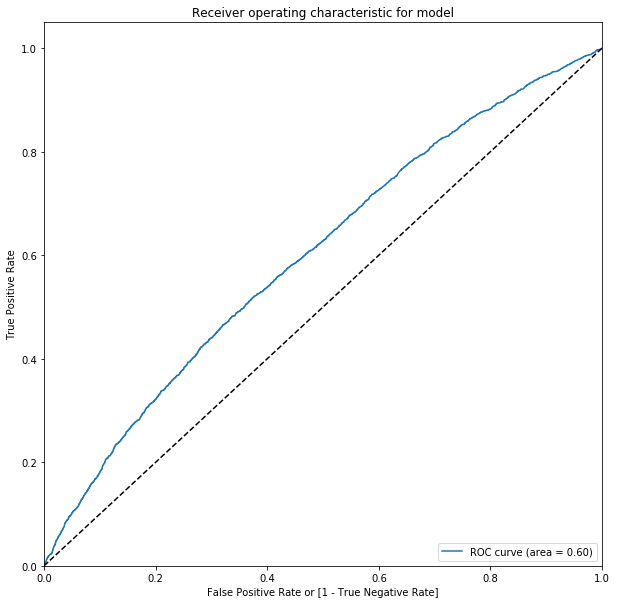

In [317]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Performance_Tag, y_train_pred_final.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

#### Finding optimal probability cut-off

In [318]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,53587,0.0,0.037740,0,1,0,0,0,0,0,0,0,0,0
1,43815,0.0,0.042369,0,1,0,0,0,0,0,0,0,0,0
2,24865,0.0,0.029614,0,1,0,0,0,0,0,0,0,0,0
3,36646,0.0,0.037595,0,1,0,0,0,0,0,0,0,0,0
4,19026,0.0,0.034668,0,1,0,0,0,0,0,0,0,0,0


In [319]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0  0.0   0.042385  1.000000  0.000000  0.042385 NaN      
0.1  0.1   0.956654  0.003859  0.998826  0.126984  0.957724
0.2  0.2   0.957595  0.000000  0.999979  0.000000  0.957614
0.3  0.3   0.957615  0.000000  1.000000 NaN        0.957615
0.4  0.4   0.957615  0.000000  1.000000 NaN        0.957615
0.5  0.5   0.957615  0.000000  1.000000 NaN        0.957615
0.6  0.6   0.957615  0.000000  1.000000 NaN        0.957615
0.7  0.7   0.957615  0.000000  1.000000 NaN        0.957615
0.8  0.8   0.957615  0.000000  1.000000 NaN        0.957615
0.9  0.9   0.957615  0.000000  1.000000 NaN        0.957615


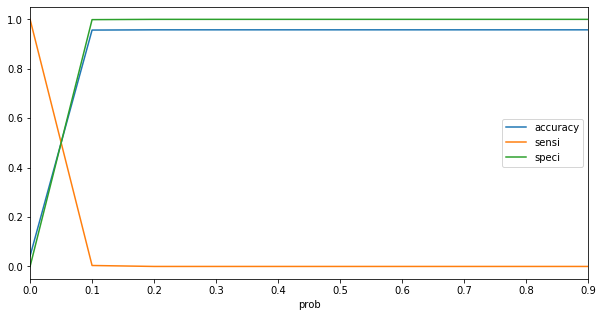

In [320]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [321]:
## making our final prediction on basis of optimal cut-off of 0.05
y_train_pred_final['final_predicted'] = y_train_pred_final.Performance_Prob.map( lambda x: 1 if x > 0.05 else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,53587,0.0,0.037740,0,1,0,0,0,0,0,0,0,0,0,0
1,43815,0.0,0.042369,0,1,0,0,0,0,0,0,0,0,0,0
2,24865,0.0,0.029614,0,1,0,0,0,0,0,0,0,0,0,0
3,36646,0.0,0.037595,0,1,0,0,0,0,0,0,0,0,0,0
4,19026,0.0,0.034668,0,1,0,0,0,0,0,0,0,0,0,0


In [322]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted )
confusion_matrix

array([[34917, 11919],
       [ 1271,   802]], dtype=int64)

In [323]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train_pred_final.Performance_Tag, 
                                                  y_train_pred_final.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train_pred_final.Performance_Tag, 
                                                              y_train_pred_final.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob),2))

Accuracy: 	 0.73
Sensitivity: 	0.39
Specificity: 	0.75
AUC:    	 0.6


In [324]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))

precision :  0.06304535806933417
recall :  0.3868789194404245


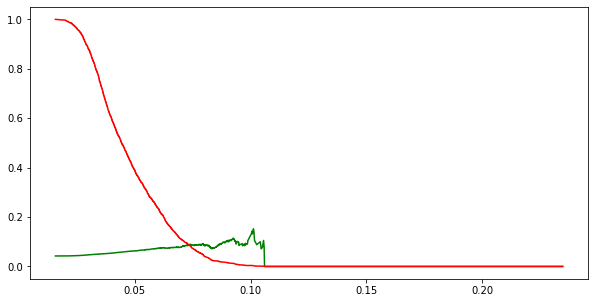

In [325]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

### Predicting The Data Set

In [326]:
## adding constant to the test dataset
X_test_sm = sm.add_constant(X_test[col])

## making prediction probabilities
y_test_pred = res.predict(X_test_sm)
## checking values
y_test_pred[:10]

49053    0.046576
65736    0.042566
28775    0.044102
65371    0.042942
11095    0.034409
30592    0.031521
45445    0.058665
55786    0.038335
59422    0.048921
568      0.030706
dtype: float64

In [327]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['unique_id'] = y_test_df.index+1

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_df.head()

,Performance_Tag,unique_id,0
49053,0.0,49054,0.046576
65736,0.0,65737,0.042566
28775,0.0,28776,0.044102
65371,0.0,65372,0.042942
11095,0.0,11096,0.034409


In [328]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
49053,0.0,49054,0.046576
65736,0.0,65737,0.042566
28775,0.0,28776,0.044102
65371,0.0,65372,0.042942
11095,0.0,11096,0.034409


In [329]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
49053,0.0,49054,0.046576,0
65736,0.0,65737,0.042566,0
28775,0.0,28776,0.044102,0
65371,0.0,65372,0.042942,0
11095,0.0,11096,0.034409,0


In [330]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.Performance_Tag, y_pred_df.final_predicted )
confusion2

array([[14976,  5110],
       [  530,   345]], dtype=int64)

In [331]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_df.Performance_Tag, y_pred_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_pred_df.Performance_Tag, y_pred_df.Performance_Prob),2))

Accuracy: 	 0.73
Sensitivity: 	0.39
Specificity: 	0.75
AUC:    	 0.6


In [332]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))

precision :  0.06324472960586618
recall :  0.3942857142857143


### Prediction on Additional data (rejected applications)

In [333]:
## removing one of the Performance tag as it is redundent
demographics_nulls_data = demographics_nulls.drop(['Performance_Tag'],axis=1)

demographics_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company
69603,906908303,35,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18
69604,10990583,47,F,Married,4.0,12.0,Masters,SE,Rented,122,25
69605,589678446,46,M,Married,3.0,7.0,Professional,SE,Rented,10,31
69606,809411322,41,M,Married,3.0,18.0,Masters,SAL,Rented,6,47
69607,150246616,42,F,Married,4.0,17.0,Phd,SAL,Rented,8,49


In [334]:
## creating WoE dataframe of combined performance null data
woe_demographics_nulls_data = create_woe_dataframe(demographics_nulls_data,woe_demographics)
woe_demographics_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company
69603,906908303.0,0.047381,-0.010008,0.023017,0.039776,0.331057,0.017005,-0.028403,-0.004188,0.474670,0.054282
69604,10990583.0,0.038694,0.031865,-0.003932,-0.025688,0.129425,0.007639,0.092598,-0.004188,-0.072305,0.054282
69605,589678446.0,0.038694,-0.010008,-0.003932,0.053846,0.331057,-0.018326,0.092598,-0.004188,-0.253213,-0.063906
69606,809411322.0,0.096355,-0.010008,-0.003932,0.053846,0.065824,0.007639,-0.028403,-0.004188,-0.253213,-0.148023
69607,150246616.0,-0.040314,0.031865,-0.003932,-0.025688,0.065824,-0.024372,-0.028403,-0.004188,-0.253213,-0.148023


In [335]:
## adding constant to the additional dataset
X_additional_sm = sm.add_constant(woe_demographics_nulls_data[col])

## making prediction probabilities
y_additional_pred = res.predict(X_additional_sm)
## checking values
y_additional_pred[:10]

69603    0.093119
69604    0.047123
69605    0.046646
69606    0.036803
69607    0.029588
69608    0.058900
69609    0.062771
69610    0.062093
69611    0.080277
69612    0.037259
dtype: float64

In [336]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_demographics_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, pd.DataFrame(y_additional_pred).reset_index()],axis=1)
y_pred_additional_df = y_pred_additional_df.drop('index',1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.093119
1,1,2,0.047123
2,1,3,0.046646
3,1,4,0.036803
4,1,5,0.029588


In [337]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.093119
1,1,2,0.047123
2,1,3,0.046646
3,1,4,0.036803
4,1,5,0.029588


In [338]:
## evaluating result based on the cut-off value obtained above
y_pred_additional_df['final_predicted'] = y_pred_additional_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)

y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.093119,1
1,1,2,0.047123,0
2,1,3,0.046646,0
3,1,4,0.036803,0
4,1,5,0.029588,0


In [339]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[  0,   0],
       [594, 831]], dtype=int64)

In [340]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.58
Sensitivity: 	0.58
Specificity: 	0.0


In [341]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.5831578947368421


## 8.2.B.)Decision Tree Model -  Demographic WoE 

In [342]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [343]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.62      0.76     20086
         1.0       0.06      0.52      0.10       875

    accuracy                           0.62     20961
   macro avg       0.51      0.57      0.43     20961
weighted avg       0.93      0.62      0.73     20961



In [344]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[12551  7535]
 [  416   459]]
accuracy 0.6206764944420591
precision 0.05741806354766075
recall 0.5245714285714286


In [345]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_train.columns)
features

['Age',
 'Gender',
 'Marital_Status',
 'Dependents_No',
 'Income',
 'Education',
 'Profession',
 'Residence_Type',
 'Months_Current_Residence',
 'Months_Current_Company']

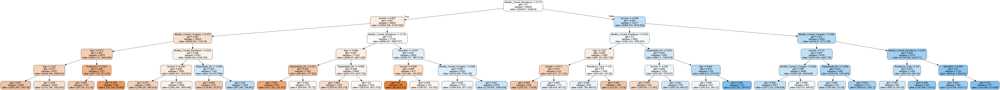

In [346]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter Tunning

#### Tuning max_depth

In [347]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:   21.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [348]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.022939,0.001784,0.005785,0.000746,1,{'max_depth': 1},0.445623,0.348684,0.347319,0.381944,0.482850,0.401283,0.054169,10,0.494104,0.356215,0.356448,0.347349,0.485832,0.407990,0.067066
1,0.025888,0.004122,0.004589,0.002327,2,{'max_depth': 2},0.320955,0.348684,0.347319,0.381944,0.554090,0.390595,0.084003,11,0.379127,0.356215,0.356448,0.347349,0.561393,0.400107,0.081326
2,0.034367,0.006249,0.003124,0.006248,3,{'max_depth': 3},0.419098,0.453947,0.615385,0.474537,0.451187,0.482832,0.068611,5,0.492925,0.486704,0.643552,0.439366,0.436246,0.499758,0.075597
3,0.040614,0.007653,0.006249,0.007653,4,{'max_depth': 4},0.503979,0.434211,0.449883,0.497685,0.443272,0.465806,0.029097,7,0.589623,0.477427,0.459854,0.498477,0.436246,0.492325,0.052775
4,0.044286,0.004540,0.002012,0.002537,5,{'max_depth': 5},0.527851,0.471491,0.536131,0.611111,0.485488,0.526415,0.048911,2,0.637382,0.537415,0.576642,0.651432,0.514168,0.583408,0.053844


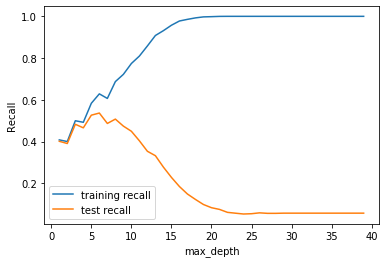

In [349]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [350]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    5.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [351]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.132845,0.034169,0.008976,0.001411,5,{'min_samples_leaf': 5},0.212048,0.171084,0.161446,0.214976,0.205314,0.192973,0.022241,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.097176,0.008200,0.012498,0.006249,25,{'min_samples_leaf': 25},0.400000,0.366265,0.395181,0.388889,0.391304,0.388328,0.011655,9,0.866104,0.854644,0.860072,0.869801,0.864979,0.863120,0.005256
2,0.096170,0.004886,0.001596,0.003192,45,{'min_samples_leaf': 45},0.436145,0.445783,0.419277,0.466184,0.456522,0.444781,0.016260,8,0.802774,0.813631,0.798552,0.822785,0.832429,0.814034,0.012503
3,0.084167,0.008800,0.007844,0.006986,65,{'min_samples_leaf': 65},0.486747,0.445783,0.445783,0.485507,0.500000,0.472764,0.022608,7,0.760555,0.769602,0.766586,0.770946,0.774563,0.768450,0.004706
4,0.065610,0.006248,0.006248,0.007653,85,{'min_samples_leaf': 85},0.484337,0.503614,0.477108,0.516908,0.490338,0.494461,0.014200,5,0.741255,0.756333,0.748492,0.760096,0.741410,0.749517,0.007660


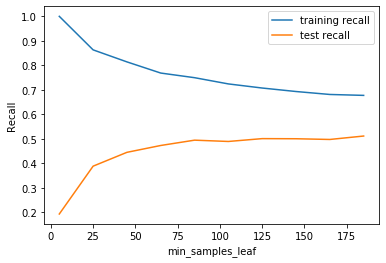

In [352]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [353]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    5.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [354]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.084804,0.003919,0.007299,5.001789e-03,5,{'min_samples_split': 5},0.127711,0.081928,0.062651,0.086957,0.115942,0.095038,0.023625,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.078104,0.000003,0.015623,8.714517e-07,25,{'min_samples_split': 25},0.318072,0.272289,0.298795,0.318841,0.306763,0.302952,0.017048,9,0.996381,0.995778,0.996381,0.991561,0.994575,0.994935,0.001811
2,0.079599,0.004768,0.000000,0.000000e+00,45,{'min_samples_split': 45},0.390361,0.346988,0.383133,0.391304,0.388889,0.380135,0.016815,8,0.948733,0.948733,0.958384,0.958409,0.949970,0.952846,0.004554
3,0.074995,0.006255,0.006249,7.653546e-03,65,{'min_samples_split': 65},0.424096,0.407229,0.397590,0.413043,0.413043,0.411001,0.008648,7,0.910736,0.908323,0.906514,0.915612,0.908379,0.909913,0.003149
4,0.074983,0.006249,0.009367,7.648005e-03,85,{'min_samples_split': 85},0.431325,0.395181,0.397590,0.432367,0.444444,0.420181,0.019984,6,0.870929,0.863691,0.856454,0.875829,0.889090,0.871198,0.011094


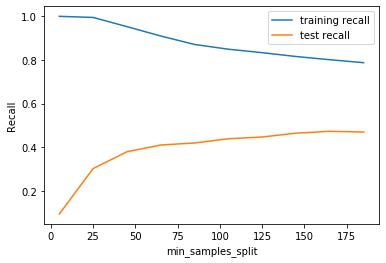

In [355]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [356]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  1.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [357]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.044880,6.306009e-04,0.005984,7.448435e-07,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.578313,0.595181,0.457831,0.456522,0.557971,0.529166,0.059948,17,0.625452,0.651990,0.492159,0.526221,0.613020,0.581768,0.061533
1,0.048270,2.054207e-03,0.006383,4.888317e-04,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.578313,0.595181,0.457831,0.456522,0.557971,0.529166,0.059948,17,0.625452,0.651990,0.492159,0.526221,0.613020,0.581768,0.061533
2,0.045761,2.209763e-03,0.004321,6.106945e-03,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 150}",0.578313,0.595181,0.457831,0.456522,0.557971,0.529166,0.059948,17,0.625452,0.651990,0.492159,0.526221,0.613020,0.581768,0.061533
3,0.046864,8.714517e-07,0.003124,6.247997e-03,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 200}",0.578313,0.595181,0.457831,0.456522,0.557971,0.529166,0.059948,17,0.625452,0.649578,0.492159,0.526221,0.613020,0.581286,0.060987
4,0.052324,7.921905e-03,0.004321,6.107347e-03,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.566265,0.580723,0.457831,0.461353,0.555556,0.524347,0.053483,41,0.614596,0.633293,0.492159,0.529837,0.612417,0.576461,0.055241


In [358]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.5359234895620923
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [359]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='entropy', 
                                  max_depth=5, 
                                  min_samples_leaf=200,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

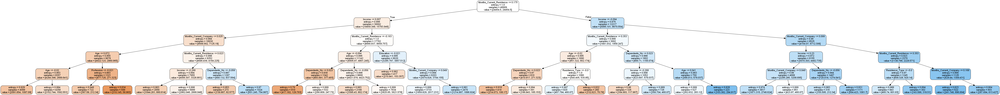

In [360]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [361]:
## checking accuracy score
clf_entropy.score(X_test,y_test)

0.6247793521301465

In [362]:
## making predictions
y_pred = clf_entropy.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[12637  7449]
 [  416   459]]
accuracy 0.6247793521301465
precision 0.05804248861911988
recall 0.5245714285714286


#### Result : The Decision Tree model after tuning provided the recall value of 52.45% on test data.

### Prediction on Additional data (rejected applications)

In [363]:
## making prediction probabilities
y_additional_pred = clf_entropy.predict(woe_demographics_nulls_data.drop(['App_Id'],1))
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,1.0
2,0.0
3,0.0
4,0.0


In [364]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_demographics_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,1.0
2,1,3,0.0
3,1,4,0.0
4,1,5,0.0


In [365]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,1.0
2,1,3,0.0
3,1,4,0.0
4,1,5,0.0


In [366]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[  0,   0],
       [603, 822]], dtype=int64)

In [367]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.58
Sensitivity: 	0.58
Specificity: 	0.0


In [368]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.5768421052631579


## 8.2.3.) Random Forest Model - Demographic WOE

In [369]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [370]:
# Making predictions
predictions = rfc.predict(X_test)

In [371]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97     20086
         1.0       0.04      0.01      0.01       875

    accuracy                           0.95     20961
   macro avg       0.50      0.50      0.49     20961
weighted avg       0.92      0.95      0.93     20961



In [372]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[19926   160]
 [  869     6]]
accuracy 0.9509088306855589
precision 0.03614457831325301
recall 0.006857142857142857


### Tuning Hyperparameters

##### Tuning max_depth

In [373]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    6.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [374]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.087490,0.007970,0.014824,0.000742,2,{'max_depth': 2},0.469880,0.496386,0.522892,0.386473,0.386473,0.452424,0.056394,1,0.491556,0.545838,0.474668,0.399036,0.409283,0.464076,0.054378
1,0.126120,0.007590,0.015602,0.000011,6,{'max_depth': 6},0.409639,0.462651,0.498795,0.391304,0.468599,0.446197,0.039721,2,0.513872,0.557298,0.561520,0.500904,0.558770,0.538473,0.025745
2,0.171838,0.000002,0.015604,0.000014,10,{'max_depth': 10},0.202410,0.212048,0.207229,0.210145,0.234300,0.213226,0.011026,3,0.600121,0.617612,0.613390,0.571429,0.610006,0.602511,0.016579
3,0.209319,0.007662,0.021869,0.007654,14,{'max_depth': 14},0.050602,0.053012,0.043373,0.048309,0.038647,0.046789,0.005168,4,0.717732,0.733414,0.729192,0.730561,0.729355,0.728051,0.005377
4,0.224959,0.007664,0.024990,0.007655,18,{'max_depth': 18},0.009639,0.014458,0.007229,0.004831,0.009662,0.009164,0.003194,5,0.775633,0.765983,0.779252,0.775769,0.758891,0.771106,0.007537


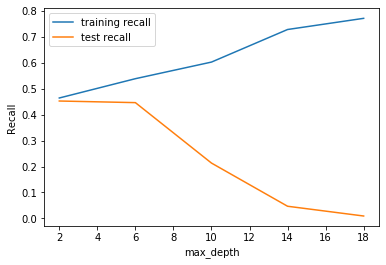

In [375]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning n_estimators

In [376]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  3.6min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [377]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.257307,0.046685,0.088526,0.011872,100,{'n_estimators': 100},0.424096,0.474699,0.46747,0.405797,0.449275,0.444268,0.025986,1,0.545235,0.552473,0.509650,0.526823,0.560579,0.538952,0.018416
1,5.935269,0.178586,0.399907,0.012507,500,{'n_estimators': 500},0.431325,0.462651,0.46747,0.398551,0.439614,0.439923,0.024742,2,0.542823,0.543426,0.507238,0.525618,0.540084,0.531838,0.013905
2,10.243615,0.265773,0.718573,0.035629,900,{'n_estimators': 900},0.419277,0.465060,0.46988,0.391304,0.432367,0.435578,0.029264,4,0.539204,0.541616,0.515682,0.526221,0.541290,0.532802,0.010268
3,15.188144,0.291665,1.087243,0.036436,1300,{'n_estimators': 1300},0.424096,0.462651,0.46506,0.396135,0.432367,0.436063,0.025686,3,0.538601,0.543426,0.510856,0.529837,0.544304,0.533405,0.012388


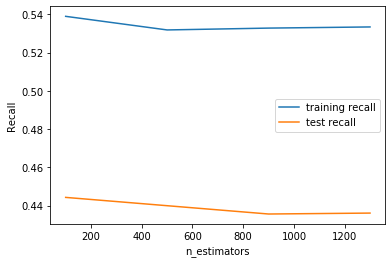

In [378]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning max_features

In [379]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [2, 4, 6, 10]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    5.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [380]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.124810,7.386123e-03,0.016888,2.032255e-03,2,{'max_features': 2},0.467470,0.462651,0.489157,0.442029,0.420290,0.456320,0.023431,1,0.566948,0.559710,0.530157,0.547920,0.544907,0.549928,0.012693
1,0.160725,5.668016e-03,0.015489,2.641918e-04,4,{'max_features': 4},0.424096,0.445783,0.421687,0.379227,0.456522,0.425463,0.026575,3,0.538601,0.528347,0.503619,0.509343,0.554551,0.526892,0.018729
2,0.199953,6.248665e-03,0.015621,5.642013e-07,6,{'max_features': 6},0.404819,0.469880,0.493976,0.386473,0.425121,0.436054,0.040131,2,0.536791,0.570567,0.556695,0.520796,0.546112,0.546192,0.016958
3,0.281184,5.642013e-07,0.015621,1.162153e-06,10,{'max_features': 10},0.409639,0.443373,0.450602,0.381643,0.408213,0.418695,0.025266,4,0.531966,0.557901,0.539204,0.519590,0.539482,0.537629,0.012445


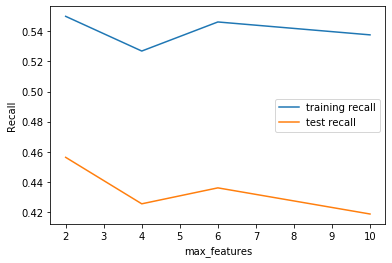

In [381]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [382]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    7.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [383]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.194083,7.099907e-03,0.018215,2.211646e-03,100,{'min_samples_leaf': 100},0.404819,0.436145,0.424096,0.393720,0.405797,0.412916,0.015161,6,0.589867,0.585042,0.572979,0.594937,0.608198,0.590205,0.011572
1,0.176543,5.786596e-03,0.015621,1.472802e-06,150,{'min_samples_leaf': 150},0.450602,0.479518,0.438554,0.432367,0.432367,0.446682,0.017717,5,0.597105,0.599517,0.567551,0.580470,0.575648,0.584058,0.012372
2,0.152929,6.177334e-03,0.018746,6.248117e-03,200,{'min_samples_leaf': 200},0.433735,0.472289,0.484337,0.413043,0.456522,0.451986,0.025803,4,0.559107,0.557901,0.585042,0.528029,0.564195,0.558855,0.018251
3,0.156214,7.008046e-07,0.015621,1.097762e-06,250,{'min_samples_leaf': 250},0.472289,0.506024,0.501205,0.415459,0.478261,0.474649,0.032284,3,0.551870,0.571773,0.539807,0.523207,0.570826,0.551496,0.018557
4,0.147603,8.670856e-03,0.015621,7.688768e-07,300,{'min_samples_leaf': 300},0.491566,0.491566,0.484337,0.473430,0.471014,0.482383,0.008739,1,0.575995,0.547045,0.534982,0.570223,0.564798,0.558609,0.015280


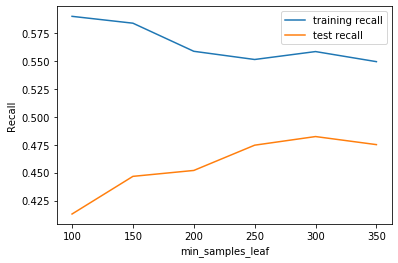

In [384]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [385]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    7.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [386]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.195354,9.920690e-03,0.021540,5.188532e-03,200,{'min_samples_split': 200},0.349398,0.342169,0.349398,0.338164,0.311594,0.338145,0.013959,6,0.605549,0.609771,0.608565,0.608800,0.598553,0.606248,0.004098
1,0.175833,6.053073e-03,0.019211,6.082272e-03,250,{'min_samples_split': 250},0.342169,0.400000,0.368675,0.374396,0.371981,0.371443,0.018381,5,0.579614,0.606755,0.588058,0.609403,0.598553,0.596477,0.011245
2,0.171835,3.873843e-07,0.015622,9.122432e-07,300,{'min_samples_split': 300},0.390361,0.416867,0.351807,0.396135,0.364734,0.383981,0.023132,4,0.601930,0.602533,0.570567,0.584087,0.598553,0.591534,0.012437
3,0.168710,1.168976e-02,0.018745,6.248760e-03,350,{'min_samples_split': 350},0.414458,0.426506,0.407229,0.376812,0.403382,0.405678,0.016443,3,0.606152,0.592280,0.565742,0.587101,0.613020,0.592859,0.016444
4,0.162462,7.652865e-03,0.018745,6.248021e-03,400,{'min_samples_split': 400},0.409639,0.416867,0.428916,0.415459,0.386473,0.411471,0.013982,2,0.563329,0.566345,0.565139,0.596142,0.589512,0.576093,0.013856


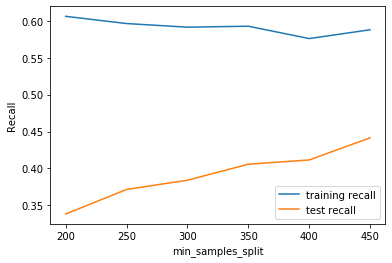

In [387]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [388]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[250,300, 350]
    'min_samples_split': [400, 450], ##[350,400, 450]
    'n_estimators': [900,1000], ##[800,900,1000]
    'max_features': [2,4,6,8,10]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 514.7min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [682]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.6994148471627537 using {'max_depth': 4, 'max_features': 18, 'min_samples_leaf': 350, 'min_samples_split': 450, 'n_estimators': 1000}


In [390]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=300, 
                             min_samples_split=400,
                             max_features=2,
                             n_estimators=900,class_weight='balanced')

In [391]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.97      0.64      0.77     20086
         1.0       0.06      0.53      0.11       875

    accuracy                           0.63     20961
   macro avg       0.51      0.58      0.44     20961
weighted avg       0.93      0.63      0.74     20961



In [392]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[12812  7274]
 [  415   460]]
accuracy 0.6331758980964649
precision 0.05947763123868632
recall 0.5257142857142857


#### Result : The Random forest model after tuning provided the recall value of 53.03% on test data.

### Prediction on Additional data (rejected applications)

In [393]:
## making prediction probabilities
y_additional_pred = rfc.predict(woe_demographics_nulls_data.drop(['App_Id'],1))
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,1.0
2,1.0
3,0.0
4,0.0


In [394]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_demographics_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,0.0
4,1,5,0.0


In [395]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,0.0
4,1,5,0.0


In [396]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [ 382, 1043]], dtype=int64)

In [397]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.73
Sensitivity: 	0.73
Specificity: 	0.0


In [398]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.7319298245614035


## 8.3) Models Building for Combined(Demographic and Credit Bureau) (Non-transformed)

In [399]:
all_demographics_cb_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [400]:
# inspect the columns
all_demographics_cb_data.columns

Index(['App_Id', 'Age', 'Gender', 'Marital_Status', 'Dependents_No', 'Income',
       'Education', 'Profession', 'Residence_Type', 'Months_Current_Residence',
       'Months_Current_Company', 'Performance_Tag_x',
       'No_90_DPD_last_6_months', 'No_60_DPD_last_6_months',
       'No_30_DPD_last_6_months', 'No_90_DPD_last_12_months',
       'No_60_DPD_last_12_months', 'No_30_DPD_last_12_months',
       'Avgas_CC_Utilization_12_months', 'Trades_opened_last_6_months',
       'Trades_opened_last_12_months', 'PL_Trades_opened_last_6_months',
       'PL_Trades_opened_last_12_months', 'Inquiries_last_6_months',
       'Inquiries_last_12_months', 'Presence_open_home_loan',
       'Outstanding_Balance', 'Total_Trades', 'Presence_open_auto_loan',
       'Performance_Tag_y'],
      dtype='object')

In [401]:
## chcking the object type for creating dummies
object_dtype = all_demographics_cb_data.select_dtypes('object').columns

# Creating a dummy variable for the variable 'job' and dropping the first one.
for col in object_dtype:
    
    col = pd.get_dummies(all_demographics_cb_data[col],prefix=col,drop_first=True)
    all_demographics_cb_data = pd.concat([all_demographics_cb_data,col],axis=1)

#Adding the results to the master dataframe
all_demographics_cb_data.drop(object_dtype, inplace = True,axis = 1)

#all_demographics_cb_data.head()


### Splitting the data into test and train

In [402]:
# Import library to split the dataset into test and train

from sklearn.model_selection import train_test_split

In [403]:
# Putting feature variable to X
X = all_demographics_cb_data.drop(['Performance_Tag_y','Performance_Tag_x','App_Id'],axis=1)

# Putting response variable to y
y = all_demographics_cb_data['Performance_Tag_y']

In [404]:
#Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

#### Standardisation

In [405]:
X_train.shape

(48904, 35)

In [406]:
X_train.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
16415,60,3.0,48.0,6,6,0,0,0,0,0,0,5.0,0.0,1,0,0,0,0,0.0,301865.0,2,1,1,0,0,0,0,1,0,0,1,0,0,0,1
34570,47,5.0,46.0,6,56,0,0,0,0,0,0,27.0,6.0,15,2,4,4,5,1.0,3686753.0,22,0,1,0,1,0,0,0,0,0,0,0,0,0,1
61611,34,2.0,15.0,22,9,2,3,4,3,3,5,25.0,3.0,8,2,5,2,5,0.0,933092.0,8,0,0,1,0,0,1,0,0,1,0,0,0,0,1
1771,29,3.0,35.0,74,29,0,0,0,0,0,0,4.0,0.0,1,0,0,0,0,1.0,2987137.0,2,0,1,1,0,0,0,0,0,0,0,0,0,0,0
10562,42,4.0,43.0,6,59,0,0,0,0,0,0,8.0,0.0,0,0,0,0,0,1.0,2961230.0,2,0,1,0,0,0,0,0,0,1,0,0,0,0,1


In [407]:
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaleColumns = ['Age','Dependents_No','Income','Months_Current_Residence',
                'Months_Current_Company','No_90_DPD_last_6_months','No_60_DPD_last_6_months',
                'No_30_DPD_last_6_months','No_90_DPD_last_12_months',
                'No_60_DPD_last_12_months','No_30_DPD_last_12_months',
                'Avgas_CC_Utilization_12_months','Trades_opened_last_6_months',
                'Trades_opened_last_12_months','PL_Trades_opened_last_6_months',
                'PL_Trades_opened_last_12_months','Inquiries_last_6_months','Inquiries_last_12_months',
               'Outstanding_Balance','Total_Trades']


X_train[scaleColumns]=scaler.fit_transform(X_train[scaleColumns])
X_train.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
16415,0.893617,0.50,0.800000,0.000000,0.023077,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.044248,0.00,0.035714,0.000000,0.000000,0.0,0.00,0.0,0.057842,0.045455,1,1,0,0,0,0,1,0,0,1,0,0,0,1
34570,0.617021,1.00,0.766667,0.000000,0.407692,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.238938,0.50,0.535714,0.333333,0.333333,0.4,0.25,1.0,0.706437,0.500000,0,1,0,1,0,0,0,0,0,0,0,0,0,1
61611,0.340426,0.25,0.250000,0.133333,0.046154,0.666667,0.6,0.571429,0.6,0.428571,0.555556,0.221239,0.25,0.285714,0.333333,0.416667,0.2,0.25,0.0,0.178794,0.181818,0,0,1,0,0,1,0,0,1,0,0,0,0,1
1771,0.234043,0.50,0.583333,0.566667,0.200000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.035398,0.00,0.035714,0.000000,0.000000,0.0,0.00,1.0,0.572380,0.045455,0,1,1,0,0,0,0,0,0,0,0,0,0,0
10562,0.510638,0.75,0.716667,0.000000,0.430769,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.070796,0.00,0.000000,0.000000,0.000000,0.0,0.00,1.0,0.567416,0.045455,0,1,0,0,0,0,0,0,1,0,0,0,0,1


In [408]:
## describing the train data after it is scaled
## to check for appropriate scaling
X_train.describe()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
count,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.000000,48904.00000,48904.000000,48904.000000,48904.000000,48904.000000
mean,0.574192,0.466071,0.456305,0.237212,0.239940,0.083197,0.078501,0.074770,0.083008,0.086242,0.081545,0.255792,0.190327,0.206611,0.198314,0.196882,0.175977,0.176469,0.259406,0.239583,0.185745,0.084840,0.763107,0.148106,0.335637,0.001820,0.063533,0.348826,0.001820,0.200842,0.23356,0.025540,0.002801,0.199595,0.748998
std,0.210768,0.346448,0.257884,0.306389,0.156762,0.168293,0.154346,0.142603,0.152571,0.146071,0.137900,0.259523,0.173546,0.182081,0.225788,0.201986,0.198520,0.180992,0.438313,0.247141,0.162607,0.278646,0.425180,0.355209,0.472218,0.042622,0.243921,0.476604,0.042622,0.400635,0.42310,0.157759,0.052855,0.399700,0.433594
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.404255,0.250000,0.233333,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070796,0.083333,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.039347,0.068182,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,0.574468,0.500000,0.450000,0.033333,0.238462,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.132743,0.166667,0.142857,0.166667,0.166667,0.100000,0.150000,0.000000,0.148202,0.136364,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000
75%,0.744681,0.750000,0.666667,0.450000,0.369231,0.000000,0.200000,0.142857,0.200000,0.142857,0.111111,0.389381,0.250000,0.321429,0.333333,0.333333,0.300000,0.250000,1.000000,0.560779,0.227273,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000


## 8.3.A) Logistic Regression Model

In [409]:
# Importing LogisticRegression and metrics from sklearn library
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [410]:
# Fitting the model
logreg = LogisticRegression(class_weight='balanced')
logreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [411]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48868
Model Family:                Binomial   Df Model:                           35
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8200.8
Date:                Sun, 22 Dec 2019   Deviance:                       16402.
Time:                        12:39:01   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                 -3.6177      0.197    -18.360      0.000      -4.004      -3.232
Age                                    0.0205      0.116      0.177      0.860      -0.206       0.247
Dependents_No                          0.0432      0.067      0.644      0.519      -0.088       0.174
Income                                -0.1697      0.094     -1.805      0.071      -0.354       0.015
Months_Current_Residence              -0.1772      0.082     -2.166      0.030      -0.338      -0.017
Months_Current_Company                -0.2744      0.147     -1.862      0.063      -0.563       0.014
No_90_DPD_last_6_months                0.0599      0.282      0.212      0.832      -0.493       0.612
No_60_DPD_last_6_months               -0.6504      0.505     -1.287      0.198      -1.641       0.340
No_30_DPD_last_6_months                1.5944      0.594      2.684      0.007       0.430       2.759
No_90_DPD_last_12_months               0.3216      0.283      1.136      0.256      -0.233       0.877
No_60_DPD_last_12_months              -0.1472      0.384     -0.383      0.701      -0.900       0.605
No_30_DPD_last_12_months               0.3548      0.492      0.721      0.471      -0.610       1.320
Avgas_CC_Utilization_12_months         0.8571      0.096      8.940      0.000       0.669       1.045
Trades_opened_last_6_months            0.1921      0.451      0.426      0.670      -0.691       1.075
Trades_opened_last_12_months          -0.5227      0.791     -0.661      0.509      -2.073       1.028
PL_Trades_opened_last_6_months         0.4669      0.259      1.805      0.071      -0.040       0.974
PL_Trades_opened_last_12_months        2.8668      0.879      3.260      0.001       1.143       4.591
Inquiries_last_6_months               -0.7720      0.253     -3.056      0.002      -1.267      -0.277
Inquiries_last_12_months               1.5839      0.318      4.975      0.000       0.960       2.208
Presence_open_home_loan                2.1454      0.999      2.148      0.032       0.188       4.103
Outstanding_Balance                   -3.9862      1.823     -2.187      0.029      -7.559      -0.413
Total_Trades                          -0.7629      0.503     -1.518      0.129      -1.748       0.222
Presence_open_auto_loan                0.1285      0.113      1.137      0.255      -0.093       0.350
Gender_M                              -0.0516      0.053     -0.975      0.329      -0.155       0.052
Marital_Status_Single                 -0.0212      0.066     -0.322      0.747      -0.150       0.108
Education_Masters                     -0.0038      0.059     -0.064      0.949      -0.120       0.113
Education_Others                      -0.0351      0.520     -0.068      0.946      -1.054      

### Feature Selection Using RFE

In [412]:
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [413]:
## Creating a Logistic Regression MOdel with balanced class
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight='balanced')

In [414]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 20)             # running RFE with 20 variables as output
rfe = rfe.fit(X_train, y_train)

In [415]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Age', False, 4),
 ('Dependents_No', False, 9),
 ('Income', True, 1),
 ('Months_Current_Residence', True, 1),
 ('Months_Current_Company', True, 1),
 ('No_90_DPD_last_6_months', False, 3),
 ('No_60_DPD_last_6_months', True, 1),
 ('No_30_DPD_last_6_months', True, 1),
 ('No_90_DPD_last_12_months', True, 1),
 ('No_60_DPD_last_12_months', True, 1),
 ('No_30_DPD_last_12_months', True, 1),
 ('Avgas_CC_Utilization_12_months', True, 1),
 ('Trades_opened_last_6_months', True, 1),
 ('Trades_opened_last_12_months', True, 1),
 ('PL_Trades_opened_last_6_months', True, 1),
 ('PL_Trades_opened_last_12_months', True, 1),
 ('Inquiries_last_6_months', True, 1),
 ('Inquiries_last_12_months', True, 1),
 ('Presence_open_home_loan', True, 1),
 ('Outstanding_Balance', True, 1),
 ('Total_Trades', True, 1),
 ('Presence_open_auto_loan', False, 5),
 ('Gender_M', False, 8),
 ('Marital_Status_Single', False, 14),
 ('Education_Masters', False, 16),
 ('Education_Others', False, 2),
 ('Education_Phd', True, 1),
 ('E

In [416]:
col = X_train.columns[rfe.support_]

In [417]:
X_train.columns[~rfe.support_]

Index(['Age', 'Dependents_No', 'No_90_DPD_last_6_months',
       'Presence_open_auto_loan', 'Gender_M', 'Marital_Status_Single',
       'Education_Masters', 'Education_Others', 'Education_Professional',
       'Profession_SE', 'Profession_SE_PROF',
       'Residence_Type_Living with Parents', 'Residence_Type_Others',
       'Residence_Type_Owned', 'Residence_Type_Rented'],
      dtype='object')

In [418]:
#Accessing the models with StatsModel
## creating model from all 20 RFe identified predictor variables
X_train_sm = sm.add_constant(X_train[col])
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48883
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8203.6
Date:                Sun, 22 Dec 2019   Deviance:                       16407.
Time:                        12:39:14   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6270      0.088    -41.013      0.000      -3.800      -3.454
Income                             -0.1673      0.094     -1.782      0.075      -0.351       0.017
Months_Current_Residence           -0.1805      0.082     -2.211      0.027      -0.341      -0.020
Months_Current_Company             -0.2759      0.147     -1.873      0.061      -0.565       0.013
No_60_DPD_last_6_months            -0.6324      0.465     -1.360      0.174      -1.544       0.279
No_30_DPD_last_6_months             1.6055      0.594      2.705      0.007       0.442       2.769
No_90_DPD_last_12_months            0.3643      0.226      1.610      0.107      -0.079       0.808
No_60_DPD_last_12_months           -0.1338      0.383     -0.350      0.727      -0.884       0.616
No_30_DPD_last_12_months            0.3635      0.491      0.741      0.459      -0.599       1.326
Avgas_CC_Utilization_12_months      0.8450      0.095      8.894      0.000       0.659       1.031
Trades_opened_last_6_months         0.1900      0.450      0.422      0.673      -0.693       1.073
Trades_opened_last_12_months       -0.5181      0.790     -0.655      0.512      -2.067       1.031
PL_Trades_opened_last_6_months      0.4662      0.259      1.804      0.071      -0.040       0.973
PL_Trades_opened_last_12_months     2.2871      0.720      3.178      0.001       0.877       3.697
Inquiries_last_6_months            -0.7688      0.253     -3.044      0.002      -1.264      -0.274
Inquiries_last_12_months            1.5799      0.318      4.966      0.000       0.956       2.203
Presence_open_home_loan             1.4101      0.766      1.841      0.066      -0.091       2.911
Outstanding_Balance                -2.6423      1.396     -1.893      0.058      -5.378       0.093
Total_Trades                       -0.7643      0.502     -1.523      0.128      -1.748       0.219
Education_Phd                      -0.1309      0.099     -1.328      0.184      -0.324       0.062
Education_UNKNOWN                   0.1801      0.466      0.387      0.699      -0.733       1.093
===================================================================================================
"""

In [419]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,Outstanding_Balance,351.92
15,Presence_open_home_loan,239.13
10,Trades_opened_last_12_months,95.64
12,PL_Trades_opened_last_12_months,71.25
17,Total_Trades,30.02
9,Trades_opened_last_6_months,27.70
4,No_30_DPD_last_6_months,27.24
3,No_60_DPD_last_6_months,20.45
7,No_30_DPD_last_12_months,16.73
14,Inquiries_last_12_months,15.35


In [420]:
## dropping the variable "Outstanding_Balance" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Outstanding_Balance',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48884
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8205.5
Date:                Sun, 22 Dec 2019   Deviance:                       16411.
Time:                        12:39:16   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6516      0.088    -41.650      0.000      -3.823      -3.480
Income                             -0.1746      0.094     -1.860      0.063      -0.359       0.009
Months_Current_Residence           -0.1896      0.082     -2.325      0.020      -0.349      -0.030
Months_Current_Company             -0.2846      0.147     -1.933      0.053      -0.573       0.004
No_60_DPD_last_6_months            -0.6686      0.465     -1.438      0.151      -1.580       0.243
No_30_DPD_last_6_months             1.6421      0.593      2.767      0.006       0.479       2.805
No_90_DPD_last_12_months            0.3759      0.226      1.661      0.097      -0.068       0.819
No_60_DPD_last_12_months           -0.1193      0.383     -0.312      0.755      -0.870       0.631
No_30_DPD_last_12_months            0.3899      0.491      0.795      0.427      -0.572       1.351
Avgas_CC_Utilization_12_months      0.8232      0.094      8.744      0.000       0.639       1.008
Trades_opened_last_6_months         0.1889      0.450      0.420      0.675      -0.693       1.071
Trades_opened_last_12_months       -0.4798      0.790     -0.608      0.544      -2.028       1.068
PL_Trades_opened_last_6_months      0.4624      0.259      1.789      0.074      -0.044       0.969
PL_Trades_opened_last_12_months     1.1537      0.399      2.894      0.004       0.372       1.935
Inquiries_last_6_months            -0.7696      0.253     -3.047      0.002      -1.265      -0.274
Inquiries_last_12_months            1.5908      0.318      5.000      0.000       0.967       2.214
Presence_open_home_loan            -0.0366      0.056     -0.654      0.513      -0.146       0.073
Total_Trades                       -0.8112      0.502     -1.617      0.106      -1.794       0.172
Education_Phd                      -0.1311      0.099     -1.330      0.184      -0.324       0.062
Education_UNKNOWN                   0.1877      0.466      0.403      0.687      -0.725       1.100
===================================================================================================
"""

In [421]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Trades_opened_last_12_months,41.89
5,No_30_DPD_last_6_months,21.34
4,No_60_DPD_last_6_months,16.30
13,PL_Trades_opened_last_12_months,14.50
0,const,13.45
17,Total_Trades,13.19
10,Trades_opened_last_6_months,12.59
8,No_30_DPD_last_12_months,12.43
7,No_60_DPD_last_12_months,8.57
12,PL_Trades_opened_last_6_months,7.94


In [422]:
## dropping the variable "No_60_DPD_last_12_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('No_60_DPD_last_12_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48885
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8205.5
Date:                Sun, 22 Dec 2019   Deviance:                       16411.
Time:                        12:39:18   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6540      0.087    -41.840      0.000      -3.825      -3.483
Income                             -0.1740      0.094     -1.855      0.064      -0.358       0.010
Months_Current_Residence           -0.1904      0.081     -2.337      0.019      -0.350      -0.031
Months_Current_Company             -0.2835      0.147     -1.926      0.054      -0.572       0.005
No_60_DPD_last_6_months            -0.7480      0.389     -1.923      0.055      -1.510       0.014
No_30_DPD_last_6_months             1.6506      0.593      2.786      0.005       0.489       2.812
No_90_DPD_last_12_months            0.3712      0.226      1.644      0.100      -0.071       0.814
No_30_DPD_last_12_months            0.3578      0.479      0.746      0.456      -0.582       1.298
Avgas_CC_Utilization_12_months      0.8237      0.094      8.749      0.000       0.639       1.008
Trades_opened_last_6_months         0.1888      0.450      0.419      0.675      -0.694       1.071
Trades_opened_last_12_months       -0.4848      0.790     -0.614      0.539      -2.033       1.063
PL_Trades_opened_last_6_months      0.4615      0.258      1.785      0.074      -0.045       0.968
PL_Trades_opened_last_12_months     1.1511      0.399      2.888      0.004       0.370       1.932
Inquiries_last_6_months            -0.7694      0.253     -3.046      0.002      -1.264      -0.274
Inquiries_last_12_months            1.5896      0.318      4.996      0.000       0.966       2.213
Presence_open_home_loan            -0.0365      0.056     -0.652      0.514      -0.146       0.073
Total_Trades                       -0.7991      0.500     -1.598      0.110      -1.779       0.181
Education_Phd                      -0.1307      0.099     -1.326      0.185      -0.324       0.062
Education_UNKNOWN                   0.1867      0.466      0.401      0.688      -0.726       1.100
===================================================================================================
"""

In [423]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Trades_opened_last_12_months,41.88
5,No_30_DPD_last_6_months,20.88
12,PL_Trades_opened_last_12_months,14.49
0,const,13.39
16,Total_Trades,13.15
9,Trades_opened_last_6_months,12.59
4,No_60_DPD_last_6_months,12.02
7,No_30_DPD_last_12_months,10.80
11,PL_Trades_opened_last_6_months,7.94
14,Inquiries_last_12_months,7.87


In [424]:
## dropping the variable "Education_UNKNOWN" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Education_UNKNOWN',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48886
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8205.6
Date:                Sun, 22 Dec 2019   Deviance:                       16411.
Time:                        12:39:19   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6536      0.087    -41.839      0.000      -3.825      -3.482
Income                             -0.1743      0.094     -1.858      0.063      -0.358       0.010
Months_Current_Residence           -0.1903      0.081     -2.336      0.019      -0.350      -0.031
Months_Current_Company             -0.2833      0.147     -1.924      0.054      -0.572       0.005
No_60_DPD_last_6_months            -0.7473      0.389     -1.921      0.055      -1.510       0.015
No_30_DPD_last_6_months             1.6517      0.593      2.787      0.005       0.490       2.813
No_90_DPD_last_12_months            0.3711      0.226      1.644      0.100      -0.071       0.814
No_30_DPD_last_12_months            0.3556      0.479      0.742      0.458      -0.584       1.295
Avgas_CC_Utilization_12_months      0.8241      0.094      8.753      0.000       0.640       1.009
Trades_opened_last_6_months         0.1877      0.450      0.417      0.677      -0.695       1.070
Trades_opened_last_12_months       -0.4850      0.790     -0.614      0.539      -2.033       1.063
PL_Trades_opened_last_6_months      0.4623      0.258      1.788      0.074      -0.044       0.969
PL_Trades_opened_last_12_months     1.1510      0.399      2.887      0.004       0.370       1.932
Inquiries_last_6_months            -0.7695      0.253     -3.047      0.002      -1.265      -0.274
Inquiries_last_12_months            1.5897      0.318      4.997      0.000       0.966       2.213
Presence_open_home_loan            -0.0366      0.056     -0.653      0.514      -0.146       0.073
Total_Trades                       -0.7987      0.500     -1.597      0.110      -1.779       0.181
Education_Phd                      -0.1311      0.099     -1.330      0.183      -0.324       0.062
===================================================================================================
"""

In [425]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Trades_opened_last_12_months,41.88
5,No_30_DPD_last_6_months,20.88
12,PL_Trades_opened_last_12_months,14.49
0,const,13.39
16,Total_Trades,13.15
9,Trades_opened_last_6_months,12.59
4,No_60_DPD_last_6_months,12.02
7,No_30_DPD_last_12_months,10.80
11,PL_Trades_opened_last_6_months,7.94
14,Inquiries_last_12_months,7.87


In [426]:
## dropping the variable "Trades_opened_last_12_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Trades_opened_last_12_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48887
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8205.8
Date:                Sun, 22 Dec 2019   Deviance:                       16412.
Time:                        12:39:21   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6560      0.087    -41.906      0.000      -3.827      -3.485
Income                             -0.1736      0.094     -1.851      0.064      -0.357       0.010
Months_Current_Residence           -0.1899      0.081     -2.331      0.020      -0.350      -0.030
Months_Current_Company             -0.2821      0.147     -1.917      0.055      -0.571       0.006
No_60_DPD_last_6_months            -0.7413      0.389     -1.906      0.057      -1.503       0.021
No_30_DPD_last_6_months             1.6481      0.592      2.782      0.005       0.487       2.809
No_90_DPD_last_12_months            0.3670      0.226      1.627      0.104      -0.075       0.809
No_30_DPD_last_12_months            0.3471      0.479      0.724      0.469      -0.592       1.286
Avgas_CC_Utilization_12_months      0.8243      0.094      8.753      0.000       0.640       1.009
Trades_opened_last_6_months         0.0245      0.363      0.067      0.946      -0.688       0.737
PL_Trades_opened_last_6_months      0.4649      0.258      1.799      0.072      -0.042       0.971
PL_Trades_opened_last_12_months     0.9885      0.298      3.317      0.001       0.404       1.573
Inquiries_last_6_months            -0.7696      0.253     -3.047      0.002      -1.265      -0.275
Inquiries_last_12_months            1.5784      0.318      4.970      0.000       0.956       2.201
Presence_open_home_loan            -0.0362      0.056     -0.647      0.518      -0.146       0.074
Total_Trades                       -0.9778      0.407     -2.400      0.016      -1.776      -0.179
Education_Phd                      -0.1314      0.099     -1.334      0.182      -0.325       0.062
===================================================================================================
"""

In [427]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,No_30_DPD_last_6_months,20.87
0,const,13.36
4,No_60_DPD_last_6_months,12.02
7,No_30_DPD_last_12_months,10.80
15,Total_Trades,8.76
11,PL_Trades_opened_last_12_months,8.63
9,Trades_opened_last_6_months,8.18
10,PL_Trades_opened_last_6_months,7.93
13,Inquiries_last_12_months,7.84
12,Inquiries_last_6_months,5.94


In [428]:
## dropping the variable "Trades_opened_last_6_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Trades_opened_last_6_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48888
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8205.8
Date:                Sun, 22 Dec 2019   Deviance:                       16412.
Time:                        12:39:22   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6555      0.087    -42.030      0.000      -3.826      -3.485
Income                             -0.1737      0.094     -1.851      0.064      -0.358       0.010
Months_Current_Residence           -0.1899      0.081     -2.331      0.020      -0.350      -0.030
Months_Current_Company             -0.2823      0.147     -1.918      0.055      -0.571       0.006
No_60_DPD_last_6_months            -0.7416      0.389     -1.907      0.056      -1.504       0.020
No_30_DPD_last_6_months             1.6487      0.592      2.783      0.005       0.488       2.810
No_90_DPD_last_12_months            0.3673      0.226      1.628      0.103      -0.075       0.809
No_30_DPD_last_12_months            0.3474      0.479      0.725      0.468      -0.592       1.287
Avgas_CC_Utilization_12_months      0.8241      0.094      8.755      0.000       0.640       1.009
PL_Trades_opened_last_6_months      0.4752      0.209      2.278      0.023       0.066       0.884
PL_Trades_opened_last_12_months     0.9852      0.294      3.353      0.001       0.409       1.561
Inquiries_last_6_months            -0.7697      0.253     -3.048      0.002      -1.265      -0.275
Inquiries_last_12_months            1.5798      0.317      4.986      0.000       0.959       2.201
Presence_open_home_loan            -0.0362      0.056     -0.646      0.518      -0.146       0.074
Total_Trades                       -0.9634      0.348     -2.772      0.006      -1.645      -0.282
Education_Phd                      -0.1315      0.099     -1.334      0.182      -0.325       0.062
===================================================================================================
"""

In [429]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,No_30_DPD_last_6_months,20.87
0,const,13.27
4,No_60_DPD_last_6_months,12.02
7,No_30_DPD_last_12_months,10.80
10,PL_Trades_opened_last_12_months,8.44
12,Inquiries_last_12_months,7.81
14,Total_Trades,6.42
11,Inquiries_last_6_months,5.94
9,PL_Trades_opened_last_6_months,5.48
6,No_90_DPD_last_12_months,3.79


In [430]:
## dropping the variable "No_30_DPD_last_6_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('No_30_DPD_last_6_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48889
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8209.7
Date:                Sun, 22 Dec 2019   Deviance:                       16419.
Time:                        12:39:23   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6571      0.087    -42.035      0.000      -3.828      -3.487
Income                             -0.1831      0.094     -1.953      0.051      -0.367       0.001
Months_Current_Residence           -0.1990      0.081     -2.446      0.014      -0.358      -0.040
Months_Current_Company             -0.2901      0.147     -1.971      0.049      -0.578      -0.002
No_60_DPD_last_6_months            -0.0807      0.309     -0.261      0.794      -0.687       0.526
No_90_DPD_last_12_months            0.3847      0.226      1.706      0.088      -0.057       0.827
No_30_DPD_last_12_months            1.3076      0.328      3.988      0.000       0.665       1.950
Avgas_CC_Utilization_12_months      0.8216      0.094      8.739      0.000       0.637       1.006
PL_Trades_opened_last_6_months      0.4765      0.209      2.283      0.022       0.067       0.885
PL_Trades_opened_last_12_months     0.9957      0.294      3.390      0.001       0.420       1.571
Inquiries_last_6_months            -0.7698      0.253     -3.048      0.002      -1.265      -0.275
Inquiries_last_12_months            1.5933      0.317      5.029      0.000       0.972       2.214
Presence_open_home_loan            -0.0376      0.056     -0.671      0.502      -0.147       0.072
Total_Trades                       -0.9696      0.347     -2.791      0.005      -1.651      -0.289
Education_Phd                      -0.1314      0.099     -1.334      0.182      -0.325       0.062
===================================================================================================
"""

In [431]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,13.27
9,PL_Trades_opened_last_12_months,8.43
11,Inquiries_last_12_months,7.80
4,No_60_DPD_last_6_months,7.03
13,Total_Trades,6.41
10,Inquiries_last_6_months,5.94
6,No_30_DPD_last_12_months,5.87
8,PL_Trades_opened_last_6_months,5.48
5,No_90_DPD_last_12_months,3.78
7,Avgas_CC_Utilization_12_months,1.45


In [432]:
## dropping the variable "No_60_DPD_last_6_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('No_60_DPD_last_6_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48890
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8209.7
Date:                Sun, 22 Dec 2019   Deviance:                       16419.
Time:                        12:39:24   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6560      0.087    -42.073      0.000      -3.826      -3.486
Income                             -0.1830      0.094     -1.952      0.051      -0.367       0.001
Months_Current_Residence           -0.1983      0.081     -2.439      0.015      -0.358      -0.039
Months_Current_Company             -0.2903      0.147     -1.973      0.048      -0.579      -0.002
No_90_DPD_last_12_months            0.3599      0.205      1.759      0.079      -0.041       0.761
No_30_DPD_last_12_months            1.2449      0.223      5.575      0.000       0.807       1.683
Avgas_CC_Utilization_12_months      0.8210      0.094      8.736      0.000       0.637       1.005
PL_Trades_opened_last_6_months      0.4773      0.209      2.288      0.022       0.068       0.886
PL_Trades_opened_last_12_months     0.9977      0.294      3.398      0.001       0.422       1.573
Inquiries_last_6_months            -0.7697      0.253     -3.048      0.002      -1.265      -0.275
Inquiries_last_12_months            1.5942      0.317      5.033      0.000       0.973       2.215
Presence_open_home_loan            -0.0374      0.056     -0.669      0.504      -0.147       0.072
Total_Trades                       -0.9748      0.347     -2.810      0.005      -1.655      -0.295
Education_Phd                      -0.1315      0.099     -1.334      0.182      -0.325       0.062
===================================================================================================
"""

In [433]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,13.25
8,PL_Trades_opened_last_12_months,8.43
10,Inquiries_last_12_months,7.80
12,Total_Trades,6.41
9,Inquiries_last_6_months,5.94
7,PL_Trades_opened_last_6_months,5.48
4,No_90_DPD_last_12_months,3.00
5,No_30_DPD_last_12_months,2.97
6,Avgas_CC_Utilization_12_months,1.45
2,Months_Current_Residence,1.13


In [434]:
## dropping the variable "Presence_open_home_loan" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Presence_open_home_loan',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48891
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8209.9
Date:                Sun, 22 Dec 2019   Deviance:                       16420.
Time:                        12:39:25   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6671      0.085    -42.976      0.000      -3.834      -3.500
Income                             -0.1844      0.094     -1.968      0.049      -0.368      -0.001
Months_Current_Residence           -0.1993      0.081     -2.451      0.014      -0.359      -0.040
Months_Current_Company             -0.2906      0.147     -1.975      0.048      -0.579      -0.002
No_90_DPD_last_12_months            0.3633      0.205      1.776      0.076      -0.038       0.764
No_30_DPD_last_12_months            1.2473      0.223      5.586      0.000       0.810       1.685
Avgas_CC_Utilization_12_months      0.8244      0.094      8.786      0.000       0.640       1.008
PL_Trades_opened_last_6_months      0.4786      0.209      2.294      0.022       0.070       0.888
PL_Trades_opened_last_12_months     1.0039      0.293      3.421      0.001       0.429       1.579
Inquiries_last_6_months            -0.7705      0.253     -3.051      0.002      -1.266      -0.276
Inquiries_last_12_months            1.5998      0.317      5.052      0.000       0.979       2.220
Total_Trades                       -0.9804      0.347     -2.827      0.005      -1.660      -0.301
Education_Phd                      -0.1314      0.099     -1.333      0.183      -0.325       0.062
===================================================================================================
"""

In [435]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,12.75
8,PL_Trades_opened_last_12_months,8.43
10,Inquiries_last_12_months,7.80
11,Total_Trades,6.40
9,Inquiries_last_6_months,5.94
7,PL_Trades_opened_last_6_months,5.47
4,No_90_DPD_last_12_months,3.00
5,No_30_DPD_last_12_months,2.97
6,Avgas_CC_Utilization_12_months,1.44
2,Months_Current_Residence,1.12


In [436]:
## dropping the variable "Education_Phd" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Education_Phd',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48892
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8210.8
Date:                Sun, 22 Dec 2019   Deviance:                       16422.
Time:                        12:39:26   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -3.6759      0.085    -43.185      0.000      -3.843      -3.509
Income                             -0.1842      0.094     -1.966      0.049      -0.368      -0.001
Months_Current_Residence           -0.1991      0.081     -2.448      0.014      -0.358      -0.040
Months_Current_Company             -0.2889      0.147     -1.963      0.050      -0.577      -0.000
No_90_DPD_last_12_months            0.3637      0.205      1.778      0.075      -0.037       0.765
No_30_DPD_last_12_months            1.2469      0.223      5.585      0.000       0.809       1.685
Avgas_CC_Utilization_12_months      0.8254      0.094      8.796      0.000       0.641       1.009
PL_Trades_opened_last_6_months      0.4805      0.209      2.303      0.021       0.072       0.889
PL_Trades_opened_last_12_months     1.0019      0.293      3.414      0.001       0.427       1.577
Inquiries_last_6_months            -0.7690      0.253     -3.045      0.002      -1.264      -0.274
Inquiries_last_12_months            1.5987      0.317      5.049      0.000       0.978       2.219
Total_Trades                       -0.9804      0.347     -2.827      0.005      -1.660      -0.301
===================================================================================================
"""

In [437]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,12.67
8,PL_Trades_opened_last_12_months,8.42
10,Inquiries_last_12_months,7.80
11,Total_Trades,6.40
9,Inquiries_last_6_months,5.94
7,PL_Trades_opened_last_6_months,5.47
4,No_90_DPD_last_12_months,3.00
5,No_30_DPD_last_12_months,2.97
6,Avgas_CC_Utilization_12_months,1.44
2,Months_Current_Residence,1.12


In [438]:
## dropping the variable "PL_Trades_opened_last_12_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('PL_Trades_opened_last_12_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48893
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8216.6
Date:                Sun, 22 Dec 2019   Deviance:                       16433.
Time:                        12:39:26   Pearson chi2:                 4.77e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.6912      0.085    -43.528      0.000      -3.857      -3.525
Income                            -0.1972      0.094     -2.106      0.035      -0.381      -0.014
Months_Current_Residence          -0.1804      0.081     -2.228      0.026      -0.339      -0.022
Months_Current_Company            -0.2999      0.147     -2.038      0.042      -0.588      -0.012
No_90_DPD_last_12_months           0.4105      0.205      2.006      0.045       0.009       0.812
No_30_DPD_last_12_months           1.3483      0.222      6.083      0.000       0.914       1.783
Avgas_CC_Utilization_12_months     0.8914      0.092      9.735      0.000       0.712       1.071
PL_Trades_opened_last_6_months     0.8777      0.173      5.063      0.000       0.538       1.217
Inquiries_last_6_months           -0.7681      0.252     -3.042      0.002      -1.263      -0.273
Inquiries_last_12_months           1.6591      0.316      5.248      0.000       1.039       2.279
Total_Trades                      -0.4286      0.303     -1.413      0.158      -1.023       0.166
==================================================================================================
"""

In [439]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,12.56
9,Inquiries_last_12_months,7.75
8,Inquiries_last_6_months,5.94
10,Total_Trades,5.04
7,PL_Trades_opened_last_6_months,3.58
4,No_90_DPD_last_12_months,2.98
5,No_30_DPD_last_12_months,2.93
6,Avgas_CC_Utilization_12_months,1.36
2,Months_Current_Residence,1.12
1,Income,1.10


In [440]:
## dropping the variable "Total_Trades" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Total_Trades',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48894
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8217.7
Date:                Sun, 22 Dec 2019   Deviance:                       16435.
Time:                        12:39:27   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.7227      0.082    -45.443      0.000      -3.883      -3.562
Income                            -0.1992      0.094     -2.128      0.033      -0.383      -0.016
Months_Current_Residence          -0.1709      0.081     -2.118      0.034      -0.329      -0.013
Months_Current_Company            -0.3053      0.147     -2.076      0.038      -0.593      -0.017
No_90_DPD_last_12_months           0.4338      0.204      2.123      0.034       0.033       0.834
No_30_DPD_last_12_months           1.3936      0.219      6.350      0.000       0.963       1.824
Avgas_CC_Utilization_12_months     0.9223      0.089     10.375      0.000       0.748       1.097
PL_Trades_opened_last_6_months     0.7070      0.124      5.682      0.000       0.463       0.951
Inquiries_last_6_months           -0.7610      0.251     -3.029      0.002      -1.253      -0.269
Inquiries_last_12_months           1.4952      0.293      5.097      0.000       0.920       2.070
==================================================================================================
"""

In [441]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,11.73
9,Inquiries_last_12_months,6.76
8,Inquiries_last_6_months,5.94
4,No_90_DPD_last_12_months,2.96
5,No_30_DPD_last_12_months,2.88
7,PL_Trades_opened_last_6_months,1.93
6,Avgas_CC_Utilization_12_months,1.29
2,Months_Current_Residence,1.12
1,Income,1.10
3,Months_Current_Company,1.04


In [442]:
## dropping the variable "Months_Current_Company" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Months_Current_Company',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48895
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8219.8
Date:                Sun, 22 Dec 2019   Deviance:                       16440.
Time:                        12:39:27   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.8111      0.070    -54.264      0.000      -3.949      -3.673
Income                            -0.1769      0.093     -1.904      0.057      -0.359       0.005
Months_Current_Residence          -0.1590      0.080     -1.977      0.048      -0.317      -0.001
No_90_DPD_last_12_months           0.4475      0.204      2.191      0.028       0.047       0.848
No_30_DPD_last_12_months           1.4326      0.219      6.550      0.000       1.004       1.861
Avgas_CC_Utilization_12_months     0.9206      0.089     10.369      0.000       0.747       1.095
PL_Trades_opened_last_6_months     0.7073      0.124      5.686      0.000       0.463       0.951
Inquiries_last_6_months           -0.7604      0.251     -3.028      0.002      -1.253      -0.268
Inquiries_last_12_months           1.4899      0.293      5.080      0.000       0.915       2.065
==================================================================================================
"""

In [443]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,8.05
8,Inquiries_last_12_months,6.76
7,Inquiries_last_6_months,5.94
3,No_90_DPD_last_12_months,2.96
4,No_30_DPD_last_12_months,2.87
6,PL_Trades_opened_last_6_months,1.93
5,Avgas_CC_Utilization_12_months,1.29
2,Months_Current_Residence,1.11
1,Income,1.08


In [444]:
## dropping the variable "Income" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Income',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48896
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8221.6
Date:                Sun, 22 Dec 2019   Deviance:                       16443.
Time:                        12:39:28   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.9050      0.050    -77.409      0.000      -4.004      -3.806
Months_Current_Residence          -0.1477      0.080     -1.843      0.065      -0.305       0.009
No_90_DPD_last_12_months           0.4634      0.204      2.270      0.023       0.063       0.864
No_30_DPD_last_12_months           1.4612      0.218      6.695      0.000       1.033       1.889
Avgas_CC_Utilization_12_months     0.9325      0.088     10.542      0.000       0.759       1.106
PL_Trades_opened_last_6_months     0.7176      0.124      5.772      0.000       0.474       0.961
Inquiries_last_6_months           -0.7572      0.251     -3.016      0.003      -1.249      -0.265
Inquiries_last_12_months           1.5042      0.293      5.131      0.000       0.930       2.079
==================================================================================================
"""

In [445]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Inquiries_last_12_months,6.76
6,Inquiries_last_6_months,5.94
0,const,3.17
2,No_90_DPD_last_12_months,2.95
3,No_30_DPD_last_12_months,2.86
5,PL_Trades_opened_last_6_months,1.92
4,Avgas_CC_Utilization_12_months,1.28
1,Months_Current_Residence,1.11


In [446]:
## dropping the variable "Months_Current_Residence" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Months_Current_Residence',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48897
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8223.4
Date:                Sun, 22 Dec 2019   Deviance:                       16447.
Time:                        12:39:28   Pearson chi2:                 4.79e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.9330      0.048    -81.395      0.000      -4.028      -3.838
No_90_DPD_last_12_months           0.4607      0.204      2.259      0.024       0.061       0.860
No_30_DPD_last_12_months           1.4434      0.218      6.623      0.000       1.016       1.871
Avgas_CC_Utilization_12_months     0.8955      0.086     10.394      0.000       0.727       1.064
PL_Trades_opened_last_6_months     0.7113      0.124      5.720      0.000       0.468       0.955
Inquiries_last_6_months           -0.7620      0.251     -3.033      0.002      -1.254      -0.270
Inquiries_last_12_months           1.5399      0.293      5.263      0.000       0.966       2.113
==================================================================================================
"""

In [447]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Inquiries_last_12_months,6.72
5,Inquiries_last_6_months,5.94
1,No_90_DPD_last_12_months,2.95
2,No_30_DPD_last_12_months,2.85
0,const,2.79
4,PL_Trades_opened_last_6_months,1.92
3,Avgas_CC_Utilization_12_months,1.22


In [448]:
## dropping the variable "No_90_DPD_last_12_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('No_90_DPD_last_12_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48898
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8225.9
Date:                Sun, 22 Dec 2019   Deviance:                       16452.
Time:                        12:39:28   Pearson chi2:                 4.79e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.9353      0.048    -81.596      0.000      -4.030      -3.841
No_30_DPD_last_12_months           1.8255      0.135     13.560      0.000       1.562       2.089
Avgas_CC_Utilization_12_months     0.9243      0.085     10.879      0.000       0.758       1.091
PL_Trades_opened_last_6_months     0.7217      0.124      5.809      0.000       0.478       0.965
Inquiries_last_6_months           -0.7609      0.251     -3.030      0.002      -1.253      -0.269
Inquiries_last_12_months           1.5456      0.292      5.285      0.000       0.972       2.119
==================================================================================================
"""

In [449]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Inquiries_last_12_months,6.72
4,Inquiries_last_6_months,5.94
0,const,2.77
3,PL_Trades_opened_last_6_months,1.91
1,No_30_DPD_last_12_months,1.19
2,Avgas_CC_Utilization_12_months,1.19


In [450]:
## dropping the variable "Inquiries_last_12_months" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Inquiries_last_12_months',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      Performance_Tag_y   No. Observations:                48904
Model:                            GLM   Df Residuals:                    48899
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8239.5
Date:                Sun, 22 Dec 2019   Deviance:                       16479.
Time:                        12:39:29   Pearson chi2:                 4.78e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.8804      0.046    -83.614      0.000      -3.971      -3.789
No_30_DPD_last_12_months           1.8225      0.135     13.529      0.000       1.558       2.086
Avgas_CC_Utilization_12_months     0.8878      0.084     10.531      0.000       0.723       1.053
PL_Trades_opened_last_6_months     0.9276      0.119      7.825      0.000       0.695       1.160
Inquiries_last_6_months            0.3475      0.136      2.564      0.010       0.082       0.613
==================================================================================================
"""

In [451]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,2.67
3,PL_Trades_opened_last_6_months,1.70
4,Inquiries_last_6_months,1.57
1,No_30_DPD_last_12_months,1.19
2,Avgas_CC_Utilization_12_months,1.18


- This is our final model since all p-values and VIF are perfect

In [452]:
## Now let us getting the prediction probability values from the model
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

16415    0.021019
34570    0.038418
61611    0.091722
1771     0.020858
10562    0.021509
53708    0.044607
58372    0.037555
10404    0.022698
31193    0.053853
1617     0.020382
dtype: float64

In [453]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.0210186 , 0.03841769, 0.09172205, 0.02085754, 0.02150911,
       0.04460665, 0.03755498, 0.02269758, 0.05385263, 0.02038158])

In [454]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
predicted = pd.DataFrame(y_train_pred)
predicted = predicted.rename({0 :'Default_Prob'}, axis = 'columns')
predicted.head()

,Default_Prob
0,0.021019
1,0.038418
2,0.091722
3,0.020858
4,0.021509


In [455]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
predicted['predicted'] = predicted.Default_Prob.map(lambda x: 1 if x > 0.5 else 0)
predicted.head()

,Default_Prob,predicted
0,0.021019,0
1,0.038418,0
2,0.091722,0
3,0.020858,0
4,0.021509,0


In [456]:
## In order to determine the accuracy of the model we first
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train, predicted.predicted )
print(confusion)

[[46840     0]
 [ 2064     0]]


In [457]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train, predicted.predicted))

0.9577948634058564


#### Plotting ROC Curve

In [458]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

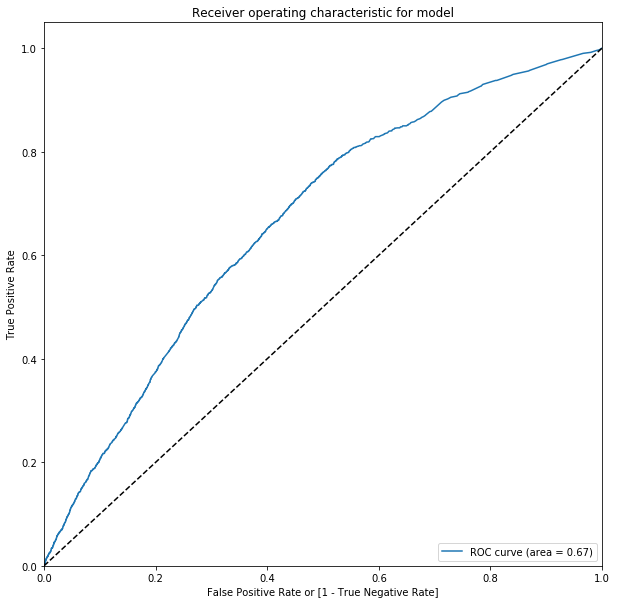

In [459]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train, predicted.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train, predicted.Default_Prob)

#### Finding optimal probability cut-off

In [460]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    predicted[i] = predicted.Default_Prob.map(lambda x: 1 if x > i else 0)
predicted.head()

,Default_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.021019,0,1,0,0,0,0,0,0,0,0,0
1,0.038418,0,1,0,0,0,0,0,0,0,0,0
2,0.091722,0,1,0,0,0,0,0,0,0,0,0
3,0.020858,0,1,0,0,0,0,0,0,0,0,0
4,0.021509,0,1,0,0,0,0,0,0,0,0,0


In [461]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

In [462]:
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

In [463]:
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train, predicted[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0  0.0   0.042205  1.000000  0.000000  0.042205 NaN      
0.1  0.1   0.932766  0.066860  0.970922  0.092000  0.959371
0.2  0.2   0.957468  0.001453  0.999594  0.136364  0.957837
0.3  0.3   0.957795  0.000000  1.000000 NaN        0.957795
0.4  0.4   0.957795  0.000000  1.000000 NaN        0.957795
0.5  0.5   0.957795  0.000000  1.000000 NaN        0.957795
0.6  0.6   0.957795  0.000000  1.000000 NaN        0.957795
0.7  0.7   0.957795  0.000000  1.000000 NaN        0.957795
0.8  0.8   0.957795  0.000000  1.000000 NaN        0.957795
0.9  0.9   0.957795  0.000000  1.000000 NaN        0.957795


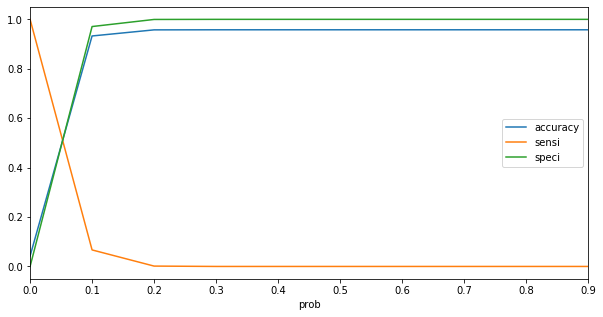

In [464]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [465]:
## making our final prediction on basis of optimal cut-off of 0.05
predicted['predicted'] = predicted.Default_Prob.map(lambda x: 1 if x > 0.05 else 0)
predicted.head()

,Default_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.021019,0,1,0,0,0,0,0,0,0,0,0
1,0.038418,0,1,0,0,0,0,0,0,0,0,0
2,0.091722,1,1,0,0,0,0,0,0,0,0,0
3,0.020858,0,1,0,0,0,0,0,0,0,0,0
4,0.021509,0,1,0,0,0,0,0,0,0,0,0


In [466]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train, predicted.predicted )
confusion_matrix

array([[32999, 13841],
       [  977,  1087]], dtype=int64)

In [467]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train, predicted.predicted ),2))

Accuracy: 	 0.7


In [468]:
# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train, predicted.predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train, predicted.Default_Prob),2)) 

Sensitivity: 	0.53
Specificity: 	0.7
AUC:    	 0.67


In [469]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train, predicted.predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train, predicted.predicted ))

precision :  0.07281618435155413
recall :  0.5266472868217055


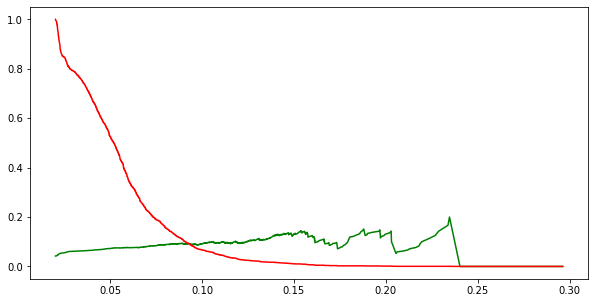

In [470]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train, predicted.Default_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Predicting on Test Data

In [471]:
# predict on test data
X_test.shape

(20960, 35)

In [472]:
## transforming test data
X_test[scaleColumns]=scaler.transform(X_test[scaleColumns])
X_test.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Education_UNKNOWN,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
54362,0.638298,0.50,0.633333,0.466667,0.146154,0.333333,0.2,0.142857,0.2,0.142857,0.111111,0.292035,0.250000,0.321429,0.333333,0.333333,0.3,0.3,0.0,0.159824,0.227273,0,1,0,0,0,0,1,0,1,0,0,0,0,1
12028,0.680851,0.25,0.333333,0.000000,0.453846,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.035398,0.083333,0.071429,0.000000,0.000000,0.0,0.0,0.0,0.002312,0.068182,0,1,0,0,0,0,1,0,1,0,0,0,0,1
25144,0.404255,0.75,0.633333,0.000000,0.330769,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.079646,0.250000,0.178571,0.166667,0.083333,0.2,0.2,0.0,0.039134,0.136364,0,0,0,1,0,0,0,0,1,0,0,0,0,1
46373,0.617021,0.50,0.750000,0.916667,0.292308,0.000000,0.0,0.000000,0.0,0.000000,0.111111,1.000000,0.250000,0.285714,0.333333,0.333333,0.1,0.1,0.0,0.149533,0.204545,0,1,0,0,0,0,1,0,0,0,0,0,0,1
6891,1.000000,0.50,0.400000,0.908333,0.415385,0.000000,0.0,0.000000,0.0,0.142857,0.111111,0.079646,0.000000,0.035714,0.000000,0.000000,0.0,0.0,1.0,0.568478,0.045455,0,1,0,0,0,0,1,0,0,0,0,0,1,0


In [473]:
## Adding constant
column = col.copy()
X_test_sm = sm.add_constant(X_test[col])

In [474]:
## making prediction on test data
y_test_pred = res.predict(X_test_sm)

# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Let's see the head
y_pred_1.head()

,0
54362,0.047193
12028,0.020858
25144,0.026973
46373,0.079722
6891,0.026412


In [475]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [476]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [477]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [478]:
y_pred_final.head()

,Performance_Tag_y,0
0,0.0,0.047193
1,0.0,0.020858
2,0.0,0.026973
3,0.0,0.079722
4,0.0,0.026412


In [479]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Default_Prob'})

In [480]:
y_pred_final['final_predicted'] = y_pred_final.Default_Prob.map(lambda x: 1 if x > 0.05 else 0)

In [481]:
confusion2 = metrics.confusion_matrix(y_pred_final.Performance_Tag_y, y_pred_final.final_predicted )
confusion2

array([[14061,  6016],
       [  433,   450]], dtype=int64)

In [482]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [483]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.5096262740656852

In [484]:
# Let us calculate specificity
TN / float(TN+FP)

0.7003536384918065

In [485]:
# precision
print("precision", metrics.precision_score(y_pred_final.Performance_Tag_y, y_pred_final.final_predicted))

# recall/sensitivity
print("recall", metrics.recall_score(y_pred_final.Performance_Tag_y, y_pred_final.final_predicted))

precision 0.06959480358799876
recall 0.5096262740656852


### Prediction on Additional data (rejected applications)

In [486]:
# Merging both the data frame for nulls data
all_demographics_cb_nulls_data = pd.merge(demographics_nulls,CreditBureau_nulls, how='inner', on = "App_Id")
all_demographics_cb_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
0,906908303,35,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18,NaN,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0,NaN
1,10990583,47,F,Married,4.0,12.0,Masters,SE,Rented,122,25,NaN,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0,NaN
2,589678446,46,M,Married,3.0,7.0,Professional,SE,Rented,10,31,NaN,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0,NaN
3,809411322,41,M,Married,3.0,18.0,Masters,SAL,Rented,6,47,NaN,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0,NaN
4,150246616,42,F,Married,4.0,17.0,Phd,SAL,Rented,8,49,NaN,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1,NaN


In [487]:
## removing one of the Performance tag as it is redundent
all_demographics_cb_nulls_data = all_demographics_cb_nulls_data.drop(['Performance_Tag_x','Performance_Tag_y','App_Id'],axis=1)

all_demographics_cb_nulls_data.head()

,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,35,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0
1,47,F,Married,4.0,12.0,Masters,SE,Rented,122,25,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0
2,46,M,Married,3.0,7.0,Professional,SE,Rented,10,31,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0
3,41,M,Married,3.0,18.0,Masters,SAL,Rented,6,47,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0
4,42,F,Married,4.0,17.0,Phd,SAL,Rented,8,49,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1


In [488]:
## chcking the object type for creating dummies
object_dtype = all_demographics_cb_nulls_data.select_dtypes('object').columns

# Creating a dummy variable for the variable 'job' and dropping the first one.
for col in object_dtype:
    
    col = pd.get_dummies(all_demographics_cb_nulls_data[col],prefix=col,drop_first=True)
    all_demographics_cb_nulls_data = pd.concat([all_demographics_cb_nulls_data,col],axis=1)

#Adding the results to the master dataframe
all_demographics_cb_nulls_data.drop(object_dtype, inplace = True,axis = 1)

all_demographics_cb_nulls_data.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
0,35,1.0,6.0,22,18,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0,1,1,0,0,0,0,0,0,0,0,0,1
1,47,4.0,12.0,122,25,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0,0,0,1,0,0,0,1,0,0,0,0,1
2,46,3.0,7.0,10,31,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0,1,0,0,0,0,1,1,0,0,0,0,1
3,41,3.0,18.0,6,47,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0,1,0,1,0,0,0,0,0,0,0,0,1
4,42,4.0,17.0,8,49,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1,0,0,0,0,1,0,0,0,0,0,0,1


In [489]:
# Standardisation continuous features for X_additional_df
#all_demographics_cb_nulls_data = all_demographics_cb_nulls_data.drop(['App_Id'],axis=1)

## transforming test data
all_demographics_cb_nulls_data[scaleColumns]=scaler.transform(all_demographics_cb_nulls_data[scaleColumns])
all_demographics_cb_nulls_data.head()

,Age,Dependents_No,Income,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Gender_M,Marital_Status_Single,Education_Masters,Education_Others,Education_Phd,Education_Professional,Profession_SE,Profession_SE_PROF,Residence_Type_Living with Parents,Residence_Type_Others,Residence_Type_Owned,Residence_Type_Rented
0,0.361702,0.00,0.100000,0.133333,0.115385,0.000000,0.0,0.285714,0.2,0.285714,0.333333,0.265487,0.333333,0.428571,0.500000,0.583333,0.2,0.20,0.0,0.250943,0.295455,0,1,1,0,0,0,0,0,0,0,0,0,1
1,0.617021,0.75,0.200000,0.966667,0.169231,0.333333,0.2,0.142857,0.6,0.285714,0.222222,0.141593,0.250000,0.250000,0.500000,0.333333,0.3,0.25,0.0,0.148621,0.159091,0,0,0,1,0,0,0,1,0,0,0,0,1
2,0.595745,0.50,0.116667,0.033333,0.215385,1.000000,0.8,0.714286,0.6,0.714286,0.666667,0.734513,0.166667,0.250000,0.333333,0.333333,0.0,0.15,0.0,0.140377,0.181818,0,1,0,0,0,0,1,1,0,0,0,0,1
3,0.489362,0.50,0.300000,0.000000,0.338462,0.333333,0.6,0.571429,0.6,0.571429,0.555556,0.769912,0.166667,0.250000,0.166667,0.333333,0.4,0.25,0.0,0.161351,0.181818,0,1,0,1,0,0,0,0,0,0,0,0,1
4,0.510638,0.75,0.283333,0.016667,0.353846,0.666667,0.4,0.571429,0.6,0.285714,0.666667,0.371681,0.250000,0.250000,0.333333,0.250000,0.3,0.30,0.0,0.150800,0.159091,1,0,0,0,0,1,0,0,0,0,0,0,1


In [490]:
## adding constant to the additional dataset
X_additional_sm = sm.add_constant(all_demographics_cb_nulls_data[column])

## making prediction probabilities
y_additional_pred = res.predict(X_additional_sm)
## checking values
y_additional_pred[:10]

0    0.075586
1    0.058325
2    0.153931
3    0.131155
4    0.127641
5    0.077120
6    0.072355
7    0.124315
8    0.070825
9    0.089491
dtype: float64

In [491]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(all_demographics_cb_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.075586
1,1,2,0.058325
2,1,3,0.153931
3,1,4,0.131155
4,1,5,0.127641


In [492]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.075586
1,1,2,0.058325
2,1,3,0.153931
3,1,4,0.131155
4,1,5,0.127641


In [493]:
## evaluating result based on the cut-off value obtained above
y_pred_additional_df['final_predicted'] = y_pred_additional_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)

y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.075586,1
1,1,2,0.058325,1
2,1,3,0.153931,1
3,1,4,0.131155,1
4,1,5,0.127641,1


In [494]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [  86, 1339]], dtype=int64)

In [495]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.94
Sensitivity: 	0.94
Specificity: 	0.0


In [496]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.9396491228070175


## 8.3.B) Decision Tree Model - Combined Data

In [497]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [498]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.53      0.69     20077
         1.0       0.07      0.75      0.12       883

    accuracy                           0.54     20960
   macro avg       0.52      0.64      0.40     20960
weighted avg       0.94      0.54      0.66     20960



In [499]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, n_jobs =-1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    7.7s finished


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.548136,0.027958,0.018351,0.003818,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.632348,0.612003,0.550148,0.562519,0.577607,0.586925,0.030748,13
1,0.549530,0.061000,0.014760,0.002776,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.632348,0.612003,0.550148,0.562519,0.577607,0.586925,0.030748,13
2,0.554717,0.025313,0.014560,0.001493,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.658522,0.614661,0.659135,0.565075,0.570552,0.613590,0.040744,9
3,0.563628,0.026151,0.016114,0.003095,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 100}",0.658522,0.614661,0.659135,0.565075,0.570552,0.613590,0.040744,9
4,0.893236,0.046291,0.021075,0.012910,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.601370,0.628463,0.670995,0.687046,0.653170,0.648209,0.030450,1
5,0.870253,0.039296,0.011966,0.006071,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.601370,0.628463,0.670790,0.687251,0.653170,0.648209,0.030472,1
6,0.832988,0.055811,0.012501,0.006250,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.629486,0.635722,0.600348,0.683672,0.678425,0.645530,0.031407,5
7,0.873278,0.086409,0.015160,0.002035,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 100, 'min_samples_split': 100}",0.629486,0.635722,0.600348,0.683263,0.678425,0.645448,0.031308,6
8,0.548897,0.055866,0.024336,0.012997,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.649320,0.554647,0.576833,0.545139,0.575358,0.580259,0.036592,15
9,0.571278,0.048712,0.017348,0.007295,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.649320,0.554647,0.576833,0.545139,0.575358,0.580259,0.036592,15


In [500]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10646  9431]
 [  225   658]]
accuracy 0.5393129770992366
precision 0.06521954604024184
recall 0.7451868629671574


In [501]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_train.columns)
features

['Age',
 'Dependents_No',
 'Income',
 'Months_Current_Residence',
 'Months_Current_Company',
 'No_90_DPD_last_6_months',
 'No_60_DPD_last_6_months',
 'No_30_DPD_last_6_months',
 'No_90_DPD_last_12_months',
 'No_60_DPD_last_12_months',
 'No_30_DPD_last_12_months',
 'Avgas_CC_Utilization_12_months',
 'Trades_opened_last_6_months',
 'Trades_opened_last_12_months',
 'PL_Trades_opened_last_6_months',
 'PL_Trades_opened_last_12_months',
 'Inquiries_last_6_months',
 'Inquiries_last_12_months',
 'Presence_open_home_loan',
 'Outstanding_Balance',
 'Total_Trades',
 'Presence_open_auto_loan',
 'Gender_M',
 'Marital_Status_Single',
 'Education_Masters',
 'Education_Others',
 'Education_Phd',
 'Education_Professional',
 'Education_UNKNOWN',
 'Profession_SE',
 'Profession_SE_PROF',
 'Residence_Type_Living with Parents',
 'Residence_Type_Others',
 'Residence_Type_Owned',
 'Residence_Type_Rented']

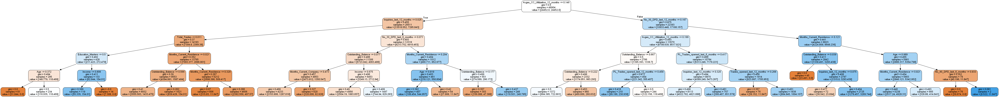

In [502]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Hyperparameter Tunning

##### Tuning max_depth

In [503]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:  1.5min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [504]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.094946,0.006030,0.015358,0.001739,1,{'max_depth': 1},0.718310,0.722222,0.633005,0.722611,0.828010,0.724829,0.061857,2,0.697802,0.697242,0.697829,0.751682,0.846711,0.738253,0.058130
1,0.150164,0.013374,0.016158,0.002309,2,{'max_depth': 2},0.718310,0.722222,0.633005,0.722611,0.828010,0.724829,0.061857,2,0.697802,0.697242,0.697829,0.751682,0.846711,0.738253,0.058130
2,0.170165,0.014990,0.014383,0.001834,3,{'max_depth': 3},0.748826,0.767677,0.650246,0.668998,0.791155,0.725379,0.055658,1,0.749084,0.743405,0.708685,0.681957,0.785154,0.733657,0.035444
3,0.219714,0.011595,0.013963,0.001782,4,{'max_depth': 4},0.746479,0.694444,0.645320,0.675991,0.692875,0.691022,0.032880,5,0.742979,0.687050,0.716526,0.704587,0.683162,0.706861,0.021713
4,0.258310,0.015060,0.012367,0.001353,5,{'max_depth': 5},0.751174,0.714646,0.615764,0.722611,0.700246,0.700888,0.045687,4,0.763126,0.735612,0.720748,0.772477,0.726011,0.743595,0.020545


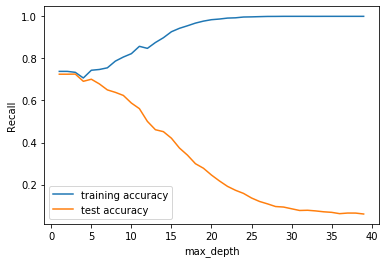

In [505]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning min_samples_leaf

In [506]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   19.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [507]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.450277,0.038416,0.012494,0.006247,5,{'min_samples_leaf': 5},0.150121,0.125908,0.125908,0.196126,0.128641,0.145341,0.026967,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.387445,0.011689,0.006246,0.007650,25,{'min_samples_leaf': 25},0.348668,0.334140,0.322034,0.358354,0.327670,0.338173,0.013450,9,0.919443,0.925500,0.910963,0.918231,0.926755,0.920178,0.005671
2,0.362425,0.018216,0.009372,0.007652,45,{'min_samples_leaf': 45},0.462470,0.433414,0.430993,0.430993,0.427184,0.437011,0.012885,8,0.911569,0.898243,0.894004,0.900666,0.894673,0.899831,0.006349
3,0.340570,0.020732,0.006248,0.007652,65,{'min_samples_leaf': 65},0.486683,0.469734,0.447942,0.510896,0.470874,0.477226,0.020867,7,0.860690,0.855845,0.850394,0.860690,0.843826,0.854289,0.006466
4,0.328090,0.017112,0.009369,0.007650,85,{'min_samples_leaf': 85},0.542373,0.469734,0.513317,0.544794,0.480583,0.510161,0.030842,6,0.834040,0.832829,0.835251,0.849182,0.819007,0.834062,0.009573


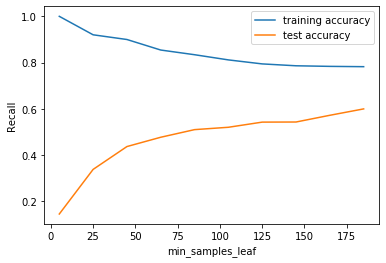

In [508]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning min_samples_split

In [509]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   22.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [510]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.486167,0.031516,0.008433,0.007090,5,{'min_samples_split': 5},0.077482,0.048426,0.072639,0.079903,0.058252,0.067341,0.012076,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.428065,0.007652,0.012494,0.006247,25,{'min_samples_split': 25},0.193705,0.169492,0.186441,0.220339,0.191748,0.192345,0.016389,9,0.999394,0.996972,0.997577,0.999394,0.998789,0.998425,0.000984
2,0.415574,0.015928,0.012496,0.006248,45,{'min_samples_split': 45},0.268765,0.259080,0.254237,0.324455,0.269417,0.275191,0.025299,8,0.981829,0.983646,0.981224,0.986675,0.987288,0.984132,0.002467
3,0.412431,0.021211,0.009368,0.007649,65,{'min_samples_split': 65},0.312349,0.309927,0.305085,0.375303,0.305825,0.321698,0.026935,7,0.966081,0.968504,0.956390,0.964264,0.969734,0.964995,0.004702
4,0.406875,0.019913,0.014473,0.002250,85,{'min_samples_split': 85},0.355932,0.351090,0.346247,0.409201,0.349515,0.362397,0.023610,6,0.955784,0.955179,0.946093,0.948516,0.954600,0.952035,0.003955


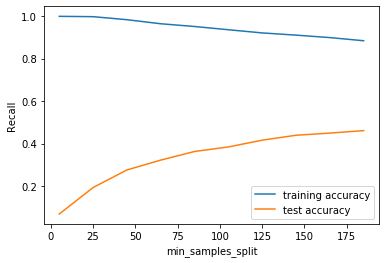

In [511]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Grid Search to Find Optimal Hyperparameters

In [512]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  4.4min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [513]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.234460,0.020915,0.008713,0.005304,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.595642,0.612591,0.728814,0.704600,0.686893,0.665708,0.052297,6,0.669897,0.686856,0.745609,0.737735,0.728208,0.713661,0.029818
1,0.217999,0.008824,0.006248,0.007652,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.595642,0.612591,0.728814,0.704600,0.686893,0.665708,0.052297,6,0.669897,0.686856,0.745609,0.737735,0.728208,0.713661,0.029818
2,0.218692,0.009880,0.006256,0.007662,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 150}",0.595642,0.612591,0.728814,0.704600,0.686893,0.665708,0.052297,6,0.669897,0.686856,0.745609,0.737735,0.728208,0.713661,0.029818
3,0.272411,0.013117,0.014365,0.001582,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 200}",0.595642,0.612591,0.731235,0.704600,0.686893,0.666192,0.052887,5,0.669897,0.686856,0.745003,0.737735,0.728208,0.713540,0.029689
4,0.258459,0.028352,0.011757,0.006045,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.564165,0.619855,0.615012,0.702179,0.699029,0.640047,0.053164,29,0.637190,0.685039,0.622047,0.734101,0.732446,0.682164,0.046628


In [514]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.675395185035253
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [515]:
# model with optimal hyperparameters
clf_ginni = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='gini', 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=200)
clf_ginni.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=100, splitter='best')

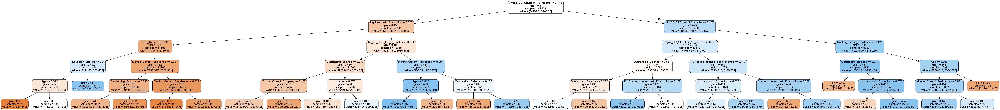

In [516]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_ginni, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [517]:
## checking accuracy score
clf_ginni.score(X_test,y_test)

0.539074427480916

In [518]:
## making predictions
y_pred = clf_ginni.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10640  9437]
 [  224   659]]
accuracy 0.539074427480916
precision 0.06527337559429477
recall 0.7463193657984145


### Prediction on Additional data (rejected applications)

In [519]:
all_demographics_cb_nulls_data.columns

Index(['Age', 'Dependents_No', 'Income', 'Months_Current_Residence',
       'Months_Current_Company', 'No_90_DPD_last_6_months',
       'No_60_DPD_last_6_months', 'No_30_DPD_last_6_months',
       'No_90_DPD_last_12_months', 'No_60_DPD_last_12_months',
       'No_30_DPD_last_12_months', 'Avgas_CC_Utilization_12_months',
       'Trades_opened_last_6_months', 'Trades_opened_last_12_months',
       'PL_Trades_opened_last_6_months', 'PL_Trades_opened_last_12_months',
       'Inquiries_last_6_months', 'Inquiries_last_12_months',
       'Presence_open_home_loan', 'Outstanding_Balance', 'Total_Trades',
       'Presence_open_auto_loan', 'Gender_M', 'Marital_Status_Single',
       'Education_Masters', 'Education_Others', 'Education_Phd',
       'Education_Professional', 'Profession_SE', 'Profession_SE_PROF',
       'Residence_Type_Living with Parents', 'Residence_Type_Others',
       'Residence_Type_Owned', 'Residence_Type_Rented'],
      dtype='object')

In [520]:
all_demographics_cb_nulls_data.isnull().sum()

Age                                   0 
Dependents_No                         0 
Income                                0 
Months_Current_Residence              0 
Months_Current_Company                0 
No_90_DPD_last_6_months               0 
No_60_DPD_last_6_months               0 
No_30_DPD_last_6_months               0 
No_90_DPD_last_12_months              0 
No_60_DPD_last_12_months              0 
No_30_DPD_last_12_months              0 
Avgas_CC_Utilization_12_months        35
Trades_opened_last_6_months           0 
Trades_opened_last_12_months          0 
PL_Trades_opened_last_6_months        0 
PL_Trades_opened_last_12_months       0 
Inquiries_last_6_months               0 
Inquiries_last_12_months              0 
Presence_open_home_loan               0 
Outstanding_Balance                   0 
Total_Trades                          0 
Presence_open_auto_loan               0 
Gender_M                              0 
Marital_Status_Single                 0 
Education_Master

In [521]:
all_demographics_cb_nulls_data.loc[all_demographics_cb_nulls_data.Avgas_CC_Utilization_12_months.isnull(),
                 'Avgas_CC_Utilization_12_months'] = all_demographics_cb_nulls_data.Avgas_CC_Utilization_12_months.median()

In [522]:
all_demographics_cb_nulls_data.isnull().sum()

Age                                   0
Dependents_No                         0
Income                                0
Months_Current_Residence              0
Months_Current_Company                0
No_90_DPD_last_6_months               0
No_60_DPD_last_6_months               0
No_30_DPD_last_6_months               0
No_90_DPD_last_12_months              0
No_60_DPD_last_12_months              0
No_30_DPD_last_12_months              0
Avgas_CC_Utilization_12_months        0
Trades_opened_last_6_months           0
Trades_opened_last_12_months          0
PL_Trades_opened_last_6_months        0
PL_Trades_opened_last_12_months       0
Inquiries_last_6_months               0
Inquiries_last_12_months              0
Presence_open_home_loan               0
Outstanding_Balance                   0
Total_Trades                          0
Presence_open_auto_loan               0
Gender_M                              0
Marital_Status_Single                 0
Education_Masters                     0


In [523]:
all_demographics_cb_nulls_data['Education_UNKNOWN'] = 0

In [524]:
## making prediction probabilities
y_additional_pred = clf_ginni.predict(all_demographics_cb_nulls_data)
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,0.0
2,1.0
3,1.0
4,1.0


In [525]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(all_demographics_cb_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,0.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [526]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,0.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [527]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [  67, 1358]], dtype=int64)

In [528]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.95
Sensitivity: 	0.95
Specificity: 	0.0


In [529]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.95
Sensitivity: 	0.95
Specificity: 	0.0


## 8.3.C) Randon Forest Model - Combined DataSet

In [530]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [531]:
# Making predictions
predictions = rfc.predict(X_test)

In [532]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98     20077
         1.0       0.00      0.00      0.00       883

    accuracy                           0.96     20960
   macro avg       0.48      0.50      0.49     20960
weighted avg       0.92      0.96      0.94     20960



In [533]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[20076     1]
 [  883     0]]
accuracy 0.957824427480916
precision 0.0
recall 0.0


### Tunning Hyperparametres

##### Tunning max_depth

In [534]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:   11.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [535]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.166028,0.015569,0.021083,0.005938,2,{'max_depth': 2},0.711864,0.702179,0.777240,0.740920,0.718447,0.730130,0.026785,1,0.708661,0.723198,0.779528,0.737129,0.717312,0.733166,0.024965
1,0.280475,0.019814,0.018738,0.006247,6,{'max_depth': 6},0.634383,0.631961,0.673123,0.629540,0.633495,0.640501,0.016394,2,0.729861,0.704422,0.725015,0.711690,0.706416,0.715481,0.010164
2,0.390952,0.014004,0.018742,0.006247,10,{'max_depth': 10},0.375303,0.418886,0.428571,0.397094,0.371359,0.398243,0.022787,3,0.732889,0.738340,0.733495,0.723198,0.717918,0.729168,0.007469
3,0.472588,0.037133,0.024992,0.007654,14,{'max_depth': 14},0.121065,0.128329,0.104116,0.108959,0.114078,0.115310,0.008600,4,0.803755,0.801938,0.780739,0.781345,0.780872,0.789730,0.010727
4,0.499905,0.013956,0.028119,0.006251,18,{'max_depth': 18},0.012107,0.041162,0.012107,0.019370,0.038835,0.024716,0.012778,5,0.814052,0.820109,0.790430,0.801938,0.837167,0.812739,0.015919


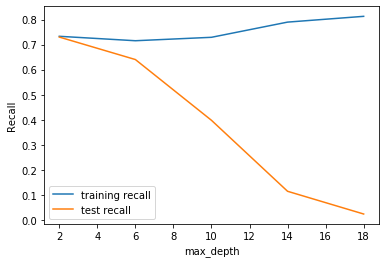

In [536]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning n_estimators

In [537]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  5.3min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [538]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.936828,0.059654,0.077811,0.000598,100,{'n_estimators': 100},0.636804,0.610169,0.665860,0.629540,0.660194,0.640513,0.020419,4,0.719564,0.712901,0.748031,0.711084,0.725787,0.723474,0.013334
1,9.947675,1.339701,0.407033,0.048847,500,{'n_estimators': 500},0.631961,0.622276,0.663438,0.636804,0.650485,0.640993,0.014445,3,0.721987,0.711690,0.740763,0.709873,0.734262,0.723715,0.012174
2,17.265866,1.236615,0.690816,0.006938,900,{'n_estimators': 900},0.634383,0.619855,0.668281,0.644068,0.645631,0.642443,0.015847,2,0.716535,0.713507,0.743792,0.711690,0.733051,0.723715,0.012574
3,23.849360,0.089821,0.978034,0.021352,1300,{'n_estimators': 1300},0.636804,0.624697,0.668281,0.631961,0.655340,0.643416,0.016036,1,0.718958,0.714113,0.738946,0.711084,0.736077,0.723836,0.011481


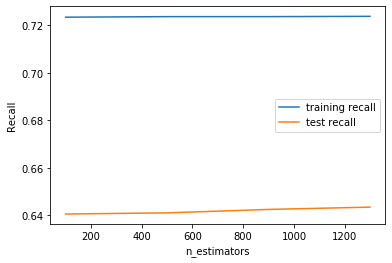

In [539]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning max_features

In [540]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 12, 16]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    9.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [541]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.252536,0.013685,0.021415,0.005980,4,{'max_features': 4},0.641646,0.607748,0.653753,0.639225,0.652913,0.639057,0.016703,3,0.732283,0.699576,0.711084,0.712296,0.715496,0.714147,0.010544
1,0.356206,0.024993,0.021868,0.007654,8,{'max_features': 8},0.648910,0.631961,0.665860,0.639225,0.657767,0.648744,0.012220,1,0.726227,0.712901,0.718958,0.715930,0.717312,0.718266,0.004450
2,0.456161,0.006241,0.015617,0.000004,12,{'max_features': 12},0.658596,0.600484,0.675545,0.600484,0.667476,0.640516,0.033124,2,0.722592,0.715324,0.727438,0.718958,0.734867,0.723836,0.006818
3,0.565528,0.011679,0.015615,0.000004,16,{'max_features': 16},0.636804,0.646489,0.651332,0.622276,0.638350,0.639050,0.009931,4,0.712901,0.736523,0.741975,0.721987,0.738499,0.730377,0.011082


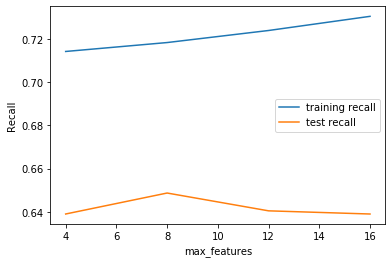

In [542]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning min_samples_leaf

In [543]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   12.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [544]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.385728,0.031950,0.017476,0.003730,100,{'min_samples_leaf': 100},0.513317,0.556901,0.590799,0.542373,0.575243,0.555726,0.026793,6,0.716535,0.715324,0.718353,0.711084,0.710654,0.714390,0.003035
1,0.337453,0.007661,0.015617,0.000002,150,{'min_samples_leaf': 150},0.566586,0.581114,0.624697,0.619855,0.621359,0.602722,0.024069,5,0.716535,0.711690,0.722592,0.702604,0.724576,0.715600,0.007931
2,0.321809,0.012501,0.018746,0.006254,200,{'min_samples_leaf': 200},0.593220,0.622276,0.665860,0.612591,0.621359,0.623061,0.023813,4,0.693519,0.698970,0.731072,0.703816,0.697942,0.705064,0.013410
3,0.303065,0.015942,0.015615,0.000003,250,{'min_samples_leaf': 250},0.624697,0.644068,0.665860,0.629540,0.633495,0.639532,0.014629,3,0.689885,0.703210,0.721987,0.689279,0.696126,0.700097,0.012049
4,0.306211,0.021203,0.021867,0.007654,300,{'min_samples_leaf': 300},0.634383,0.651332,0.675545,0.665860,0.648058,0.655036,0.014330,2,0.718353,0.725621,0.713507,0.705633,0.725787,0.717780,0.007638


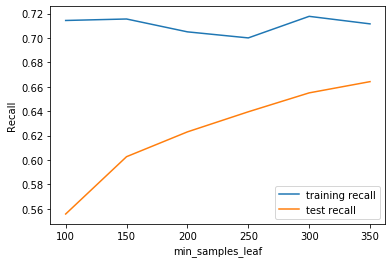

In [545]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Tuning min_samples_split

In [546]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   15.1s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [547]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.437662,0.042301,0.020403,0.006306,200,{'min_samples_split': 200},0.372881,0.404358,0.368039,0.380145,0.405340,0.386152,0.015747,6,0.725621,0.712296,0.726832,0.717141,0.730630,0.722504,0.006745
1,0.404212,0.007166,0.024985,0.007659,250,{'min_samples_split': 250},0.416465,0.452785,0.457627,0.479419,0.475728,0.456404,0.022418,5,0.723804,0.706844,0.711084,0.725015,0.721550,0.717659,0.007310
2,0.390543,0.013980,0.028132,0.006218,300,{'min_samples_split': 300},0.447942,0.498789,0.484262,0.503632,0.480583,0.483041,0.019553,3,0.712296,0.726832,0.721381,0.716535,0.719128,0.719235,0.004853
3,0.381580,0.008191,0.015631,0.000025,350,{'min_samples_split': 350},0.423729,0.508475,0.486683,0.486683,0.468447,0.474803,0.028513,4,0.711084,0.721381,0.718353,0.708661,0.710048,0.713906,0.005020
4,0.386136,0.015794,0.018750,0.006245,400,{'min_samples_split': 400},0.489104,0.515738,0.537530,0.544794,0.504854,0.518405,0.020550,2,0.706844,0.711084,0.713507,0.708661,0.702785,0.708576,0.003665


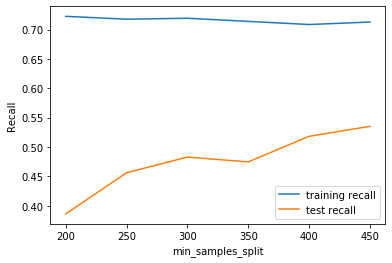

In [548]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Grid Search to Find Optimal Hyperparameters

In [549]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[250,300, 350]
    'min_samples_split': [400, 450], ##[350,400, 450]
    'n_estimators': [900,1000], ##[800,900,1000]
    'max_features': [10,15,20]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 36.3min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 49.5min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [550]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.7054259900269728 using {'max_depth': 4, 'max_features': 20, 'min_samples_leaf': 300, 'min_samples_split': 400, 'n_estimators': 900}


In [551]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=350, 
                             min_samples_split=400,
                             max_features=15,
                             n_estimators=900,class_weight='balanced')

In [552]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.98      0.56      0.72     20077
         1.0       0.07      0.72      0.12       883

    accuracy                           0.57     20960
   macro avg       0.52      0.64      0.42     20960
weighted avg       0.94      0.57      0.69     20960



In [553]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[11312  8765]
 [  244   639]]
accuracy 0.5701812977099237
precision 0.06794980859208848
recall 0.7236693091732729


### Prediction on Additional data (rejected applications)

In [554]:
## making prediction probabilities
y_additional_pred = rfc.predict(all_demographics_cb_nulls_data)
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0


In [555]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(all_demographics_cb_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [556]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [557]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [   1, 1424]], dtype=int64)

In [558]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 1.0
Sensitivity: 	1.0
Specificity: 	0.0


In [559]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.9992982456140351


## 8.4) Models Building for Combined(Demographic and Credit Bureau) WoE Data

In [560]:
from sklearn.model_selection import train_test_split

In [561]:
## reading combined WoE data file
woe_all_data = pd.read_csv("woe_all_data.csv",sep=",")
woe_all_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,954457215.0,0.038430,0.031600,-0.003867,-0.085864,-0.205896,0.016619,-0.028772,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046
1,432830445.0,-0.030641,-0.009922,-0.003867,-0.026213,-0.331147,-0.018719,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.817924,0.038894,0.012046
2,941387308.0,-0.030641,-0.009922,0.022652,-0.085864,-0.179334,0.016619,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.795097,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.873160,0.012046
3,392161677.0,-0.040578,-0.009922,-0.003867,0.039511,-0.331147,0.016619,0.093815,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.673300,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,0.203881,-0.448426,-0.139116
4,182011211.0,0.047117,0.031600,-0.003867,0.007785,-0.179334,-0.018719,-0.028772,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.464817,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046


In [562]:
## taking all variables to X ignoring Performance_Tag and App_Id (this is Y variable)
X = woe_all_data.drop(['Performance_Tag','App_Id'], axis=1)

X.head()

,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,0.038430,0.031600,-0.003867,-0.085864,-0.205896,0.016619,-0.028772,-0.004057,-0.072814,-0.292466,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046
1,-0.030641,-0.009922,-0.003867,-0.026213,-0.331147,-0.018719,-0.013872,-0.004057,-0.072814,-0.145333,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.817924,0.038894,0.012046
2,-0.030641,-0.009922,0.022652,-0.085864,-0.179334,0.016619,-0.013872,-0.004057,-0.072814,-0.145333,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.795097,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.873160,0.012046
3,-0.040578,-0.009922,-0.003867,0.039511,-0.331147,0.016619,0.093815,-0.004057,-0.072814,-0.292466,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.673300,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,0.203881,-0.448426,-0.139116
4,0.047117,0.031600,-0.003867,0.007785,-0.179334,-0.018719,-0.028772,-0.004057,-0.072814,-0.145333,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.464817,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046


In [563]:
## taking Converted as Y variable
y = woe_all_data['Performance_Tag']

y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Performance_Tag, dtype: float64

In [564]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

- features are already scaled

In [565]:
## checking the percentage of Performance tag across the data
Performance_Tag_percent = (sum(woe_all_data['Performance_Tag'])/len(woe_all_data['Performance_Tag'].index))*100
Performance_Tag_percent

4.220333161600549

## 8.4.A) Logistic Regression Model - WOE combined Dataset

In [566]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
## taking into account class imbalance
logreg = LogisticRegression(random_state=101,class_weight='balanced')

## running RFE with 15 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             
rfe = rfe.fit(X_train, y_train)

In [567]:
## list support variables
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Age', True, 1),
 ('Gender', True, 1),
 ('Marital_Status', True, 1),
 ('Dependents_No', True, 1),
 ('Income', True, 1),
 ('Education', True, 1),
 ('Profession', True, 1),
 ('Residence_Type', True, 1),
 ('Months_Current_Residence', False, 2),
 ('Months_Current_Company', True, 1),
 ('No_90_DPD_last_6_months', False, 6),
 ('No_60_DPD_last_6_months', False, 5),
 ('No_30_DPD_last_6_months', False, 3),
 ('No_90_DPD_last_12_months', False, 9),
 ('No_60_DPD_last_12_months', False, 7),
 ('No_30_DPD_last_12_months', True, 1),
 ('Avgas_CC_Utilization_12_months', True, 1),
 ('Trades_opened_last_6_months', False, 11),
 ('Trades_opened_last_12_months', True, 1),
 ('PL_Trades_opened_last_6_months', False, 10),
 ('PL_Trades_opened_last_12_months', False, 13),
 ('Inquiries_last_6_months', False, 4),
 ('Inquiries_last_12_months', False, 8),
 ('Presence_open_home_loan', True, 1),
 ('Outstanding_Balance', True, 1),
 ('Total_Trades', False, 12),
 ('Presence_open_auto_loan', True, 1)]

In [568]:
## list of all the support variables
col = X_train.columns[rfe.support_]
col

Index(['Age', 'Gender', 'Marital_Status', 'Dependents_No', 'Income',
       'Education', 'Profession', 'Residence_Type', 'Months_Current_Company',
       'No_30_DPD_last_12_months', 'Avgas_CC_Utilization_12_months',
       'Trades_opened_last_12_months', 'Presence_open_home_loan',
       'Outstanding_Balance', 'Presence_open_auto_loan'],
      dtype='object')

In [569]:
## creating model and checking the summary for significance of all variables
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train[col])
logm15 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm15.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48897
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8156.7
Date:                Sun, 22 Dec 2019   Deviance:                       16313.
Time:                        13:44:39   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1234      0.024   -131.849      0.000      -3.170      -3.077
Age                                0.6415      0.326      1.970      0.049       0.003       1.280
Gender                             0.3863      0.919      0.420      0.674      -1.415       2.188
Marital_Status                    -1.2739      2.190     -0.582      0.561      -5.567       3.019
Dependents_No                      0.7092      0.428      1.655      0.098      -0.131       1.549
Income                             0.3556      0.120      2.956      0.003       0.120       0.591
Education                          1.2051      0.762      1.582      0.114      -0.288       2.698
Profession                         0.8807      0.460      1.915      0.056      -0.021       1.782
Residence_Type                     1.5273      0.883      1.729      0.084      -0.204       3.258
Months_Current_Company             0.3481      0.160      2.172      0.030       0.034       0.662
No_30_DPD_last_12_months           0.3948      0.056      7.108      0.000       0.286       0.504
Avgas_CC_Utilization_12_months     0.4773      0.061      7.861      0.000       0.358       0.596
Trades_opened_last_12_months       0.2317      0.080      2.901      0.004       0.075       0.388
Presence_open_home_loan            2.8599      1.901      1.505      0.132      -0.865       6.585
Outstanding_Balance                0.2748      0.085      3.222      0.001       0.108       0.442
Presence_open_auto_loan            0.3933      0.581      0.677      0.498      -0.745       1.531
==================================================================================================
"""

In [570]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Trades_opened_last_12_months,3.48
14,Outstanding_Balance,3.26
11,Avgas_CC_Utilization_12_months,2.16
10,No_30_DPD_last_12_months,1.36
15,Presence_open_auto_loan,1.11
0,const,1.09
5,Income,1.09
9,Months_Current_Company,1.04
13,Presence_open_home_loan,1.02
1,Age,1.00


In [571]:
## dropping the variable "Gender" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Gender',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm14 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm14.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48898
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8156.8
Date:                Sun, 22 Dec 2019   Deviance:                       16314.
Time:                        13:44:40   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1234      0.024   -131.850      0.000      -3.170      -3.077
Age                                0.6407      0.326      1.967      0.049       0.002       1.279
Marital_Status                    -1.2723      2.190     -0.581      0.561      -5.565       3.020
Dependents_No                      0.7094      0.428      1.656      0.098      -0.130       1.549
Income                             0.3554      0.120      2.955      0.003       0.120       0.591
Education                          1.2031      0.762      1.580      0.114      -0.290       2.696
Profession                         0.8833      0.460      1.921      0.055      -0.018       1.785
Residence_Type                     1.5259      0.883      1.728      0.084      -0.205       3.257
Months_Current_Company             0.3473      0.160      2.167      0.030       0.033       0.661
No_30_DPD_last_12_months           0.3950      0.056      7.112      0.000       0.286       0.504
Avgas_CC_Utilization_12_months     0.4772      0.061      7.860      0.000       0.358       0.596
Trades_opened_last_12_months       0.2318      0.080      2.902      0.004       0.075       0.388
Presence_open_home_loan            2.8599      1.901      1.505      0.132      -0.865       6.585
Outstanding_Balance                0.2747      0.085      3.221      0.001       0.108       0.442
Presence_open_auto_loan            0.3932      0.581      0.677      0.498      -0.745       1.531
==================================================================================================
"""

In [572]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Trades_opened_last_12_months,3.48
13,Outstanding_Balance,3.26
10,Avgas_CC_Utilization_12_months,2.16
9,No_30_DPD_last_12_months,1.36
14,Presence_open_auto_loan,1.11
0,const,1.09
4,Income,1.09
8,Months_Current_Company,1.04
12,Presence_open_home_loan,1.02
1,Age,1.00


In [573]:
## dropping the variable "Marital_Status" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Marital_Status',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm13 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm13.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48899
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.0
Date:                Sun, 22 Dec 2019   Deviance:                       16314.
Time:                        13:44:41   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1236      0.024   -131.861      0.000      -3.170      -3.077
Age                                0.6368      0.326      1.955      0.051      -0.002       1.275
Dependents_No                      0.7085      0.428      1.654      0.098      -0.131       1.548
Income                             0.3538      0.120      2.942      0.003       0.118       0.590
Education                          1.2024      0.762      1.579      0.114      -0.291       2.695
Profession                         0.8857      0.460      1.926      0.054      -0.016       1.787
Residence_Type                     1.5052      0.880      1.711      0.087      -0.219       3.229
Months_Current_Company             0.3477      0.160      2.170      0.030       0.034       0.662
No_30_DPD_last_12_months           0.3946      0.056      7.106      0.000       0.286       0.503
Avgas_CC_Utilization_12_months     0.4773      0.061      7.861      0.000       0.358       0.596
Trades_opened_last_12_months       0.2316      0.080      2.900      0.004       0.075       0.388
Presence_open_home_loan            2.8609      1.901      1.505      0.132      -0.864       6.586
Outstanding_Balance                0.2747      0.085      3.220      0.001       0.107       0.442
Presence_open_auto_loan            0.3940      0.581      0.679      0.497      -0.744       1.532
==================================================================================================
"""

In [574]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Trades_opened_last_12_months,3.48
12,Outstanding_Balance,3.26
9,Avgas_CC_Utilization_12_months,2.16
8,No_30_DPD_last_12_months,1.36
13,Presence_open_auto_loan,1.11
0,const,1.09
3,Income,1.09
7,Months_Current_Company,1.04
11,Presence_open_home_loan,1.02
1,Age,1.00


In [575]:
## dropping the variable "Presence_open_auto_loan" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Presence_open_auto_loan',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm12 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm12.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48900
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8157.2
Date:                Sun, 22 Dec 2019   Deviance:                       16314.
Time:                        13:44:42   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1236      0.024   -131.865      0.000      -3.170      -3.077
Age                                0.6367      0.326      1.955      0.051      -0.002       1.275
Dependents_No                      0.7104      0.428      1.658      0.097      -0.129       1.550
Income                             0.3558      0.120      2.960      0.003       0.120       0.591
Education                          1.2030      0.762      1.579      0.114      -0.290       2.696
Profession                         0.8862      0.460      1.927      0.054      -0.015       1.788
Residence_Type                     1.5021      0.879      1.708      0.088      -0.222       3.226
Months_Current_Company             0.3486      0.160      2.176      0.030       0.035       0.663
No_30_DPD_last_12_months           0.3933      0.055      7.087      0.000       0.285       0.502
Avgas_CC_Utilization_12_months     0.4803      0.061      7.928      0.000       0.362       0.599
Trades_opened_last_12_months       0.2402      0.079      3.051      0.002       0.086       0.394
Presence_open_home_loan            2.8411      1.900      1.495      0.135      -0.883       6.566
Outstanding_Balance                0.2629      0.083      3.155      0.002       0.100       0.426
==================================================================================================
"""

In [576]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Trades_opened_last_12_months,3.30
12,Outstanding_Balance,2.96
9,Avgas_CC_Utilization_12_months,2.14
8,No_30_DPD_last_12_months,1.36
0,const,1.09
3,Income,1.09
7,Months_Current_Company,1.04
11,Presence_open_home_loan,1.02
1,Age,1.00
2,Dependents_No,1.00


In [577]:
## dropping the variable "Education" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Education',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm11 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm11.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48901
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8158.3
Date:                Sun, 22 Dec 2019   Deviance:                       16317.
Time:                        13:44:42   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1236      0.024   -131.879      0.000      -3.170      -3.077
Age                                0.6376      0.326      1.958      0.050      -0.001       1.276
Dependents_No                      0.7126      0.428      1.664      0.096      -0.127       1.552
Income                             0.3561      0.120      2.962      0.003       0.120       0.592
Profession                         0.8848      0.460      1.924      0.054      -0.017       1.786
Residence_Type                     1.5096      0.880      1.715      0.086      -0.216       3.235
Months_Current_Company             0.3464      0.160      2.162      0.031       0.032       0.660
No_30_DPD_last_12_months           0.3937      0.055      7.094      0.000       0.285       0.502
Avgas_CC_Utilization_12_months     0.4806      0.061      7.934      0.000       0.362       0.599
Trades_opened_last_12_months       0.2399      0.079      3.047      0.002       0.086       0.394
Presence_open_home_loan            2.8426      1.900      1.496      0.135      -0.882       6.567
Outstanding_Balance                0.2627      0.083      3.151      0.002       0.099       0.426
==================================================================================================
"""

In [578]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Trades_opened_last_12_months,3.30
11,Outstanding_Balance,2.96
8,Avgas_CC_Utilization_12_months,2.14
7,No_30_DPD_last_12_months,1.36
0,const,1.09
3,Income,1.09
6,Months_Current_Company,1.04
10,Presence_open_home_loan,1.02
1,Age,1.00
2,Dependents_No,1.00


In [579]:
## dropping the variable "Presence_open_home_loan" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Presence_open_home_loan',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48902
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8159.9
Date:                Sun, 22 Dec 2019   Deviance:                       16320.
Time:                        13:44:43   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1225      0.024   -132.062      0.000      -3.169      -3.076
Age                                0.6364      0.326      1.954      0.051      -0.002       1.275
Dependents_No                      0.7157      0.428      1.671      0.095      -0.124       1.555
Income                             0.3564      0.120      2.965      0.003       0.121       0.592
Profession                         0.8902      0.460      1.936      0.053      -0.011       1.792
Residence_Type                     1.5062      0.881      1.711      0.087      -0.220       3.232
Months_Current_Company             0.3440      0.160      2.148      0.032       0.030       0.658
No_30_DPD_last_12_months           0.3947      0.056      7.110      0.000       0.286       0.504
Avgas_CC_Utilization_12_months     0.4730      0.060      7.833      0.000       0.355       0.591
Trades_opened_last_12_months       0.2543      0.078      3.244      0.001       0.101       0.408
Outstanding_Balance                0.2602      0.083      3.117      0.002       0.097       0.424
==================================================================================================
"""

In [580]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Trades_opened_last_12_months,3.26
10,Outstanding_Balance,2.95
8,Avgas_CC_Utilization_12_months,2.12
7,No_30_DPD_last_12_months,1.36
0,const,1.09
3,Income,1.09
6,Months_Current_Company,1.04
1,Age,1.00
2,Dependents_No,1.00
4,Profession,1.00


In [581]:
## dropping the variable "Residence_Type" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Residence_Type',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48903
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8161.6
Date:                Sun, 22 Dec 2019   Deviance:                       16323.
Time:                        13:44:43   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1219      0.024   -132.126      0.000      -3.168      -3.076
Age                                0.6157      0.325      1.895      0.058      -0.021       1.253
Dependents_No                      0.7173      0.428      1.674      0.094      -0.122       1.557
Income                             0.3589      0.120      2.987      0.003       0.123       0.594
Profession                         0.8551      0.459      1.861      0.063      -0.045       1.756
Months_Current_Company             0.3466      0.160      2.164      0.030       0.033       0.660
No_30_DPD_last_12_months           0.3944      0.056      7.105      0.000       0.286       0.503
Avgas_CC_Utilization_12_months     0.4725      0.060      7.825      0.000       0.354       0.591
Trades_opened_last_12_months       0.2556      0.078      3.260      0.001       0.102       0.409
Outstanding_Balance                0.2600      0.084      3.113      0.002       0.096       0.424
==================================================================================================
"""

In [582]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Trades_opened_last_12_months,3.26
9,Outstanding_Balance,2.95
7,Avgas_CC_Utilization_12_months,2.12
6,No_30_DPD_last_12_months,1.36
0,const,1.09
3,Income,1.09
5,Months_Current_Company,1.04
1,Age,1.00
2,Dependents_No,1.00
4,Profession,1.00


In [583]:
## dropping the variable "Dependents_No" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Dependents_No',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48904
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8163.0
Date:                Sun, 22 Dec 2019   Deviance:                       16326.
Time:                        13:44:44   Pearson chi2:                 4.85e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1218      0.024   -132.148      0.000      -3.168      -3.076
Age                                0.6140      0.325      1.890      0.059      -0.023       1.251
Income                             0.3620      0.120      3.013      0.003       0.126       0.597
Profession                         0.8529      0.459      1.856      0.063      -0.048       1.753
Months_Current_Company             0.3472      0.160      2.167      0.030       0.033       0.661
No_30_DPD_last_12_months           0.3962      0.056      7.139      0.000       0.287       0.505
Avgas_CC_Utilization_12_months     0.4722      0.060      7.820      0.000       0.354       0.591
Trades_opened_last_12_months       0.2552      0.078      3.256      0.001       0.102       0.409
Outstanding_Balance                0.2602      0.084      3.116      0.002       0.097       0.424
==================================================================================================
"""

In [584]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Trades_opened_last_12_months,3.26
8,Outstanding_Balance,2.95
6,Avgas_CC_Utilization_12_months,2.12
5,No_30_DPD_last_12_months,1.36
0,const,1.09
2,Income,1.09
4,Months_Current_Company,1.04
1,Age,1.00
3,Profession,1.00


In [585]:
## dropping the variable "Profession" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Profession',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48905
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8164.7
Date:                Sun, 22 Dec 2019   Deviance:                       16329.
Time:                        13:44:44   Pearson chi2:                 4.84e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1213      0.024   -132.190      0.000      -3.168      -3.075
Age                                0.6146      0.325      1.892      0.058      -0.022       1.251
Income                             0.3607      0.120      3.002      0.003       0.125       0.596
Months_Current_Company             0.3480      0.160      2.173      0.030       0.034       0.662
No_30_DPD_last_12_months           0.3971      0.055      7.156      0.000       0.288       0.506
Avgas_CC_Utilization_12_months     0.4730      0.060      7.831      0.000       0.355       0.591
Trades_opened_last_12_months       0.2550      0.078      3.252      0.001       0.101       0.409
Outstanding_Balance                0.2609      0.084      3.124      0.002       0.097       0.425
==================================================================================================
"""

In [586]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Trades_opened_last_12_months,3.25
7,Outstanding_Balance,2.95
5,Avgas_CC_Utilization_12_months,2.12
4,No_30_DPD_last_12_months,1.36
0,const,1.09
2,Income,1.09
3,Months_Current_Company,1.04
1,Age,1.00


In [587]:
## dropping the variable "Age" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('Age',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:        Performance_Tag   No. Observations:                48913
Model:                            GLM   Df Residuals:                    48906
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8166.5
Date:                Sun, 22 Dec 2019   Deviance:                       16333.
Time:                        13:44:45   Pearson chi2:                 4.84e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -3.1214      0.024   -132.218      0.000      -3.168      -3.075
Income                             0.3677      0.120      3.064      0.002       0.133       0.603
Months_Current_Company             0.3479      0.160      2.173      0.030       0.034       0.662
No_30_DPD_last_12_months           0.3976      0.055      7.165      0.000       0.289       0.506
Avgas_CC_Utilization_12_months     0.4724      0.060      7.820      0.000       0.354       0.591
Trades_opened_last_12_months       0.2563      0.078      3.270      0.001       0.103       0.410
Outstanding_Balance                0.2611      0.084      3.126      0.002       0.097       0.425
==================================================================================================
"""

In [588]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Trades_opened_last_12_months,3.25
6,Outstanding_Balance,2.95
4,Avgas_CC_Utilization_12_months,2.12
3,No_30_DPD_last_12_months,1.36
0,const,1.09
1,Income,1.09
2,Months_Current_Company,1.04


In [589]:
## Now let us getting the prediction probability values from the model
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

26349    0.020030
69356    0.103168
36646    0.037260
19025    0.016008
32050    0.024109
27767    0.022272
5295     0.015688
6910     0.016178
51212    0.076598
49044    0.056058
dtype: float64

In [590]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.02003006, 0.10316797, 0.03726014, 0.01600773, 0.02410867,
       0.02227228, 0.01568832, 0.01617824, 0.07659757, 0.05605846])

In [591]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_final = pd.DataFrame({'unique_id':y_train.index+1,'Performance_Tag':y_train.values, 
                                   'Performance_Prob':y_train_pred})
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob
0,26350,0.0,0.020030
1,69357,0.0,0.103168
2,36647,0.0,0.037260
3,19026,0.0,0.016008
4,32051,0.0,0.024109


In [592]:
## making the predictions based on the probability with the cut-off value as 0.5
## this cut-off value will be tuned later

y_train_pred_final['predicted'] = y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted
0,26350,0.0,0.020030,0
1,69357,0.0,0.103168,0
2,36647,0.0,0.037260,0
3,19026,0.0,0.016008,0
4,32051,0.0,0.024109,0


In [593]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [594]:
## In order to determine the accuracy of the model we first
## need to prepare the Confusion matrix
confusion = confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted )
print(confusion)

[[46857     0]
 [ 2056     0]]


In [595]:
## Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Performance_Tag, y_train_pred_final.predicted))

0.957966184858831


##### Plotting ROC Curve

In [596]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

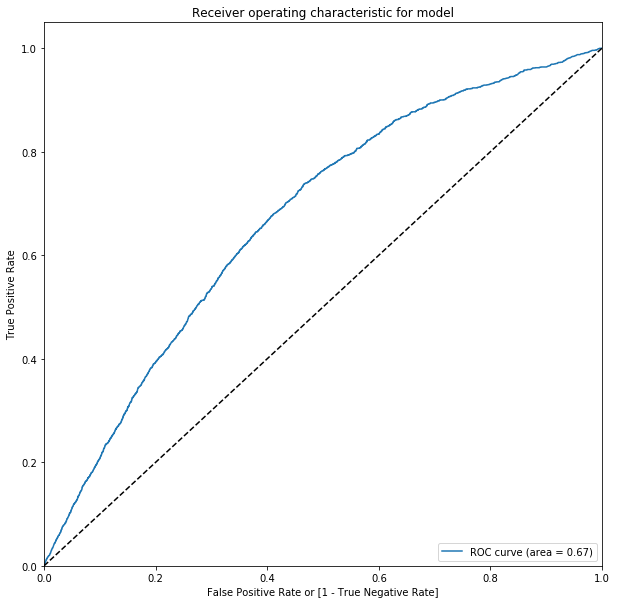

In [597]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Performance_Tag, y_train_pred_final.predicted, 
                                         drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

In [598]:
#finding the optimal probablity cut-off
 # Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Performance_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,26350,0.0,0.020030,0,1,0,0,0,0,0,0,0,0,0
1,69357,0.0,0.103168,0,1,1,0,0,0,0,0,0,0,0
2,36647,0.0,0.037260,0,1,0,0,0,0,0,0,0,0,0
3,19026,0.0,0.016008,0,1,0,0,0,0,0,0,0,0,0
4,32051,0.0,0.024109,0,1,0,0,0,0,0,0,0,0,0


In [599]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0  0.0   0.042034  1.000000  0.000000  0.042034 NaN      
0.1  0.1   0.951260  0.018969  0.992168  0.096059  0.958418
0.2  0.2   0.957966  0.000000  1.000000 NaN        0.957966
0.3  0.3   0.957966  0.000000  1.000000 NaN        0.957966
0.4  0.4   0.957966  0.000000  1.000000 NaN        0.957966
0.5  0.5   0.957966  0.000000  1.000000 NaN        0.957966
0.6  0.6   0.957966  0.000000  1.000000 NaN        0.957966
0.7  0.7   0.957966  0.000000  1.000000 NaN        0.957966
0.8  0.8   0.957966  0.000000  1.000000 NaN        0.957966
0.9  0.9   0.957966  0.000000  1.000000 NaN        0.957966


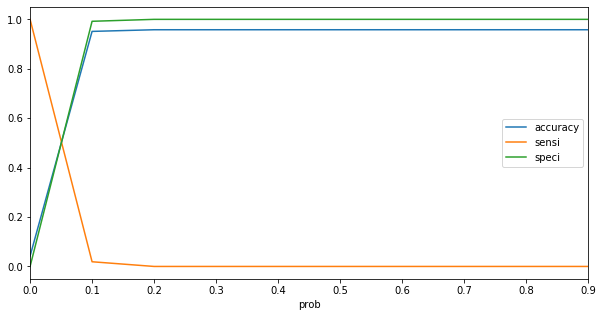

In [600]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [601]:
## making our final prediction on basis of optimal cut-off of 0.05
y_train_pred_final['final_predicted'] = y_train_pred_final.Performance_Prob.map( lambda x: 1 if x > 0.05 else 0)
y_train_pred_final.head()

,unique_id,Performance_Tag,Performance_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,26350,0.0,0.020030,0,1,0,0,0,0,0,0,0,0,0,0
1,69357,0.0,0.103168,0,1,1,0,0,0,0,0,0,0,0,1
2,36647,0.0,0.037260,0,1,0,0,0,0,0,0,0,0,0,0
3,19026,0.0,0.016008,0,1,0,0,0,0,0,0,0,0,0,0
4,32051,0.0,0.024109,0,1,0,0,0,0,0,0,0,0,0,0


In [602]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted )
confusion_matrix

array([[30524, 16333],
       [  812,  1244]], dtype=int64)

In [603]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_train_pred_final.Performance_Tag, 
                                                  y_train_pred_final.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_train_pred_final.Performance_Tag, 
                                                              y_train_pred_final.final_predicted, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob),2))

Accuracy: 	 0.65
Sensitivity: 	0.61
Specificity: 	0.65
AUC:    	 0.67


In [604]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_final.Performance_Tag, y_train_pred_final.final_predicted ))

precision :  0.07077430733344711
recall :  0.6050583657587548


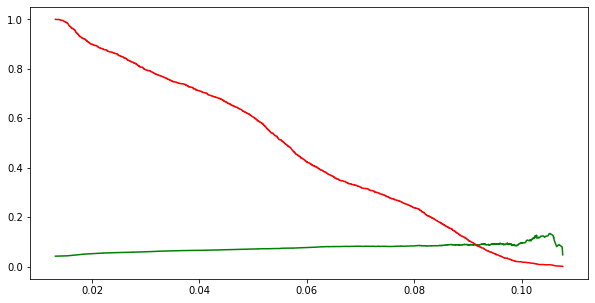

In [605]:
from sklearn.metrics import precision_recall_curve
## using precision_recall_curve from matrics
p, r, thresholds = precision_recall_curve(y_train_pred_final.Performance_Tag, y_train_pred_final.Performance_Prob)

## creating plot from the precision recall curve
plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Predicting on Test Set

In [606]:
## adding constant to the test dataset
X_test_sm = sm.add_constant(X_test[col])

## making prediction probabilities
y_test_pred = res.predict(X_test_sm)
## checking values
y_test_pred[:10]

35289    0.040493
15905    0.017000
28776    0.016922
14027    0.016243
11095    0.017200
30593    0.044173
17877    0.024887
44815    0.056774
50940    0.058418
568      0.016403
dtype: float64

In [607]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['unique_id'] = y_test_df.index+1

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_df.head()

,Performance_Tag,unique_id,0
35289,0.0,35290,0.040493
15905,0.0,15906,0.017000
28776,0.0,28777,0.016922
14027,0.0,14028,0.016243
11095,0.0,11096,0.017200


In [608]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob
35289,0.0,35290,0.040493
15905,0.0,15906,0.017000
28776,0.0,28777,0.016922
14027,0.0,14028,0.016243
11095,0.0,11096,0.017200


In [609]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)
y_pred_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
35289,0.0,35290,0.040493,0
15905,0.0,15906,0.017000,0
28776,0.0,28777,0.016922,0
14027,0.0,14028,0.016243,0
11095,0.0,11096,0.017200,0


In [610]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.Performance_Tag, y_pred_df.final_predicted )
confusion2

array([[12994,  7076],
       [  348,   545]], dtype=int64)

In [611]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_df.Performance_Tag, y_pred_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

print("AUC:    \t", round(roc_auc_score(y_pred_df.Performance_Tag, y_pred_df.Performance_Prob),2))

Accuracy: 	 0.65
Sensitivity: 	0.61
Specificity: 	0.65
AUC:    	 0.68


In [612]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_df.Performance_Tag, y_pred_df.final_predicted ))

precision :  0.07151292481301666
recall :  0.6103023516237402


### Prediction on Additional data (rejected applications)

In [613]:
# Merging both the data frame for nulls data
all_demographics_cb_nulls_data = pd.merge(demographics_nulls,CreditBureau_nulls, how='inner', on = "App_Id")
all_demographics_cb_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag_x,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan,Performance_Tag_y
0,906908303,35,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18,NaN,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0,NaN
1,10990583,47,F,Married,4.0,12.0,Masters,SE,Rented,122,25,NaN,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0,NaN
2,589678446,46,M,Married,3.0,7.0,Professional,SE,Rented,10,31,NaN,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0,NaN
3,809411322,41,M,Married,3.0,18.0,Masters,SAL,Rented,6,47,NaN,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0,NaN
4,150246616,42,F,Married,4.0,17.0,Phd,SAL,Rented,8,49,NaN,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1,NaN


In [614]:
## removing one of the Performance tag as it is redundent
all_demographics_cb_nulls_data = all_demographics_cb_nulls_data.drop(['Performance_Tag_x','Performance_Tag_y'],axis=1)

all_demographics_cb_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,906908303,35,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0
1,10990583,47,F,Married,4.0,12.0,Masters,SE,Rented,122,25,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0
2,589678446,46,M,Married,3.0,7.0,Professional,SE,Rented,10,31,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0
3,809411322,41,M,Married,3.0,18.0,Masters,SAL,Rented,6,47,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0
4,150246616,42,F,Married,4.0,17.0,Phd,SAL,Rented,8,49,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1


In [615]:
## creating WoE dataframe of combined performance null data
woe_all_nulls_data = create_woe_dataframe(all_demographics_cb_nulls_data,woe_all)
woe_all_nulls_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,906908303.0,0.047117,-0.009922,0.022652,0.039511,0.330435,0.016619,-0.028772,-0.004057,0.474406,0.054017,-0.260789,-0.336368,0.666075,0.508250,0.613362,0.798476,0.541648,4.0,0.491207,0.423042,0.242584,2.0,0.247532,0.0,0.283678,0.492334,0.012046
1,10990583.0,0.038430,0.031600,-0.003867,-0.026213,0.129160,0.007375,0.093815,-0.004057,-0.072814,0.054017,0.587100,0.541804,0.465239,0.884979,0.613362,0.593580,0.128748,3.0,0.533141,0.423042,0.499094,3.0,0.587388,0.0,0.384778,0.378451,0.012046
2,589678446.0,0.038430,-0.009922,-0.003867,0.053515,0.330435,-0.018719,0.093815,-0.004057,-0.253537,-0.064171,1.037275,0.866804,1.045606,0.884979,0.814011,0.798476,0.437024,2.0,0.533141,0.437862,0.499094,0.0,0.165679,0.0,0.388797,0.378451,0.012046
3,809411322.0,0.098265,-0.009922,-0.003867,0.053515,0.065560,0.007375,-0.028772,-0.004057,-0.253537,-0.145333,0.587100,0.933204,0.951215,0.884979,0.883958,0.798476,0.437024,2.0,0.533141,0.199923,0.499094,4.0,0.587388,0.0,0.384778,0.378451,0.012046
4,150246616.0,-0.040578,0.031600,-0.003867,-0.026213,0.065560,-0.019216,-0.028772,-0.004057,-0.253537,-0.145333,0.809601,0.667459,0.951215,0.884979,0.613362,0.798476,0.541648,3.0,0.533141,0.437862,0.413561,3.0,0.483318,0.0,0.384778,0.378451,-0.139116


In [616]:
## adding constant to the additional dataset
X_additional_sm = sm.add_constant(woe_all_nulls_data[col])

## making prediction probabilities
y_additional_pred = res.predict(X_additional_sm)
## checking values
y_additional_pred[:10]

0    0.099051
1    0.074386
2    0.094477
3    0.084182
4    0.088071
5    0.074316
6    0.087675
7    0.091847
8    0.106079
9    0.092567
dtype: float64

In [617]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_all_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,0.099051
1,1,2,0.074386
2,1,3,0.094477
3,1,4,0.084182
4,1,5,0.088071


In [618]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'Performance_Prob'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob
0,1,1,0.099051
1,1,2,0.074386
2,1,3,0.094477
3,1,4,0.084182
4,1,5,0.088071


In [619]:
## evaluating result based on the cut-off value obtained above
y_pred_additional_df['final_predicted'] = y_pred_additional_df.Performance_Prob.map(lambda x: 1 if x > 0.05 else 0)

y_pred_additional_df.head()

,Performance_Tag,unique_id,Performance_Prob,final_predicted
0,1,1,0.099051,1
1,1,2,0.074386,1
2,1,3,0.094477,1
3,1,4,0.084182,1
4,1,5,0.088071,1


In [620]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [  30, 1395]], dtype=int64)

In [621]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy: 	 0.98
Sensitivity: 	0.98
Specificity: 	0.0


In [622]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.9789473684210527


## 8.4.B) Decision Tree Model - WOE COMBINED DATASET

In [623]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [624]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.55      0.70     20070
         1.0       0.07      0.71      0.12       893

    accuracy                           0.55     20963
   macro avg       0.52      0.63      0.41     20963
weighted avg       0.94      0.55      0.68     20963



In [625]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10967  9103]
 [  257   636]]
accuracy 0.5534990220865335
precision 0.06530444604168806
recall 0.7122060470324748


In [626]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_train.columns)
features

['Age',
 'Gender',
 'Marital_Status',
 'Dependents_No',
 'Income',
 'Education',
 'Profession',
 'Residence_Type',
 'Months_Current_Residence',
 'Months_Current_Company',
 'No_90_DPD_last_6_months',
 'No_60_DPD_last_6_months',
 'No_30_DPD_last_6_months',
 'No_90_DPD_last_12_months',
 'No_60_DPD_last_12_months',
 'No_30_DPD_last_12_months',
 'Avgas_CC_Utilization_12_months',
 'Trades_opened_last_6_months',
 'Trades_opened_last_12_months',
 'PL_Trades_opened_last_6_months',
 'PL_Trades_opened_last_12_months',
 'Inquiries_last_6_months',
 'Inquiries_last_12_months',
 'Presence_open_home_loan',
 'Outstanding_Balance',
 'Total_Trades',
 'Presence_open_auto_loan']

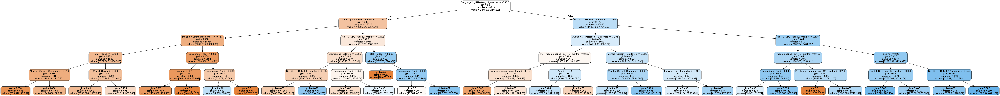

In [627]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(X_train.columns) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparametre Tunning

#### Tunning max_depth

In [628]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 101)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 195 out of 195 | elapsed:   46.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=101,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 40)},
             pre_dispatch='2*n_j

In [629]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.037915,0.001250,0.006598,0.000482,1,{'max_depth': 1},0.742243,0.733509,0.735981,0.735084,0.695864,0.728537,0.016603,1,0.725107,0.727490,0.726658,0.726940,0.736778,0.728595,0.004168
1,0.051682,0.000393,0.006403,0.000481,2,{'max_depth': 2},0.742243,0.733509,0.735981,0.735084,0.695864,0.728537,0.016603,1,0.725107,0.727490,0.726658,0.726940,0.736778,0.728595,0.004168
2,0.068431,0.002395,0.006981,0.000002,3,{'max_depth': 3},0.670644,0.633245,0.759346,0.663484,0.671533,0.679651,0.042222,4,0.658522,0.658318,0.753071,0.660354,0.724620,0.690977,0.040113
3,0.080811,0.000893,0.006605,0.000482,4,{'max_depth': 4},0.696897,0.670185,0.707944,0.701671,0.613139,0.677968,0.034877,6,0.702505,0.691115,0.692260,0.706781,0.674772,0.693487,0.011094
4,0.099737,0.001880,0.007204,0.000387,5,{'max_depth': 5},0.668258,0.641161,0.710280,0.744630,0.693431,0.691551,0.035365,3,0.720220,0.696482,0.719287,0.748931,0.765350,0.730054,0.024256


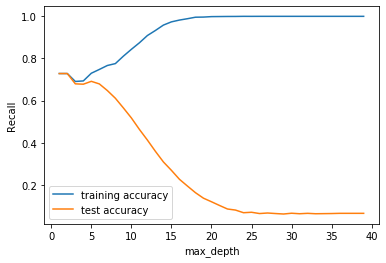

In [630]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning min_samples _leaf

In [631]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   10.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [632]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.218603,0.019781,0.008178,0.000398,5,{'min_samples_leaf': 5},0.157767,0.184915,0.172749,0.153285,0.158151,0.165373,0.011768,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.195692,0.004644,0.007579,0.000465,25,{'min_samples_leaf': 25},0.354369,0.360097,0.418491,0.379562,0.352798,0.373063,0.024634,9,0.911800,0.917325,0.916717,0.905167,0.899088,0.910020,0.006992
2,0.179758,0.003296,0.007802,0.000379,45,{'min_samples_leaf': 45},0.483010,0.462287,0.467153,0.467153,0.462287,0.468379,0.007633,8,0.887470,0.874164,0.877204,0.872948,0.871733,0.876704,0.005682
3,0.194690,0.013048,0.007980,0.000635,65,{'min_samples_leaf': 65},0.483010,0.496350,0.484185,0.523114,0.486618,0.494655,0.014984,7,0.817518,0.852280,0.829787,0.844377,0.824924,0.833777,0.012754
4,0.167371,0.001705,0.007593,0.000469,85,{'min_samples_leaf': 85},0.512136,0.527981,0.540146,0.498783,0.537713,0.523351,0.015742,6,0.805353,0.817629,0.810942,0.794529,0.807903,0.807271,0.007579


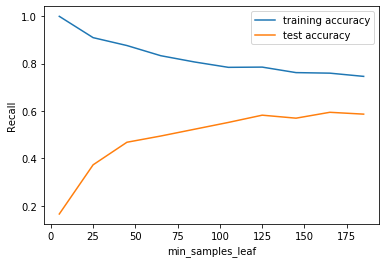

In [633]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning min_samples_split

In [634]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   11.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [635]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.228394,0.013297,0.007803,0.000394,5,{'min_samples_split': 5},0.082524,0.099757,0.075426,0.080292,0.065693,0.080739,0.011132,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,0.214440,0.005983,0.008182,0.000398,25,{'min_samples_split': 25},0.230583,0.238443,0.255474,0.204380,0.209246,0.227625,0.018865,9,0.996350,0.996960,0.998784,0.999392,0.998784,0.998054,0.001179
2,0.205849,0.006004,0.009176,0.002394,45,{'min_samples_split': 45},0.310680,0.311436,0.347932,0.306569,0.309002,0.317123,0.015494,8,0.975669,0.973860,0.979939,0.976292,0.972036,0.975559,0.002647
3,0.200472,0.005488,0.008776,0.001596,65,{'min_samples_split': 65},0.373786,0.372263,0.401460,0.374696,0.355231,0.375487,0.014824,7,0.953163,0.956231,0.955015,0.946505,0.945289,0.951241,0.004488
4,0.204852,0.005663,0.007979,0.000631,85,{'min_samples_split': 85},0.424757,0.420925,0.447689,0.406326,0.381995,0.416339,0.021699,6,0.936740,0.937386,0.925836,0.916109,0.922796,0.927773,0.008214


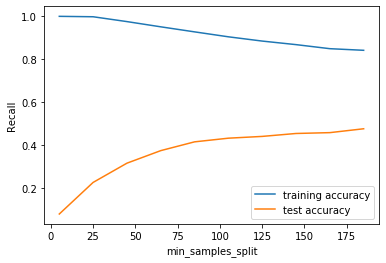

In [636]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Grid Search to Find Optimal Hyperparameters

In [637]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds,
                          return_train_score=True, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  3.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                

In [638]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.106907,0.006988,0.007189,0.000395,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.674757,0.715328,0.676399,0.637470,0.639903,0.668773,0.028547,25,0.710462,0.684498,0.720365,0.686930,0.693617,0.699175,0.013947
1,0.114694,0.013232,0.008777,0.002632,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.674757,0.715328,0.676399,0.637470,0.639903,0.668773,0.028547,25,0.710462,0.684498,0.720365,0.686930,0.693617,0.699175,0.013947
2,0.161640,0.018257,0.010014,0.001674,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 150}",0.674757,0.715328,0.676399,0.632603,0.639903,0.667799,0.029659,28,0.710462,0.684498,0.720365,0.683891,0.693617,0.698567,0.014522
3,0.161324,0.023564,0.010370,0.001499,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 200}",0.674757,0.715328,0.676399,0.632603,0.639903,0.667799,0.029659,28,0.710462,0.684498,0.720365,0.683891,0.693617,0.698567,0.014522
4,0.148461,0.006635,0.009277,0.001074,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.677184,0.708029,0.693431,0.644769,0.644769,0.673637,0.025510,17,0.712287,0.682067,0.737994,0.704559,0.693617,0.706105,0.018928


In [639]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.6838495630654005
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


In [640]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='entropy', 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=200,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=100, splitter='best')

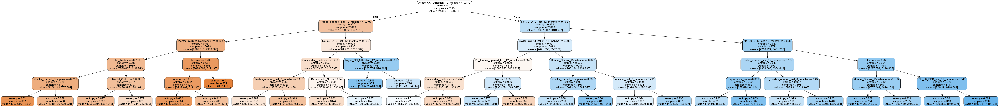

In [641]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=list(X_train.columns),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [642]:
## checking accuracy score
clf_entropy.score(X_test,y_test)

0.5387587654438774

In [643]:
## making predictions
y_pred = clf_entropy.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[10639  9431]
 [  238   655]]
accuracy 0.5387587654438774
precision 0.06494150307356732
recall 0.7334826427771557


### Prediction on Additional data (rejected applications)

In [644]:
## making prediction probabilities
y_additional_pred = clf_entropy.predict(woe_all_nulls_data.drop(['App_Id'],1))
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0


In [645]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_all_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [646]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [647]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [   3, 1422]], dtype=int64)

In [648]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')


Accuracy: 	 1.0
Sensitivity: 	1.0
Specificity: 	0.0


In [649]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.9978947368421053


## 8.4.C) Random Forest Model - WOE Combined Data

In [650]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [651]:
# Making predictions
predictions = rfc.predict(X_test)

In [652]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98     20070
         1.0       0.00      0.00      0.00       893

    accuracy                           0.96     20963
   macro avg       0.48      0.50      0.49     20963
weighted avg       0.92      0.96      0.94     20963



In [653]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[20070     0]
 [  893     0]]
accuracy 0.9574011353336832
precision 0.0
recall 0.0


### Tunning Hyperparametres


#### Tunning max_depth

In [654]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:   11.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [655]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.137662,0.002356,0.016541,0.000487,2,{'max_depth': 2},0.708738,0.717762,0.683698,0.734793,0.720195,0.713037,0.016888,1,0.704380,0.702128,0.713678,0.746505,0.732523,0.719842,0.017103
1,0.255338,0.005603,0.018520,0.001204,6,{'max_depth': 6},0.614078,0.666667,0.654501,0.635036,0.649635,0.643983,0.018065,2,0.680049,0.695441,0.727052,0.706383,0.711246,0.704034,0.015726
2,0.357928,0.010960,0.025116,0.002291,10,{'max_depth': 10},0.334951,0.304136,0.296837,0.255474,0.267640,0.291810,0.028082,3,0.693431,0.706991,0.725228,0.702736,0.733739,0.712425,0.014848
3,0.421818,0.008350,0.028651,0.002951,14,{'max_depth': 14},0.048544,0.058394,0.041363,0.036496,0.024331,0.041826,0.011440,4,0.769465,0.765957,0.755623,0.752584,0.772036,0.763133,0.007682
4,0.471288,0.009611,0.031362,0.001336,18,{'max_depth': 18},0.004854,0.004866,0.004866,0.007299,0.002433,0.004864,0.001539,5,0.777981,0.771429,0.792097,0.783587,0.792705,0.783560,0.008183


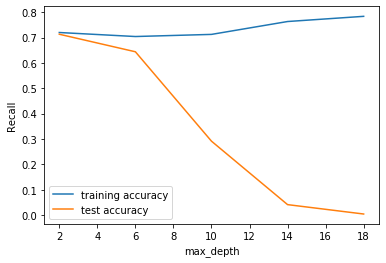

In [656]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning n_estimators

In [657]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  5.4min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [658]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.281646,0.027351,0.118182,0.003284,100,{'n_estimators': 100},0.628641,0.695864,0.639903,0.618005,0.659367,0.648356,0.027421,1,0.683090,0.702128,0.715502,0.715502,0.711854,0.705615,0.012280
1,10.702731,1.203628,0.543264,0.071061,500,{'n_estimators': 500},0.628641,0.678832,0.639903,0.625304,0.659367,0.646409,0.020113,3,0.690389,0.697872,0.718541,0.707599,0.712462,0.705373,0.010093
2,15.224126,0.150156,0.772704,0.021768,900,{'n_estimators': 900},0.631068,0.686131,0.639903,0.615572,0.659367,0.646408,0.024390,4,0.689781,0.700304,0.719149,0.708815,0.706383,0.704886,0.009698
3,24.180153,3.454750,1.265010,0.292031,1300,{'n_estimators': 1300},0.631068,0.678832,0.644769,0.622871,0.656934,0.646895,0.019763,2,0.684307,0.695441,0.716109,0.713678,0.707599,0.703427,0.011939


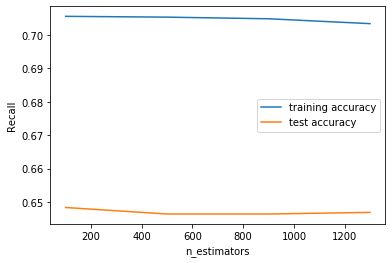

In [659]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning max_features

In [660]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24, 27]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   21.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [661]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.202659,0.056239,0.016356,0.001017,4,{'max_features': 4},0.633495,0.686131,0.613139,0.605839,0.635036,0.634729,0.028088,1,0.673966,0.683283,0.708207,0.676596,0.699088,0.688228,0.013268
1,0.261301,0.002891,0.015757,0.000399,8,{'max_features': 8},0.633495,0.678832,0.622871,0.591241,0.618005,0.628890,0.028592,2,0.704988,0.701520,0.722188,0.702736,0.699088,0.706104,0.008265
2,0.675195,0.058906,0.024934,0.005085,14,{'max_features': 14},0.623786,0.652068,0.627737,0.581509,0.605839,0.618189,0.023530,5,0.686740,0.700912,0.728267,0.722188,0.709422,0.709506,0.014866
3,0.790486,0.183620,0.027327,0.006811,20,{'max_features': 20},0.597087,0.632603,0.620438,0.625304,0.583942,0.611875,0.018343,6,0.694647,0.696657,0.724012,0.725836,0.703343,0.708899,0.013410
4,0.815420,0.254854,0.019747,0.006288,24,{'max_features': 24},0.652913,0.659367,0.620438,0.586375,0.603406,0.624502,0.028064,4,0.720803,0.695441,0.733131,0.708207,0.731307,0.717778,0.014272


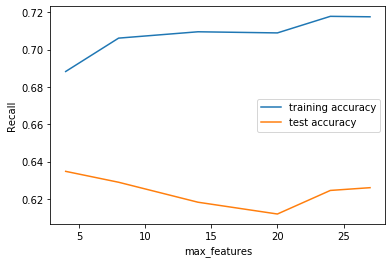

In [662]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning min_samples_leaf

In [663]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   13.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [664]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.259306,0.004548,0.019747,0.000746,100,{'min_samples_leaf': 100},0.550971,0.593674,0.562044,0.554745,0.571776,0.566642,0.015267,6,0.685523,0.706991,0.708815,0.695441,0.696657,0.698685,0.008479
1,0.399930,0.078972,0.030319,0.005733,150,{'min_samples_leaf': 150},0.645631,0.642336,0.622871,0.615572,0.659367,0.637156,0.015886,5,0.715328,0.686322,0.706991,0.711246,0.710638,0.706105,0.010239
2,0.317950,0.090042,0.024334,0.009965,200,{'min_samples_leaf': 200},0.631068,0.693431,0.622871,0.615572,0.666667,0.645922,0.029531,4,0.679440,0.708207,0.718541,0.710030,0.711246,0.705493,0.013491
3,0.245544,0.041398,0.018351,0.001353,250,{'min_samples_leaf': 250},0.677184,0.666667,0.630170,0.654501,0.671533,0.660012,0.016690,3,0.697689,0.688754,0.708207,0.703343,0.697264,0.699051,0.006532
4,0.323335,0.087344,0.026130,0.006805,300,{'min_samples_leaf': 300},0.686893,0.673966,0.644769,0.635036,0.666667,0.661468,0.019012,2,0.693431,0.702736,0.707599,0.713070,0.694225,0.702212,0.007591


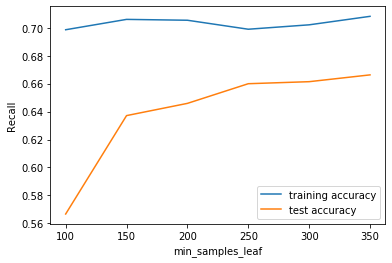

In [665]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tunning min_samples_split

In [666]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   12.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [667]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.317352,0.047552,0.021143,0.000399,200,{'min_samples_split': 200},0.470874,0.472019,0.459854,0.442822,0.442822,0.457679,0.012852,6,0.699513,0.710030,0.720973,0.720365,0.708207,0.711818,0.008056
1,0.306580,0.052972,0.022939,0.006495,250,{'min_samples_split': 250},0.500000,0.515815,0.489051,0.508516,0.501217,0.502920,0.008960,5,0.693431,0.682675,0.723404,0.729483,0.711854,0.708169,0.017704
2,0.324732,0.089872,0.018948,0.000630,300,{'min_samples_split': 300},0.495146,0.549878,0.537713,0.523114,0.535280,0.528225,0.018597,4,0.690389,0.700912,0.708815,0.712462,0.713678,0.705251,0.008665
3,0.310968,0.071885,0.022141,0.005441,350,{'min_samples_split': 350},0.575243,0.588808,0.547445,0.545012,0.564477,0.564198,0.016592,3,0.691606,0.682675,0.727660,0.718541,0.702128,0.704522,0.016624
4,0.344478,0.097234,0.030119,0.009882,400,{'min_samples_split': 400},0.560680,0.610706,0.547445,0.554745,0.596107,0.573937,0.024857,1,0.715328,0.698480,0.713070,0.696049,0.730699,0.710725,0.012578


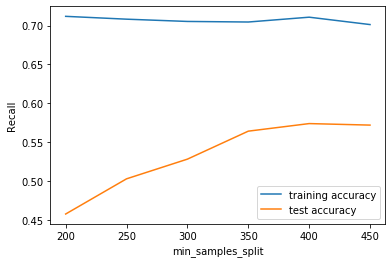

In [668]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

##### Grid Search to Find Optimal Hyperparameters

In [669]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [4,6,8],
    'min_samples_leaf': [300, 350], ##[250,300, 350]
    'min_samples_split': [400, 450], ##[350,400, 450]
    'n_estimators': [900,1000], ##[800,900,1000]
    'max_features': [10,14,18]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall",
                 return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 34.4min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 45.3min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [670]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.6994148471627537 using {'max_depth': 4, 'max_features': 18, 'min_samples_leaf': 350, 'min_samples_split': 450, 'n_estimators': 1000}


In [671]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=350, 
                             min_samples_split=400,
                             max_features=10,
                             n_estimators=900,class_weight='balanced')

In [672]:
# fit
rfc.fit(X_train,y_train)

# predict
predictions = rfc.predict(X_test)

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         0.0       0.98      0.57      0.72     20070
         1.0       0.07      0.71      0.12       893

    accuracy                           0.57     20963
   macro avg       0.52      0.64      0.42     20963
weighted avg       0.94      0.57      0.69     20963



In [673]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[11344  8726]
 [  260   633]]
accuracy 0.5713399799646998
precision 0.06763543113580511
recall 0.7088465845464725


### Prediction on Additional data (rejected application)

In [674]:
## making prediction probabilities
y_additional_pred = rfc.predict(woe_all_nulls_data.drop(['App_Id'],1))
## checking values
y_additional_pred = pd.DataFrame(y_additional_pred)
y_additional_pred.head()

,0
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0


In [675]:
# Making y dataframe as 1 as all these records are assumed to be defaulters 
y_additional_df = pd.DataFrame(pd.Series(np.ones(woe_all_nulls_data.shape[0], dtype = np.int)))
y_additional_df = y_additional_df.rename(columns={ 0 : 'Performance_Tag'})


y_additional_df['unique_id'] = y_additional_df.index+1

# Appending y_additional_df and y_additional_pred
y_pred_additional_df = pd.concat([y_additional_df, y_additional_pred],axis=1)
y_pred_additional_df.head()

,Performance_Tag,unique_id,0
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [676]:
# Renaming the column 
y_pred_additional_df= y_pred_additional_df.rename(columns={ 0 : 'final_predicted'})
y_pred_additional_df.head()

,Performance_Tag,unique_id,final_predicted
0,1,1,1.0
1,1,2,1.0
2,1,3,1.0
3,1,4,1.0
4,1,5,1.0


In [677]:
## creating confusion matrix for test data
confusion3 = metrics.confusion_matrix(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted )
confusion3

array([[   0,    0],
       [   2, 1423]], dtype=int64)

In [678]:
# Let's check the overall accuracy.
print("Accuracy: \t",round(metrics.accuracy_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ),2))

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted, 
                                                              average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')


Accuracy: 	 1.0
Sensitivity: 	1.0
Specificity: 	0.0


In [679]:
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_pred_additional_df.Performance_Tag, y_pred_additional_df.final_predicted ))

precision :  1.0
recall :  0.9985964912280701


# Summary

Below tables provides the results for different models:

|Dataset| Model Name | Accuracy Score on Test Data | Precision Score on Test Data| Recall Score on Test Data|  Precision Score on Additional Data | Recall Score on Additional Data|
|--- | --- | --- | --- | --- | --- | --- |
|Demographics Original| Logistic Regression Model with RFE |78% |5.46% |26% |100% |58% |
|Demographics Original| Decision Tree Model |56.34% |5.18% |54.13% |100% |51% |
|Demographics Original| Random Forest Model |61.85% |6.15% |56.51% |100% |30.38% |
|Demographics WoE| Logistic Regression Model with RFE |73% |6.32% |39.42% |100% |58.31% |
|Demographics WoE| Decision Tree Model |62.48% |5.80% |52.46% |100% |57.68% |
|Demographics WoE| Random Forest Model |62.86% |5.89% |52.80% |100% |73.75% |
|Demographics and CreditBureau Original| Logistic Regression Model with RFE |68% |7% |51% |100% |93.96% |
|Demographics and CreditBureau Original| Decision Tree Model |53.90% |6.52% |74.63% |100% |95.29% |
|Demographics and CreditBureau Original| Random Forest Model |57% |6.79% |72.36% |100% |99.92% |
|Demographics and CreditBureau WoE| Logistic Regression Model with RFE |65% |7.15% |61.03% |100% |97.89% |
|Demographics and CreditBureau WoE| Decision Tree Model |53.87% |6.49% |73.34% |100% |99.78% |
|Demographics and CreditBureau WoE| Random Forest Model |57.15% |6.74% |70.66% |100% |99.85% |

# 9.) Model Evaluation

### TOP 2 Models 

#### - 1.) Demographics and CreditBureau Original	(Random Forest)
#### - 2.) Demographics and CreditBureau WoE (Random Forest)

### Reasons they are top 2 models :
- Both the models have high test recall 72.36% and 70.66% respectively
- The models were able to reject almost all the manually rejected applications.( As high as 92%)
- Random Forest is an ensemble model which means the diversity is intact, as it incorporates various diverse models adding almost all available information.
- The model is very stable (especially the WOE one). The use of WoE values and multiple decision trees provide this stability. The WoE values are bound to show less variance making the model stable.
- The model did not overfit the data

# 10.) Application Scorecard

Build an application scorecard with the good to bad odds of 10 to 1 at a score of 400 doubling every 20 points.

#### -For the rejected population, calculate the application scores and assess the results. Compare the scores of the rejected population with the approved candidates and comment on the observations.

#### - On the basis of the scorecard, identify the cut-off score below which you would not grant credit cards to applicants.

## Note :- We will be using the logistic regression model (WOE combined dataset)

The scorecard in this case will be evaluated as :

**target_score = 400**

**target_odds = 10**

**pts_double_odds = 20**

**factor = pts_double_odds / log10(2)**

**offset = target_score - factor X log10(target_odds)**

Finally,

**scorecard['score'] = offset - factor X scorecard['logit']**

**Note:** The negative sign for the term of scorecard['logit'] is applied as model is evaluating probabilities ofodds of defaults (bad). However, we tend to provide a high score to the persons who are good. Therefore, the sign is negative.

In [680]:
## reading combined WoE data file
woe_all_data = pd.read_csv("woe_all_data.csv",sep=",")
woe_all_data.head()

,App_Id,Age,Gender,Marital_Status,Dependents_No,Income,Education,Profession,Residence_Type,Months_Current_Residence,Months_Current_Company,Performance_Tag,No_90_DPD_last_6_months,No_60_DPD_last_6_months,No_30_DPD_last_6_months,No_90_DPD_last_12_months,No_60_DPD_last_12_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_6_months,Trades_opened_last_12_months,PL_Trades_opened_last_6_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Presence_open_home_loan,Outstanding_Balance,Total_Trades,Presence_open_auto_loan
0,954457215.0,0.038430,0.031600,-0.003867,-0.085864,-0.205896,0.016619,-0.028772,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046
1,432830445.0,-0.030641,-0.009922,-0.003867,-0.026213,-0.331147,-0.018719,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.802205,-0.542664,-0.817152,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.817924,0.038894,0.012046
2,941387308.0,-0.030641,-0.009922,0.022652,-0.085864,-0.179334,0.016619,-0.013872,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.795097,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.873160,0.012046
3,392161677.0,-0.040578,-0.009922,-0.003867,0.039511,-0.331147,0.016619,0.093815,-0.004057,-0.072814,-0.292466,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.673300,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,0.203881,-0.448426,-0.139116
4,182011211.0,0.047117,0.031600,-0.003867,0.007785,-0.179334,-0.018719,-0.028772,-0.004057,-0.072814,-0.145333,0.0,-0.260789,-0.336368,-0.38674,-0.356647,-0.351837,-0.26902,-0.464817,-0.542664,-0.891073,-0.648455,-0.685755,-0.319027,-0.497666,0.001236,-0.983842,-0.448426,0.012046


In [683]:
## Since we are required to prepare the scorecord for all the applicants,
## preparing final model based on best score for Logistic Regression model
model_scorecard=LogisticRegression(C=0.01,penalty="l1",class_weight='balanced')
model_scorecard.fit(X_train,y_train)

LogisticRegression(C=0.01, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [684]:
## checking the coefficient
model_scorecard.coef_[0]

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.06484414,
        0.        ,  0.        ,  0.        , -0.01741342,  0.        ,
        0.        ,  0.        ,  0.21483572,  0.        ,  0.        ,
        0.19772809,  0.4609313 ,  0.        ,  0.24418822,  0.        ,
        0.00318123,  0.02282633,  0.07805269,  0.        ,  0.23394517,
        0.        ,  0.        ])

In [685]:
## checking the intercept
intercept = model_scorecard.intercept_[0]
intercept

0.0

In [686]:
## combining coefficients with their respective variable names
lr_woe_mod_params = pd.DataFrame({'cols':X_train.columns,'coeff':model_scorecard.coef_[0]})
lr_woe_mod_params_index = lr_woe_mod_params.set_index('cols')
lr_woe_mod_params_index

,coeff
cols,
Age,0.000000
Gender,0.000000
Marital_Status,0.000000
Dependents_No,0.000000
Income,0.064844
Education,0.000000
Profession,0.000000
Residence_Type,0.000000
Months_Current_Residence,-0.017413


In [687]:
## removing all the variables that have coefficients as zero
## these all have been nullified by lasso regularization
lr_woe_mod_params_index = lr_woe_mod_params_index[lr_woe_mod_params_index.coeff !=0]
lr_woe_mod_params_index

,coeff
cols,
Income,0.064844
Months_Current_Residence,-0.017413
No_30_DPD_last_6_months,0.214836
No_30_DPD_last_12_months,0.197728
Avgas_CC_Utilization_12_months,0.460931
Trades_opened_last_12_months,0.244188
PL_Trades_opened_last_12_months,0.003181
Inquiries_last_6_months,0.022826
Inquiries_last_12_months,0.078053


In [688]:
## Multiply linear regression coefficients to observation WOE Values
scorecard = woe_all_data[lr_woe_mod_params_index.index
                        ].apply(lambda x: x*lr_woe_mod_params_index['coeff'] ,axis=1)
scorecard.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance
0,-0.013351,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.230165
1,-0.021473,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.191349
2,-0.011629,0.001268,-0.083086,-0.053193,-0.366485,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165
3,-0.021473,0.001268,-0.083086,-0.053193,-0.310345,-0.217590,-0.002182,-0.007282,-0.038844,0.047697
4,-0.011629,0.001268,-0.083086,-0.053193,-0.214249,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165


In [689]:
## Get Logit Values 
scorecard['logit'] = scorecard.sum(axis=1) + intercept
scorecard.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance,logit
0,-0.013351,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.230165,-0.996135
1,-0.021473,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.191349,-0.965441
2,-0.011629,0.001268,-0.083086,-0.053193,-0.366485,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-1.009187
3,-0.021473,0.001268,-0.083086,-0.053193,-0.310345,-0.217590,-0.002182,-0.007282,-0.038844,0.047697,-0.685029
4,-0.011629,0.001268,-0.083086,-0.053193,-0.214249,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-0.856951


In [696]:
## Convert Logit to Odds Ratio and Odds Ratio to Probability
scorecard['odds'] = np.exp(-scorecard['logit'])
scorecard['probs'] = scorecard['odds'] / (scorecard['odds'] + 1)

In [697]:
## Setting up Logic for scoring
target_score = 400
target_odds = 10
pts_double_odds = 20

factor = pts_double_odds / np.log10(2)
offset = target_score - factor * np.log10(target_odds)
print("factor =",factor)
print("offset =",offset)

factor = 66.43856189774725
offset = 333.56143810225274


In [698]:
## Get Logit Values
scorecard['score'] = offset - factor * scorecard['logit']
scorecard.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance,logit,App_Id,Performance_Tag,odds,probs,score
0,-0.013351,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.230165,-0.996135,954457215.0,0.0,2.707796,0.730298,399.743212
1,-0.021473,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.191349,-0.965441,432830445.0,0.0,2.625945,0.724210,397.703940
2,-0.011629,0.001268,-0.083086,-0.053193,-0.366485,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-1.009187,941387308.0,0.0,2.743370,0.732861,400.610367
3,-0.021473,0.001268,-0.083086,-0.053193,-0.310345,-0.217590,-0.002182,-0.007282,-0.038844,0.047697,-0.685029,392161677.0,0.0,1.983829,0.664860,379.073764
4,-0.011629,0.001268,-0.083086,-0.053193,-0.214249,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-0.856951,182011211.0,0.0,2.355965,0.702023,390.496003


In [699]:
# Adding Back Application ID and Performance_Tag
scorecard['App_Id'] = woe_all_data['App_Id']
scorecard['Performance_Tag'] = woe_all_data['Performance_Tag']
scorecard.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance,logit,App_Id,Performance_Tag,odds,probs,score
0,-0.013351,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.230165,-0.996135,954457215.0,0.0,2.707796,0.730298,399.743212
1,-0.021473,0.001268,-0.083086,-0.053193,-0.369761,-0.199539,-0.002182,-0.007282,-0.038844,-0.191349,-0.965441,432830445.0,0.0,2.625945,0.724210,397.703940
2,-0.011629,0.001268,-0.083086,-0.053193,-0.366485,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-1.009187,941387308.0,0.0,2.743370,0.732861,400.610367
3,-0.021473,0.001268,-0.083086,-0.053193,-0.310345,-0.217590,-0.002182,-0.007282,-0.038844,0.047697,-0.685029,392161677.0,0.0,1.983829,0.664860,379.073764
4,-0.011629,0.001268,-0.083086,-0.053193,-0.214249,-0.217590,-0.002182,-0.007282,-0.038844,-0.230165,-0.856951,182011211.0,0.0,2.355965,0.702023,390.496003


In [700]:
## checking data across all with values in performance tag
print(scorecard.score.min())
print(scorecard.score.max())
print(scorecard.score.mean())
print(scorecard.score.median())

271.4657770319094
402.1151603918371
345.43109950074427
348.748585301001


In [701]:
## checking data for the defaulters
print(scorecard[scorecard.Performance_Tag==1].score.min())
print(scorecard[scorecard.Performance_Tag==1].score.max())
print(scorecard[scorecard.Performance_Tag==1].score.mean())
print(scorecard[scorecard.Performance_Tag==1].score.median())

272.85743196855924
401.702344910435
321.24256306165927
313.8725323625064


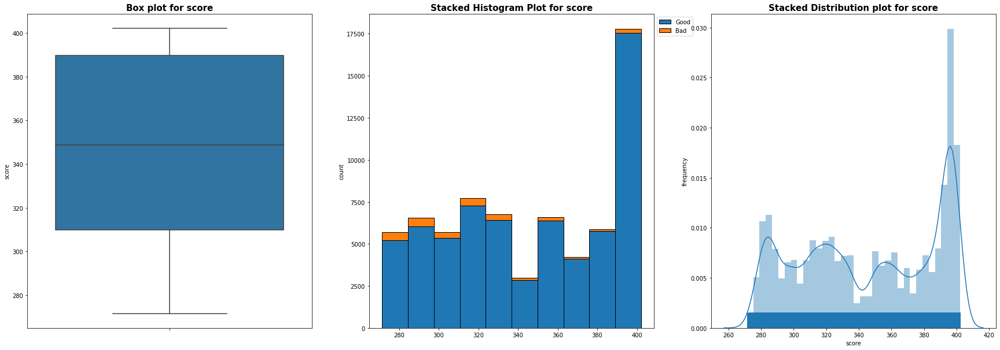

In [702]:
## plotting  for all cases with non null perfomance tag
plt.figure(figsize=(30,10))
    
plt.subplot(1, 3, 1)
plt.title('Box plot for score', fontweight='bold', fontsize = 15)
sns.boxplot(y='score', data=scorecard)

good_list = list(scorecard[scorecard.Performance_Tag == 0]['score'])
bad_list = list(scorecard[scorecard.Performance_Tag == 1]['score'])
plt.subplot(1, 3, 2)
plt.title('Stacked Histogram Plot for score', fontweight='bold', fontsize = 15)
plt.ylabel('count')
plt.hist([good_list,bad_list], stacked=True,edgecolor = 'black' , label=['Good','Bad'])
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)

plt.subplot(1, 3, 3)
plt.title('Stacked Distribution plot for score', fontweight='bold', fontsize = 15)
sns.distplot(scorecard['score'],rug=True)
plt.ylabel('frequency')
plt.show()

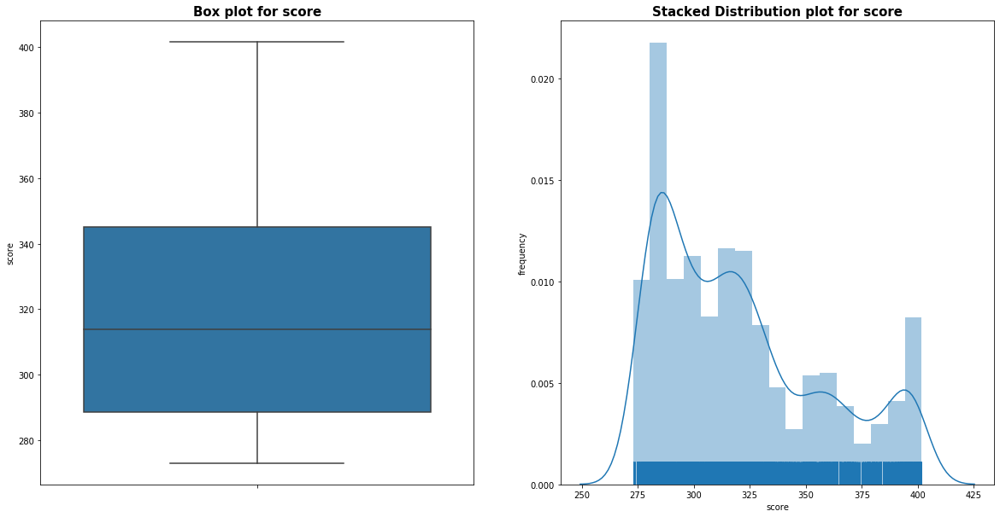

In [703]:
## plotting  for dafault cases
plt.figure(figsize=(20,10))

scorecard_defaulters = scorecard[scorecard.Performance_Tag==1]

plt.subplot(1, 2, 1)
plt.title('Box plot for score', fontweight='bold', fontsize = 15)
sns.boxplot(y='score', data=scorecard_defaulters)

plt.subplot(1, 2, 2)
plt.title('Stacked Distribution plot for score', fontweight='bold', fontsize = 15)
sns.distplot(scorecard_defaulters['score'],rug=True)
plt.ylabel('frequency')
plt.show()

### - We see that the defaulters spike at around score of 260 - 340 quite obviously in comparison with the higher score of 340+

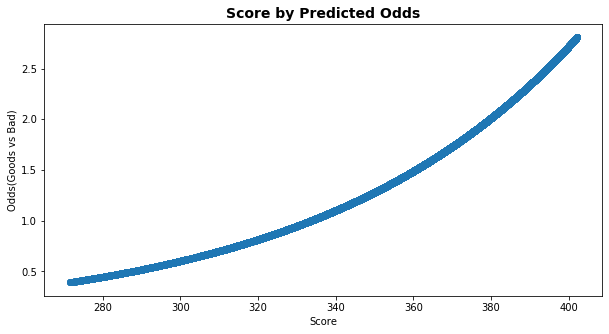

In [704]:
# Plot Scores Against Predicted Odds (Exponential Relationship)
plt.figure(figsize=(10,5))

plt.scatter(x='score',
            y='odds',
            data=scorecard)

plt.title('Score by Predicted Odds', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Odds(Goods vs Bad)');

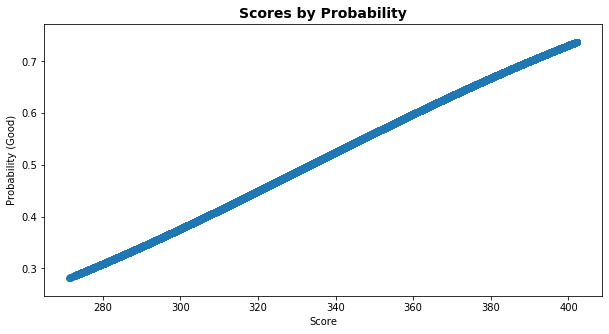

In [705]:
# Plot Scores Against Probabilities
plt.figure(figsize=(10,5))

plt.scatter(x='score',
            y='probs',
            data=scorecard)

plt.title('Scores by Probability', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Probability (Good)');

The above two plots show that the probability of good customers increase as the score increases.

### Evaluating scorecards for rejected population

In [707]:
# Multiply lr coefficients to observation WOE Values
scorecard_nulls = woe_all_nulls_data[lr_woe_mod_params_index.index
                                    ].apply(lambda x: x*lr_woe_mod_params_index['coeff'],axis=1)
scorecard_nulls.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance
0,0.021427,-0.008261,0.143097,0.157881,0.249663,0.119947,0.000772,0.045653,0.019320,0.066365
1,0.008375,0.001268,0.099950,0.117367,0.059344,0.130187,0.001588,0.068479,0.045847,0.090017
2,0.021427,0.004415,0.224634,0.157881,0.201438,0.130187,0.001588,0.000000,0.012932,0.090957
3,0.004251,0.004415,0.204355,0.157881,0.201438,0.130187,0.001588,0.091305,0.045847,0.090017
4,0.004251,0.004415,0.204355,0.157881,0.249663,0.130187,0.001316,0.068479,0.037724,0.090017


In [708]:
# Get Logit Values
scorecard_nulls['logit'] = scorecard_nulls[list(scorecard_nulls.columns)].sum(axis=1) + intercept

In [709]:
## Convert Logit to Odds Ratio and Odds Ratio to Probability
scorecard_nulls['odds'] = np.exp(-scorecard_nulls['logit'])
scorecard_nulls['probs'] = scorecard_nulls['odds'] / (scorecard_nulls['odds'] + 1)

In [710]:
# Score
scorecard_nulls['score'] = offset - (factor * scorecard_nulls['logit'])

In [711]:
# Add Back Customer ID and Performance_Tag
scorecard_nulls['App_Id'] = woe_all_nulls_data['App_Id']
scorecard_nulls.head()

,Income,Months_Current_Residence,No_30_DPD_last_6_months,No_30_DPD_last_12_months,Avgas_CC_Utilization_12_months,Trades_opened_last_12_months,PL_Trades_opened_last_12_months,Inquiries_last_6_months,Inquiries_last_12_months,Outstanding_Balance,logit,odds,probs,score,App_Id
0,0.021427,-0.008261,0.143097,0.157881,0.249663,0.119947,0.000772,0.045653,0.019320,0.066365,0.815863,0.442257,0.306642,279.356661,906908303.0
1,0.008375,0.001268,0.099950,0.117367,0.059344,0.130187,0.001588,0.068479,0.045847,0.090017,0.622422,0.536643,0.349231,292.208599,10990583.0
2,0.021427,0.004415,0.224634,0.157881,0.201438,0.130187,0.001588,0.000000,0.012932,0.090957,0.845457,0.429361,0.300387,277.390460,589678446.0
3,0.004251,0.004415,0.204355,0.157881,0.201438,0.130187,0.001588,0.091305,0.045847,0.090017,0.931284,0.394047,0.282664,271.688265,809411322.0
4,0.004251,0.004415,0.204355,0.157881,0.249663,0.130187,0.001316,0.068479,0.037724,0.090017,0.948287,0.387404,0.279229,270.558591,150246616.0


In [712]:
## checking distribution of scores
print(scorecard_nulls.score.min())
print(scorecard_nulls.score.max())
print(scorecard_nulls.score.mean())
print(scorecard_nulls.score.median())

267.23181442514016
343.4753251424553
283.8187922053876
280.43145221744453


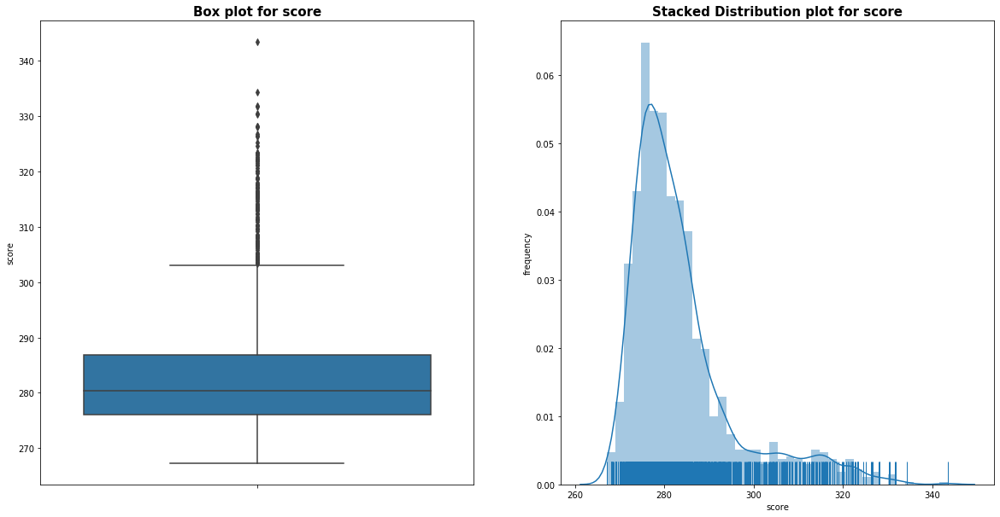

In [713]:
plt.figure(figsize=(20,10))

plt.subplot(1, 2, 1)
plt.title('Box plot for score', fontweight='bold', fontsize = 15)
sns.boxplot(y='score', data=scorecard_nulls)
    
plt.subplot(1, 2, 2)
plt.title('Stacked Distribution plot for score', fontweight='bold', fontsize = 15)
sns.distplot(scorecard_nulls['score'],rug=True)
plt.ylabel('frequency')
plt.show()

## INTRESTINGLY :-  Majority of the rejected population falls at around the score of 270-330. Which explains the reason why they were rejected.

# Determining the scorecard cut-off

### Cut-Off : 330

### Reason for Choosing this Cut-Off : 
- Our Strategy :-Acquiring the right customers.( A bit on the conservative side owing to our previous losses)
- It caters to almost all the rejected populatiom
- A higher cut-off will impact the business of the bank.
- A little less cut-off would dilute the purpose of the mode.


# 11.) Benefits of our ML model

- Our objective is to minimize “Net Credit Loss’’ from Profit & Loss perspective.
- With ML model we get good discriminatory power in terms of pre-identifying risky costumers.
- Any kind of bias can be easily removed which might be due to person'sex, race or religion.
- Scorecard and cut-off provides clear instructions as what proceeds with application. Decision making is also fast.
- Reduces the cost spent on Underwriters which rejects the application by reviewing manually.
- Prevents manual error made by Underwriters.


# 12.) Evaluating Financial Risk in our Operations 
#### Total number of applications 		= 71295
#### Credit Card given to applicants 	= 69870
#### Customers that made Credit Loss 	= 2948
#### Assumptions on unit Applications : 
- Acquisition Cost + Credit Report Cost –100 INR
- Calling Cost – 10 calls avg × 10p = 1 INR
- Operations {Agents + Infra + Others) = 1000 INR approx.
- Credit Default = Rs 48,000 average

#### For every customer defaulted we are at a risk of loosing 50,000 INR (48k + 2k) on an average (assuming 50K is average credit line used by defaulter)

#### Total Credit Loss for all customers	= 50000 × 2948 = 150 Million INR (approx.)

# Financial Benefit of our ML Model

- The model giving a recall of 70% which means it is preventing 70% of losses.
	
	Potential Loss prevented with using model 	= 0.7 × 150 Million INR
							  	= 105 Million INR
	Loss after prevention				= 150 – 105 Million INR
								= 45 Million INR
 The Credit loss after applying the model has slashed to 30% compared to the Original Credit loss, which did not include using any model.


- **Important Note** : There will be a tradeoff between the increase in approval rate and credit loss – increase of one will lead to increase of other. With this model the approval rate is bound to be less business to the bank and so will be the profits of the bank. However, profits are very small in margins (5-7%) as compare to the Principal amount in Credit Line. Hence percentage would be very small overall the Credit Line amount.



## THANKS
## - Anmol Goel
## - Sarthak Bhatnagar